####Comparative Evaluation of Physics-Based and Machine-Learning Models for Multiaxial Fatigue Life Prediction of S355 Steel

####Brief description

This code implements and evaluates a mechanics-constrained extension of the Classical Sines equivalent-stress descriptor for proportional axial–torsional fatigue-life prediction. The workflow processes fatigue datasets for S355 steel, 7075-T651 aluminum alloy, 18Ni300 maraging steel, and CuZn37 brass, classifies loading regimes, and compares the proposed Modified Sines formulation with Classical Sines, von Mises, Dang Van, and Fatemi–Socie reference descriptors. Model parameters are calibrated in (log10(N)) space and evaluated using (R2), MAE, and RMSE under five-fold regime-stratified cross-validation. The code also generates pooled out-of-fold predictions, regime-wise performance summaries, specimen-level comparisons, and supplementary interpretability analyses, with results exported for further reporting and reproducibility.

In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel


# ============================================================
# USER SETTINGS
# ============================================================
INPUT_FILE = "/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx"
OUTPUT_FILE = "FatigueDataS355_cleaned_133.xlsx"

# Yield strength used in the Fatemi–Socie proxy
SIGMA_Y = 355.0  # MPa


# ============================================================
# DATA LOADING
# ============================================================
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive
drive.mount('/content/gdrive', force_remount=True)

# Define file path
path = "/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx"

# Read the Excel file
data = pd.read_excel(path)

# Print actual column names to verify
print("Actual column names in the Excel file:", data.columns)

def load_clean_dataset(filepath: str) -> pd.DataFrame:
    """
    Load the Excel file and keep only numeric fatigue-test rows.
    Expected columns:
        Sm, Tm, Sa, Ta, Nexp
    """
    df = pd.read_excel(filepath)

    required = ["Sm", "Tm", "Sa", "Ta", "Nexp"]
    missing = [c for c in required if c not in df.columns]
    if missing:
        raise ValueError(f"Missing required columns: {missing}")

    df = df[pd.to_numeric(df["Nexp"], errors="coerce").notnull()].copy()
    df = df[required].astype(float).reset_index(drop=True)
    df["ID"] = np.arange(1, len(df) + 1)
    df["log10_Nexp"] = np.log10(df["Nexp"])
    return df


# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sm, Tm, Sa, Ta = row["Sm"], row["Tm"], row["Sa"], row["Ta"]

    if Sa > 0 and Sm == 0 and Tm == 0 and Ta == 0:
        return "Regime A – Pure axial, fully reversed"

    if Ta > 0 and Sm == 0 and Tm == 0 and Sa == 0:
        return "Regime B – Pure torsion, fully reversed"

    if Sa > 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Regime C – Proportional axial–torsion, fully reversed"

    if Ta > 0 and Tm > 0 and Sm == 0 and Sa == 0:
        return "Regime D – Torsion with non-zero mean shear"

    if Sm > 0 and Sa > 0 and Tm > 0 and Ta > 0:
        return "Regime E – Combined axial–torsion with mean stresses"

    return "Other"


# ============================================================
# GENERIC BASQUIN FITTER
# ============================================================
def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray) -> dict | None:
    """
    Fit:
        y = A + B*log10(phi)
    Return fitted coefficients and metrics.
    """
    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    resid = y - yhat

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - np.sum(resid ** 2) / np.sum((y - y.mean()) ** 2))

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def optimize_descriptor(builder, y: np.ndarray, x0: list[float], bounds: list[tuple[float, float]]) -> tuple[np.ndarray, np.ndarray, dict]:
    """
    Optimize descriptor parameters by minimizing RMSE in log10(N) space.
    """
    def objective(params):
        phi = builder(params)
        fit = fit_basquin_from_phi(phi, y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(objective, x0=np.array(x0, dtype=float), bounds=bounds, method="L-BFGS-B")
    params = res.x
    phi = builder(params)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Optimization failed: invalid descriptor values.")

    return params, phi, fit


# ============================================================
# MODEL DEFINITIONS
# ============================================================
def run_classical_sines(Sa, Ta, Sm, y):
    """
    Classical Sines:
        phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3)
    """
    base = np.sqrt(Sa ** 2 / 3.0 + Ta ** 2)

    def build(params):
        alpha = params[0]
        return base + alpha * (Sm / 3.0)

    params, phi, fit = optimize_descriptor(build, y, x0=[0.8], bounds=[(-5, 5)])
    return {
        "name": "Classical Sines",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_modified_sines(Sa, Ta, Sm, Tm, y):
    """
    Modified Sines:
        phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3) + beta*Tm + gamma*|Sa*Ta|/(Sa+Ta)
    """
    base = np.sqrt(Sa ** 2 / 3.0 + Ta ** 2)
    interaction = np.abs(Sa * Ta) / (Sa + Ta + 1e-9)

    def build(params):
        alpha, beta, gamma = params
        return base + alpha * (Sm / 3.0) + beta * Tm + gamma * interaction

    params, phi, fit = optimize_descriptor(build, y, x0=[0.4, 0.1, 0.1], bounds=[(-5, 5), (-5, 5), (-5, 5)])
    return {
        "name": "Modified Sines",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3) + beta*Tm + gamma*|Sa*Ta|/(Sa+Ta)",
        "alpha": float(params[0]),
        "beta": float(params[1]),
        "gamma": float(params[2]),
        "phi": phi,
        **fit,
    }


def run_von_mises(Sa, Ta, y):
    """
    von Mises equivalent amplitude:
        phi = sqrt(Sa^2 + 3*Ta^2)
    """
    phi = np.sqrt(Sa ** 2 + 3.0 * Ta ** 2)
    fit = fit_basquin_from_phi(phi, y)
    if fit is None:
        raise RuntimeError("von Mises fit failed.")
    return {
        "name": "von Mises",
        "formula": "phi = sqrt(Sa^2 + 3*Ta^2)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_dang_van_proxy(Sa, Ta, Sm, y):
    """
    Dang Van proxy used here:
        phi = sqrt(Sa^2/3 + Ta^2) + a*((Sm + Sa)/3)

    Note:
        This is a simplified proxy, not a full canonical Dang Van implementation.
    """
    base = np.sqrt(Sa ** 2 / 3.0 + Ta ** 2)
    hydro_max_proxy = (Sm + Sa) / 3.0

    def build(params):
        a = params[0]
        return base + a * hydro_max_proxy

    params, phi, fit = optimize_descriptor(build, y, x0=[0.2], bounds=[(-5, 5)])
    return {
        "name": "Dang Van (proxy)",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + a*((Sm + Sa)/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=355.0):
    """
    Fatemi–Socie proxy:
        phi_FS = max_theta [ tau_a(theta) * (1 + k*sigma_n,max(theta)/sigma_y) ]

    Note:
        This is a stress-based proxy version adapted to available inputs.
    """
    thetas = np.linspace(0, np.pi, 721)
    c2 = np.cos(2 * thetas)[None, :]
    s2 = np.sin(2 * thetas)[None, :]

    def fs_phi(k):
        # Approximate normal stress on plane
        sigma_n_mean = Sm[:, None] / 2.0 + Sm[:, None] / 2.0 * c2 + Tm[:, None] * s2
        sigma_n_amp = np.abs(Sa[:, None] / 2.0 + Sa[:, None] / 2.0 * c2 + Ta[:, None] * s2)
        sigma_n_max = sigma_n_mean + sigma_n_amp

        # Approximate shear amplitude on plane
        tau_amp = np.abs(-Sa[:, None] / 2.0 * s2 + Ta[:, None] * c2)

        P = tau_amp * (1.0 + k * sigma_n_max / sigma_y)
        return P.max(axis=1)

    def objective(params):
        k = params[0]
        fit = fit_basquin_from_phi(fs_phi(k), y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(objective, x0=np.array([0.4]), bounds=[(0, 10)], method="L-BFGS-B")
    k = float(res.x[0])
    phi = fs_phi(k)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Fatemi–Socie proxy fit failed.")

    return {
        "name": "Fatemi–Socie (proxy)",
        "formula": "phi = max_theta[tau_a(theta)*(1 + k*sigma_n,max(theta)/sigma_y)]",
        "alpha": k,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_gpr(df: pd.DataFrame):
    """
    Standalone GPR on [Sm, Tm, Sa, Ta].
    """
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline(
        [
            ("scaler", StandardScaler()),
            ("gpr", GaussianProcessRegressor(kernel=kernel, normalize_y=True, n_restarts_optimizer=3, random_state=42)),
        ]
    )

    model.fit(X, y)
    yhat = model.predict(X)
    resid = y - yhat
    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - np.sum(resid ** 2) / np.sum((y - y.mean()) ** 2))

    return {
        "name": "GPR (in-sample)",
        "formula": "GPR on [Sm, Tm, Sa, Ta]",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def run_hybrid_residual(df: pd.DataFrame, sines_model: dict):
    """
    Hybrid-Residual:
        y_hybrid = y_sines + GPR(residual_sines)
    """
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)
    resid_target = sines_model["resid"]

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline(
        [
            ("scaler", StandardScaler()),
            ("gpr", GaussianProcessRegressor(kernel=kernel, normalize_y=True, n_restarts_optimizer=3, random_state=42)),
        ]
    )

    model.fit(X, resid_target)
    resid_corr = model.predict(X)
    yhat = sines_model["yhat"] + resid_corr
    resid = y - yhat

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - np.sum(resid ** 2) / np.sum((y - y.mean()) ** 2))

    return {
        "name": "Hybrid-Residual (in-sample)",
        "formula": "y_hybrid = y_sines + GPR(residual_sines)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


# ============================================================
# MAIN EXECUTION
# ============================================================
def main():
    if not Path(INPUT_FILE).exists():
        raise FileNotFoundError(f"Input file not found: {INPUT_FILE}")

    df = load_clean_dataset(INPUT_FILE)
    df["Regime"] = df.apply(classify_regime, axis=1)

    y = df["log10_Nexp"].values
    Sa = df["Sa"].values
    Ta = df["Ta"].values
    Sm = df["Sm"].values
    Tm = df["Tm"].values

    # Run analytical models
    model_sines = run_classical_sines(Sa, Ta, Sm, y)
    model_mod = run_modified_sines(Sa, Ta, Sm, Tm, y)
    model_vm = run_von_mises(Sa, Ta, y)
    model_dv = run_dang_van_proxy(Sa, Ta, Sm, y)
    model_fs = run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=SIGMA_Y)

    # Run ML models
    model_gpr = run_gpr(df)
    model_hybrid = run_hybrid_residual(df, model_sines)

    models = [model_mod, model_sines, model_dv, model_vm, model_fs, model_gpr, model_hybrid]

    # Summary table
    summary_rows = []
    for m in models:
        summary_rows.append(
            {
                "Model": m["name"],
                "Formula": m["formula"],
                "alpha": m["alpha"],
                "beta": m["beta"],
                "gamma": m["gamma"],
                "A": m["A"],
                "B": m["B"],
                "R2": m["r2"],
                "MAE_log10N": m["mae"],
                "RMSE_log10N": m["rmse"],
            }
        )
    summary = pd.DataFrame(summary_rows).sort_values("R2", ascending=False).reset_index(drop=True)

    # Specimen-by-specimen output
    out = df.copy()

    for m in models:
        safe = (
            m["name"]
            .replace(" ", "_")
            .replace("–", "_")
            .replace("-", "_")
            .replace("(", "")
            .replace(")", "")
        )

        if isinstance(m["phi"], np.ndarray):
            out[f"phi_{safe}"] = m["phi"]
        else:
            out[f"phi_{safe}"] = np.nan

        out[f"y_pred_{safe}"] = m["yhat"]
        out[f"N_pred_{safe}"] = 10 ** m["yhat"]
        out[f"residual_{safe}"] = m["resid"]
        out[f"abs_err_{safe}"] = np.abs(m["resid"])

    # Specimen-level comparison counts versus Modified Sines
    modified_col = "abs_err_Modified_Sines"
    counts_rows = []
    for m in models:
        safe = (
            m["name"]
            .replace(" ", "_")
            .replace("–", "_")
            .replace("-", "_")
            .replace("(", "")
            .replace(")", "")
        )
        other_col = f"abs_err_{safe}"
        if other_col == modified_col:
            continue

        better = int((out[modified_col] < out[other_col]).sum())
        equal = int((out[modified_col] == out[other_col]).sum())
        worse = len(out) - better - equal

        counts_rows.append(
            {
                "Modified Sines vs": m["name"],
                "Better specimens": better,
                "Equal specimens": equal,
                "Worse specimens": worse,
                "Better %": 100.0 * better / len(out),
            }
        )

    counts = pd.DataFrame(counts_rows)

    # Regime-wise average errors
    regime_cols = ["ID", "Regime", "Nexp", "log10_Nexp"]
    regime_out = out[regime_cols].copy()

    for m in models:
        safe = (
            m["name"]
            .replace(" ", "_")
            .replace("–", "_")
            .replace("-", "_")
            .replace("(", "")
            .replace(")", "")
        )
        regime_out[f"abs_err_{safe}"] = out[f"abs_err_{safe}"]

    regime_summary = regime_out.groupby("Regime").mean(numeric_only=True).reset_index()

    # Export
    with pd.ExcelWriter(OUTPUT_FILE, engine="openpyxl") as writer:
        summary.to_excel(writer, sheet_name="Summary", index=False)
        counts.to_excel(writer, sheet_name="Modified_vs_Others", index=False)
        regime_summary.to_excel(writer, sheet_name="Regime_mean_errors", index=False)
        out.to_excel(writer, sheet_name="All_specimens", index=False)

    # Print concise console summary
    print("\n=== MODEL SUMMARY ===")
    print(summary[["Model", "R2", "MAE_log10N", "RMSE_log10N"]].to_string(index=False))

    print(f"\nResults exported to: {OUTPUT_FILE}")


if __name__ == "__main__":
    main()

Mounted at /content/gdrive
Actual column names in the Excel file: Index(['Sm', 'Tm', 'Sa', 'Ta', 'Nexp', 'crack', 'Unnamed: 6', 'Unnamed: 7',
       'Unnamed: 8', 'Legend', 'Unnamed: 10'],
      dtype='object')

=== MODEL SUMMARY ===
                      Model       R2  MAE_log10N  RMSE_log10N
Hybrid-Residual (in-sample) 0.954723    0.099321     0.126255
            GPR (in-sample) 0.922206    0.131855     0.165493
             Modified Sines 0.862448    0.178885     0.220059
            Classical Sines 0.823679    0.204624     0.249148
       Fatemi–Socie (proxy) 0.751147    0.242124     0.295990
           Dang Van (proxy) 0.721141    0.250254     0.313328
                  von Mises 0.622312    0.295850     0.364648

Results exported to: FatigueDataS355_cleaned_133.xlsx


In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel

# ============================================================
# USER SETTINGS
# ============================================================
# For Colab + Google Drive:
USE_COLAB_DRIVE = True
INPUT_FILE = "/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx"

# For local use, set:
# USE_COLAB_DRIVE = False
# INPUT_FILE = r"/path/to/FatigueDataS355.xlsx"

OUTPUT_FILE = "Fatigue_models_all_results_modified_sines.xlsx"

# Yield strength used in the Fatemi–Socie proxy
SIGMA_Y = 355.0  # MPa

# Small value for numerical stability in interaction term
EPSILON = 1e-9


# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=True)
    except Exception as e:
        print(f"Warning: Google Drive mount skipped or failed: {e}")


# ============================================================
# DATA LOADING
# ============================================================
def load_clean_dataset(filepath: str) -> pd.DataFrame:
    """
    Load the Excel file and keep only numeric fatigue-test rows.

    Expected columns:
        Sm, Tm, Sa, Ta, Nexp
    """
    df = pd.read_excel(filepath)

    required = ["Sm", "Tm", "Sa", "Ta", "Nexp"]
    missing = [c for c in required if c not in df.columns]
    if missing:
        raise ValueError(f"Missing required columns: {missing}")

    df = df[pd.to_numeric(df["Nexp"], errors="coerce").notnull()].copy()
    df = df[required].astype(float).reset_index(drop=True)
    df["ID"] = np.arange(1, len(df) + 1)
    df["log10_Nexp"] = np.log10(df["Nexp"])
    return df


# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sm, Tm, Sa, Ta = row["Sm"], row["Tm"], row["Sa"], row["Ta"]

    if Sa > 0 and Sm == 0 and Tm == 0 and Ta == 0:
        return "Regime A – Pure axial, fully reversed"

    if Ta > 0 and Sm == 0 and Tm == 0 and Sa == 0:
        return "Regime B – Pure torsion, fully reversed"

    if Sa > 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Regime C – Proportional axial–torsion, fully reversed"

    if Ta > 0 and Tm != 0 and Sm == 0 and Sa == 0:
        return "Regime D – Torsion with non-zero mean shear"

    if Sa > 0 and Ta > 0 and (Sm != 0 or Tm != 0):
        return "Regime E – Combined axial–torsion with mean stresses"

    return "Other"


# ============================================================
# GENERIC BASQUIN FITTER
# ============================================================
def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray) -> dict | None:
    """
    Fit:
        y = A + B*log10(phi)

    Returns:
        dict with coefficients, predictions, residuals, and metrics.
    """
    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def optimize_descriptor(builder, y: np.ndarray, x0: list[float], bounds: list[tuple[float, float]]):
    """
    Optimize descriptor parameters by minimizing RMSE in log10(N) space.
    """
    def objective(params):
        phi = builder(params)
        fit = fit_basquin_from_phi(phi, y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array(x0, dtype=float),
        bounds=bounds,
        method="L-BFGS-B"
    )

    params = res.x
    phi = builder(params)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Optimization failed: invalid descriptor values.")

    return params, phi, fit


# ============================================================
# MODEL DEFINITIONS
# ============================================================
def run_classical_sines(Sa, Ta, Sm, y):
    """
    Classical Sines:
        phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3)
    """
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)

    def build(params):
        alpha = params[0]
        return base + alpha * (Sm / 3.0)

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.8],
        bounds=[(-5, 5)]
    )

    return {
        "name": "Classical Sines",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_modified_sines(Sa, Ta, Sm, Tm, y, eps=1e-9):
    """
    Modified Sines candidate (dimensionally consistent):
        phi_mod =
            sqrt(Sa^2/3 + Ta^2)
            + alpha*(Sm/3)
            + beta*(|Sa||Ta| / (|Sa| + |Ta| + eps))
            + gamma*|Tm|
    """
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + eps)
    mean_shear = np.abs(Tm)

    def build(params):
        alpha, beta, gamma = params
        phi = (
            base
            + alpha * (Sm / 3.0)
            + beta * interaction
            + gamma * mean_shear
        )
        return phi

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.5, 0.1, 0.1],
        bounds=[(-5, 5), (-5, 5), (-5, 5)]
    )

    return {
        "name": "Modified Sines",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3) + beta*(|Sa||Ta|/(|Sa|+|Ta|+eps)) + gamma*|Tm|",
        "alpha": float(params[0]),
        "beta": float(params[1]),
        "gamma": float(params[2]),
        "phi": phi,
        **fit,
    }


def run_von_mises(Sa, Ta, y):
    """
    von Mises equivalent amplitude:
        phi = sqrt(Sa^2 + 3*Ta^2)
    """
    phi = np.sqrt(Sa**2 + 3.0 * Ta**2)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("von Mises fit failed.")

    return {
        "name": "von Mises",
        "formula": "phi = sqrt(Sa^2 + 3*Ta^2)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_dang_van_proxy(Sa, Ta, Sm, y):
    """
    Dang Van proxy used here:
        phi = sqrt(Sa^2/3 + Ta^2) + a*((Sm + Sa)/3)

    Note:
        This is a simplified proxy, not a full canonical Dang Van implementation.
    """
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    hydro_max_proxy = (Sm + Sa) / 3.0

    def build(params):
        a = params[0]
        return base + a * hydro_max_proxy

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.2],
        bounds=[(-5, 5)]
    )

    return {
        "name": "Dang Van (proxy)",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + a*((Sm + Sa)/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=355.0):
    """
    Fatemi–Socie proxy:
        phi_FS = max_theta [ tau_a(theta) * (1 + k*sigma_n,max(theta)/sigma_y) ]

    Note:
        This is a stress-based proxy version adapted to available inputs.
    """
    thetas = np.linspace(0, np.pi, 721)
    c2 = np.cos(2 * thetas)[None, :]
    s2 = np.sin(2 * thetas)[None, :]

    def fs_phi(k):
        sigma_n_mean = Sm[:, None] / 2.0 + Sm[:, None] / 2.0 * c2 + Tm[:, None] * s2
        sigma_n_amp = np.abs(Sa[:, None] / 2.0 + Sa[:, None] / 2.0 * c2 + Ta[:, None] * s2)
        sigma_n_max = sigma_n_mean + sigma_n_amp

        tau_amp = np.abs(-Sa[:, None] / 2.0 * s2 + Ta[:, None] * c2)

        P = tau_amp * (1.0 + k * sigma_n_max / sigma_y)
        return P.max(axis=1)

    def objective(params):
        k = params[0]
        fit = fit_basquin_from_phi(fs_phi(k), y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array([0.4]),
        bounds=[(0, 10)],
        method="L-BFGS-B"
    )

    k = float(res.x[0])
    phi = fs_phi(k)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Fatemi–Socie proxy fit failed.")

    return {
        "name": "Fatemi–Socie (proxy)",
        "formula": "phi = max_theta[tau_a(theta)*(1 + k*sigma_n,max(theta)/sigma_y)]",
        "alpha": k,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_gpr(df: pd.DataFrame):
    """
    Standalone GPR on [Sm, Tm, Sa, Ta].
    """
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("gpr", GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=42
        )),
    ])

    model.fit(X, y)
    yhat = model.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "name": "GPR (in-sample)",
        "formula": "GPR on [Sm, Tm, Sa, Ta]",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def run_hybrid_residual(df: pd.DataFrame, sines_model: dict):
    """
    Hybrid-Residual:
        y_hybrid = y_sines + GPR(residual_sines)
    """
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)
    resid_target = sines_model["resid"]

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("gpr", GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=42
        )),
    ])

    model.fit(X, resid_target)
    resid_corr = model.predict(X)
    yhat = sines_model["yhat"] + resid_corr
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "name": "Hybrid-Residual (in-sample)",
        "formula": "y_hybrid = y_sines + GPR(residual_sines)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


# ============================================================
# MAIN EXECUTION
# ============================================================
def main():
    if not Path(INPUT_FILE).exists():
        raise FileNotFoundError(f"Input file not found: {INPUT_FILE}")

    df = load_clean_dataset(INPUT_FILE)
    df["Regime"] = df.apply(classify_regime, axis=1)

    y = df["log10_Nexp"].values
    Sa = df["Sa"].values
    Ta = df["Ta"].values
    Sm = df["Sm"].values
    Tm = df["Tm"].values

    # Run analytical models
    model_sines = run_classical_sines(Sa, Ta, Sm, y)
    model_mod = run_modified_sines(Sa, Ta, Sm, Tm, y, eps=EPSILON)
    model_vm = run_von_mises(Sa, Ta, y)
    model_dv = run_dang_van_proxy(Sa, Ta, Sm, y)
    model_fs = run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=SIGMA_Y)

    # Run ML models
    model_gpr = run_gpr(df)
    model_hybrid = run_hybrid_residual(df, model_sines)

    models = [
        model_mod,
        model_sines,
        model_dv,
        model_vm,
        model_fs,
        model_gpr,
        model_hybrid
    ]

    # Summary table
    summary_rows = []
    for m in models:
        summary_rows.append({
            "Model": m["name"],
            "Formula": m["formula"],
            "alpha": m["alpha"],
            "beta": m["beta"],
            "gamma": m["gamma"],
            "A": m["A"],
            "B": m["B"],
            "R2": m["r2"],
            "MAE_log10N": m["mae"],
            "RMSE_log10N": m["rmse"],
        })

    summary = pd.DataFrame(summary_rows).sort_values("R2", ascending=False).reset_index(drop=True)

    # Specimen-by-specimen output
    out = df.copy()

    for m in models:
        safe = (
            m["name"]
            .replace(" ", "_")
            .replace("–", "_")
            .replace("-", "_")
            .replace("(", "")
            .replace(")", "")
        )

        if isinstance(m["phi"], np.ndarray):
            out[f"phi_{safe}"] = m["phi"]
        else:
            out[f"phi_{safe}"] = np.nan

        out[f"y_pred_{safe}"] = m["yhat"]
        out[f"N_pred_{safe}"] = 10 ** m["yhat"]
        out[f"residual_{safe}"] = m["resid"]
        out[f"abs_err_{safe}"] = np.abs(m["resid"])

    # Specimen-level comparison counts versus Modified Sines
    modified_col = "abs_err_Modified_Sines"
    counts_rows = []

    for m in models:
        safe = (
            m["name"]
            .replace(" ", "_")
            .replace("–", "_")
            .replace("-", "_")
            .replace("(", "")
            .replace(")", "")
        )
        other_col = f"abs_err_{safe}"

        if other_col == modified_col:
            continue

        better = int((out[modified_col] < out[other_col]).sum())
        equal = int((out[modified_col] == out[other_col]).sum())
        worse = len(out) - better - equal

        counts_rows.append({
            "Modified Sines vs": m["name"],
            "Better specimens": better,
            "Equal specimens": equal,
            "Worse specimens": worse,
            "Better %": 100.0 * better / len(out),
        })

    counts = pd.DataFrame(counts_rows)

    # Regime-wise average errors
    regime_cols = ["ID", "Regime", "Nexp", "log10_Nexp"]
    regime_out = out[regime_cols].copy()

    for m in models:
        safe = (
            m["name"]
            .replace(" ", "_")
            .replace("–", "_")
            .replace("-", "_")
            .replace("(", "")
            .replace(")", "")
        )
        regime_out[f"abs_err_{safe}"] = out[f"abs_err_{safe}"]

    regime_summary = regime_out.groupby("Regime").mean(numeric_only=True).reset_index()

    # Export
    with pd.ExcelWriter(OUTPUT_FILE, engine="openpyxl") as writer:
        summary.to_excel(writer, sheet_name="Summary", index=False)
        counts.to_excel(writer, sheet_name="Modified_vs_Others", index=False)
        regime_summary.to_excel(writer, sheet_name="Regime_mean_errors", index=False)
        out.to_excel(writer, sheet_name="All_specimens", index=False)

    # Console summary
    print("\n=== MODEL SUMMARY ===")
    print(summary[["Model", "R2", "MAE_log10N", "RMSE_log10N"]].to_string(index=False))

    print("\n=== MODIFIED SINES PARAMETERS ===")
    print(f"alpha = {model_mod['alpha']:.6f}")
    print(f"beta  = {model_mod['beta']:.6f}")
    print(f"gamma = {model_mod['gamma']:.6f}")
    print(f"A     = {model_mod['A']:.6f}")
    print(f"B     = {model_mod['B']:.6f}")

    print(f"\nResults exported to: {OUTPUT_FILE}")


if __name__ == "__main__":
    main()

Mounted at /content/gdrive

=== MODEL SUMMARY ===
                      Model       R2  MAE_log10N  RMSE_log10N
Hybrid-Residual (in-sample) 0.954723    0.099321     0.126255
            GPR (in-sample) 0.922206    0.131855     0.165493
             Modified Sines 0.862448    0.178885     0.220059
            Classical Sines 0.823679    0.204624     0.249148
       Fatemi–Socie (proxy) 0.751147    0.242124     0.295990
           Dang Van (proxy) 0.721141    0.250254     0.313328
                  von Mises 0.622312    0.295850     0.364648

=== MODIFIED SINES PARAMETERS ===
alpha = 0.392683
beta  = -0.069933
gamma = 0.131096
A     = 33.561508
B     = -11.895579

Results exported to: Fatigue_models_all_results_modified_sines.xlsx


In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=True)
    except Exception as e:
        print(f"Warning: Google Drive mount skipped or failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
INPUT_FILE_S355 = "/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx"
OUTPUT_FILE_S355 = "Fatigue_models_S355_results.xlsx"

INPUT_FILE_7075 = "/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx"
OUTPUT_FILE_7075 = "Fatigue_models_7075_results.xlsx"

INPUT_FILE_MS1 = "/content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx"
OUTPUT_FILE_MS1 = "MS1_FatigueData.xlsx"

INPUT_FILE_CuZn37 = "/content/gdrive/My Drive/steel samples/Manuscript#3/Fatigue data CuZn37.xlsx"
OUTPUT_FILE_CuZn37 = "Fatigue data CuZn37.xlsx"

OUTPUT_FILE_COMBINED = "Fatigue_models_combined_S355_7075_results.xlsx"

# Yield strength used in the Fatemi–Socie proxy
SIGMA_Y = 355.0  # MPa

# Small numerical constant for stability
EPSILON = 1e-9


# ============================================================
# DATA LOADING
# ============================================================
def load_clean_dataset(filepath: str, material_name: str) -> pd.DataFrame:
    """
    Load Excel file and keep only valid fatigue-failure rows.

    Required columns:
        Sm, Tm, Sa, Ta, Nexp

    Optional column:
        crack
        - if present, rows with crack != 1 are removed
    """
    if not Path(filepath).exists():
        raise FileNotFoundError(f"Input file not found: {filepath}")

    df = pd.read_excel(filepath)

    required = ["Sm", "Tm", "Sa", "Ta", "Nexp"]
    missing = [c for c in required if c not in df.columns]
    if missing:
        raise ValueError(f"{material_name}: missing required columns: {missing}")

    # Keep only numeric fatigue rows
    for col in required:
        df[col] = pd.to_numeric(df[col], errors="coerce")

    df = df.dropna(subset=required).copy()

    # Remove run-outs if crack column exists
    if "crack" in df.columns:
        df["crack"] = pd.to_numeric(df["crack"], errors="coerce")
        df = df[df["crack"] == 1].copy()

    # Remove nonphysical rows
    df = df[
        (df["Nexp"] > 0) &
        (df["Sa"] >= 0) &
        (df["Ta"] >= 0)
    ].copy()

    df = df.reset_index(drop=True)
    df["ID"] = np.arange(1, len(df) + 1)
    df["Material"] = material_name
    df["log10_Nexp"] = np.log10(df["Nexp"])

    return df


# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sm, Tm, Sa, Ta = row["Sm"], row["Tm"], row["Sa"], row["Ta"]

    if Sa > 0 and Sm == 0 and Tm == 0 and Ta == 0:
        return "Regime A - Pure axial, fully reversed"

    if Ta > 0 and Sm == 0 and Tm == 0 and Sa == 0:
        return "Regime B - Pure torsion, fully reversed"

    if Sa > 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Regime C - Proportional axial-torsion, fully reversed"

    if Ta > 0 and Tm != 0 and Sm == 0 and Sa == 0:
        return "Regime D - Torsion with non-zero mean shear"

    if Sa > 0 and Ta > 0 and (Sm != 0 or Tm != 0):
        return "Regime E - Combined axial-torsion with mean stresses"

    if Sa > 0 and Sm != 0 and Ta == 0 and Tm == 0:
        return "Regime F - Axial with mean stress"

    return "Other"


# ============================================================
# GENERIC BASQUIN FITTER
# ============================================================
def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray) -> dict | None:
    """
    Fit:
        y = A + B*log10(phi)
    """
    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def optimize_descriptor(builder, y: np.ndarray, x0: list[float], bounds: list[tuple[float, float]]):
    """
    Optimize descriptor parameters by minimizing RMSE in log10(N) space.
    """
    def objective(params):
        phi = builder(params)
        fit = fit_basquin_from_phi(phi, y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array(x0, dtype=float),
        bounds=bounds,
        method="L-BFGS-B"
    )

    params = res.x
    phi = builder(params)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Optimization failed: invalid descriptor values.")

    return params, phi, fit


# ============================================================
# MODEL DEFINITIONS
# ============================================================
def run_classical_sines(Sa, Ta, Sm, y):
    """
    Classical Sines:
        phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3)
    """
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)

    def build(params):
        alpha = params[0]
        return base + alpha * (Sm / 3.0)

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.8],
        bounds=[(-5, 5)]
    )

    return {
        "name": "Classical Sines",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_modified_sines(Sa, Ta, Sm, Tm, y, eps=1e-9):
    """
    Modified Sines:
        phi = sqrt(Sa^2/3 + Ta^2)
              + alpha*(Sm/3)
              + beta*(|Sa||Ta|/(|Sa|+|Ta|+eps))
              + gamma*|Tm|
    """
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + eps)
    mean_shear = np.abs(Tm)

    def build(params):
        alpha, beta, gamma = params
        return base + alpha * (Sm / 3.0) + beta * interaction + gamma * mean_shear

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.4, 0.1, 0.1],
        bounds=[(-5, 5), (-5, 5), (-5, 5)]
    )

    return {
        "name": "Modified Sines",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3) + beta*(|Sa||Ta|/(|Sa|+|Ta|+eps)) + gamma*|Tm|",
        "alpha": float(params[0]),
        "beta": float(params[1]),
        "gamma": float(params[2]),
        "phi": phi,
        **fit,
    }


def run_von_mises(Sa, Ta, y):
    """
    von Mises equivalent amplitude:
        phi = sqrt(Sa^2 + 3*Ta^2)
    """
    phi = np.sqrt(Sa**2 + 3.0 * Ta**2)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("von Mises fit failed.")

    return {
        "name": "von Mises",
        "formula": "phi = sqrt(Sa^2 + 3*Ta^2)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_dang_van_proxy(Sa, Ta, Sm, y):
    """
    Dang Van proxy:
        phi = sqrt(Sa^2/3 + Ta^2) + a*((Sm + Sa)/3)
    """
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    hydro_max_proxy = (Sm + Sa) / 3.0

    def build(params):
        a = params[0]
        return base + a * hydro_max_proxy

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.2],
        bounds=[(-5, 5)]
    )

    return {
        "name": "Dang Van (proxy)",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + a*((Sm + Sa)/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=355.0):
    """
    Fatemi-Socie proxy:
        phi_FS = max_theta[ tau_a(theta) * (1 + k*sigma_n,max(theta)/sigma_y) ]
    """
    thetas = np.linspace(0, np.pi, 721)
    c2 = np.cos(2 * thetas)[None, :]
    s2 = np.sin(2 * thetas)[None, :]

    def fs_phi(k):
        sigma_n_mean = Sm[:, None] / 2.0 + Sm[:, None] / 2.0 * c2 + Tm[:, None] * s2
        sigma_n_amp = np.abs(Sa[:, None] / 2.0 + Sa[:, None] / 2.0 * c2 + Ta[:, None] * s2)
        sigma_n_max = sigma_n_mean + sigma_n_amp

        tau_amp = np.abs(-Sa[:, None] / 2.0 * s2 + Ta[:, None] * c2)

        P = tau_amp * (1.0 + k * sigma_n_max / sigma_y)
        return P.max(axis=1)

    def objective(params):
        k = params[0]
        fit = fit_basquin_from_phi(fs_phi(k), y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array([0.4]),
        bounds=[(0, 10)],
        method="L-BFGS-B"
    )

    k = float(res.x[0])
    phi = fs_phi(k)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Fatemi-Socie proxy fit failed.")

    return {
        "name": "Fatemi-Socie (proxy)",
        "formula": "phi = max_theta[tau_a(theta)*(1 + k*sigma_n,max(theta)/sigma_y)]",
        "alpha": k,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_gpr(df: pd.DataFrame):
    """
    Standalone GPR on [Sm, Tm, Sa, Ta].
    """
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("gpr", GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=42
        )),
    ])

    model.fit(X, y)
    yhat = model.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "name": "GPR (in-sample)",
        "formula": "GPR on [Sm, Tm, Sa, Ta]",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def run_hybrid_residual(df: pd.DataFrame, sines_model: dict):
    """
    Hybrid-Residual:
        y_hybrid = y_sines + GPR(residual_sines)
    """
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)
    resid_target = sines_model["resid"]

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("gpr", GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=42
        )),
    ])

    model.fit(X, resid_target)
    resid_corr = model.predict(X)
    yhat = sines_model["yhat"] + resid_corr
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "name": "Hybrid-Residual (in-sample)",
        "formula": "y_hybrid = y_sines + GPR(residual_sines)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


# ============================================================
# EXPORT / REPORT
# ============================================================
def sanitize_name(name: str) -> str:
    return (
        name.replace(" ", "_")
        .replace("–", "_")
        .replace("-", "_")
        .replace("(", "")
        .replace(")", "")
    )


def run_all_models_and_export(df: pd.DataFrame, output_file: str, dataset_label: str):
    df = df.copy()
    df["Regime"] = df.apply(classify_regime, axis=1)

    y = df["log10_Nexp"].values
    Sa = df["Sa"].values
    Ta = df["Ta"].values
    Sm = df["Sm"].values
    Tm = df["Tm"].values

    # Analytical models
    model_sines = run_classical_sines(Sa, Ta, Sm, y)
    model_mod = run_modified_sines(Sa, Ta, Sm, Tm, y, eps=EPSILON)
    model_vm = run_von_mises(Sa, Ta, y)
    model_dv = run_dang_van_proxy(Sa, Ta, Sm, y)
    model_fs = run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=SIGMA_Y)

    # ML models
    model_gpr = run_gpr(df)
    model_hybrid = run_hybrid_residual(df, model_sines)

    models = [
        model_mod,
        model_sines,
        model_dv,
        model_vm,
        model_fs,
        model_gpr,
        model_hybrid
    ]

    # Summary
    summary_rows = []
    for m in models:
        summary_rows.append({
            "Dataset": dataset_label,
            "Model": m["name"],
            "Formula": m["formula"],
            "alpha": m["alpha"],
            "beta": m["beta"],
            "gamma": m["gamma"],
            "A": m["A"],
            "B": m["B"],
            "R2": m["r2"],
            "MAE_log10N": m["mae"],
            "RMSE_log10N": m["rmse"],
        })

    summary = pd.DataFrame(summary_rows).sort_values("R2", ascending=False).reset_index(drop=True)

    # Specimen-by-specimen output
    out = df.copy()

    for m in models:
        safe = sanitize_name(m["name"])

        if isinstance(m["phi"], np.ndarray):
            out[f"phi_{safe}"] = m["phi"]
        else:
            out[f"phi_{safe}"] = np.nan

        out[f"y_pred_{safe}"] = m["yhat"]
        out[f"N_pred_{safe}"] = 10 ** m["yhat"]
        out[f"residual_{safe}"] = m["resid"]
        out[f"abs_err_{safe}"] = np.abs(m["resid"])

    # Modified Sines vs others
    modified_col = "abs_err_Modified_Sines"
    counts_rows = []

    for m in models:
        safe = sanitize_name(m["name"])
        other_col = f"abs_err_{safe}"

        if other_col == modified_col:
            continue

        better = int((out[modified_col] < out[other_col]).sum())
        equal = int((out[modified_col] == out[other_col]).sum())
        worse = len(out) - better - equal

        counts_rows.append({
            "Dataset": dataset_label,
            "Modified Sines vs": m["name"],
            "Better specimens": better,
            "Equal specimens": equal,
            "Worse specimens": worse,
            "Better %": 100.0 * better / len(out),
        })

    counts = pd.DataFrame(counts_rows)

    # Regime-wise mean error
    regime_cols = ["ID", "Material", "Regime", "Nexp", "log10_Nexp"]
    regime_out = out[regime_cols].copy()

    for m in models:
        safe = sanitize_name(m["name"])
        regime_out[f"abs_err_{safe}"] = out[f"abs_err_{safe}"]

    regime_summary = regime_out.groupby(["Material", "Regime"]).mean(numeric_only=True).reset_index()

    # Export
    with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
        summary.to_excel(writer, sheet_name="Summary", index=False)
        counts.to_excel(writer, sheet_name="Modified_vs_Others", index=False)
        regime_summary.to_excel(writer, sheet_name="Regime_mean_errors", index=False)
        out.to_excel(writer, sheet_name="All_specimens", index=False)

    # Console
    print(f"\n=== MODEL SUMMARY: {dataset_label} ===")
    print(summary[["Model", "R2", "MAE_log10N", "RMSE_log10N"]].to_string(index=False))

    print("\n=== MODIFIED SINES PARAMETERS ===")
    mod_row = summary[summary["Model"] == "Modified Sines"].iloc[0]
    print(f"alpha = {mod_row['alpha']:.6f}")
    print(f"beta  = {mod_row['beta']:.6f}")
    print(f"gamma = {mod_row['gamma']:.6f}")
    print(f"A     = {mod_row['A']:.6f}")
    print(f"B     = {mod_row['B']:.6f}")

    print(f"\nResults exported to: {output_file}")


# ============================================================
# MAIN
# ============================================================
def main():
    # Load datasets
    df_s355 = load_clean_dataset(INPUT_FILE_S355, material_name="S355")
    df_7075 = load_clean_dataset(INPUT_FILE_7075, material_name="7075-T651")

    # Combined dataset
    df_combined = pd.concat([df_s355, df_7075], ignore_index=True)
    df_combined["ID"] = np.arange(1, len(df_combined) + 1)

    # Run separately
    run_all_models_and_export(df_s355, OUTPUT_FILE_S355, dataset_label="S355")
    run_all_models_and_export(df_7075, OUTPUT_FILE_7075, dataset_label="7075-T651")

    # Run combined
    run_all_models_and_export(df_combined, OUTPUT_FILE_COMBINED, dataset_label="Combined S355 + 7075-T651")


if __name__ == "__main__":
    main()

Mounted at /content/gdrive

=== MODEL SUMMARY: S355 ===
                      Model       R2  MAE_log10N  RMSE_log10N
Hybrid-Residual (in-sample) 0.954723    0.099321     0.126255
            GPR (in-sample) 0.922206    0.131855     0.165493
             Modified Sines 0.862448    0.178885     0.220059
            Classical Sines 0.823679    0.204624     0.249148
       Fatemi-Socie (proxy) 0.751147    0.242124     0.295990
           Dang Van (proxy) 0.721141    0.250254     0.313328
                  von Mises 0.622312    0.295850     0.364648

=== MODIFIED SINES PARAMETERS ===
alpha = 0.392684
beta  = -0.069934
gamma = 0.131096
A     = 33.561485
B     = -11.895570

Results exported to: Fatigue_models_S355_results.xlsx

=== MODEL SUMMARY: 7075-T651 ===
                      Model       R2  MAE_log10N  RMSE_log10N
Hybrid-Residual (in-sample) 0.963688    0.094928     0.121848
            GPR (in-sample) 0.912526    0.141480     0.189117
             Modified Sines 0.840373    0.193887 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re

from pathlib import Path
from google.colab import drive
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor
import shap

# ============================================================
# MOUNT GOOGLE DRIVE
# ============================================================

drive.mount('/content/gdrive')

# ============================================================
# SETTINGS (FIXED HERE)
# ============================================================

INPUT_FILE = "/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx"
EPS = 1e-9

# ============================================================
# LOAD DATA
# ============================================================

if not Path(INPUT_FILE).exists():
    raise FileNotFoundError(f"File not found: {INPUT_FILE}")

df = pd.read_excel(INPUT_FILE)

print("Columns:", df.columns.tolist())

# ============================================================
# STANDARDIZE COLUMN NAMES
# ============================================================

df = df.rename(columns={
    "S_a": "Sa",
    "T_a": "Ta",
    "S_m": "Sm",
    "T_m": "Tm",
    "N_f": "Nexp",
    "N": "Nexp",
    "Cycles": "Nexp"
})

required = [
    "Sa",
    "Ta",
    "Sm",
    "Tm",
    "Nexp"
]

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Columns: ['Sm', 'Tm', 'Sa', 'Ta', 'Nexp', 'crack', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Legend', 'Unnamed: 10']


####Multi-Material Fatigue Model Evaluation Using Classical, Modified, Machine-Learning, and Hybrid Approaches

####Brief description:
This code loads and standardizes multiaxial fatigue datasets for S355 steel, 7075-T651 aluminium alloy, MS1 steel, and CuZn37 brass. It classifies the specimens according to their loading regimes and evaluates several fatigue-life prediction approaches, including Classical Sines, Modified Sines, von Mises, Dang Van proxy, Fatemi–Socie proxy, Gaussian Process Regression, and a hybrid Sines–GPR residual model. The code calculates model parameters and performance metrics such as R
2
, MAE, and RMSE, compares the Modified Sines model with the other approaches at specimen and regime levels, and exports detailed results to Excel files. It also includes robust Google Drive file detection and safely skips the optional ResultsS355.xlsx dataset when it is unavailable.

In [ ]:
import re
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=False)
    except Exception as e:
        print(f"Warning: Google Drive mount skipped or failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
BASE_DIR = Path("/content/gdrive/My Drive/steel samples/Manuscript#3")
DRIVE_ROOT = Path("/content/gdrive/My Drive")

# Expected input filenames. The resolver below first checks BASE_DIR and then
# searches Google Drive recursively for the exact filename.
INPUT_NAME_S355 = "FatigueDataS355_cleaned_133.xlsx"
OUTPUT_FILE_S355 = "Fatigue_models_S355_results.xlsx"

INPUT_NAME_7075 = "FatigueData 7075T651  Clean list.xlsx"
OUTPUT_FILE_7075 = "Fatigue_models_7075_results.xlsx"

INPUT_NAME_MS1 = "MS1_FatigueData.xlsx"
OUTPUT_FILE_MS1 = "Fatigue_models_MS1_results.xlsx"

INPUT_NAME_CuZn37 = "Fatigue data CuZn37.xlsx"
OUTPUT_FILE_CuZn37 = "Fatigue_models_CuZn37_supplementary_limitation.xlsx"

# This dataset is optional because ResultsS355.xlsx is not currently present
# in Google Drive. It is skipped rather than silently replaced by another
# S355 file, which would duplicate specimens and bias the combined analysis.
INPUT_NAME_ResultsS355 = "ResultsS355.xlsx"
OUTPUT_FILE_ResultsS355 = "Fatigue_models_ResultsS355.xlsx"

# Combined outputs
OUTPUT_FILE_COMBINED_MAIN = "Fatigue_models_combined_MAIN_4materials_results.xlsx"
OUTPUT_FILE_COMBINED_ALL5 = "Fatigue_models_combined_ALL5_supplementary.xlsx"

# Yield strength used in the Fatemi–Socie proxy
SIGMA_Y = 355.0  # MPa

# Small numerical constant for stability
EPSILON = 1e-9


# ============================================================
# DATA LOADING
# ============================================================
def norm_col(name: str) -> str:
    s = str(name).strip().lower()
    s = s.replace("σ", "sig")
    s = s.replace("τ", "tau")
    s = s.replace("ε", "eps")
    s = s.replace("γ", "gamma")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def first_existing(df: pd.DataFrame, candidates: list[str]):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None


def standardize_dataset(df: pd.DataFrame, material_name: str) -> pd.DataFrame:
    out = df.copy()

    col_sa = first_existing(out, [
        "sa",
        "sig_a_mpa", "sig_a",
        "sigma_a_mpa", "sigma_a",
        "sig_max_mpa", "sig_max",
        "sigma_n_a_mpa", "sigma_n_a",
        "sign_a_mpa", "sign_a"
    ])

    col_sm = first_existing(out, [
        "sm",
        "sig_m_mpa", "sig_m",
        "sigma_m_mpa", "sigma_m"
    ])

    col_ta = first_existing(out, [
        "ta",
        "tau_a_mpa", "tau_a",
        "tau_max_mpa", "tau_max",
        "tau_ns_a_mpa", "tau_ns_a",
        "tauns_a_mpa", "tauns_a"
    ])

    col_tm = first_existing(out, [
        "tm",
        "tau_m_mpa", "tau_m"
    ])

    col_n = first_existing(out, [
        "nexp", "n_exp", "n_exp_cycles",
        "nexp_cycles",
        "nf_exp_cycle", "nf_exp_cycles", "nf_exp",
        "n_fexp_cycle",
        "2nf"
    ])

    col_crack = first_existing(out, [
        "crack", "crack_", "crack_q"
    ])

    if col_n is None:
        raise ValueError(f"{material_name}: could not find fatigue life column.")

    std = pd.DataFrame(index=out.index)

    std["Sa"] = pd.to_numeric(out[col_sa], errors="coerce") if col_sa else np.nan
    std["Ta"] = pd.to_numeric(out[col_ta], errors="coerce") if col_ta else np.nan
    std["Sm"] = pd.to_numeric(out[col_sm], errors="coerce") if col_sm else 0.0
    std["Tm"] = pd.to_numeric(out[col_tm], errors="coerce") if col_tm else 0.0
    std["Nexp"] = pd.to_numeric(out[col_n], errors="coerce")

    if norm_col(col_n) == "2nf":
        std["Nexp"] = std["Nexp"] / 2.0

    if col_crack:
        std["crack"] = pd.to_numeric(out[col_crack], errors="coerce")
    else:
        std["crack"] = 1

    std = std.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()

    std = std[
        (std["Nexp"] > 0) &
        (std["Sa"] >= 0) &
        (std["Ta"] >= 0)
    ].copy()

    uniq = set(std["crack"].dropna().unique().tolist())
    if uniq and uniq.issubset({0, 1}):
        std = std[std["crack"] == 1].copy()

    std = std.reset_index(drop=True)
    std["ID"] = np.arange(1, len(std) + 1)
    std["Material"] = material_name
    std["log10_Nexp"] = np.log10(std["Nexp"])

    return std


def resolve_input_file(
    filename: str,
    *,
    required: bool = True,
    base_dir: Path = BASE_DIR,
    search_root: Path = DRIVE_ROOT,
) -> Path | None:
    """
    Resolve an input file without changing the analysis logic.

    Resolution order:
    1. Exact file inside BASE_DIR.
    2. Recursive exact-name search under Google Drive.
    3. Case-insensitive exact-name search.

    Optional files return None when absent. Required files raise a clear error.
    """
    direct_path = base_dir / filename
    if direct_path.is_file():
        return direct_path

    exact_matches = [p for p in search_root.rglob(filename) if p.is_file()]
    if exact_matches:
        if len(exact_matches) > 1:
            print(f"Warning: multiple files named '{filename}' were found.")
            for match in exact_matches:
                print(f"  - {match}")
            print(f"Using: {exact_matches[0]}")
        return exact_matches[0]

    target = filename.casefold()
    casefold_matches = [
        p for p in search_root.rglob("*")
        if p.is_file() and p.name.casefold() == target
    ]
    if casefold_matches:
        if len(casefold_matches) > 1:
            print(f"Warning: multiple case-insensitive matches for '{filename}' were found.")
            for match in casefold_matches:
                print(f"  - {match}")
            print(f"Using: {casefold_matches[0]}")
        return casefold_matches[0]

    message = (
        f"Input file not found: {filename}\n"
        f"Checked: {direct_path}\n"
        f"Searched under: {search_root}"
    )

    if required:
        raise FileNotFoundError(message)

    print(f"Warning: {message}")
    print("This optional dataset will be skipped.")
    return None


def load_clean_dataset(filepath: str | Path, material_name: str) -> pd.DataFrame:
    filepath = Path(filepath)

    if not filepath.is_file():
        raise FileNotFoundError(f"Input file not found: {filepath}")

    print(f"Loading {material_name}: {filepath}")
    df = pd.read_excel(filepath)
    standardized = standardize_dataset(df, material_name)

    if standardized.empty:
        raise ValueError(
            f"{material_name}: no valid fatigue records remained after standardization."
        )

    print(f"Loaded {material_name}: {len(standardized)} specimens")
    return standardized


# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sm, Tm, Sa, Ta = row["Sm"], row["Tm"], row["Sa"], row["Ta"]

    if Sa > 0 and Sm == 0 and Tm == 0 and Ta == 0:
        return "Regime A - Pure axial, fully reversed"

    if Ta > 0 and Sm == 0 and Tm == 0 and Sa == 0:
        return "Regime B - Pure torsion, fully reversed"

    if Sa > 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Regime C - Proportional axial-torsion, fully reversed"

    if Ta > 0 and Tm != 0 and Sm == 0 and Sa == 0:
        return "Regime D - Torsion with non-zero mean shear"

    if Sa > 0 and Ta > 0 and (Sm != 0 or Tm != 0):
        return "Regime E - Combined axial-torsion with mean stresses"

    if Sa > 0 and Sm != 0 and Ta == 0 and Tm == 0:
        return "Regime F - Axial with mean stress"

    return "Other"


# ============================================================
# GENERIC BASQUIN FITTER
# ============================================================
def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray) -> dict | None:
    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def optimize_descriptor(builder, y: np.ndarray, x0: list[float], bounds: list[tuple[float, float]]):
    def objective(params):
        phi = builder(params)
        fit = fit_basquin_from_phi(phi, y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array(x0, dtype=float),
        bounds=bounds,
        method="L-BFGS-B"
    )

    params = res.x
    phi = builder(params)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Optimization failed: invalid descriptor values.")

    return params, phi, fit


# ============================================================
# MODEL DEFINITIONS
# ============================================================
def run_classical_sines(Sa, Ta, Sm, y):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)

    def build(params):
        alpha = params[0]
        return base + alpha * (Sm / 3.0)

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.8],
        bounds=[(-5, 5)]
    )

    return {
        "name": "Classical Sines",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_modified_sines(Sa, Ta, Sm, Tm, y, eps=1e-9):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + eps)
    mean_shear = np.abs(Tm)

    def build(params):
        alpha, beta, gamma = params
        return base + alpha * (Sm / 3.0) + beta * interaction + gamma * mean_shear

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.4, 0.1, 0.1],
        bounds=[(-5, 5), (-5, 5), (-5, 5)]
    )

    return {
        "name": "Modified Sines",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3) + beta*(|Sa||Ta|/(|Sa|+|Ta|+eps)) + gamma*|Tm|",
        "alpha": float(params[0]),
        "beta": float(params[1]),
        "gamma": float(params[2]),
        "phi": phi,
        **fit,
    }


def run_von_mises(Sa, Ta, y):
    phi = np.sqrt(Sa**2 + 3.0 * Ta**2)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("von Mises fit failed.")

    return {
        "name": "von Mises",
        "formula": "phi = sqrt(Sa^2 + 3*Ta^2)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_dang_van_proxy(Sa, Ta, Sm, y):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    hydro_max_proxy = (Sm + Sa) / 3.0

    def build(params):
        a = params[0]
        return base + a * hydro_max_proxy

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.2],
        bounds=[(-5, 5)]
    )

    return {
        "name": "Dang Van (proxy)",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + a*((Sm + Sa)/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=355.0):
    thetas = np.linspace(0, np.pi, 721)
    c2 = np.cos(2 * thetas)[None, :]
    s2 = np.sin(2 * thetas)[None, :]

    def fs_phi(k):
        sigma_n_mean = Sm[:, None] / 2.0 + Sm[:, None] / 2.0 * c2 + Tm[:, None] * s2
        sigma_n_amp = np.abs(Sa[:, None] / 2.0 + Sa[:, None] / 2.0 * c2 + Ta[:, None] * s2)
        sigma_n_max = sigma_n_mean + sigma_n_amp

        tau_amp = np.abs(-Sa[:, None] / 2.0 * s2 + Ta[:, None] * c2)

        P = tau_amp * (1.0 + k * sigma_n_max / sigma_y)
        return P.max(axis=1)

    def objective(params):
        k = params[0]
        fit = fit_basquin_from_phi(fs_phi(k), y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array([0.4]),
        bounds=[(0, 10)],
        method="L-BFGS-B"
    )

    k = float(res.x[0])
    phi = fs_phi(k)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Fatemi–Socie proxy fit failed.")

    return {
        "name": "Fatemi–Socie (proxy)",
        "formula": "phi = max_theta[tau_a(theta)*(1 + k*sigma_n,max(theta)/sigma_y)]",
        "alpha": k,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": phi,
        **fit,
    }


def run_gpr(df: pd.DataFrame):
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("gpr", GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=42
        )),
    ])

    model.fit(X, y)
    yhat = model.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "name": "GPR (in-sample)",
        "formula": "GPR on [Sm, Tm, Sa, Ta]",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def run_hybrid_residual(df: pd.DataFrame, sines_model: dict):
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)
    resid_target = sines_model["resid"]

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("gpr", GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=42
        )),
    ])

    model.fit(X, resid_target)
    resid_corr = model.predict(X)
    yhat = sines_model["yhat"] + resid_corr
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "name": "Hybrid-Residual (in-sample)",
        "formula": "y_hybrid = y_sines + GPR(residual_sines)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


# ============================================================
# EXPORT / REPORT
# ============================================================
def sanitize_name(name: str) -> str:
    return (
        name.replace(" ", "_")
        .replace("–", "_")
        .replace("-", "_")
        .replace("(", "")
        .replace(")", "")
    )


def run_all_models_and_export(df: pd.DataFrame, output_file: str, dataset_label: str):
    df = df.copy()
    df["Regime"] = df.apply(classify_regime, axis=1)

    y = df["log10_Nexp"].values
    Sa = df["Sa"].values
    Ta = df["Ta"].values
    Sm = df["Sm"].values
    Tm = df["Tm"].values

    # Analytical models
    model_sines = run_classical_sines(Sa, Ta, Sm, y)
    model_mod = run_modified_sines(Sa, Ta, Sm, Tm, y, eps=EPSILON)
    model_vm = run_von_mises(Sa, Ta, y)
    model_dv = run_dang_van_proxy(Sa, Ta, Sm, y)
    model_fs = run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=SIGMA_Y)

    # ML models
    model_gpr = run_gpr(df)
    model_hybrid = run_hybrid_residual(df, model_sines)

    models = [
        model_mod,
        model_sines,
        model_dv,
        model_vm,
        model_fs,
        model_gpr,
        model_hybrid
    ]

    summary_rows = []
    for m in models:
        summary_rows.append({
            "Dataset": dataset_label,
            "Model": m["name"],
            "Formula": m["formula"],
            "alpha": m["alpha"],
            "beta": m["beta"],
            "gamma": m["gamma"],
            "A": m["A"],
            "B": m["B"],
            "R2": m["r2"],
            "MAE_log10N": m["mae"],
            "RMSE_log10N": m["rmse"],
        })

    summary = pd.DataFrame(summary_rows).sort_values("R2", ascending=False).reset_index(drop=True)

    out = df.copy()

    for m in models:
        safe = sanitize_name(m["name"])

        if isinstance(m["phi"], np.ndarray):
            out[f"phi_{safe}"] = m["phi"]
        else:
            out[f"phi_{safe}"] = np.nan

        out[f"y_pred_{safe}"] = m["yhat"]
        out[f"N_pred_{safe}"] = 10 ** m["yhat"]
        out[f"residual_{safe}"] = m["resid"]
        out[f"abs_err_{safe}"] = np.abs(m["resid"])

    modified_col = "abs_err_Modified_Sines"
    counts_rows = []

    for m in models:
        safe = sanitize_name(m["name"])
        other_col = f"abs_err_{safe}"

        if other_col == modified_col:
            continue

        better = int((out[modified_col] < out[other_col]).sum())
        equal = int((out[modified_col] == out[other_col]).sum())
        worse = len(out) - better - equal

        counts_rows.append({
            "Dataset": dataset_label,
            "Modified Sines vs": m["name"],
            "Better specimens": better,
            "Equal specimens": equal,
            "Worse specimens": worse,
            "Better %": 100.0 * better / len(out),
        })

    counts = pd.DataFrame(counts_rows)

    regime_cols = ["ID", "Material", "Regime", "Nexp", "log10_Nexp"]
    regime_out = out[regime_cols].copy()

    for m in models:
        safe = sanitize_name(m["name"])
        regime_out[f"abs_err_{safe}"] = out[f"abs_err_{safe}"]

    regime_summary = regime_out.groupby(["Material", "Regime"]).mean(numeric_only=True).reset_index()

    with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
        summary.to_excel(writer, sheet_name="Summary", index=False)
        counts.to_excel(writer, sheet_name="Modified_vs_Others", index=False)
        regime_summary.to_excel(writer, sheet_name="Regime_mean_errors", index=False)
        out.to_excel(writer, sheet_name="All_specimens", index=False)

    print(f"\n=== MODEL SUMMARY: {dataset_label} ===")
    print(summary[["Model", "R2", "MAE_log10N", "RMSE_log10N"]].to_string(index=False))

    print("\n=== MODIFIED SINES PARAMETERS ===")
    mod_row = summary[summary["Model"] == "Modified Sines"].iloc[0]
    print(f"alpha = {mod_row['alpha']:.6f}")
    print(f"beta  = {mod_row['beta']:.6f}")
    print(f"gamma = {mod_row['gamma']:.6f}")
    print(f"A     = {mod_row['A']:.6f}")
    print(f"B     = {mod_row['B']:.6f}")

    print(f"\nResults exported to: {output_file}")


# ============================================================
# MAIN
# ============================================================
def main():
    # Resolve required datasets.
    path_s355 = resolve_input_file(INPUT_NAME_S355, required=True)
    path_7075 = resolve_input_file(INPUT_NAME_7075, required=True)
    path_ms1 = resolve_input_file(INPUT_NAME_MS1, required=True)
    path_cuzn37 = resolve_input_file(INPUT_NAME_CuZn37, required=True)

    # ResultsS355 is optional because the requested file is absent.
    path_results_s355 = resolve_input_file(
        INPUT_NAME_ResultsS355,
        required=False,
    )

    # Load main-validation datasets.
    df_s355 = load_clean_dataset(path_s355, material_name="S355")
    df_7075 = load_clean_dataset(path_7075, material_name="7075-T651")
    df_ms1 = load_clean_dataset(path_ms1, material_name="MS1")

    # Load supplementary limitation dataset.
    df_cuzn37 = load_clean_dataset(path_cuzn37, material_name="CuZn37")

    # Build the main collection dynamically. Do not substitute the cleaned
    # S355 dataset for missing ResultsS355, because that would duplicate data.
    main_datasets = [
        ("S355", df_s355),
        ("7075-T651", df_7075),
        ("MS1", df_ms1),
    ]

    df_results_s355 = None
    if path_results_s355 is not None:
        df_results_s355 = load_clean_dataset(
            path_results_s355,
            material_name="ResultsS355",
        )
        main_datasets.append(("ResultsS355", df_results_s355))

    # Combined MAIN dataset for publication claims.
    df_combined_main = pd.concat(
        [dataset for _, dataset in main_datasets],
        ignore_index=True,
    )
    df_combined_main["ID"] = np.arange(1, len(df_combined_main) + 1)

    # Combined ALL dataset including the supplementary CuZn37 case.
    df_combined_all5 = pd.concat(
        [dataset for _, dataset in main_datasets] + [df_cuzn37],
        ignore_index=True,
    )
    df_combined_all5["ID"] = np.arange(1, len(df_combined_all5) + 1)

    # Run separately: main paper datasets.
    run_all_models_and_export(
        df_s355,
        OUTPUT_FILE_S355,
        dataset_label="S355",
    )
    run_all_models_and_export(
        df_7075,
        OUTPUT_FILE_7075,
        dataset_label="7075-T651",
    )
    run_all_models_and_export(
        df_ms1,
        OUTPUT_FILE_MS1,
        dataset_label="MS1",
    )

    if df_results_s355 is not None:
        run_all_models_and_export(
            df_results_s355,
            OUTPUT_FILE_ResultsS355,
            dataset_label="ResultsS355",
        )

    # Run combined MAIN dataset.
    main_label = "Combined MAIN: " + " + ".join(
        label for label, _ in main_datasets
    )
    run_all_models_and_export(
        df_combined_main,
        OUTPUT_FILE_COMBINED_MAIN,
        dataset_label=main_label,
    )

    # Run CuZn37 separately as limitation/supplementary case.
    run_all_models_and_export(
        df_cuzn37,
        OUTPUT_FILE_CuZn37,
        dataset_label="CuZn37 (external counterexample / limitation case)",
    )

    # Run all available main datasets plus CuZn37.
    all_label = "Combined ALL available: " + " + ".join(
        [label for label, _ in main_datasets] + ["CuZn37"]
    )
    run_all_models_and_export(
        df_combined_all5,
        OUTPUT_FILE_COMBINED_ALL5,
        dataset_label=all_label,
    )


if __name__ == "__main__":
    main()

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Checked: /content/gdrive/My Drive/steel samples/Manuscript#3/ResultsS355.xlsx
Searched under: /content/gdrive/My Drive
This optional dataset will be skipped.
Loading S355: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Loaded S355: 133 specimens
Loading 7075-T651: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx
Loaded 7075-T651: 127 specimens
Loading MS1: /content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx
Loaded MS1: 304 specimens
Loading CuZn37: /content/gdrive/My Drive/steel samples/Manuscript#3/Fatigue data CuZn37.xlsx
Loaded CuZn37: 77 specimens

=== MODEL SUMMARY: S355 ===
                      Model       R2  MAE_log10N  RMSE_log10N
Hybrid-Residual (in-sample) 0.954723    0.099321     0.126255
            GPR (in-sample) 0.922206    0.131855     0.165

####Title:
Google Drive Directory Verification and File Listing

###Brief description:
This code checks whether the specified Google Drive folder exists and displays all files and subfolders contained in it. It is used to verify that the directory path is correct and to identify the exact filenames available before loading datasets. If the folder cannot be found, the code prints an error message asking the user to check the Google Drive path.

In [ ]:
import os

base_dir = "/content/gdrive/My Drive/steel samples/Manuscript#3/"

print(f"Listing contents of: {base_dir}")
if os.path.exists(base_dir):
    for item in os.listdir(base_dir):
        print(item)
else:
    print(f"The directory '{base_dir}' does not exist. Please check your Google Drive path.")

Listing contents of: /content/gdrive/My Drive/steel samples/Manuscript#3/
FatigueDataS355_cleaned_133.xlsx
Dataset list.docx
FatigueDataCuZn37.xlsx
Fatigue data CuZn37.xlsx
MS1_FatigueData.xlsx
FatigueData 7075T651  Clean list.xlsx
Dataset lis1.docx
SHAP_SUSMEL_XGBoost
Final_Selected_Hybrids_Results
MultiMaterial_SHAP_ModifiedSines
Final_Selected_Hybrids_Results.zip
Updated_DangVan_XGBoost_Heldout_Results.xlsx
VIF_by_regime_MS1.xlsx
VIF_by_regime_combined_ALL4_supplementary.xlsx
VIF_by_regime_combined_MAIN_3materials.xlsx
VIF_by_regime_7075.xlsx
VIF_by_regime_CuZn37_supplementary.xlsx
Compare_Eq1_vs_Eq2_S355.xlsx
SHAP_DangVan_XGBoost
R1_C1_Global_vs_Regime_XGBoost
Figures
All_Physics_ML_Model_Comparison.xlsx
Complete_Physics_ML_Hybrid_Comparison
ModifiedSines_XGBoost_SHAP
Results
S355_FourDescriptor_XGBoost_SHAP
Final_Corrected_FourDescriptor_MultiMaterial_SHAP
Article3
R3C3_Revised_Figures
VIF_by_regime_S355.xlsx


##physics-only validation code

####Train–Test Validation of Physics-Based Multiaxial Fatigue-Life Models for Multiple Materials

####Brief description:
This code evaluates and compares several physics-based fatigue-life prediction models using independent training and testing subsets. It loads and standardises experimental datasets for S355 steel, 7075-T651 aluminium alloy, MS1 steel, and CuZn37 brass, then classifies each specimen according to its loading regime.

The evaluated models include Classical Sines, Modified Sines, von Mises, a Dang Van proxy, and a Fatemi–Socie proxy. Model parameters and Basquin coefficients are calibrated using 80% of each dataset, while predictive performance is assessed on the remaining 20% using R
2
, MAE, and RMSE. The code also compares the Modified Sines criterion with the other models at the specimen level and exports summaries, train–test subsets, predictions, residuals, and comparison results to Excel files.

The corrected version includes robust Google Drive file detection and safely skips the optional ResultsS355.xlsx dataset when it is unavailable, without duplicating the existing S355 data.

In [ ]:
import re
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=False)
    except Exception as e:
        print(f"Warning: Google Drive mount skipped or failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
BASE_DIR = Path("/content/gdrive/My Drive/steel samples/Manuscript#3")
DRIVE_ROOT = Path("/content/gdrive/My Drive")

INPUT_NAME_S355 = "FatigueDataS355_cleaned_133.xlsx"
INPUT_NAME_7075 = "FatigueData 7075T651  Clean list.xlsx"
INPUT_NAME_MS1 = "MS1_FatigueData.xlsx"
INPUT_NAME_RESULTS_S355 = "ResultsS355.xlsx"
INPUT_NAME_CUZN37 = "Fatigue data CuZn37.xlsx"

OUT_S355 = "Physics_validation_S355.xlsx"
OUT_7075 = "Physics_validation_7075.xlsx"
OUT_MS1 = "Physics_validation_MS1.xlsx"
OUT_RESULTS_S355 = "Physics_validation_ResultsS355.xlsx"
OUT_CUZN37 = "Physics_validation_CuZn37_supplementary.xlsx"
OUT_COMBINED_MAIN = "Physics_validation_combined_MAIN_4materials.xlsx"
OUT_COMBINED_ALL5 = "Physics_validation_combined_ALL5_supplementary.xlsx"

RANDOM_STATE = 42
TEST_SIZE = 0.20
SIGMA_Y = 355.0
EPSILON = 1e-9

# ============================================================
# DATA LOADING
# ============================================================
def norm_col(name: str) -> str:
    s = str(name).strip().lower()
    s = s.replace("σ", "sig").replace("τ", "tau").replace("ε", "eps").replace("γ", "gamma")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def first_existing(df: pd.DataFrame, candidates: list[str]):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None


def standardize_dataset(df: pd.DataFrame, material_name: str) -> pd.DataFrame:
    out = df.copy()

    col_sa = first_existing(out, [
        "sa", "sig_a_mpa", "sig_a", "sigma_a_mpa", "sigma_a",
        "sig_max_mpa", "sig_max", "sigma_n_a_mpa", "sigma_n_a",
        "sign_a_mpa", "sign_a"
    ])
    col_sm = first_existing(out, [
        "sm", "sig_m_mpa", "sig_m", "sigma_m_mpa", "sigma_m"
    ])
    col_ta = first_existing(out, [
        "ta", "tau_a_mpa", "tau_a", "tau_max_mpa", "tau_max",
        "tau_ns_a_mpa", "tau_ns_a", "tauns_a_mpa", "tauns_a"
    ])
    col_tm = first_existing(out, [
        "tm", "tau_m_mpa", "tau_m"
    ])
    col_n = first_existing(out, [
        "nexp", "n_exp", "n_exp_cycles", "nexp_cycles",
        "nf_exp_cycle", "nf_exp_cycles", "nf_exp", "n_fexp_cycle", "2nf"
    ])
    col_crack = first_existing(out, ["crack", "crack_", "crack_q"])

    if col_n is None:
        raise ValueError(f"{material_name}: could not find fatigue life column.")

    std = pd.DataFrame(index=out.index)
    std["Sa"] = pd.to_numeric(out[col_sa], errors="coerce") if col_sa else np.nan
    std["Ta"] = pd.to_numeric(out[col_ta], errors="coerce") if col_ta else np.nan
    std["Sm"] = pd.to_numeric(out[col_sm], errors="coerce") if col_sm else 0.0
    std["Tm"] = pd.to_numeric(out[col_tm], errors="coerce") if col_tm else 0.0
    std["Nexp"] = pd.to_numeric(out[col_n], errors="coerce")

    if norm_col(col_n) == "2nf":
        std["Nexp"] = std["Nexp"] / 2.0

    if col_crack:
        std["crack"] = pd.to_numeric(out[col_crack], errors="coerce")
    else:
        std["crack"] = 1

    std = std.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()
    std = std[(std["Nexp"] > 0) & (std["Sa"] >= 0) & (std["Ta"] >= 0)].copy()

    uniq = set(std["crack"].dropna().unique().tolist())
    if uniq and uniq.issubset({0, 1}):
        std = std[std["crack"] == 1].copy()

    std = std.reset_index(drop=True)
    std["ID"] = np.arange(1, len(std) + 1)
    std["Material"] = material_name
    std["log10_Nexp"] = np.log10(std["Nexp"])
    return std


def resolve_input_file(
    filename: str,
    required: bool = True,
    base_dir: Path = BASE_DIR,
    search_root: Path = DRIVE_ROOT,
) -> Path | None:
    """
    Locate an Excel input file without altering the validation workflow.

    The function checks the expected Manuscript#3 folder first, then searches
    the full Google Drive recursively for the exact filename.
    """
    direct_path = base_dir / filename
    if direct_path.is_file():
        return direct_path

    matches = [path for path in search_root.rglob(filename) if path.is_file()]

    if not matches:
        target = filename.casefold()
        matches = [
            path for path in search_root.rglob("*")
            if path.is_file() and path.name.casefold() == target
        ]

    if matches:
        if len(matches) > 1:
            print(f"Warning: multiple files named '{filename}' were found:")
            for match in matches:
                print(f"  - {match}")
            print(f"Using: {matches[0]}")
        return matches[0]

    message = (
        f"Input file not found: {filename}\n"
        f"Expected location: {direct_path}\n"
        f"Searched under: {search_root}"
    )

    if required:
        raise FileNotFoundError(message)

    print(f"Warning: {message}")
    print("The optional dataset will be skipped.")
    return None


def load_clean_dataset(filepath: str | Path, material_name: str) -> pd.DataFrame:
    filepath = Path(filepath)

    if not filepath.is_file():
        raise FileNotFoundError(f"Input file not found: {filepath}")

    print(f"Loading {material_name}: {filepath}")
    df = pd.read_excel(filepath)
    standardized = standardize_dataset(df, material_name)

    if standardized.empty:
        raise ValueError(
            f"{material_name}: no valid records remained after standardization."
        )

    print(f"Loaded {material_name}: {len(standardized)} specimens")
    return standardized

# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sm, Tm, Sa, Ta = row["Sm"], row["Tm"], row["Sa"], row["Ta"]

    if Sa > 0 and Sm == 0 and Tm == 0 and Ta == 0:
        return "Regime A - Pure axial, fully reversed"
    if Ta > 0 and Sm == 0 and Tm == 0 and Sa == 0:
        return "Regime B - Pure torsion, fully reversed"
    if Sa > 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Regime C - Proportional axial-torsion, fully reversed"
    if Ta > 0 and Tm != 0 and Sm == 0 and Sa == 0:
        return "Regime D - Torsion with non-zero mean shear"
    if Sa > 0 and Ta > 0 and (Sm != 0 or Tm != 0):
        return "Regime E - Combined axial-torsion with mean stresses"
    if Sa > 0 and Sm != 0 and Ta == 0 and Tm == 0:
        return "Regime F - Axial with mean stress"
    return "Other"

# ============================================================
# METRICS / BASQUIN
# ============================================================
def regression_metrics(y_true: np.ndarray, y_pred: np.ndarray) -> dict:
    resid = y_true - y_pred
    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y_true - y_true.mean()) ** 2)
    return {
        "mae": float(np.mean(np.abs(resid))),
        "rmse": float(np.sqrt(np.mean(resid ** 2))),
        "r2": float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan,
        "resid": resid,
    }


def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray):
    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    met = regression_metrics(y, yhat)

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        **met,
    }


def predict_basquin(phi: np.ndarray, A: float, B: float) -> np.ndarray:
    return A + B * np.log10(phi)

# ============================================================
# PHYSICS DESCRIPTORS
# ============================================================
def phi_classical_sines(Sa, Ta, Sm, alpha):
    return np.sqrt(Sa**2 / 3.0 + Ta**2) + alpha * (Sm / 3.0)


def phi_modified_sines(Sa, Ta, Sm, Tm, alpha, beta, gamma, eps=1e-9):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + eps)
    mean_shear = np.abs(Tm)
    return base + alpha * (Sm / 3.0) + beta * interaction + gamma * mean_shear


def phi_von_mises(Sa, Ta):
    return np.sqrt(Sa**2 + 3.0 * Ta**2)


def phi_dang_van_proxy(Sa, Ta, Sm, a):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    hydro_max_proxy = (Sm + Sa) / 3.0
    return base + a * hydro_max_proxy


def phi_fatemi_socie_proxy(Sa, Ta, Sm, Tm, k, sigma_y=355.0):
    thetas = np.linspace(0, np.pi, 721)
    c2 = np.cos(2 * thetas)[None, :]
    s2 = np.sin(2 * thetas)[None, :]

    sigma_n_mean = Sm[:, None] / 2.0 + Sm[:, None] / 2.0 * c2 + Tm[:, None] * s2
    sigma_n_amp = np.abs(Sa[:, None] / 2.0 + Sa[:, None] / 2.0 * c2 + Ta[:, None] * s2)
    sigma_n_max = sigma_n_mean + sigma_n_amp
    tau_amp = np.abs(-Sa[:, None] / 2.0 * s2 + Ta[:, None] * c2)

    P = tau_amp * (1.0 + k * sigma_n_max / sigma_y)
    return P.max(axis=1)

# ============================================================
# CALIBRATION HELPERS
# ============================================================
def optimize_single_param(phi_builder, y_train, x0, bounds):
    def objective(params):
        phi = phi_builder(params)
        fit = fit_basquin_from_phi(phi, y_train)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array(x0, dtype=float),
        bounds=bounds,
        method="L-BFGS-B"
    )

    params = res.x
    phi_train = phi_builder(params)
    fit_train = fit_basquin_from_phi(phi_train, y_train)

    if fit_train is None:
        raise RuntimeError("Optimization failed.")

    return params, phi_train, fit_train

# ============================================================
# MODEL FIT/EVAL
# ============================================================
def fit_eval_classical_sines(train_df, test_df):
    Sa_tr, Ta_tr, Sm_tr = train_df["Sa"].values, train_df["Ta"].values, train_df["Sm"].values
    y_tr = train_df["log10_Nexp"].values

    def builder(params):
        return phi_classical_sines(Sa_tr, Ta_tr, Sm_tr, alpha=params[0])

    params, phi_tr, fit_tr = optimize_single_param(builder, y_tr, x0=[0.8], bounds=[(-5, 5)])

    alpha = float(params[0])

    phi_te = phi_classical_sines(
        test_df["Sa"].values, test_df["Ta"].values, test_df["Sm"].values, alpha=alpha
    )
    y_te = test_df["log10_Nexp"].values
    yhat_te = predict_basquin(phi_te, fit_tr["A"], fit_tr["B"])
    met_te = regression_metrics(y_te, yhat_te)

    return {
        "Model": "Classical Sines",
        "alpha": alpha, "beta": np.nan, "gamma": np.nan,
        "A_train": fit_tr["A"], "B_train": fit_tr["B"],
        "Train_R2": fit_tr["r2"], "Train_MAE": fit_tr["mae"], "Train_RMSE": fit_tr["rmse"],
        "Test_R2": met_te["r2"], "Test_MAE": met_te["mae"], "Test_RMSE": met_te["rmse"],
        "test_pred": yhat_te, "test_resid": met_te["resid"]
    }


def fit_eval_modified_sines(train_df, test_df):
    Sa_tr, Ta_tr = train_df["Sa"].values, train_df["Ta"].values
    Sm_tr, Tm_tr = train_df["Sm"].values, train_df["Tm"].values
    y_tr = train_df["log10_Nexp"].values

    def builder(params):
        return phi_modified_sines(
            Sa_tr, Ta_tr, Sm_tr, Tm_tr,
            alpha=params[0], beta=params[1], gamma=params[2], eps=EPSILON
        )

    params, phi_tr, fit_tr = optimize_single_param(
        builder, y_tr,
        x0=[0.4, 0.1, 0.1],
        bounds=[(-5, 5), (-5, 5), (-5, 5)]
    )

    alpha, beta, gamma = map(float, params)

    phi_te = phi_modified_sines(
        test_df["Sa"].values, test_df["Ta"].values,
        test_df["Sm"].values, test_df["Tm"].values,
        alpha=alpha, beta=beta, gamma=gamma, eps=EPSILON
    )
    y_te = test_df["log10_Nexp"].values
    yhat_te = predict_basquin(phi_te, fit_tr["A"], fit_tr["B"])
    met_te = regression_metrics(y_te, yhat_te)

    return {
        "Model": "Modified Sines",
        "alpha": alpha, "beta": beta, "gamma": gamma,
        "A_train": fit_tr["A"], "B_train": fit_tr["B"],
        "Train_R2": fit_tr["r2"], "Train_MAE": fit_tr["mae"], "Train_RMSE": fit_tr["rmse"],
        "Test_R2": met_te["r2"], "Test_MAE": met_te["mae"], "Test_RMSE": met_te["rmse"],
        "test_pred": yhat_te, "test_resid": met_te["resid"]
    }


def fit_eval_von_mises(train_df, test_df):
    phi_tr = phi_von_mises(train_df["Sa"].values, train_df["Ta"].values)
    y_tr = train_df["log10_Nexp"].values
    fit_tr = fit_basquin_from_phi(phi_tr, y_tr)
    if fit_tr is None:
        raise RuntimeError("von Mises fit failed.")

    phi_te = phi_von_mises(test_df["Sa"].values, test_df["Ta"].values)
    y_te = test_df["log10_Nexp"].values
    yhat_te = predict_basquin(phi_te, fit_tr["A"], fit_tr["B"])
    met_te = regression_metrics(y_te, yhat_te)

    return {
        "Model": "von Mises",
        "alpha": np.nan, "beta": np.nan, "gamma": np.nan,
        "A_train": fit_tr["A"], "B_train": fit_tr["B"],
        "Train_R2": fit_tr["r2"], "Train_MAE": fit_tr["mae"], "Train_RMSE": fit_tr["rmse"],
        "Test_R2": met_te["r2"], "Test_MAE": met_te["mae"], "Test_RMSE": met_te["rmse"],
        "test_pred": yhat_te, "test_resid": met_te["resid"]
    }


def fit_eval_dang_van(train_df, test_df):
    Sa_tr, Ta_tr, Sm_tr = train_df["Sa"].values, train_df["Ta"].values, train_df["Sm"].values
    y_tr = train_df["log10_Nexp"].values

    def builder(params):
        return phi_dang_van_proxy(Sa_tr, Ta_tr, Sm_tr, a=params[0])

    params, phi_tr, fit_tr = optimize_single_param(builder, y_tr, x0=[0.2], bounds=[(-5, 5)])
    a = float(params[0])

    phi_te = phi_dang_van_proxy(
        test_df["Sa"].values, test_df["Ta"].values, test_df["Sm"].values, a=a
    )
    y_te = test_df["log10_Nexp"].values
    yhat_te = predict_basquin(phi_te, fit_tr["A"], fit_tr["B"])
    met_te = regression_metrics(y_te, yhat_te)

    return {
        "Model": "Dang Van (proxy)",
        "alpha": a, "beta": np.nan, "gamma": np.nan,
        "A_train": fit_tr["A"], "B_train": fit_tr["B"],
        "Train_R2": fit_tr["r2"], "Train_MAE": fit_tr["mae"], "Train_RMSE": fit_tr["rmse"],
        "Test_R2": met_te["r2"], "Test_MAE": met_te["mae"], "Test_RMSE": met_te["rmse"],
        "test_pred": yhat_te, "test_resid": met_te["resid"]
    }


def fit_eval_fatemi_socie(train_df, test_df):
    Sa_tr, Ta_tr = train_df["Sa"].values, train_df["Ta"].values
    Sm_tr, Tm_tr = train_df["Sm"].values, train_df["Tm"].values
    y_tr = train_df["log10_Nexp"].values

    def builder(params):
        return phi_fatemi_socie_proxy(Sa_tr, Ta_tr, Sm_tr, Tm_tr, k=params[0], sigma_y=SIGMA_Y)

    params, phi_tr, fit_tr = optimize_single_param(builder, y_tr, x0=[0.4], bounds=[(0, 10)])
    k = float(params[0])

    phi_te = phi_fatemi_socie_proxy(
        test_df["Sa"].values, test_df["Ta"].values,
        test_df["Sm"].values, test_df["Tm"].values,
        k=k, sigma_y=SIGMA_Y
    )
    y_te = test_df["log10_Nexp"].values
    yhat_te = predict_basquin(phi_te, fit_tr["A"], fit_tr["B"])
    met_te = regression_metrics(y_te, yhat_te)

    return {
        "Model": "Fatemi-Socie (proxy)",
        "alpha": k, "beta": np.nan, "gamma": np.nan,
        "A_train": fit_tr["A"], "B_train": fit_tr["B"],
        "Train_R2": fit_tr["r2"], "Train_MAE": fit_tr["mae"], "Train_RMSE": fit_tr["rmse"],
        "Test_R2": met_te["r2"], "Test_MAE": met_te["mae"], "Test_RMSE": met_te["rmse"],
        "test_pred": yhat_te, "test_resid": met_te["resid"]
    }

# ============================================================
# EXPORT / REPORT
# ============================================================
def sanitize_name(name: str) -> str:
    return (
        name.replace(" ", "_")
        .replace("–", "_")
        .replace("-", "_")
        .replace("(", "")
        .replace(")", "")
    )


def run_physics_validation_and_export(df: pd.DataFrame, output_file: str, dataset_label: str):
    df = df.copy()
    df["Regime"] = df.apply(classify_regime, axis=1)

    train_df, test_df = train_test_split(
        df, test_size=TEST_SIZE, random_state=RANDOM_STATE
    )

    train_df = train_df.copy().reset_index(drop=True)
    test_df = test_df.copy().reset_index(drop=True)
    train_df["Split"] = "Train"
    test_df["Split"] = "Test"

    models = [
        fit_eval_modified_sines(train_df, test_df),
        fit_eval_classical_sines(train_df, test_df),
        fit_eval_dang_van(train_df, test_df),
        fit_eval_fatemi_socie(train_df, test_df),
        fit_eval_von_mises(train_df, test_df),
    ]

    summary_rows = []
    for m in models:
        summary_rows.append({
            "Dataset": dataset_label,
            "Model": m["Model"],
            "alpha": m["alpha"],
            "beta": m["beta"],
            "gamma": m["gamma"],
            "A_train": m["A_train"],
            "B_train": m["B_train"],
            "Train_R2": m["Train_R2"],
            "Train_MAE": m["Train_MAE"],
            "Train_RMSE": m["Train_RMSE"],
            "Test_R2": m["Test_R2"],
            "Test_MAE": m["Test_MAE"],
            "Test_RMSE": m["Test_RMSE"],
        })

    summary = pd.DataFrame(summary_rows).sort_values("Test_R2", ascending=False).reset_index(drop=True)

    # Detailed test predictions only
    test_out = test_df[["ID", "Material", "Regime", "Sa", "Ta", "Sm", "Tm", "Nexp", "log10_Nexp"]].copy()

    for m in models:
        safe = sanitize_name(m["Model"])
        test_out[f"y_pred_{safe}"] = m["test_pred"]
        test_out[f"N_pred_{safe}"] = 10 ** m["test_pred"]
        test_out[f"resid_{safe}"] = m["test_resid"]
        test_out[f"abs_err_{safe}"] = np.abs(m["test_resid"])

    # Modified Sines comparison on test set
    counts_rows = []
    modified_col = "abs_err_Modified_Sines"
    for m in models:
        safe = sanitize_name(m["Model"])
        other_col = f"abs_err_{safe}"
        if other_col == modified_col:
            continue

        better = int((test_out[modified_col] < test_out[other_col]).sum())
        equal = int((test_out[modified_col] == test_out[other_col]).sum())
        worse = len(test_out) - better - equal

        counts_rows.append({
            "Dataset": dataset_label,
            "Modified Sines vs": m["Model"],
            "Better specimens (test)": better,
            "Equal specimens (test)": equal,
            "Worse specimens (test)": worse,
            "Better % (test)": 100.0 * better / len(test_out) if len(test_out) else np.nan,
        })

    counts = pd.DataFrame(counts_rows)

    with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
        summary.to_excel(writer, sheet_name="Summary", index=False)
        train_df.to_excel(writer, sheet_name="Train_set", index=False)
        test_df.to_excel(writer, sheet_name="Test_set", index=False)
        test_out.to_excel(writer, sheet_name="Test_predictions", index=False)
        counts.to_excel(writer, sheet_name="Modified_vs_Others_test", index=False)

    print(f"\n=== PHYSICS VALIDATION SUMMARY: {dataset_label} ===")
    print(summary[["Model", "Train_R2", "Test_R2", "Test_MAE", "Test_RMSE"]].to_string(index=False))

    mod_row = summary[summary["Model"] == "Modified Sines"].iloc[0]
    print("\n=== MODIFIED SINES CALIBRATED ON TRAINING SET ===")
    print(f"alpha = {mod_row['alpha']:.6f}")
    print(f"beta  = {mod_row['beta']:.6f}")
    print(f"gamma = {mod_row['gamma']:.6f}")
    print(f"A     = {mod_row['A_train']:.6f}")
    print(f"B     = {mod_row['B_train']:.6f}")

    print(f"\nResults exported to: {output_file}")

# ============================================================
# MAIN
# ============================================================
def main():
    # Resolve required input files.
    path_s355 = resolve_input_file(INPUT_NAME_S355, required=True)
    path_7075 = resolve_input_file(INPUT_NAME_7075, required=True)
    path_ms1 = resolve_input_file(INPUT_NAME_MS1, required=True)
    path_cuzn37 = resolve_input_file(INPUT_NAME_CUZN37, required=True)

    # ResultsS355.xlsx is optional because it is currently absent.
    path_results = resolve_input_file(
        INPUT_NAME_RESULTS_S355,
        required=False,
    )

    # Main validation datasets.
    df_s355 = load_clean_dataset(path_s355, "S355")
    df_7075 = load_clean_dataset(path_7075, "7075-T651")
    df_ms1 = load_clean_dataset(path_ms1, "MS1")

    # Supplementary limitation dataset.
    df_cuzn37 = load_clean_dataset(path_cuzn37, "CuZn37")

    # Keep a dynamic list of available main datasets.
    # The cleaned S355 file is not reused as ResultsS355 because that would
    # duplicate specimens and distort the combined validation.
    main_datasets = [
        ("S355", df_s355),
        ("7075-T651", df_7075),
        ("MS1", df_ms1),
    ]

    df_results = None
    if path_results is not None:
        df_results = load_clean_dataset(path_results, "ResultsS355")
        main_datasets.append(("ResultsS355", df_results))

    # Combined main dataset using all available main datasets.
    df_combined_main = pd.concat(
        [dataset for _, dataset in main_datasets],
        ignore_index=True,
    )
    df_combined_main["ID"] = np.arange(1, len(df_combined_main) + 1)

    # Combined supplementary dataset including CuZn37.
    df_combined_all5 = pd.concat(
        [dataset for _, dataset in main_datasets] + [df_cuzn37],
        ignore_index=True,
    )
    df_combined_all5["ID"] = np.arange(1, len(df_combined_all5) + 1)

    # Run main datasets.
    run_physics_validation_and_export(df_s355, OUT_S355, "S355")
    run_physics_validation_and_export(df_7075, OUT_7075, "7075-T651")
    run_physics_validation_and_export(df_ms1, OUT_MS1, "MS1")

    if df_results is not None:
        run_physics_validation_and_export(
            df_results,
            OUT_RESULTS_S355,
            "ResultsS355",
        )

    # Run combined main.
    combined_main_label = "Combined MAIN: " + " + ".join(
        label for label, _ in main_datasets
    )
    run_physics_validation_and_export(
        df_combined_main,
        OUT_COMBINED_MAIN,
        combined_main_label,
    )

    # Supplementary limitation case.
    run_physics_validation_and_export(
        df_cuzn37,
        OUT_CUZN37,
        "CuZn37 (external counterexample / limitation case)",
    )

    # Supplementary combination of all available datasets.
    combined_all_label = "Combined ALL available: " + " + ".join(
        [label for label, _ in main_datasets] + ["CuZn37"]
    )
    run_physics_validation_and_export(
        df_combined_all5,
        OUT_COMBINED_ALL5,
        combined_all_label,
    )


if __name__ == "__main__":
    main()

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Expected location: /content/gdrive/My Drive/steel samples/Manuscript#3/ResultsS355.xlsx
Searched under: /content/gdrive/My Drive
The optional dataset will be skipped.
Loading S355: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Loaded S355: 133 specimens
Loading 7075-T651: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx
Loaded 7075-T651: 127 specimens
Loading MS1: /content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx
Loaded MS1: 304 specimens
Loading CuZn37: /content/gdrive/My Drive/steel samples/Manuscript#3/Fatigue data CuZn37.xlsx
Loaded CuZn37: 77 specimens

=== PHYSICS VALIDATION SUMMARY: S355 ===
               Model  Train_R2  Test_R2  Test_MAE  Test_RMSE
      Modified Sines  0.843560 0.905354  0.175088   0.208169
     Classical Sines  0.803523 0.86679

####Five-Fold Cross-Validation of the Modified Sines Fatigue-Life Model Across Multiple Materials

####Brief description:
This code evaluates the predictive robustness of the Modified Sines fatigue-life model using five-fold cross-validation. It loads and standardises experimental multiaxial fatigue datasets for S355 steel, 7075-T651 aluminium alloy, MS1 steel, and CuZn37 brass, then classifies each specimen according to its loading regime.

For each fold, the Modified Sines parameters α, β, and γ, together with the Basquin coefficients, are calibrated using the training subset and evaluated on the independent test subset. The code reports the mean and standard deviation of R
2
, MAE, RMSE, and calibrated model parameters across all folds. It also exports fold-level results, prediction values, residuals, equivalent stress values, and summary statistics to Excel files.

The corrected version includes robust Google Drive file detection, uses the available cleaned S355 dataset, and safely skips the optional ResultsS355.xlsx file when it is unavailable without duplicating specimens in the combined analysis.

In [ ]:
import re
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=False)
    except Exception as e:
        print(f"Warning: Google Drive mount skipped or failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
BASE_DIR = Path("/content/gdrive/My Drive/steel samples/Manuscript#3")
DRIVE_ROOT = Path("/content/gdrive/My Drive")

INPUT_NAME_S355 = "FatigueDataS355_cleaned_133.xlsx"
INPUT_NAME_7075 = "FatigueData 7075T651  Clean list.xlsx"
INPUT_NAME_MS1 = "MS1_FatigueData.xlsx"
INPUT_NAME_RESULTS_S355 = "ResultsS355.xlsx"
INPUT_NAME_CUZN37 = "Fatigue data CuZn37.xlsx"

OUT_S355 = "CV_ModifiedSines_S355.xlsx"
OUT_7075 = "CV_ModifiedSines_7075.xlsx"
OUT_MS1 = "CV_ModifiedSines_MS1.xlsx"
OUT_RESULTS_S355 = "CV_ModifiedSines_ResultsS355.xlsx"
OUT_CUZN37 = "CV_ModifiedSines_CuZn37_supplementary.xlsx"
OUT_COMBINED_MAIN = "CV_ModifiedSines_combined_MAIN_4materials.xlsx"
OUT_COMBINED_ALL5 = "CV_ModifiedSines_combined_ALL5_supplementary.xlsx"

N_SPLITS = 5
RANDOM_STATE = 42
EPSILON = 1e-9

# ============================================================
# COLUMN STANDARDIZATION
# ============================================================
def norm_col(name: str) -> str:
    s = str(name).strip().lower()
    s = s.replace("σ", "sig")
    s = s.replace("τ", "tau")
    s = s.replace("ε", "eps")
    s = s.replace("γ", "gamma")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def first_existing(df: pd.DataFrame, candidates: list[str]):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None


def standardize_dataset(df: pd.DataFrame, material_name: str) -> pd.DataFrame:
    out = df.copy()

    col_sa = first_existing(out, [
        "sa",
        "sig_a_mpa", "sig_a",
        "sigma_a_mpa", "sigma_a",
        "sig_max_mpa", "sig_max",
        "sigma_n_a_mpa", "sigma_n_a",
        "sign_a_mpa", "sign_a"
    ])

    col_sm = first_existing(out, [
        "sm",
        "sig_m_mpa", "sig_m",
        "sigma_m_mpa", "sigma_m"
    ])

    col_ta = first_existing(out, [
        "ta",
        "tau_a_mpa", "tau_a",
        "tau_max_mpa", "tau_max",
        "tau_ns_a_mpa", "tau_ns_a",
        "tauns_a_mpa", "tauns_a"
    ])

    col_tm = first_existing(out, [
        "tm",
        "tau_m_mpa", "tau_m"
    ])

    col_n = first_existing(out, [
        "nexp", "n_exp", "n_exp_cycles",
        "nexp_cycles",
        "nf_exp_cycle", "nf_exp_cycles", "nf_exp",
        "n_fexp_cycle",
        "2nf"
    ])

    col_crack = first_existing(out, [
        "crack", "crack_", "crack_q"
    ])

    if col_n is None:
        raise ValueError(f"{material_name}: could not find fatigue life column.")

    std = pd.DataFrame(index=out.index)

    std["Sa"] = pd.to_numeric(out[col_sa], errors="coerce") if col_sa else np.nan
    std["Ta"] = pd.to_numeric(out[col_ta], errors="coerce") if col_ta else np.nan
    std["Sm"] = pd.to_numeric(out[col_sm], errors="coerce") if col_sm else 0.0
    std["Tm"] = pd.to_numeric(out[col_tm], errors="coerce") if col_tm else 0.0
    std["Nexp"] = pd.to_numeric(out[col_n], errors="coerce")

    if norm_col(col_n) == "2nf":
        std["Nexp"] = std["Nexp"] / 2.0

    if col_crack:
        std["crack"] = pd.to_numeric(out[col_crack], errors="coerce")
    else:
        std["crack"] = 1

    std = std.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()

    std = std[
        (std["Nexp"] > 0) &
        (std["Sa"] >= 0) &
        (std["Ta"] >= 0)
    ].copy()

    uniq = set(std["crack"].dropna().unique().tolist())
    if uniq and uniq.issubset({0, 1}):
        std = std[std["crack"] == 1].copy()

    std = std.reset_index(drop=True)
    std["ID"] = np.arange(1, len(std) + 1)
    std["Material"] = material_name
    std["log10_Nexp"] = np.log10(std["Nexp"])

    return std


def resolve_input_file(
    filename: str,
    required: bool = True,
    base_dir: Path = BASE_DIR,
    search_root: Path = DRIVE_ROOT,
) -> Path | None:
    """
    Locate an input Excel file while preserving the CV workflow.

    Search order:
    1. Expected Manuscript#3 directory.
    2. Recursive exact-name search across Google Drive.
    3. Case-insensitive exact-name search.
    """
    direct_path = base_dir / filename
    if direct_path.is_file():
        return direct_path

    matches = [path for path in search_root.rglob(filename) if path.is_file()]

    if not matches:
        target = filename.casefold()
        matches = [
            path for path in search_root.rglob("*")
            if path.is_file() and path.name.casefold() == target
        ]

    if matches:
        if len(matches) > 1:
            print(f"Warning: multiple files named '{filename}' were found:")
            for match in matches:
                print(f"  - {match}")
            print(f"Using: {matches[0]}")
        return matches[0]

    message = (
        f"Input file not found: {filename}\n"
        f"Expected location: {direct_path}\n"
        f"Searched under: {search_root}"
    )

    if required:
        raise FileNotFoundError(message)

    print(f"Warning: {message}")
    print("The optional dataset will be skipped.")
    return None


def load_clean_dataset(filepath: str | Path, material_name: str) -> pd.DataFrame:
    filepath = Path(filepath)

    if not filepath.is_file():
        raise FileNotFoundError(f"Input file not found: {filepath}")

    print(f"Loading {material_name}: {filepath}")
    df = pd.read_excel(filepath)
    standardized = standardize_dataset(df, material_name)

    if standardized.empty:
        raise ValueError(
            f"{material_name}: no valid records remained after standardization."
        )

    print(f"Loaded {material_name}: {len(standardized)} specimens")
    return standardized

# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sm, Tm, Sa, Ta = row["Sm"], row["Tm"], row["Sa"], row["Ta"]

    if Sa > 0 and Sm == 0 and Tm == 0 and Ta == 0:
        return "Regime A - Pure axial, fully reversed"

    if Ta > 0 and Sm == 0 and Tm == 0 and Sa == 0:
        return "Regime B - Pure torsion, fully reversed"

    if Sa > 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Regime C - Proportional axial-torsion, fully reversed"

    if Ta > 0 and Tm != 0 and Sm == 0 and Sa == 0:
        return "Regime D - Torsion with non-zero mean shear"

    if Sa > 0 and Ta > 0 and (Sm != 0 or Tm != 0):
        return "Regime E - Combined axial-torsion with mean stresses"

    if Sa > 0 and Sm != 0 and Ta == 0 and Tm == 0:
        return "Regime F - Axial with mean stress"

    return "Other"

# ============================================================
# BASQUIN / METRICS
# ============================================================
def compute_metrics(y_true: np.ndarray, y_pred: np.ndarray) -> dict:
    resid = y_true - y_pred
    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y_true - y_true.mean()) ** 2)

    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan
    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))

    return {
        "R2": r2,
        "MAE": mae,
        "RMSE": rmse,
        "Residuals": resid,
    }


def fit_basquin(phi: np.ndarray, y: np.ndarray):
    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    metrics = compute_metrics(y, yhat)

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        **metrics,
    }


def predict_basquin(phi: np.ndarray, A: float, B: float) -> np.ndarray:
    return A + B * np.log10(phi)

# ============================================================
# MODIFIED SINES MODEL
# ============================================================
def modified_sines_phi(
    Sa: np.ndarray,
    Ta: np.ndarray,
    Sm: np.ndarray,
    Tm: np.ndarray,
    alpha: float,
    beta: float,
    gamma: float,
    eps: float = 1e-9
) -> np.ndarray:
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + eps)
    mean_shear = np.abs(Tm)

    return base + alpha * (Sm / 3.0) + beta * interaction + gamma * mean_shear


def calibrate_modified_sines(train_df: pd.DataFrame):
    Sa = train_df["Sa"].values
    Ta = train_df["Ta"].values
    Sm = train_df["Sm"].values
    Tm = train_df["Tm"].values
    y = train_df["log10_Nexp"].values

    def objective(params):
        alpha, beta, gamma = params
        phi = modified_sines_phi(Sa, Ta, Sm, Tm, alpha, beta, gamma, eps=EPSILON)
        fit = fit_basquin(phi, y)
        return 1e9 if fit is None else fit["RMSE"]

    result = minimize(
        objective,
        x0=np.array([0.4, 0.1, 0.1], dtype=float),
        bounds=[(-5, 5), (-5, 5), (-5, 5)],
        method="L-BFGS-B"
    )

    alpha, beta, gamma = map(float, result.x)

    phi_train = modified_sines_phi(Sa, Ta, Sm, Tm, alpha, beta, gamma, eps=EPSILON)
    fit_train = fit_basquin(phi_train, y)

    if fit_train is None:
        raise RuntimeError("Modified Sines calibration failed.")

    return {
        "alpha": alpha,
        "beta": beta,
        "gamma": gamma,
        "A": fit_train["A"],
        "B": fit_train["B"],
        "Train_R2": fit_train["R2"],
        "Train_MAE": fit_train["MAE"],
        "Train_RMSE": fit_train["RMSE"],
    }


def evaluate_modified_sines(model: dict, test_df: pd.DataFrame) -> dict:
    phi_test = modified_sines_phi(
        test_df["Sa"].values,
        test_df["Ta"].values,
        test_df["Sm"].values,
        test_df["Tm"].values,
        model["alpha"],
        model["beta"],
        model["gamma"],
        eps=EPSILON
    )

    y_true = test_df["log10_Nexp"].values
    y_pred = predict_basquin(phi_test, model["A"], model["B"])
    metrics = compute_metrics(y_true, y_pred)

    return {
        "y_true": y_true,
        "y_pred": y_pred,
        "phi_test": phi_test,
        "Test_R2": metrics["R2"],
        "Test_MAE": metrics["MAE"],
        "Test_RMSE": metrics["RMSE"],
        "Residuals": metrics["Residuals"],
    }

# ============================================================
# CROSS-VALIDATION
# ============================================================
def cross_validate_modified_sines(
    df: pd.DataFrame,
    dataset_label: str,
    n_splits: int = 5,
    random_state: int = 42
):
    df = df.copy().reset_index(drop=True)
    df["Regime"] = df.apply(classify_regime, axis=1)

    kf = KFold(n_splits=n_splits, shuffle=True, random_state=random_state)

    fold_rows = []
    pred_rows = []

    for fold, (train_idx, test_idx) in enumerate(kf.split(df), start=1):
        train_df = df.iloc[train_idx].copy().reset_index(drop=True)
        test_df = df.iloc[test_idx].copy().reset_index(drop=True)

        model = calibrate_modified_sines(train_df)
        eval_out = evaluate_modified_sines(model, test_df)

        fold_rows.append({
            "Dataset": dataset_label,
            "Fold": fold,
            "n_train": len(train_df),
            "n_test": len(test_df),
            "alpha": model["alpha"],
            "beta": model["beta"],
            "gamma": model["gamma"],
            "A_train": model["A"],
            "B_train": model["B"],
            "Train_R2": model["Train_R2"],
            "Train_MAE": model["Train_MAE"],
            "Train_RMSE": model["Train_RMSE"],
            "Test_R2": eval_out["Test_R2"],
            "Test_MAE": eval_out["Test_MAE"],
            "Test_RMSE": eval_out["Test_RMSE"],
        })

        fold_pred = test_df[[
            "ID", "Material", "Regime", "Sa", "Ta", "Sm", "Tm", "Nexp", "log10_Nexp"
        ]].copy()
        fold_pred["Fold"] = fold
        fold_pred["phi_Modified_Sines"] = eval_out["phi_test"]
        fold_pred["y_pred_Modified_Sines"] = eval_out["y_pred"]
        fold_pred["N_pred_Modified_Sines"] = 10 ** eval_out["y_pred"]
        fold_pred["residual_Modified_Sines"] = eval_out["Residuals"]
        fold_pred["abs_err_Modified_Sines"] = np.abs(eval_out["Residuals"])

        pred_rows.append(fold_pred)

    fold_df = pd.DataFrame(fold_rows)
    pred_df = pd.concat(pred_rows, ignore_index=True)

    summary_df = pd.DataFrame([{
        "Dataset": dataset_label,
        "n_total": len(df),
        "n_splits": n_splits,
        "Train_R2_mean": fold_df["Train_R2"].mean(),
        "Train_R2_std": fold_df["Train_R2"].std(ddof=1),
        "Train_MAE_mean": fold_df["Train_MAE"].mean(),
        "Train_MAE_std": fold_df["Train_MAE"].std(ddof=1),
        "Train_RMSE_mean": fold_df["Train_RMSE"].mean(),
        "Train_RMSE_std": fold_df["Train_RMSE"].std(ddof=1),
        "Test_R2_mean": fold_df["Test_R2"].mean(),
        "Test_R2_std": fold_df["Test_R2"].std(ddof=1),
        "Test_MAE_mean": fold_df["Test_MAE"].mean(),
        "Test_MAE_std": fold_df["Test_MAE"].std(ddof=1),
        "Test_RMSE_mean": fold_df["Test_RMSE"].mean(),
        "Test_RMSE_std": fold_df["Test_RMSE"].std(ddof=1),
        "alpha_mean": fold_df["alpha"].mean(),
        "alpha_std": fold_df["alpha"].std(ddof=1),
        "beta_mean": fold_df["beta"].mean(),
        "beta_std": fold_df["beta"].std(ddof=1),
        "gamma_mean": fold_df["gamma"].mean(),
        "gamma_std": fold_df["gamma"].std(ddof=1),
        "A_mean": fold_df["A_train"].mean(),
        "A_std": fold_df["A_train"].std(ddof=1),
        "B_mean": fold_df["B_train"].mean(),
        "B_std": fold_df["B_train"].std(ddof=1),
    }])

    return fold_df, summary_df, pred_df


def run_cv_and_export(df: pd.DataFrame, dataset_label: str, output_file: str):
    fold_df, summary_df, pred_df = cross_validate_modified_sines(
        df=df,
        dataset_label=dataset_label,
        n_splits=N_SPLITS,
        random_state=RANDOM_STATE
    )

    with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
        summary_df.to_excel(writer, sheet_name="CV_Summary", index=False)
        fold_df.to_excel(writer, sheet_name="Fold_Results", index=False)
        pred_df.to_excel(writer, sheet_name="Fold_Predictions", index=False)

    print(f"\n=== 5-FOLD CV SUMMARY: {dataset_label} ===")
    print(summary_df[[
        "Test_R2_mean", "Test_R2_std",
        "Test_MAE_mean", "Test_MAE_std",
        "Test_RMSE_mean", "Test_RMSE_std",
        "alpha_mean", "beta_mean", "gamma_mean"
    ]].round(6).to_string(index=False))

    print("\n=== FOLD RESULTS ===")
    print(fold_df[[
        "Fold", "Train_R2", "Test_R2", "Test_MAE", "Test_RMSE", "alpha", "beta", "gamma"
    ]].round(6).to_string(index=False))

    print(f"\nResults exported to: {output_file}")

# ============================================================
# MAIN
# ============================================================
def main():
    # Resolve required datasets.
    path_s355 = resolve_input_file(INPUT_NAME_S355, required=True)
    path_7075 = resolve_input_file(INPUT_NAME_7075, required=True)
    path_ms1 = resolve_input_file(INPUT_NAME_MS1, required=True)
    path_cuzn37 = resolve_input_file(INPUT_NAME_CUZN37, required=True)

    # ResultsS355.xlsx is optional because it is currently unavailable.
    path_results_s355 = resolve_input_file(
        INPUT_NAME_RESULTS_S355,
        required=False,
    )

    # Load available datasets.
    df_s355 = load_clean_dataset(path_s355, "S355")
    df_7075 = load_clean_dataset(path_7075, "7075-T651")
    df_ms1 = load_clean_dataset(path_ms1, "MS1")
    df_cuzn37 = load_clean_dataset(path_cuzn37, "CuZn37")

    # Dynamic list prevents replacing ResultsS355 with S355 and therefore
    # avoids duplicate specimens in the combined cross-validation.
    main_datasets = [
        ("S355", df_s355),
        ("7075-T651", df_7075),
        ("MS1", df_ms1),
    ]

    df_results_s355 = None
    if path_results_s355 is not None:
        df_results_s355 = load_clean_dataset(
            path_results_s355,
            "ResultsS355",
        )
        main_datasets.append(("ResultsS355", df_results_s355))

    # Combined main dataset using all available main materials.
    df_combined_main = pd.concat(
        [dataset for _, dataset in main_datasets],
        ignore_index=True,
    )
    df_combined_main["ID"] = np.arange(1, len(df_combined_main) + 1)

    # Supplementary combined dataset including CuZn37.
    df_combined_all5 = pd.concat(
        [dataset for _, dataset in main_datasets] + [df_cuzn37],
        ignore_index=True,
    )
    df_combined_all5["ID"] = np.arange(1, len(df_combined_all5) + 1)

    # Run CV on each available main dataset.
    run_cv_and_export(df_s355, "S355", OUT_S355)
    run_cv_and_export(df_7075, "7075-T651", OUT_7075)
    run_cv_and_export(df_ms1, "MS1", OUT_MS1)

    if df_results_s355 is not None:
        run_cv_and_export(
            df_results_s355,
            "ResultsS355",
            OUT_RESULTS_S355,
        )

    # Main-paper combined dataset.
    combined_main_label = "Combined MAIN: " + " + ".join(
        label for label, _ in main_datasets
    )
    run_cv_and_export(
        df_combined_main,
        combined_main_label,
        OUT_COMBINED_MAIN,
    )

    # Supplementary limitation dataset.
    run_cv_and_export(
        df_cuzn37,
        "CuZn37 (external counterexample / limitation case)",
        OUT_CUZN37,
    )

    # Supplementary combination of every available dataset.
    combined_all_label = "Combined ALL available: " + " + ".join(
        [label for label, _ in main_datasets] + ["CuZn37"]
    )
    run_cv_and_export(
        df_combined_all5,
        combined_all_label,
        OUT_COMBINED_ALL5,
    )


if __name__ == "__main__":
    main()

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Expected location: /content/gdrive/My Drive/steel samples/Manuscript#3/ResultsS355.xlsx
Searched under: /content/gdrive/My Drive
The optional dataset will be skipped.
Loading S355: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Loaded S355: 133 specimens
Loading 7075-T651: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx
Loaded 7075-T651: 127 specimens
Loading MS1: /content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx
Loaded MS1: 304 specimens
Loading CuZn37: /content/gdrive/My Drive/steel samples/Manuscript#3/Fatigue data CuZn37.xlsx
Loaded CuZn37: 77 specimens

=== 5-FOLD CV SUMMARY: S355 ===
 Test_R2_mean  Test_R2_std  Test_MAE_mean  Test_MAE_std  Test_RMSE_mean  Test_RMSE_std  alpha_mean  beta_mean  gamma_mean
     0.832195     0.064853       0.183733      

####Regime-Wise Performance Analysis of Modified Sines and Classical Multiaxial Fatigue Criteria

####Brief description:
This code evaluates the performance of several multiaxial fatigue-life prediction criteria using the cleaned 133-specimen S355 steel dataset. The evaluated models include Modified Sines, Classical Sines, Dang Van, Fatemi–Socie, and von Mises.

The script standardises the dataset, classifies each specimen into axial, torsional, combined, and mean-stress loading regimes, calibrates the model parameters using Basquin relationships, and calculates global and regime-specific R
2
, MAE, and RMSE values. It also compares the specimen-level accuracy of Modified Sines against the other criteria using win counts and better-performance percentages.

Finally, the code exports the global summary, regime-level metrics, win-count results, and detailed predictions to an Excel file and generates comparative bar charts and parity plots for the main loading regimes.

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Loading S355: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Loaded S355: 133 specimens

=== GLOBAL MODEL SUMMARY ===
          Model       R2      MAE     RMSE    alpha      beta    gamma
 Modified Sines 0.862448 0.178885 0.220059 0.392684 -0.069934 0.131096
Classical Sines 0.823679 0.204624 0.249148 0.459360       NaN      NaN
   Fatemi-Socie 0.751147 0.242124 0.295990 0.438656       NaN      NaN
       Dang Van 0.721141 0.250254 0.313328 0.172288       NaN      NaN
      von Mises 0.622312 0.295850 0.364648      NaN       NaN      NaN

=== REGIME-WISE METRICS ===
                  Regime           Model  n        R2      MAE     RMSE
                   Axial  Modified Sines 24  0.859090 0.207733 0.246480
                   Axial Classical Sines 24  0.862077 0.200620 0.243853
                   Axial        Dang Van 2

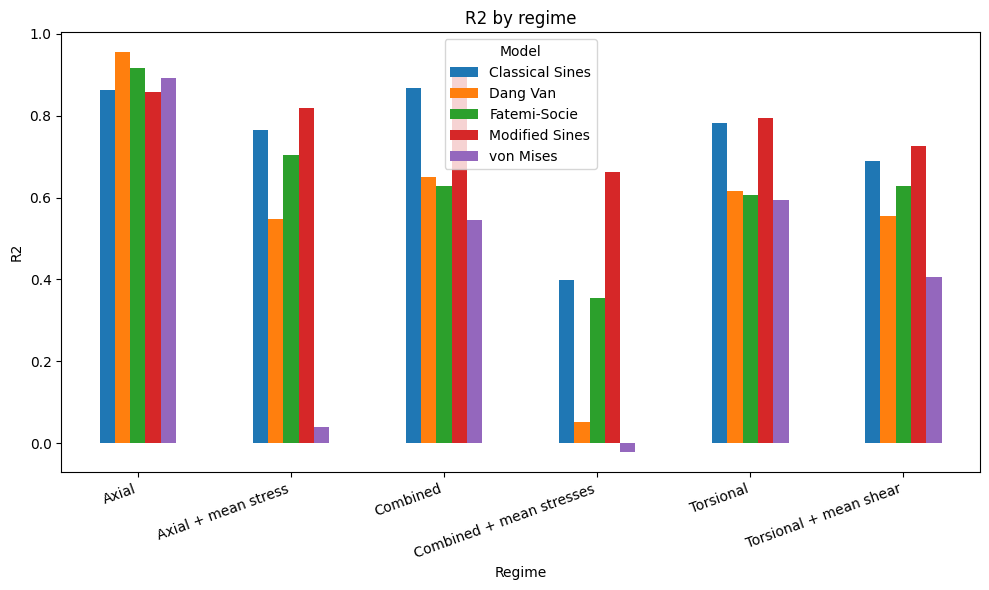

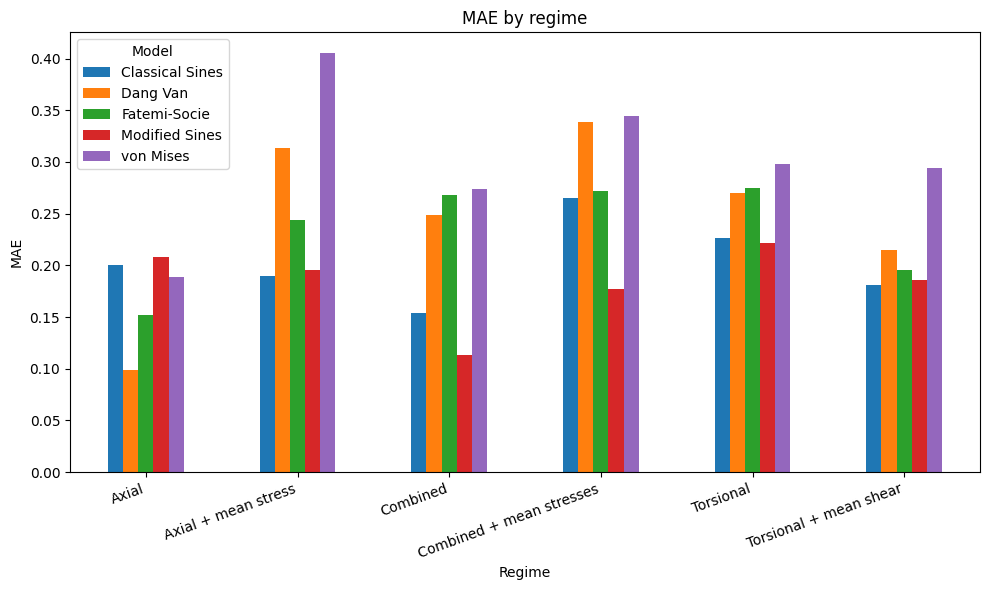

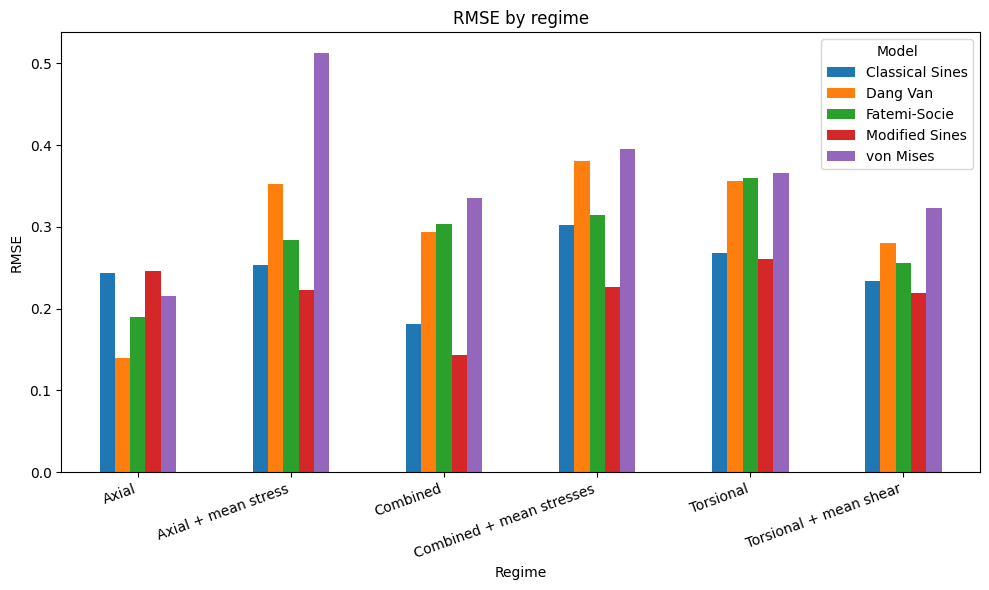

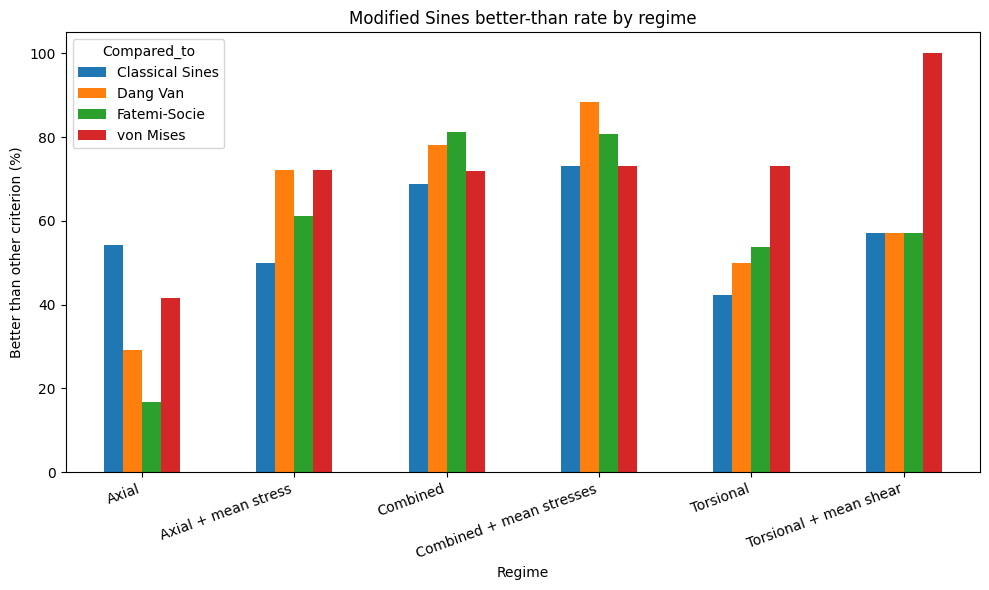

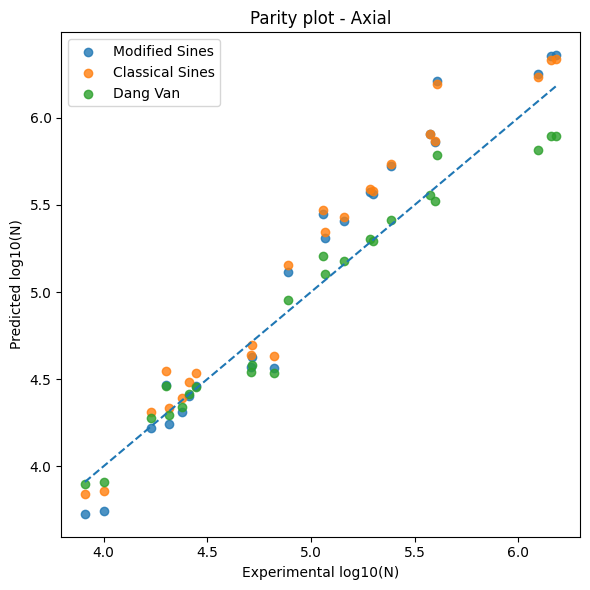

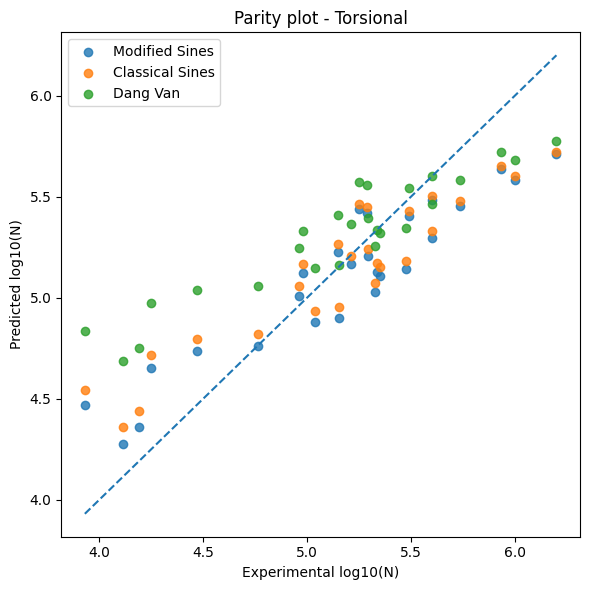

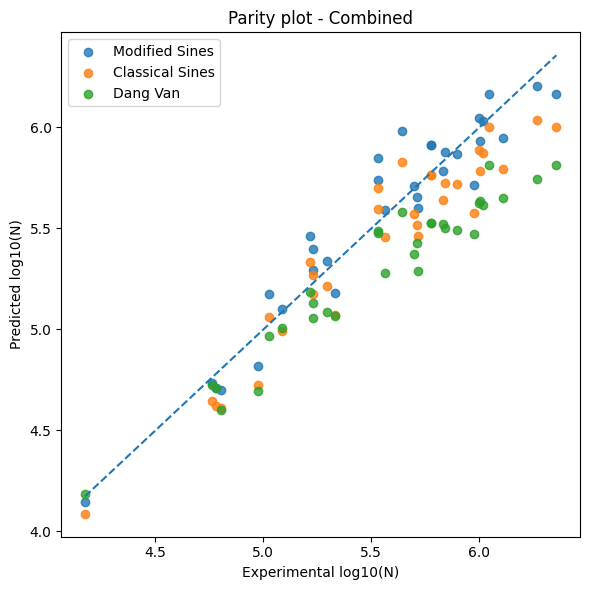

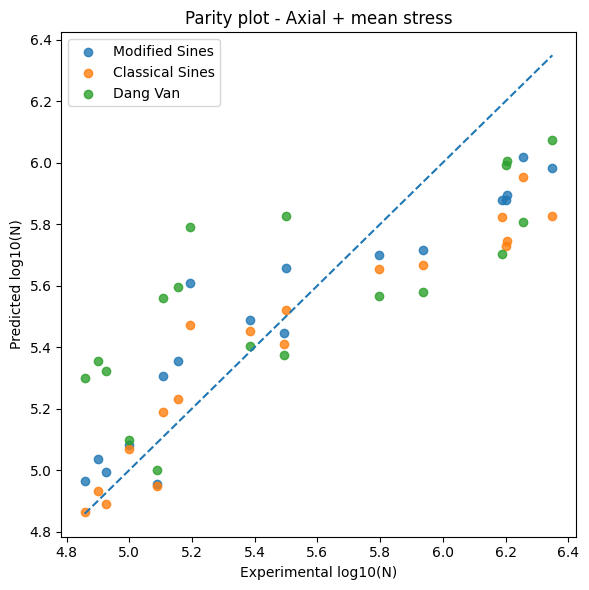

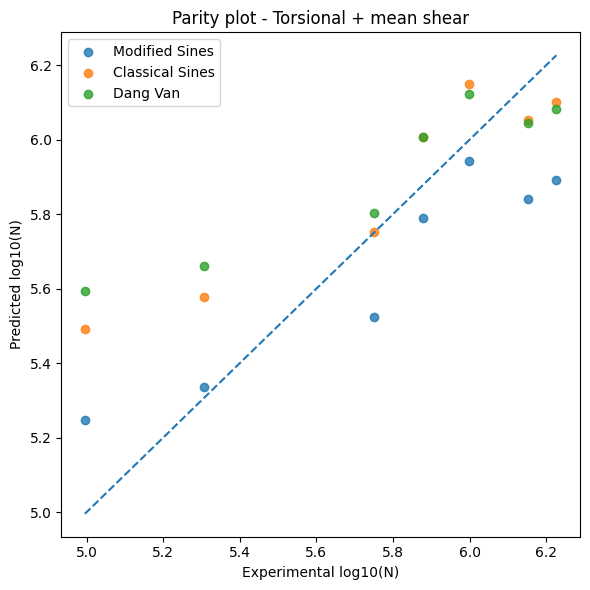

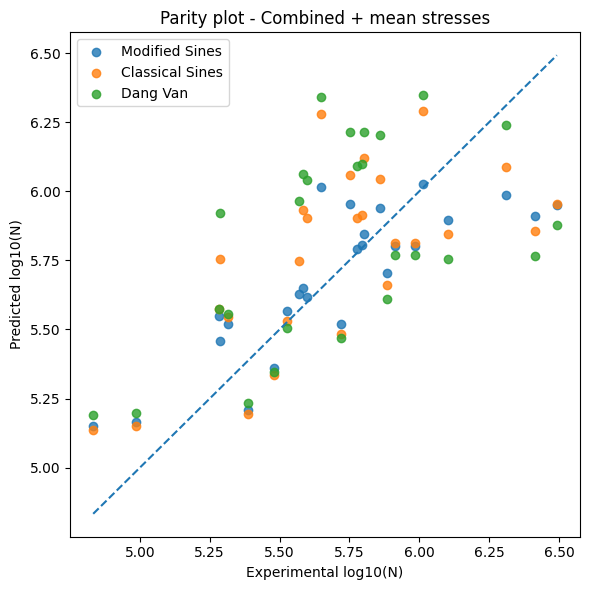

In [ ]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=False)
    except Exception as e:
        print(f"Warning: Google Drive mount skipped or failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
INPUT_FILE = "/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx"
DATASET_LABEL = "S355"

OUTPUT_EXCEL = "Regime_strength_ModifiedSines_vs_Others.xlsx"

SIGMA_Y = 355.0
EPSILON = 1e-9

# ============================================================
# DATA LOADING / STANDARDIZATION
# ============================================================
def norm_col(name: str) -> str:
    s = str(name).strip().lower()
    s = s.replace("σ", "sig")
    s = s.replace("τ", "tau")
    s = s.replace("ε", "eps")
    s = s.replace("γ", "gamma")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def first_existing(df: pd.DataFrame, candidates: list[str]):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None


def standardize_dataset(df: pd.DataFrame, material_name: str) -> pd.DataFrame:
    out = df.copy()

    col_sa = first_existing(out, [
        "sa", "sig_a_mpa", "sig_a", "sigma_a_mpa", "sigma_a",
        "sig_max_mpa", "sig_max", "sigma_n_a_mpa", "sigma_n_a"
    ])
    col_sm = first_existing(out, [
        "sm", "sig_m_mpa", "sig_m", "sigma_m_mpa", "sigma_m"
    ])
    col_ta = first_existing(out, [
        "ta", "tau_a_mpa", "tau_a", "tau_max_mpa", "tau_max",
        "tau_ns_a_mpa", "tau_ns_a"
    ])
    col_tm = first_existing(out, [
        "tm", "tau_m_mpa", "tau_m"
    ])
    col_n = first_existing(out, [
        "nexp", "n_exp", "n_exp_cycles", "nexp_cycles",
        "nf_exp_cycle", "nf_exp_cycles", "nf_exp", "n_fexp_cycle", "2nf"
    ])
    col_crack = first_existing(out, ["crack", "crack_", "crack_q"])

    if col_n is None:
        raise ValueError(f"{material_name}: could not find fatigue life column.")

    std = pd.DataFrame(index=out.index)
    std["Sa"] = pd.to_numeric(out[col_sa], errors="coerce") if col_sa else np.nan
    std["Ta"] = pd.to_numeric(out[col_ta], errors="coerce") if col_ta else np.nan
    std["Sm"] = pd.to_numeric(out[col_sm], errors="coerce") if col_sm else 0.0
    std["Tm"] = pd.to_numeric(out[col_tm], errors="coerce") if col_tm else 0.0
    std["Nexp"] = pd.to_numeric(out[col_n], errors="coerce")

    if norm_col(col_n) == "2nf":
        std["Nexp"] = std["Nexp"] / 2.0

    if col_crack:
        std["crack"] = pd.to_numeric(out[col_crack], errors="coerce")
    else:
        std["crack"] = 1

    std = std.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()
    std = std[(std["Nexp"] > 0) & (std["Sa"] >= 0) & (std["Ta"] >= 0)].copy()

    uniq = set(std["crack"].dropna().unique().tolist())
    if uniq and uniq.issubset({0, 1}):
        std = std[std["crack"] == 1].copy()

    std = std.reset_index(drop=True)
    std["ID"] = np.arange(1, len(std) + 1)
    std["Material"] = material_name
    std["log10_Nexp"] = np.log10(std["Nexp"])
    return std


def find_input_file(filepath: str | Path) -> Path:
    """
    Resolve the requested dataset path.

    The function first checks the specified path. If it is unavailable,
    it searches Google Drive recursively for the same filename.
    """
    filepath = Path(filepath)

    if filepath.is_file():
        return filepath

    drive_root = Path("/content/gdrive/My Drive")
    filename = filepath.name

    matches = [
        path for path in drive_root.rglob(filename)
        if path.is_file()
    ]

    if not matches:
        target = filename.casefold()
        matches = [
            path for path in drive_root.rglob("*")
            if path.is_file() and path.name.casefold() == target
        ]

    if not matches:
        raise FileNotFoundError(
            f"Input file not found: {filepath}\n"
            f"The file '{filename}' was also not found under {drive_root}."
        )

    if len(matches) > 1:
        print(f"Warning: multiple files named '{filename}' were found:")
        for match in matches:
            print(f"  - {match}")
        print(f"Using: {matches[0]}")

    return matches[0]


def load_clean_dataset(filepath: str | Path, material_name: str) -> pd.DataFrame:
    resolved_path = find_input_file(filepath)

    print(f"Loading {material_name}: {resolved_path}")
    df = pd.read_excel(resolved_path)
    standardized = standardize_dataset(df, material_name)

    if standardized.empty:
        raise ValueError(
            f"{material_name}: no valid records remained after standardization."
        )

    print(f"Loaded {material_name}: {len(standardized)} specimens")
    return standardized

# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sm, Tm, Sa, Ta = row["Sm"], row["Tm"], row["Sa"], row["Ta"]

    if Sa > 0 and Sm == 0 and Tm == 0 and Ta == 0:
        return "Axial"
    if Ta > 0 and Sm == 0 and Tm == 0 and Sa == 0:
        return "Torsional"
    if Sa > 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Combined"
    if Ta > 0 and Tm != 0 and Sm == 0 and Sa == 0:
        return "Torsional + mean shear"
    if Sa > 0 and Ta > 0 and (Sm != 0 or Tm != 0):
        return "Combined + mean stresses"
    if Sa > 0 and Sm != 0 and Ta == 0 and Tm == 0:
        return "Axial + mean stress"
    return "Other"

# ============================================================
# METRICS / BASQUIN
# ============================================================
def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray):
    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        "resid": resid,
        "r2": float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan,
        "mae": float(np.mean(np.abs(resid))),
        "rmse": float(np.sqrt(np.mean(resid ** 2))),
    }


def predict_basquin(phi: np.ndarray, A: float, B: float) -> np.ndarray:
    return A + B * np.log10(phi)


def metrics_from_predictions(y_true: np.ndarray, y_pred: np.ndarray) -> dict:
    resid = y_true - y_pred
    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y_true - y_true.mean()) ** 2)
    return {
        "R2": float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan,
        "MAE": float(np.mean(np.abs(resid))),
        "RMSE": float(np.sqrt(np.mean(resid ** 2))),
    }

# ============================================================
# MODEL DEFINITIONS
# ============================================================
def optimize_descriptor(builder, y: np.ndarray, x0: list[float], bounds: list[tuple[float, float]]):
    def objective(params):
        phi = builder(params)
        fit = fit_basquin_from_phi(phi, y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array(x0, dtype=float),
        bounds=bounds,
        method="L-BFGS-B"
    )

    params = res.x
    phi = builder(params)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Optimization failed.")

    return params, phi, fit


def run_classical_sines(df):
    Sa, Ta, Sm = df["Sa"].values, df["Ta"].values, df["Sm"].values
    y = df["log10_Nexp"].values
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)

    def build(params):
        alpha = params[0]
        return base + alpha * (Sm / 3.0)

    params, phi, fit = optimize_descriptor(build, y, [0.8], [(-5, 5)])
    return {
        "name": "Classical Sines",
        "phi": phi,
        "y_pred": fit["yhat"],
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        **fit,
    }


def run_modified_sines(df):
    Sa, Ta, Sm, Tm = df["Sa"].values, df["Ta"].values, df["Sm"].values, df["Tm"].values
    y = df["log10_Nexp"].values
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + EPSILON)
    mean_shear = np.abs(Tm)

    def build(params):
        alpha, beta, gamma = params
        return base + alpha * (Sm / 3.0) + beta * interaction + gamma * mean_shear

    params, phi, fit = optimize_descriptor(
        build, y,
        [0.4, 0.1, 0.1],
        [(-5, 5), (-5, 5), (-5, 5)]
    )

    return {
        "name": "Modified Sines",
        "phi": phi,
        "y_pred": fit["yhat"],
        "alpha": float(params[0]),
        "beta": float(params[1]),
        "gamma": float(params[2]),
        **fit,
    }


def run_dang_van_proxy(df):
    Sa, Ta, Sm = df["Sa"].values, df["Ta"].values, df["Sm"].values
    y = df["log10_Nexp"].values
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    hydro_max_proxy = (Sm + Sa) / 3.0

    def build(params):
        a = params[0]
        return base + a * hydro_max_proxy

    params, phi, fit = optimize_descriptor(build, y, [0.2], [(-5, 5)])
    return {
        "name": "Dang Van",
        "phi": phi,
        "y_pred": fit["yhat"],
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        **fit,
    }


def run_von_mises(df):
    Sa, Ta = df["Sa"].values, df["Ta"].values
    y = df["log10_Nexp"].values
    phi = np.sqrt(Sa**2 + 3.0 * Ta**2)
    fit = fit_basquin_from_phi(phi, y)
    if fit is None:
        raise RuntimeError("von Mises fit failed.")

    return {
        "name": "von Mises",
        "phi": phi,
        "y_pred": fit["yhat"],
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        **fit,
    }


def run_fatemi_socie_proxy(df):
    Sa, Ta = df["Sa"].values, df["Ta"].values
    Sm, Tm = df["Sm"].values, df["Tm"].values
    y = df["log10_Nexp"].values

    thetas = np.linspace(0, np.pi, 721)
    c2 = np.cos(2 * thetas)[None, :]
    s2 = np.sin(2 * thetas)[None, :]

    def fs_phi(k):
        sigma_n_mean = Sm[:, None] / 2.0 + Sm[:, None] / 2.0 * c2 + Tm[:, None] * s2
        sigma_n_amp = np.abs(Sa[:, None] / 2.0 + Sa[:, None] / 2.0 * c2 + Ta[:, None] * s2)
        sigma_n_max = sigma_n_mean + sigma_n_amp
        tau_amp = np.abs(-Sa[:, None] / 2.0 * s2 + Ta[:, None] * c2)
        P = tau_amp * (1.0 + k * sigma_n_max / SIGMA_Y)
        return P.max(axis=1)

    def objective(params):
        k = params[0]
        fit = fit_basquin_from_phi(fs_phi(k), y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(objective, x0=np.array([0.4]), bounds=[(0, 10)], method="L-BFGS-B")
    k = float(res.x[0])

    phi = fs_phi(k)
    fit = fit_basquin_from_phi(phi, y)
    if fit is None:
        raise RuntimeError("Fatemi-Socie fit failed.")

    return {
        "name": "Fatemi-Socie",
        "phi": phi,
        "y_pred": fit["yhat"],
        "alpha": k,
        "beta": np.nan,
        "gamma": np.nan,
        **fit,
    }

# ============================================================
# RUN ALL MODELS
# ============================================================
def run_all_models(df):
    models = [
        run_modified_sines(df),
        run_classical_sines(df),
        run_dang_van_proxy(df),
        run_fatemi_socie_proxy(df),
        run_von_mises(df),
    ]
    return models

# ============================================================
# REGIME-WISE ANALYSIS
# ============================================================
def build_prediction_table(df, models):
    out = df.copy()
    for m in models:
        safe = m["name"].replace(" ", "_").replace("-", "_")
        out[f"y_pred_{safe}"] = m["y_pred"]
        out[f"abs_err_{safe}"] = np.abs(df["log10_Nexp"].values - m["y_pred"])
    return out


def regime_metrics_table(df_pred, model_names):
    rows = []
    for regime, sub in df_pred.groupby("Regime"):
        y_true = sub["log10_Nexp"].values
        if len(sub) < 2:
            continue
        for model in model_names:
            safe = model.replace(" ", "_").replace("-", "_")
            y_pred = sub[f"y_pred_{safe}"].values
            met = metrics_from_predictions(y_true, y_pred)
            rows.append({
                "Regime": regime,
                "Model": model,
                "n": len(sub),
                "R2": met["R2"],
                "MAE": met["MAE"],
                "RMSE": met["RMSE"],
            })
    return pd.DataFrame(rows)


def win_count_table(df_pred, model_names, reference_model="Modified Sines"):
    rows = []
    ref_safe = reference_model.replace(" ", "_").replace("-", "_")

    for regime, sub in df_pred.groupby("Regime"):
        if len(sub) == 0:
            continue
        ref_err = sub[f"abs_err_{ref_safe}"].values

        for model in model_names:
            if model == reference_model:
                continue
            safe = model.replace(" ", "_").replace("-", "_")
            other_err = sub[f"abs_err_{safe}"].values

            better = int((ref_err < other_err).sum())
            equal = int((ref_err == other_err).sum())
            worse = len(sub) - better - equal

            rows.append({
                "Regime": regime,
                "Compared_to": model,
                "n": len(sub),
                "Modified_Sines_better": better,
                "Equal": equal,
                "Worse": worse,
                "Better_%": 100.0 * better / len(sub),
            })

    return pd.DataFrame(rows)

# ============================================================
# PLOTTING
# ============================================================
def plot_metric_by_regime(metrics_df, metric="R2"):
    pivot = metrics_df.pivot(index="Regime", columns="Model", values=metric)
    ax = pivot.plot(kind="bar", figsize=(10, 6))
    ax.set_title(f"{metric} by regime")
    ax.set_ylabel(metric)
    ax.set_xlabel("Regime")
    plt.xticks(rotation=20, ha="right")
    plt.tight_layout()
    plt.show()


def plot_win_counts(win_df):
    pivot = win_df.pivot(index="Regime", columns="Compared_to", values="Better_%")
    ax = pivot.plot(kind="bar", figsize=(10, 6))
    ax.set_title("Modified Sines better-than rate by regime")
    ax.set_ylabel("Better than other criterion (%)")
    ax.set_xlabel("Regime")
    plt.xticks(rotation=20, ha="right")
    plt.tight_layout()
    plt.show()


def parity_plot_by_regime(df_pred, models_to_plot=None):
    if models_to_plot is None:
        models_to_plot = ["Modified Sines", "Classical Sines", "Dang Van"]

    regimes = df_pred["Regime"].dropna().unique().tolist()

    for regime in regimes:
        sub = df_pred[df_pred["Regime"] == regime].copy()
        if len(sub) < 2:
            continue

        y_true = sub["log10_Nexp"].values
        y_min = float(np.min(y_true))
        y_max = float(np.max(y_true))

        plt.figure(figsize=(6, 6))

        for model in models_to_plot:
            safe = model.replace(" ", "_").replace("-", "_")
            plt.scatter(
                y_true,
                sub[f"y_pred_{safe}"].values,
                label=model,
                alpha=0.8
            )

        plt.plot([y_min, y_max], [y_min, y_max], linestyle="--")
        plt.xlabel("Experimental log10(N)")
        plt.ylabel("Predicted log10(N)")
        plt.title(f"Parity plot - {regime}")
        plt.legend()
        plt.tight_layout()
        plt.show()

# ============================================================
# MAIN
# ============================================================
def main():
    df = load_clean_dataset(INPUT_FILE, DATASET_LABEL)
    df["Regime"] = df.apply(classify_regime, axis=1)

    models = run_all_models(df)
    model_names = [m["name"] for m in models]

    print("\n=== GLOBAL MODEL SUMMARY ===")
    summary_rows = []
    for m in models:
        summary_rows.append({
            "Model": m["name"],
            "R2": m["r2"],
            "MAE": m["mae"],
            "RMSE": m["rmse"],
            "alpha": m["alpha"],
            "beta": m["beta"],
            "gamma": m["gamma"],
        })
    summary_df = pd.DataFrame(summary_rows).sort_values("R2", ascending=False)
    print(summary_df.to_string(index=False))

    df_pred = build_prediction_table(df, models)
    metrics_df = regime_metrics_table(df_pred, model_names)
    win_df = win_count_table(df_pred, model_names, reference_model="Modified Sines")

    print("\n=== REGIME-WISE METRICS ===")
    print(metrics_df.to_string(index=False))

    print("\n=== MODIFIED SINES WIN COUNTS ===")
    print(win_df.to_string(index=False))

    with pd.ExcelWriter(OUTPUT_EXCEL, engine="openpyxl") as writer:
        summary_df.to_excel(writer, sheet_name="Global_Summary", index=False)
        metrics_df.to_excel(writer, sheet_name="Regime_Metrics", index=False)
        win_df.to_excel(writer, sheet_name="Win_Counts", index=False)
        df_pred.to_excel(writer, sheet_name="All_Predictions", index=False)

    print(f"\nResults exported to: {OUTPUT_EXCEL}")

    # Plots
    plot_metric_by_regime(metrics_df, metric="R2")
    plot_metric_by_regime(metrics_df, metric="MAE")
    plot_metric_by_regime(metrics_df, metric="RMSE")
    plot_win_counts(win_df)
    parity_plot_by_regime(df_pred, models_to_plot=["Modified Sines", "Classical Sines", "Dang Van"])


if __name__ == "__main__":
    main()

####Regime-Wise Multicollinearity Assessment of Modified Sines Input Features Using VIF

####Brief description:
This code evaluates multicollinearity among the stress components and derived Modified Sines terms for the cleaned 133-specimen S355 fatigue dataset. It classifies the observations into axial, torsional, and combined loading regimes, then calculates the variance inflation factor for Sa,Ta,Sm,Tm, the axial–torsional interaction term, and the Modified Sines base term.

The script also detects constant, zero-variance, and perfectly dependent features that commonly occur under pure axial or pure torsional loading. These cases are identified separately rather than treated as calculation errors. The resulting VIF values, multicollinearity status, and specimen counts are exported to an Excel workbook for each loading regime and for the complete summary.

In [ ]:
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# ============================================================
# USER SETTINGS
# ============================================================
BASE_DIR = Path(
    "/content/gdrive/My Drive/steel samples/Manuscript#3"
)

FILE_NAME = "FatigueDataS355_cleaned_133.xlsx"

OUTPUT_FILE = BASE_DIR / "VIF_by_regime_S355.xlsx"

EPS = 1e-9
MIN_REGIME_SIZE = 10


# ============================================================
# LOCATE AND LOAD DATA
# ============================================================
def find_input_file(
    filename: str,
    base_dir: Path = BASE_DIR,
    drive_root: Path = Path("/content/gdrive/My Drive"),
) -> Path:
    """
    Find the requested file in the expected folder or elsewhere
    in Google Drive.
    """
    direct_path = base_dir / filename

    if direct_path.is_file():
        return direct_path

    matches = [
        path
        for path in drive_root.rglob(filename)
        if path.is_file()
    ]

    if not matches:
        target = filename.casefold()

        matches = [
            path
            for path in drive_root.rglob("*")
            if path.is_file()
            and path.name.casefold() == target
        ]

    if not matches:
        raise FileNotFoundError(
            f"Input file not found: {filename}\n"
            f"Expected location: {direct_path}\n"
            f"Searched under: {drive_root}"
        )

    if len(matches) > 1:
        print(f"Warning: multiple files named '{filename}' were found:")

        for match in matches:
            print(f"  - {match}")

        print(f"Using: {matches[0]}")

    return matches[0]


file_path = find_input_file(FILE_NAME)

print(f"Loading dataset from:\n{file_path}")

df_raw = pd.read_excel(file_path)


# ============================================================
# VALIDATE AND STANDARDISE REQUIRED COLUMNS
# ============================================================
required_columns = ["Sa", "Ta", "Sm", "Tm"]

missing_columns = [
    column
    for column in required_columns
    if column not in df_raw.columns
]

if missing_columns:
    raise ValueError(
        "The following required columns are missing: "
        + ", ".join(missing_columns)
        + f"\nAvailable columns: {df_raw.columns.tolist()}"
    )

df = df_raw[required_columns].copy()

for column in required_columns:
    df[column] = pd.to_numeric(
        df[column],
        errors="coerce",
    )

df = df.dropna(subset=required_columns).copy()

df = df[
    (df["Sa"] >= 0)
    & (df["Ta"] >= 0)
].reset_index(drop=True)

print(f"Loaded valid specimens: {len(df)}")


# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sa = row["Sa"]
    Ta = row["Ta"]

    if Sa > 0 and np.isclose(Ta, 0.0):
        return "Axial"

    if Ta > 0 and np.isclose(Sa, 0.0):
        return "Torsional"

    if Sa > 0 and Ta > 0:
        return "Combined"

    return "Other"


df["Regime"] = df.apply(
    classify_regime,
    axis=1,
)

print("\nRegime counts:")
print(df["Regime"].value_counts())


# ============================================================
# ADD MODIFIED SINES TERMS
# ============================================================
df["interaction"] = (
    np.abs(df["Sa"]) * np.abs(df["Ta"])
) / (
    np.abs(df["Sa"])
    + np.abs(df["Ta"])
    + EPS
)

df["base_term"] = np.sqrt(
    df["Sa"] ** 2 / 3.0
    + df["Ta"] ** 2
)


# ============================================================
# COMPUTE VIF
# ============================================================
def compute_vif(sub_df: pd.DataFrame) -> pd.DataFrame:
    """
    Compute VIF after removing constant or non-finite features.

    Constant features are reported separately because VIF cannot
    be meaningfully calculated for them.
    """
    requested_features = [
        "Sa",
        "Ta",
        "Sm",
        "Tm",
        "interaction",
        "base_term",
    ]

    X = sub_df[requested_features].copy()

    X = X.replace(
        [np.inf, -np.inf],
        np.nan,
    ).dropna()

    rows = []
    usable_features = []

    for feature in requested_features:
        unique_count = X[feature].nunique(dropna=True)
        variance = X[feature].var(ddof=0)

        if unique_count <= 1 or np.isclose(variance, 0.0):
            rows.append(
                {
                    "Feature": feature,
                    "VIF": np.nan,
                    "Status": "Constant or zero variance",
                }
            )
        else:
            usable_features.append(feature)

    if len(usable_features) < 2:
        rows.extend(
            {
                "Feature": feature,
                "VIF": np.nan,
                "Status": "Insufficient varying features",
            }
            for feature in usable_features
        )

        return pd.DataFrame(rows)

    X_vif = X[usable_features].astype(float)

    for index, feature in enumerate(usable_features):
        try:
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")

                vif_value = variance_inflation_factor(
                    X_vif.values,
                    index,
                )

            if np.isinf(vif_value):
                status = "Perfect multicollinearity"
            elif vif_value >= 10:
                status = "High multicollinearity"
            elif vif_value >= 5:
                status = "Moderate multicollinearity"
            else:
                status = "Acceptable"

        except Exception as error:
            vif_value = np.nan
            status = f"VIF calculation failed: {error}"

        rows.append(
            {
                "Feature": feature,
                "VIF": vif_value,
                "Status": status,
            }
        )

    result = pd.DataFrame(rows)

    feature_order = {
        feature: index
        for index, feature in enumerate(requested_features)
    }

    result["_order"] = result["Feature"].map(feature_order)

    result = (
        result
        .sort_values("_order")
        .drop(columns="_order")
        .reset_index(drop=True)
    )

    return result


# ============================================================
# COMPUTE VIF BY LOADING REGIME
# ============================================================
results = {}
summary_rows = []

for regime, sub_df in df.groupby("Regime"):
    if regime == "Other":
        continue

    if len(sub_df) < MIN_REGIME_SIZE:
        print(
            f"\nSkipping {regime}: "
            f"only {len(sub_df)} specimens."
        )
        continue

    vif_df = compute_vif(sub_df)

    vif_df.insert(
        0,
        "Regime",
        regime,
    )

    vif_df.insert(
        1,
        "Number_of_specimens",
        len(sub_df),
    )

    print(f"\n=== VIF: {regime} ===")
    print(vif_df.to_string(index=False))

    results[regime] = vif_df

    for _, row in vif_df.iterrows():
        summary_rows.append(row.to_dict())


# ============================================================
# EXPORT RESULTS
# ============================================================
if not results:
    raise RuntimeError(
        "No regime contained enough specimens for VIF analysis."
    )

summary_df = pd.DataFrame(summary_rows)

with pd.ExcelWriter(
    OUTPUT_FILE,
    engine="openpyxl",
) as writer:

    summary_df.to_excel(
        writer,
        sheet_name="All_Regimes",
        index=False,
    )

    for regime, vif_df in results.items():
        sheet_name = regime[:31]

        vif_df.to_excel(
            writer,
            sheet_name=sheet_name,
            index=False,
        )

print(f"\nSaved successfully:\n{OUTPUT_FILE}")

Loading dataset from:
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Loaded valid specimens: 133

Regime counts:
Regime
Combined     58
Axial        42
Torsional    33
Name: count, dtype: int64

=== VIF: Axial ===
Regime  Number_of_specimens     Feature          VIF                    Status
 Axial                   42          Sa 1.000800e+15    High multicollinearity
 Axial                   42          Ta          NaN Constant or zero variance
 Axial                   42          Sm 1.603796e+00                Acceptable
 Axial                   42          Tm          NaN Constant or zero variance
 Axial                   42 interaction          NaN Constant or zero variance
 Axial                   42   base_term 1.000800e+15    High multicollinearity

=== VIF: Combined ===
  Regime  Number_of_specimens     Feature          VIF                 Status
Combined                   58          Sa 1.553309e+08 High multicollinearity
Combined        

####Multi-Material Regime-Wise VIF Analysis of Modified Sines Stress Features

####Brief description:
This code evaluates multicollinearity among the stress components and derived Modified Sines features across several fatigue datasets, including S355 steel, 7075-T651 aluminium alloy, MS1 steel, and CuZn37 brass.

The script standardises the input data, classifies specimens according to axial, torsional, combined, and mean-stress loading regimes, and calculates the variance inflation factor for Sa,Ta,Sm,Tm, the axial–torsional interaction term, and the Modified Sines base term. Constant or undefined variables within each regime are identified and reported separately.

The analysis is performed for each material individually and for combined datasets. The resulting VIF values, feature status, specimen counts, regime information, and standardised data are exported to separate Excel workbooks. The code also includes robust Google Drive file detection and safely excludes unavailable optional datasets without duplicating records.

In [ ]:
import re
import numpy as np
import pandas as pd
from pathlib import Path
from statsmodels.stats.outliers_influence import variance_inflation_factor

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=False)
    except Exception as e:
        print(f"Warning: Google Drive mount skipped or failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
BASE_DIR = Path("/content/gdrive/My Drive/steel samples/Manuscript#3")
DRIVE_ROOT = Path("/content/gdrive/My Drive")

INPUT_NAME_S355 = "FatigueDataS355_cleaned_133.xlsx"
INPUT_NAME_7075 = "FatigueData 7075T651  Clean list.xlsx"
INPUT_NAME_MS1 = "MS1_FatigueData.xlsx"
INPUT_NAME_RESULTS_S355 = "ResultsS355.xlsx"
INPUT_NAME_CUZN37 = "Fatigue data CuZn37.xlsx"

OUT_S355 = "VIF_by_regime_S355.xlsx"
OUT_7075 = "VIF_by_regime_7075.xlsx"
OUT_MS1 = "VIF_by_regime_MS1.xlsx"
OUT_RESULTS_S355 = "VIF_by_regime_ResultsS355.xlsx"
OUT_CUZN37 = "VIF_by_regime_CuZn37_supplementary.xlsx"
OUT_COMBINED_MAIN = "VIF_by_regime_combined_MAIN_4materials.xlsx"
OUT_COMBINED_ALL5 = "VIF_by_regime_combined_ALL5_supplementary.xlsx"

EPSILON = 1e-9
MIN_ROWS_PER_REGIME = 5

# ============================================================
# DATA STANDARDIZATION
# ============================================================
def norm_col(name: str) -> str:
    s = str(name).strip().lower()
    s = s.replace("σ", "sig")
    s = s.replace("τ", "tau")
    s = s.replace("ε", "eps")
    s = s.replace("γ", "gamma")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def first_existing(df: pd.DataFrame, candidates: list[str]):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None


def standardize_dataset(df: pd.DataFrame, material_name: str) -> pd.DataFrame:
    out = df.copy()

    col_sa = first_existing(out, [
        "sa", "sig_a_mpa", "sig_a", "sigma_a_mpa", "sigma_a",
        "sig_max_mpa", "sig_max", "sigma_n_a_mpa", "sigma_n_a",
        "sign_a_mpa", "sign_a"
    ])

    col_sm = first_existing(out, [
        "sm", "sig_m_mpa", "sig_m", "sigma_m_mpa", "sigma_m"
    ])

    col_ta = first_existing(out, [
        "ta", "tau_a_mpa", "tau_a", "tau_max_mpa", "tau_max",
        "tau_ns_a_mpa", "tau_ns_a", "tauns_a_mpa", "tauns_a"
    ])

    col_tm = first_existing(out, [
        "tm", "tau_m_mpa", "tau_m"
    ])

    col_n = first_existing(out, [
        "nexp", "n_exp", "n_exp_cycles", "nexp_cycles",
        "nf_exp_cycle", "nf_exp_cycles", "nf_exp", "n_fexp_cycle", "2nf"
    ])

    col_crack = first_existing(out, [
        "crack", "crack_", "crack_q"
    ])

    if col_n is None:
        raise ValueError(f"{material_name}: could not find fatigue life column.")

    std = pd.DataFrame(index=out.index)

    std["Sa"] = pd.to_numeric(out[col_sa], errors="coerce") if col_sa else np.nan
    std["Ta"] = pd.to_numeric(out[col_ta], errors="coerce") if col_ta else np.nan
    std["Sm"] = pd.to_numeric(out[col_sm], errors="coerce") if col_sm else 0.0
    std["Tm"] = pd.to_numeric(out[col_tm], errors="coerce") if col_tm else 0.0
    std["Nexp"] = pd.to_numeric(out[col_n], errors="coerce")

    if norm_col(col_n) == "2nf":
        std["Nexp"] = std["Nexp"] / 2.0

    if col_crack:
        std["crack"] = pd.to_numeric(out[col_crack], errors="coerce")
    else:
        std["crack"] = 1

    std = std.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()
    std = std[(std["Nexp"] > 0) & (std["Sa"] >= 0) & (std["Ta"] >= 0)].copy()

    uniq = set(std["crack"].dropna().unique().tolist())
    if uniq and uniq.issubset({0, 1}):
        std = std[std["crack"] == 1].copy()

    std = std.reset_index(drop=True)
    std["ID"] = np.arange(1, len(std) + 1)
    std["Material"] = material_name
    std["log10_Nexp"] = np.log10(std["Nexp"])
    return std


def resolve_input_file(
    filename: str,
    required: bool = True,
    base_dir: Path = BASE_DIR,
    search_root: Path = DRIVE_ROOT,
) -> Path | None:
    """
    Locate an input Excel file without changing the VIF workflow.
    """
    direct_path = base_dir / filename
    if direct_path.is_file():
        return direct_path

    matches = [path for path in search_root.rglob(filename) if path.is_file()]

    if not matches:
        target = filename.casefold()
        matches = [
            path for path in search_root.rglob("*")
            if path.is_file() and path.name.casefold() == target
        ]

    if matches:
        if len(matches) > 1:
            print(f"Warning: multiple files named '{filename}' were found:")
            for match in matches:
                print(f"  - {match}")
            print(f"Using: {matches[0]}")
        return matches[0]

    message = (
        f"Input file not found: {filename}\n"
        f"Expected location: {direct_path}\n"
        f"Searched under: {search_root}"
    )

    if required:
        raise FileNotFoundError(message)

    print(f"Warning: {message}")
    print("The optional dataset will be skipped.")
    return None


def load_clean_dataset(filepath: str | Path, material_name: str) -> pd.DataFrame:
    filepath = Path(filepath)

    if not filepath.is_file():
        raise FileNotFoundError(f"Input file not found: {filepath}")

    print(f"Loading {material_name}: {filepath}")
    df = pd.read_excel(filepath)
    standardized = standardize_dataset(df, material_name)

    if standardized.empty:
        raise ValueError(
            f"{material_name}: no valid records remained after standardization."
        )

    print(f"Loaded {material_name}: {len(standardized)} specimens")
    return standardized

# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sa, Ta, Sm, Tm = row["Sa"], row["Ta"], row["Sm"], row["Tm"]

    if Sa > 0 and Ta == 0 and Sm == 0 and Tm == 0:
        return "Axial"
    elif Sa > 0 and Ta == 0 and Sm != 0 and Tm == 0:
        return "Axial + mean stress"
    elif Ta > 0 and Sa == 0 and Sm == 0 and Tm == 0:
        return "Torsional"
    elif Ta > 0 and Sa == 0 and Sm == 0 and Tm != 0:
        return "Torsional + mean shear"
    elif Sa > 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Combined"
    elif Sa > 0 and Ta > 0 and (Sm != 0 or Tm != 0):
        return "Combined + mean stresses"
    else:
        return "Other"

# ============================================================
# FEATURE BUILDING FOR VIF
# ============================================================
def add_modified_sines_terms(df: pd.DataFrame) -> pd.DataFrame:
    out = df.copy()

    out["interaction"] = (
        np.abs(out["Sa"]) * np.abs(out["Ta"])
    ) / (np.abs(out["Sa"]) + np.abs(out["Ta"]) + EPSILON)

    out["base_term"] = np.sqrt(out["Sa"]**2 / 3.0 + out["Ta"]**2)

    return out


def drop_constant_columns(X: pd.DataFrame):
    keep_cols = []
    dropped_cols = []

    for col in X.columns:
        vals = X[col].replace([np.inf, -np.inf], np.nan).dropna()
        if len(vals) == 0:
            dropped_cols.append(col)
        elif np.isclose(vals.std(ddof=0), 0.0):
            dropped_cols.append(col)
        else:
            keep_cols.append(col)

    return X[keep_cols].copy(), dropped_cols


def compute_vif_table(sub_df: pd.DataFrame) -> pd.DataFrame:
    X = sub_df[["Sa", "Ta", "Sm", "Tm", "interaction", "base_term"]].copy()

    X, dropped_cols = drop_constant_columns(X)

    rows = []

    for feature in ["Sa", "Ta", "Sm", "Tm", "interaction", "base_term"]:
        if feature not in X.columns:
            rows.append({
                "Feature": feature,
                "VIF": np.nan,
                "Status": "Dropped (constant / undefined in regime)"
            })
            continue

        try:
            vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
            if np.isinf(vif_val):
                status = "Infinite (perfect dependence)"
            elif np.isnan(vif_val):
                status = "NaN (singular / undefined)"
            else:
                status = "OK"
        except Exception:
            vif_val = np.nan
            status = "Error / undefined"

        rows.append({
            "Feature": feature,
            "VIF": vif_val,
            "Status": status
        })

    return pd.DataFrame(rows)

# ============================================================
# ANALYSIS
# ============================================================
def run_vif_by_regime(df: pd.DataFrame, dataset_label: str, output_file: str):
    df = df.copy()
    df["Regime"] = df.apply(classify_regime, axis=1)
    df = add_modified_sines_terms(df)

    summary_rows = []
    regime_tables = {}

    print(f"\n{'='*70}")
    print(f"VIF ANALYSIS BY REGIME: {dataset_label}")
    print(f"{'='*70}")

    for regime, sub in df.groupby("Regime"):
        if len(sub) < MIN_ROWS_PER_REGIME:
            continue

        vif_df = compute_vif_table(sub)
        vif_df.insert(0, "Regime", regime)
        vif_df.insert(1, "n", len(sub))
        regime_tables[regime] = vif_df

        print(f"\n=== VIF: {regime} (n={len(sub)}) ===")
        print(vif_df.to_string(index=False))

        for _, row in vif_df.iterrows():
            summary_rows.append({
                "Dataset": dataset_label,
                "Regime": regime,
                "n": len(sub),
                "Feature": row["Feature"],
                "VIF": row["VIF"],
                "Status": row["Status"]
            })

    summary_df = pd.DataFrame(summary_rows)

    with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
        summary_df.to_excel(writer, sheet_name="Summary_All_Regimes", index=False)

        for regime, vif_df in regime_tables.items():
            safe_name = regime[:31].replace("/", "_")
            vif_df.to_excel(writer, sheet_name=safe_name, index=False)

        df.to_excel(writer, sheet_name="All_Specimens", index=False)

    print(f"\nSaved: {output_file}")

    return summary_df

# ============================================================
# MAIN
# ============================================================
def main():
    path_s355 = resolve_input_file(INPUT_NAME_S355, required=True)
    path_7075 = resolve_input_file(INPUT_NAME_7075, required=True)
    path_ms1 = resolve_input_file(INPUT_NAME_MS1, required=True)
    path_cuzn37 = resolve_input_file(INPUT_NAME_CUZN37, required=True)

    path_results_s355 = resolve_input_file(
        INPUT_NAME_RESULTS_S355,
        required=False,
    )

    df_s355 = load_clean_dataset(path_s355, "S355")
    df_7075 = load_clean_dataset(path_7075, "7075-T651")
    df_ms1 = load_clean_dataset(path_ms1, "MS1")
    df_cuzn37 = load_clean_dataset(path_cuzn37, "CuZn37")

    main_datasets = [
        ("S355", df_s355),
        ("7075-T651", df_7075),
        ("MS1", df_ms1),
    ]

    df_results_s355 = None
    if path_results_s355 is not None:
        df_results_s355 = load_clean_dataset(
            path_results_s355,
            "ResultsS355",
        )
        main_datasets.append(("ResultsS355", df_results_s355))

    df_combined_main = pd.concat(
        [dataset for _, dataset in main_datasets],
        ignore_index=True,
    )
    df_combined_main["ID"] = np.arange(1, len(df_combined_main) + 1)
    df_combined_main["Material"] = df_combined_main["Material"].astype(str)

    df_combined_all5 = pd.concat(
        [dataset for _, dataset in main_datasets] + [df_cuzn37],
        ignore_index=True,
    )
    df_combined_all5["ID"] = np.arange(1, len(df_combined_all5) + 1)
    df_combined_all5["Material"] = df_combined_all5["Material"].astype(str)

    run_vif_by_regime(df_s355, "S355", OUT_S355)
    run_vif_by_regime(df_7075, "7075-T651", OUT_7075)
    run_vif_by_regime(df_ms1, "MS1", OUT_MS1)

    if df_results_s355 is not None:
        run_vif_by_regime(
            df_results_s355,
            "ResultsS355",
            OUT_RESULTS_S355,
        )

    run_vif_by_regime(df_cuzn37, "CuZn37", OUT_CUZN37)

    combined_main_label = "Combined MAIN: " + " + ".join(
        label for label, _ in main_datasets
    )
    run_vif_by_regime(
        df_combined_main,
        combined_main_label,
        OUT_COMBINED_MAIN,
    )

    combined_all_label = "Combined ALL available: " + " + ".join(
        [label for label, _ in main_datasets] + ["CuZn37"]
    )
    run_vif_by_regime(
        df_combined_all5,
        combined_all_label,
        OUT_COMBINED_ALL5,
    )


if __name__ == "__main__":
    main()

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Expected location: /content/gdrive/My Drive/steel samples/Manuscript#3/ResultsS355.xlsx
Searched under: /content/gdrive/My Drive
The optional dataset will be skipped.
Loading S355: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Loaded S355: 133 specimens
Loading 7075-T651: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx
Loaded 7075-T651: 127 specimens
Loading MS1: /content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx
Loaded MS1: 304 specimens
Loading CuZn37: /content/gdrive/My Drive/steel samples/Manuscript#3/Fatigue data CuZn37.xlsx
Loaded CuZn37: 77 specimens

VIF ANALYSIS BY REGIME: S355

=== VIF: Axial (n=24) ===
Regime  n     Feature          VIF                                   Status
 Axial 24          Sa 1.000800e+15                                   

/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=2.20e+15). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=4.99e+15). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=5.78e+13). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/tmp/ipykernel_703/1852087536.py:260: 


=== VIF: Combined + mean stresses (n=26) ===
                  Regime  n     Feature          VIF Status
Combined + mean stresses 26          Sa 2.259446e+08     OK
Combined + mean stresses 26          Ta 1.932176e+08     OK
Combined + mean stresses 26          Sm 1.416572e+01     OK
Combined + mean stresses 26          Tm 1.017860e+01     OK
Combined + mean stresses 26 interaction 2.620783e+07     OK
Combined + mean stresses 26   base_term 1.088721e+08     OK

=== VIF: Torsional (n=26) ===
   Regime  n     Feature          VIF                                   Status
Torsional 26          Sa          NaN Dropped (constant / undefined in regime)
Torsional 26          Ta 1.000800e+15                                       OK
Torsional 26          Sm          NaN Dropped (constant / undefined in regime)
Torsional 26          Tm          NaN Dropped (constant / undefined in regime)
Torsional 26 interaction          NaN Dropped (constant / undefined in regime)
Torsional 26   base_term 1.00

/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=1.49e+17). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/usr/local/lib/python3.13/dist-packages/statsmodel


Saved: VIF_by_regime_7075.xlsx

VIF ANALYSIS BY REGIME: MS1

=== VIF: Axial (n=27) ===
Regime  n     Feature          VIF                                   Status
 Axial 27          Sa 1.000800e+15                                       OK
 Axial 27          Ta          NaN Dropped (constant / undefined in regime)
 Axial 27          Sm          NaN Dropped (constant / undefined in regime)
 Axial 27          Tm          NaN Dropped (constant / undefined in regime)
 Axial 27 interaction          NaN Dropped (constant / undefined in regime)
 Axial 27   base_term 1.000800e+15                                       OK

=== VIF: Axial + mean stress (n=32) ===
             Regime  n     Feature          VIF                                   Status
Axial + mean stress 32          Sa 1.000800e+15                                       OK
Axial + mean stress 32          Ta          NaN Dropped (constant / undefined in regime)
Axial + mean stress 32          Sm 1.269198e+00                         

/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared



Saved: VIF_by_regime_MS1.xlsx

VIF ANALYSIS BY REGIME: CuZn37

=== VIF: Combined (n=77) ===
  Regime  n     Feature          VIF                                   Status
Combined 77          Sa 38010.550646                                       OK
Combined 77          Ta  5207.531319                                       OK
Combined 77          Sm          NaN Dropped (constant / undefined in regime)
Combined 77          Tm          NaN Dropped (constant / undefined in regime)
Combined 77 interaction  7805.961503                                       OK
Combined 77   base_term 29504.082068                                       OK

Saved: VIF_by_regime_CuZn37_supplementary.xlsx

VIF ANALYSIS BY REGIME: Combined MAIN: S355 + 7075-T651 + MS1

=== VIF: Axial (n=69) ===
Regime  n     Feature          VIF                                   Status
 Axial 69          Sa 1.000800e+15                                       OK
 Axial 69          Ta          NaN Dropped (constant / undefined in reg

/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=2.39e+15). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=7.67e+15). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=8.98e+04). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/tmp/ipykernel_703/1852087536.py:260: 


Saved: VIF_by_regime_combined_MAIN_4materials.xlsx

VIF ANALYSIS BY REGIME: Combined ALL available: S355 + 7075-T651 + MS1 + CuZn37

=== VIF: Axial (n=69) ===
Regime  n     Feature          VIF                                   Status
 Axial 69          Sa 1.000800e+15                                       OK
 Axial 69          Ta          NaN Dropped (constant / undefined in regime)
 Axial 69          Sm          NaN Dropped (constant / undefined in regime)
 Axial 69          Tm          NaN Dropped (constant / undefined in regime)
 Axial 69 interaction          NaN Dropped (constant / undefined in regime)
 Axial 69   base_term 1.000800e+15                                       OK

=== VIF: Axial + mean stress (n=68) ===
             Regime  n     Feature          VIF                                   Status
Axial + mean stress 68          Sa 1.000800e+15                                       OK
Axial + mean stress 68          Ta          NaN Dropped (constant / undefined in regime)


/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=2.39e+15). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=7.67e+15). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/usr/local/lib/python3.13/dist-packages/statsmodels/stats/outliers_influence.py:235: SingularMatrixWarning: The design matrix is rank-deficient. The model parameters are not uniquely determined.
  r_sq = OLS(x_i, x_noti).fit().rsquared
/tmp/ipykernel_703/1852087536.py:260: UserWarning: The design matrix is poorly conditioned (condition number=3.19e+15). VIF calculations may be numerically unstable.
  vif_val = variance_inflation_factor(X.values, X.columns.get_loc(feature))
/tmp/ipykernel_703/1852087536.py:260: 


Saved: VIF_by_regime_combined_ALL5_supplementary.xlsx


####Self-Contained Visualization of Global and Regime-Specific Fatigue Model Performance

####Brief description:
This code generates publication-ready visual comparisons of several multiaxial fatigue-life prediction models using performance values embedded directly in the script. Because no external data file is required, the workflow is fully self-contained and can be executed immediately in a Jupyter or Google Colab notebook.

The pipeline compares Modified Sines, Classical Sines, Fatemi–Socie, Dang Van, and von Mises using global and loading-regime-specific metrics. It creates a global R
2
 bar chart, matrix-style plots for regime-wise R
2
 and RMSE values, and a direct R
2
 comparison between the Modified and Classical Sines criteria under axial, combined, and torsional loading. All figures are displayed inline and saved automatically at high resolution in the academic_plots folder.

📊 global_R2.png


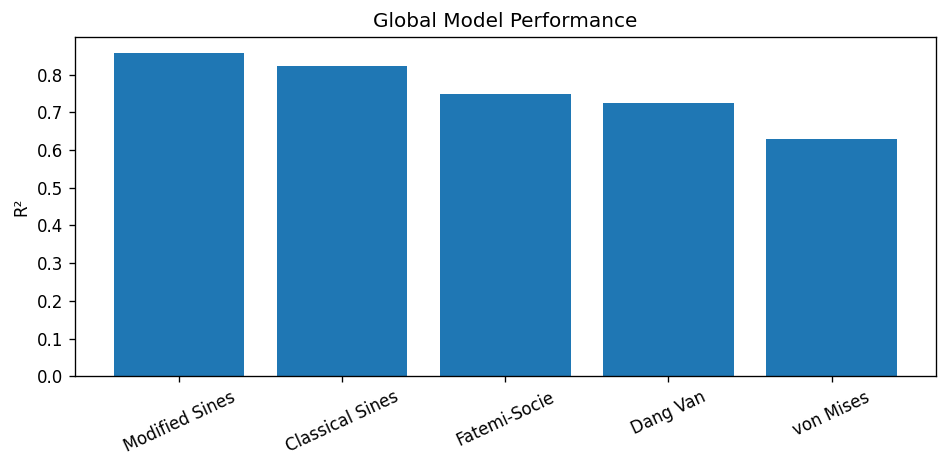

📊 matrix_R2.png


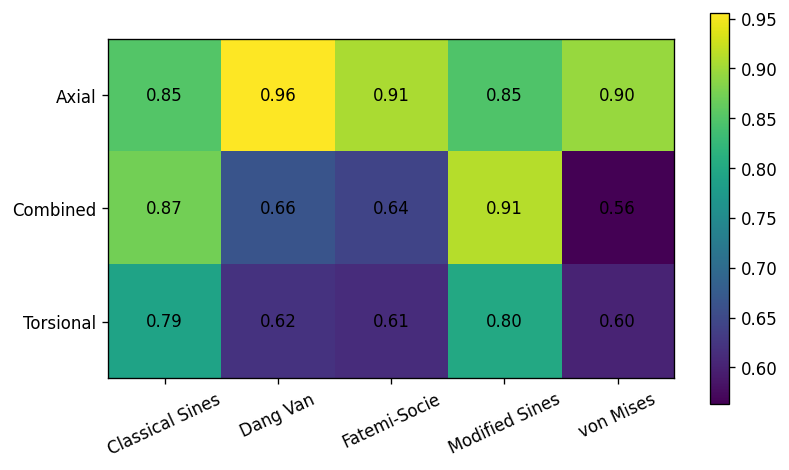

📊 matrix_RMSE.png


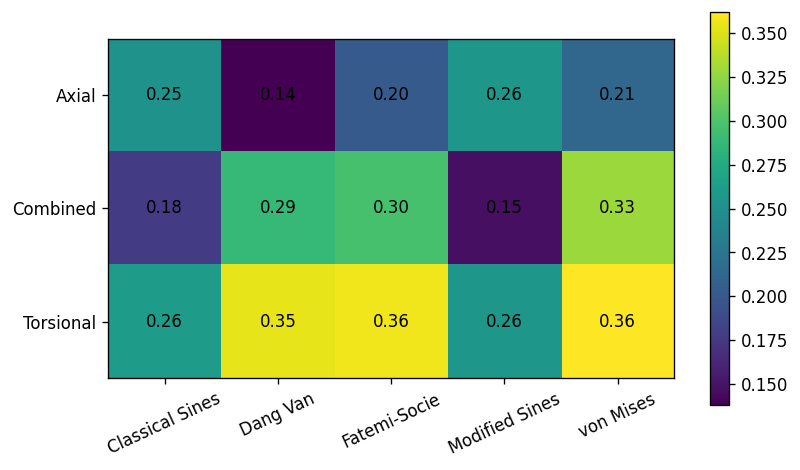

📊 compare_R2.png


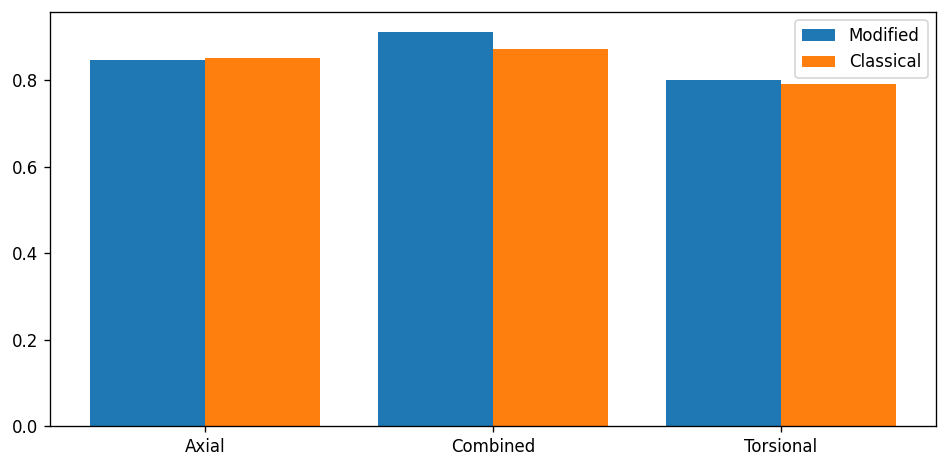


✅ DONE — plots visible + saved


In [ ]:
# ============================================================
# COMPLETE VISUALIZATION PIPELINE (NO FILE DEPENDENCY)
# ============================================================

%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from pathlib import Path

# ============================================================
# DATA (FULLY EMBEDDED — NO FILE NEEDED)
# ============================================================

global_summary = pd.DataFrame([
    ["Modified Sines",   0.856559, 0.189442, 0.231918],
    ["Classical Sines",  0.822045, 0.212473, 0.258316],
    ["Fatemi-Socie",     0.748526, 0.250454, 0.307074],
    ["Dang Van",         0.724595, 0.256801, 0.321353],
    ["von Mises",        0.628943, 0.302279, 0.373007],
], columns=["Model", "R2", "MAE", "RMSE"])

regime_metrics = pd.DataFrame([
    ["Axial", "Modified Sines", 0.847629, 0.256307],
    ["Axial", "Classical Sines",0.850866, 0.253570],
    ["Axial", "Dang Van",       0.955800, 0.138046],
    ["Axial", "Fatemi-Socie",   0.905660, 0.201678],
    ["Axial", "von Mises",      0.895895, 0.211858],

    ["Combined", "Modified Sines", 0.911936, 0.147535],
    ["Combined", "Classical Sines",0.872574, 0.177470],
    ["Combined", "Dang Van",       0.664478, 0.287977],
    ["Combined", "Fatemi-Socie",   0.643682, 0.296767],
    ["Combined", "von Mises",      0.563142, 0.328600],

    ["Torsional", "Modified Sines", 0.799950, 0.256810],
    ["Torsional", "Classical Sines",0.791569, 0.262134],
    ["Torsional", "Dang Van",       0.620738, 0.353600],
    ["Torsional", "Fatemi-Socie",   0.613279, 0.357060],
    ["Torsional", "von Mises",      0.602153, 0.362160],
], columns=["Regime", "Model", "R2", "RMSE"])

# ============================================================
# STYLE
# ============================================================

plt.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 600,
})

OUT_DIR = Path("academic_plots")
OUT_DIR.mkdir(exist_ok=True)

def savefig_clean(fig, filename):
    fig.tight_layout()
    fig.savefig(OUT_DIR / filename)
    print(f"📊 {filename}")
    plt.show()
    plt.close(fig)

# ============================================================
# 1) GLOBAL PLOT
# ============================================================

def plot_global():
    fig, ax = plt.subplots(figsize=(8,4))

    ax.bar(global_summary["Model"], global_summary["R2"])
    ax.set_ylabel("R²")
    ax.set_title("Global Model Performance")
    plt.xticks(rotation=25)

    savefig_clean(fig, "global_R2.png")

# ============================================================
# 2) HEATMAP
# ============================================================

def plot_matrix(metric, name):
    pivot = regime_metrics.pivot(index="Regime", columns="Model", values=metric)

    fig, ax = plt.subplots(figsize=(7,4))
    im = ax.imshow(pivot.values)

    ax.set_xticks(range(len(pivot.columns)))
    ax.set_xticklabels(pivot.columns, rotation=25)
    ax.set_yticks(range(len(pivot.index)))
    ax.set_yticklabels(pivot.index)

    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            ax.text(j, i, f"{pivot.iloc[i,j]:.2f}",
                    ha="center", va="center")

    plt.colorbar(im)

    savefig_clean(fig, name)

# ============================================================
# 3) HEAD-TO-HEAD
# ============================================================

def plot_compare():
    sub = regime_metrics[regime_metrics["Model"].isin(["Modified Sines","Classical Sines"])]
    pivot = sub.pivot(index="Regime", columns="Model", values="R2")

    x = np.arange(len(pivot))

    fig, ax = plt.subplots(figsize=(8,4))
    ax.bar(x-0.2, pivot["Modified Sines"], 0.4, label="Modified")
    ax.bar(x+0.2, pivot["Classical Sines"], 0.4, label="Classical")

    ax.set_xticks(x)
    ax.set_xticklabels(pivot.index)
    ax.legend()

    savefig_clean(fig, "compare_R2.png")

# ============================================================
# RUN ALL
# ============================================================

plot_global()
plot_matrix("R2","matrix_R2.png")
plot_matrix("RMSE","matrix_RMSE.png")
plot_compare()

print("\n✅ DONE — plots visible + saved")

####Regime-Wise Comparative Visualization of Fatigue Model Performance and Modified Sines Win Rate

####Brief description:
This code generates publication-ready comparative figures for evaluating the performance of several multiaxial fatigue-life prediction criteria across different loading regimes. The dataset is embedded directly in the script and includes R2, MAE, and win-rate results for Modified Sines, Classical Sines, Dang Van, Fatemi–Socie, and von Mises under axial, axial with mean stress, combined, combined with mean stresses, torsional, and torsional with mean shear loading.

The script organizes the data by regime and model, then produces three main figures:R2 by loading regime using grouped bar charts, MAE by loading regime using grouped bar charts, Modified Sines win rate showing how often Modified Sines outperforms competing criteria across regimes.

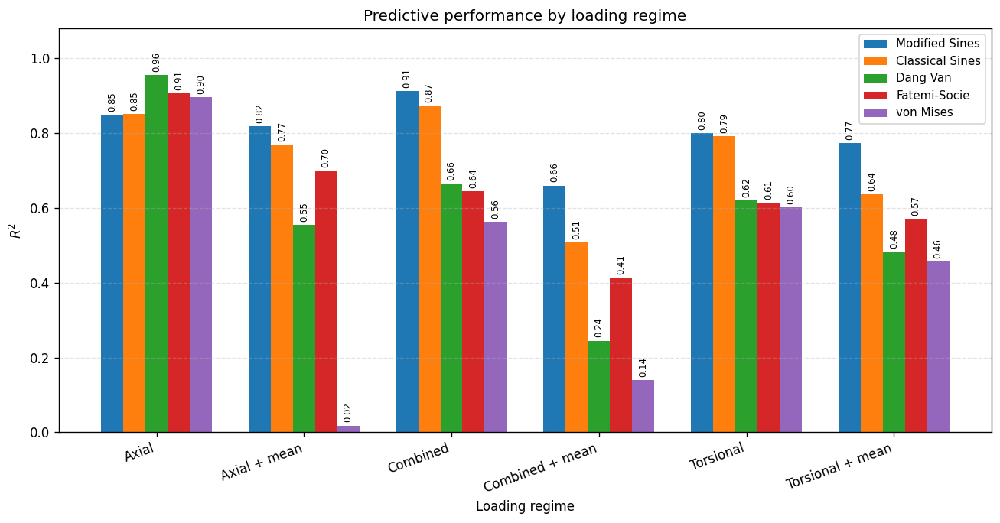

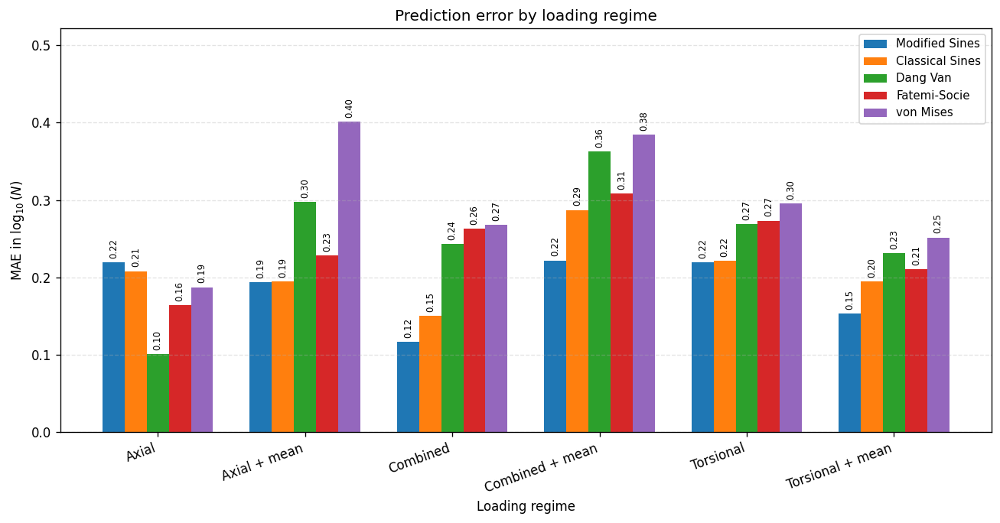

/tmp/ipykernel_703/2108154456.py:158: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(win_df["Regime"], rotation=20, ha="right")


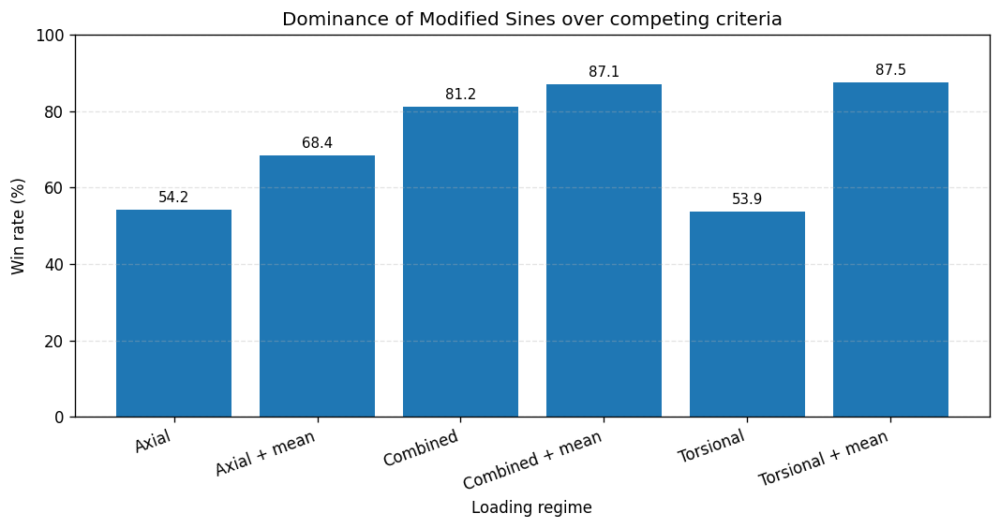

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# -----------------------------
# Data
# -----------------------------
data = [
    ["Axial","Modified Sines",0.8476,0.2198],
    ["Axial","Classical Sines",0.8509,0.2083],
    ["Axial","Dang Van",0.9558,0.1008],
    ["Axial","Fatemi-Socie",0.9057,0.1646],
    ["Axial","von Mises",0.8959,0.1876],

    ["Axial + mean","Modified Sines",0.8184,0.1941],
    ["Axial + mean","Classical Sines",0.7697,0.1948],
    ["Axial + mean","Dang Van",0.5544,0.2977],
    ["Axial + mean","Fatemi-Socie",0.6999,0.2285],
    ["Axial + mean","von Mises",0.0180,0.4015],

    ["Combined","Modified Sines",0.9119,0.1168],
    ["Combined","Classical Sines",0.8726,0.1504],
    ["Combined","Dang Van",0.6645,0.2433],
    ["Combined","Fatemi-Socie",0.6437,0.2630],
    ["Combined","von Mises",0.5631,0.2680],

    ["Combined + mean","Modified Sines",0.6600,0.2222],
    ["Combined + mean","Classical Sines",0.5083,0.2873],
    ["Combined + mean","Dang Van",0.2449,0.3630],
    ["Combined + mean","Fatemi-Socie",0.4135,0.3083],
    ["Combined + mean","von Mises",0.1404,0.3842],

    ["Torsional","Modified Sines",0.8000,0.2194],
    ["Torsional","Classical Sines",0.7916,0.2218],
    ["Torsional","Dang Van",0.6207,0.2688],
    ["Torsional","Fatemi-Socie",0.6133,0.2735],
    ["Torsional","von Mises",0.6022,0.2957],

    ["Torsional + mean","Modified Sines",0.7729,0.1537],
    ["Torsional + mean","Classical Sines",0.6369,0.1951],
    ["Torsional + mean","Dang Van",0.4820,0.2313],
    ["Torsional + mean","Fatemi-Socie",0.5708,0.2107],
    ["Torsional + mean","von Mises",0.4567,0.2517],
]

win_data = [
    ["Axial",54.17],
    ["Axial + mean",68.42],
    ["Combined",81.25],
    ["Combined + mean",87.10],
    ["Torsional",53.85],
    ["Torsional + mean",87.50],
]

df = pd.DataFrame(data, columns=["Regime","Model","R2","MAE"])
win_df = pd.DataFrame(win_data, columns=["Regime","Win_%"])

regime_order = [
    "Axial",
    "Axial + mean",
    "Combined",
    "Combined + mean",
    "Torsional",
    "Torsional + mean",
]
model_order = [
    "Modified Sines",
    "Classical Sines",
    "Dang Van",
    "Fatemi-Socie",
    "von Mises",
]

df["Regime"] = pd.Categorical(df["Regime"], categories=regime_order, ordered=True)
df["Model"] = pd.Categorical(df["Model"], categories=model_order, ordered=True)
df = df.sort_values(["Regime", "Model"])
win_df["Regime"] = pd.Categorical(win_df["Regime"], categories=regime_order, ordered=True)
win_df = win_df.sort_values("Regime")

# -----------------------------
# Helpers
# -----------------------------
def annotate_bars(ax, decimals=2, ypad=0.012, fontsize=8):
    ymax = ax.get_ylim()[1]
    for p in ax.patches:
        h = p.get_height()
        if np.isnan(h):
            continue
        x = p.get_x() + p.get_width() / 2
        ax.text(
            x, h + ypad * ymax, f"{h:.{decimals}f}",
            ha="center", va="bottom", fontsize=fontsize, rotation=90
        )

def save_fig(fig, name):
    fig.savefig(f"{name}.png", dpi=300, bbox_inches="tight")
    fig.savefig(f"{name}.pdf", bbox_inches="tight")

# -----------------------------
# Figure 1: R² by regime
# -----------------------------
pivot_r2 = df.pivot(index="Regime", columns="Model", values="R2").loc[regime_order, model_order]

fig, ax = plt.subplots(figsize=(11, 5.8))
x = np.arange(len(regime_order))
width = 0.15

for i, model in enumerate(model_order):
    vals = pivot_r2[model].values
    ax.bar(x + (i - 2) * width, vals, width=width, label=model)

ax.set_ylabel(r"$R^2$")
ax.set_xlabel("Loading regime")
ax.set_title("Predictive performance by loading regime")
ax.set_xticks(x)
ax.set_xticklabels(regime_order, rotation=20, ha="right")
ax.set_ylim(0, 1.08)
ax.legend(frameon=True, fontsize=9)
ax.grid(axis="y", linestyle="--", alpha=0.35)
annotate_bars(ax, decimals=2, ypad=0.008, fontsize=7)
fig.tight_layout()
save_fig(fig, "Fig1_R2_by_regime")
plt.show()

# -----------------------------
# Figure 2: MAE by regime
# -----------------------------
pivot_mae = df.pivot(index="Regime", columns="Model", values="MAE").loc[regime_order, model_order]

fig, ax = plt.subplots(figsize=(11, 5.8))
for i, model in enumerate(model_order):
    vals = pivot_mae[model].values
    ax.bar(x + (i - 2) * width, vals, width=width, label=model)

ax.set_ylabel(r"MAE in $\log_{10}(N)$")
ax.set_xlabel("Loading regime")
ax.set_title("Prediction error by loading regime")
ax.set_xticks(x)
ax.set_xticklabels(regime_order, rotation=20, ha="right")
ax.set_ylim(0, max(df["MAE"]) * 1.30)
ax.legend(frameon=True, fontsize=9)
ax.grid(axis="y", linestyle="--", alpha=0.35)
annotate_bars(ax, decimals=2, ypad=0.010, fontsize=7)
fig.tight_layout()
save_fig(fig, "Fig2_MAE_by_regime")
plt.show()

# -----------------------------
# Figure 3: Modified Sines win-rate
# -----------------------------
fig, ax = plt.subplots(figsize=(9, 4.8))
bars = ax.bar(win_df["Regime"], win_df["Win_%"])

ax.set_ylabel("Win rate (%)")
ax.set_xlabel("Loading regime")
ax.set_title("Dominance of Modified Sines over competing criteria")
ax.set_ylim(0, 100)
ax.set_xticklabels(win_df["Regime"], rotation=20, ha="right")
ax.grid(axis="y", linestyle="--", alpha=0.35)

for p in bars:
    h = p.get_height()
    ax.text(
        p.get_x() + p.get_width()/2, h + 1.2, f"{h:.1f}",
        ha="center", va="bottom", fontsize=9
    )

fig.tight_layout()
save_fig(fig, "Fig3_WinRate_ModifiedSines")
plt.show()

#####Comprehensive Visualization Suite for Global, Regime-Specific, and Parameter-Level Fatigue Model Comparison

####Brief description:
This code provides a complete, self-contained visualization pipeline for analysing the performance of Modified Sines and competing multiaxial fatigue criteria. It uses embedded global metrics, regime-specific results, and specimen-level win counts, so no external data file is required.

The script compares Modified Sines, Classical Sines, Dang Van, Fatemi–Socie, and von Mises using R2, MAE, and RMSE across axial, torsional, combined, and mean-stress loading regimes. It generates global comparison charts, regime-wise metric matrices, direct Modified-versus-Classical Sines comparisons, win-percentage plots, a polar R2 chart, and a plot of the fitted Modified Sines parameters α, β, and γ.
All figures are formatted for academic use, saved automatically at high resolution in a dedicated output folder, and displayed inline for inspection. The code also includes a utility for reopening and previewing saved image files, making it suitable for journal articles, theses, and conference presentations.

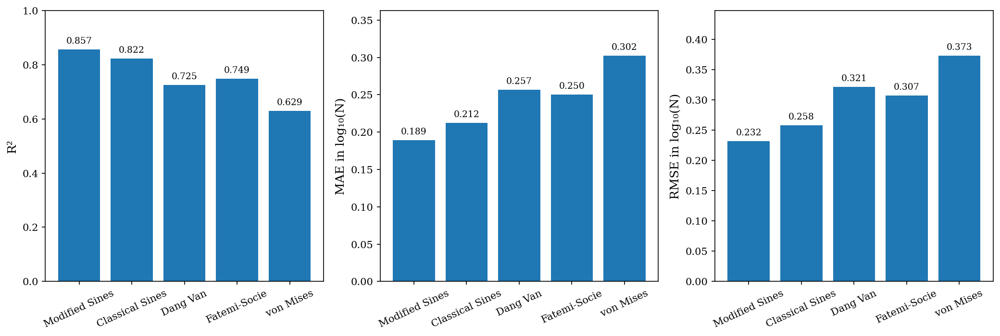

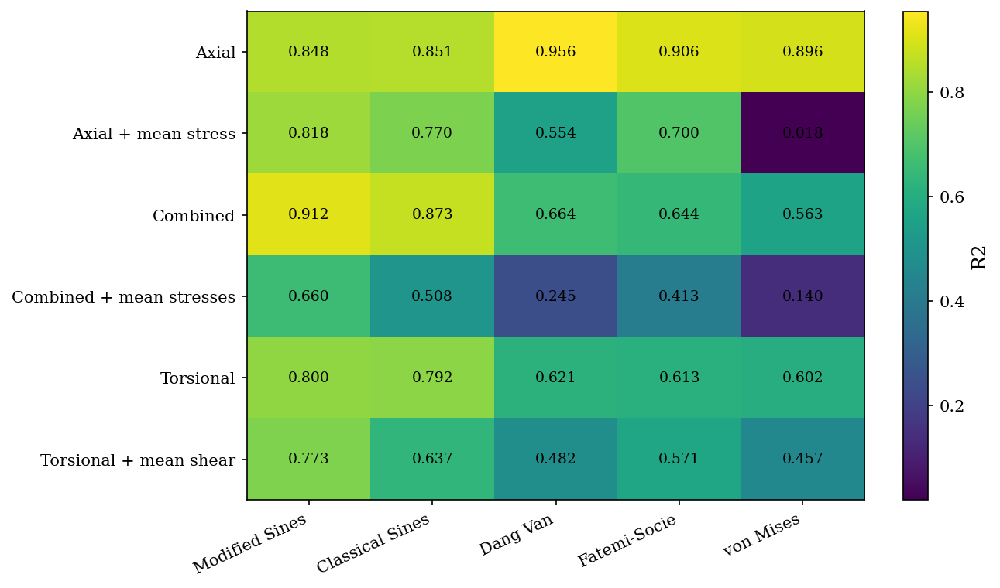

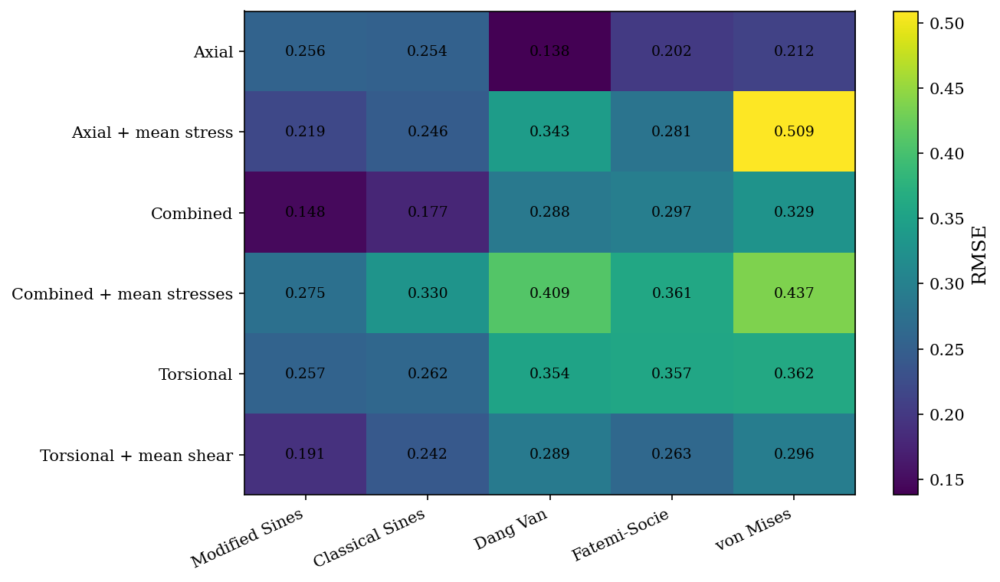

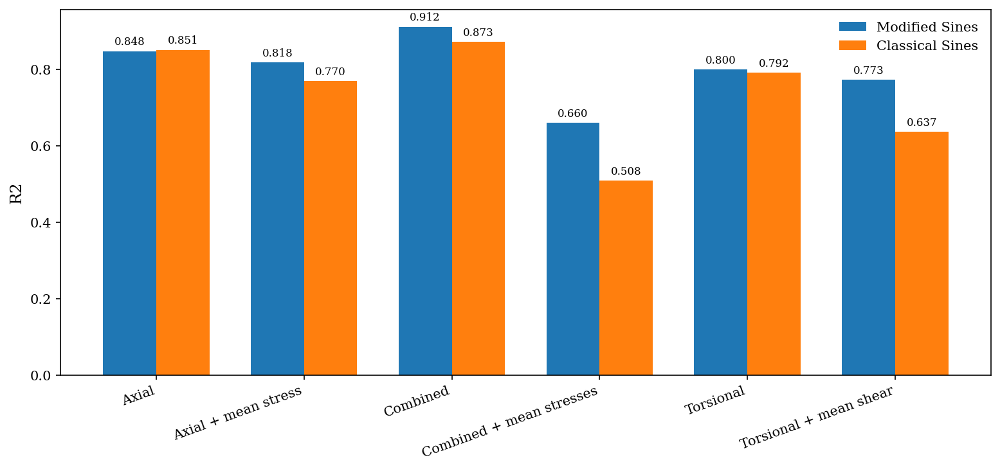

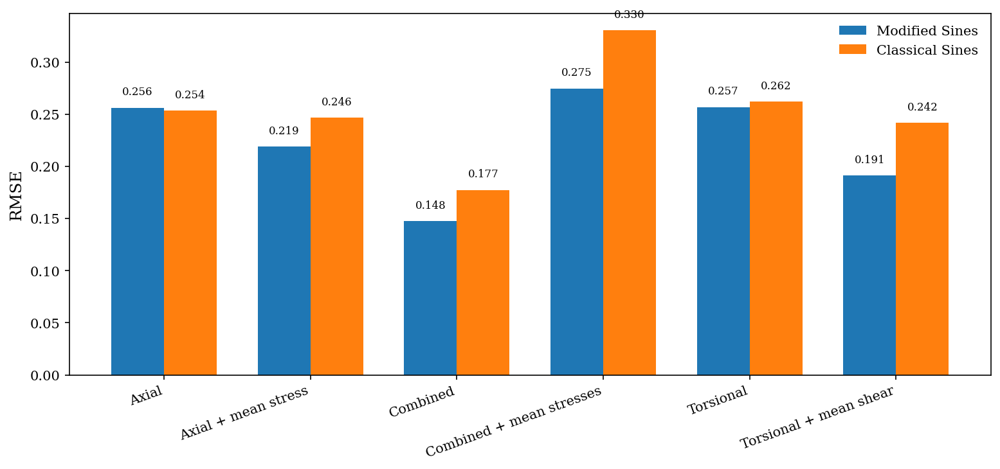

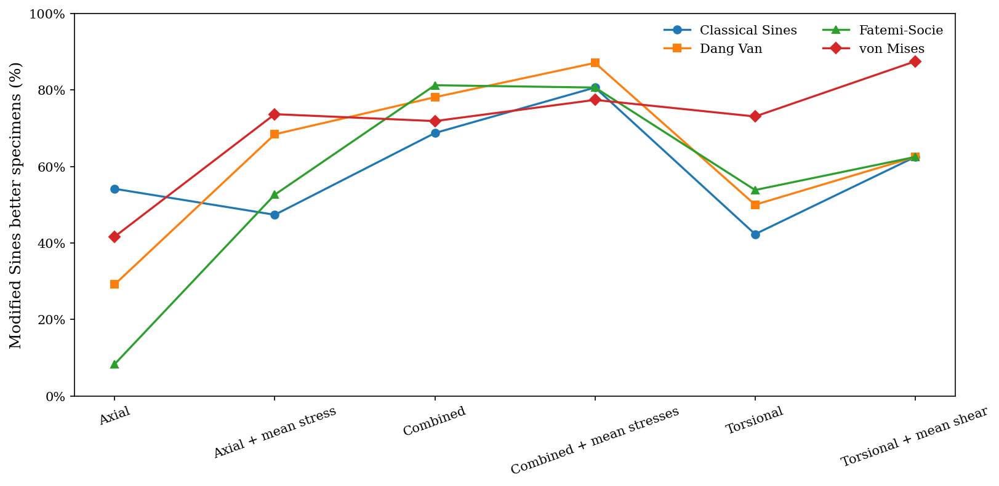

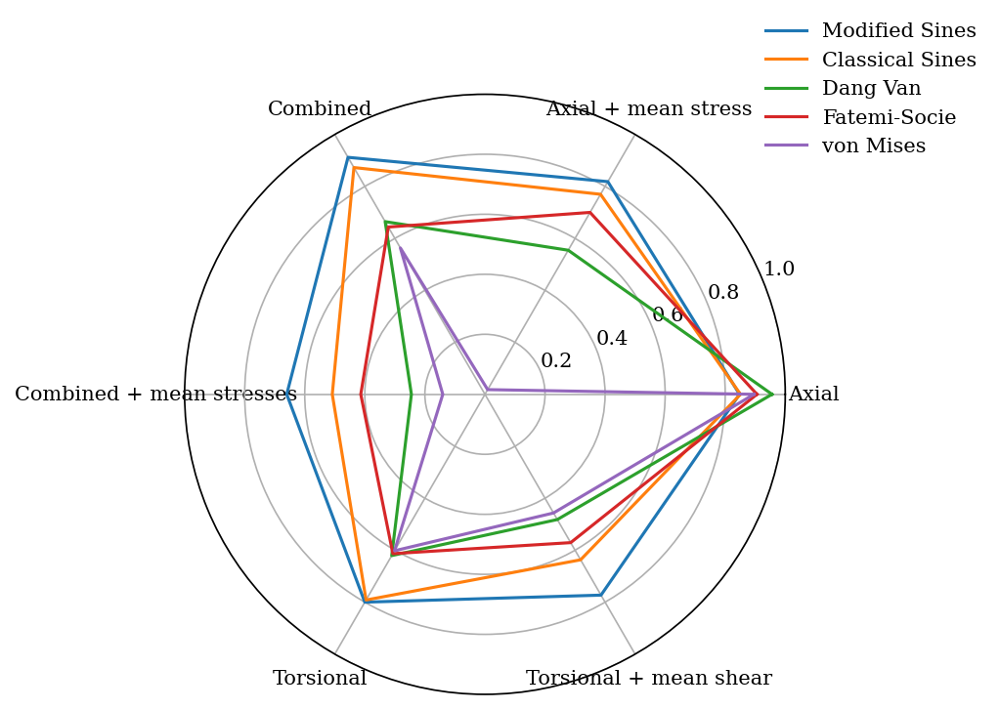

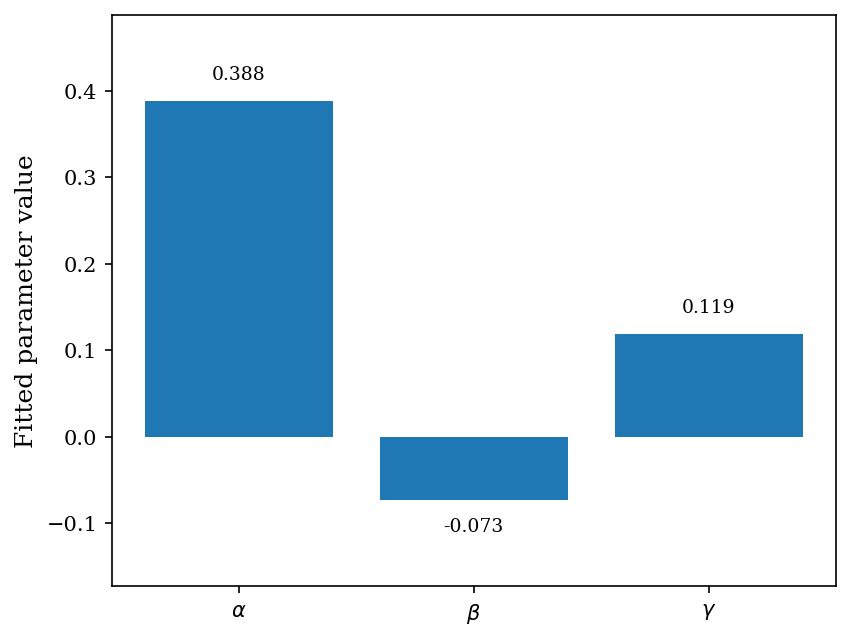


Saved files:
/content/academic_plots_modified_sines/Fig_global_model_comparison.png
/content/academic_plots_modified_sines/Fig_regime_R2_matrix.png
/content/academic_plots_modified_sines/Fig_regime_RMSE_matrix.png
/content/academic_plots_modified_sines/Fig_modified_vs_classical_R2.png
/content/academic_plots_modified_sines/Fig_modified_vs_classical_RMSE.png
/content/academic_plots_modified_sines/Fig_modified_sines_win_percentage.png
/content/academic_plots_modified_sines/Fig_regime_polar_R2.png
/content/academic_plots_modified_sines/Fig_modified_sines_parameters.png

Preview of first saved figure from disk:


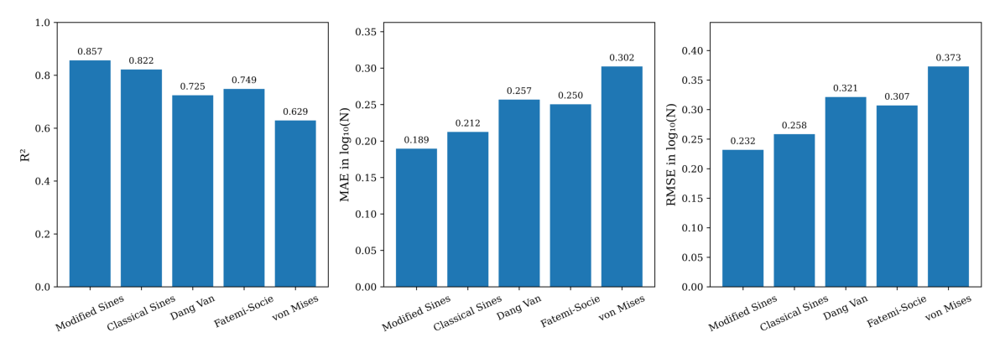

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from pathlib import Path
from IPython.display import display
from PIL import Image

# ============================================================
# 1) INPUT TABLES
#    Replace these with your own exported values if needed
# ============================================================

global_summary = pd.DataFrame([
    ["Modified Sines",   0.856559, 0.189442, 0.231918, 0.388139, -0.073200, 0.118515],
    ["Classical Sines",  0.822045, 0.212473, 0.258316, 0.448899, np.nan,    np.nan],
    ["Fatemi-Socie",     0.748526, 0.250454, 0.307074, 0.433987, np.nan,    np.nan],
    ["Dang Van",         0.724595, 0.256801, 0.321353, 0.171580, np.nan,    np.nan],
    ["von Mises",        0.628943, 0.302279, 0.373007, np.nan,   np.nan,    np.nan],
], columns=["Model", "R2", "MAE", "RMSE", "alpha", "beta", "gamma"])

regime_metrics = pd.DataFrame([
    ["Axial",                    "Modified Sines", 24, 0.847629, 0.219772, 0.256307],
    ["Axial",                    "Classical Sines",24, 0.850866, 0.208256, 0.253570],
    ["Axial",                    "Dang Van",       24, 0.955800, 0.100777, 0.138046],
    ["Axial",                    "Fatemi-Socie",   24, 0.905660, 0.164597, 0.201678],
    ["Axial",                    "von Mises",      24, 0.895895, 0.187583, 0.211858],

    ["Axial + mean stress",      "Modified Sines", 19, 0.818357, 0.194147, 0.218926],
    ["Axial + mean stress",      "Classical Sines",19, 0.769737, 0.194837, 0.246491],
    ["Axial + mean stress",      "Dang Van",       19, 0.554410, 0.297695, 0.342892],
    ["Axial + mean stress",      "Fatemi-Socie",   19, 0.699911, 0.228510, 0.281394],
    ["Axial + mean stress",      "von Mises",      19, 0.017989, 0.401498, 0.509035],

    ["Combined",                 "Modified Sines", 32, 0.911936, 0.116778, 0.147535],
    ["Combined",                 "Classical Sines",32, 0.872574, 0.150442, 0.177470],
    ["Combined",                 "Dang Van",       32, 0.664478, 0.243313, 0.287977],
    ["Combined",                 "Fatemi-Socie",   32, 0.643682, 0.263000, 0.296767],
    ["Combined",                 "von Mises",      32, 0.563142, 0.267998, 0.328600],

    ["Combined + mean stresses", "Modified Sines", 31, 0.659991, 0.222194, 0.274675],
    ["Combined + mean stresses", "Classical Sines",31, 0.508322, 0.287266, 0.330303],
    ["Combined + mean stresses", "Dang Van",       31, 0.244881, 0.362983, 0.409337],
    ["Combined + mean stresses", "Fatemi-Socie",   31, 0.413458, 0.308308, 0.360763],
    ["Combined + mean stresses", "von Mises",      31, 0.140398, 0.384212, 0.436739],

    ["Torsional",                "Modified Sines", 26, 0.799950, 0.219381, 0.256810],
    ["Torsional",                "Classical Sines",26, 0.791569, 0.221775, 0.262134],
    ["Torsional",                "Dang Van",       26, 0.620738, 0.268786, 0.353600],
    ["Torsional",                "Fatemi-Socie",   26, 0.613279, 0.273542, 0.357060],
    ["Torsional",                "von Mises",      26, 0.602153, 0.295699, 0.362160],

    ["Torsional + mean shear",   "Modified Sines",  8, 0.772851, 0.153714, 0.191253],
    ["Torsional + mean shear",   "Classical Sines", 8, 0.636940, 0.195082, 0.241792],
    ["Torsional + mean shear",   "Dang Van",        8, 0.482004, 0.231293, 0.288812],
    ["Torsional + mean shear",   "Fatemi-Socie",    8, 0.570830, 0.210733, 0.262885],
    ["Torsional + mean shear",   "von Mises",       8, 0.456670, 0.251742, 0.295790],
], columns=["Regime", "Model", "n", "R2", "MAE", "RMSE"])

win_counts = pd.DataFrame([
    ["Axial",                    "Classical Sines", 24, 13, 0, 11, 54.166667],
    ["Axial",                    "Dang Van",        24,  7, 0, 17, 29.166667],
    ["Axial",                    "Fatemi-Socie",    24,  2, 0, 22,  8.333333],
    ["Axial",                    "von Mises",       24, 10, 0, 14, 41.666667],

    ["Axial + mean stress",      "Classical Sines", 19,  9, 0, 10, 47.368421],
    ["Axial + mean stress",      "Dang Van",        19, 13, 0,  6, 68.421053],
    ["Axial + mean stress",      "Fatemi-Socie",    19, 10, 0,  9, 52.631579],
    ["Axial + mean stress",      "von Mises",       19, 14, 0,  5, 73.684211],

    ["Combined",                 "Classical Sines", 32, 22, 0, 10, 68.750000],
    ["Combined",                 "Dang Van",        32, 25, 0,  7, 78.125000],
    ["Combined",                 "Fatemi-Socie",    32, 26, 0,  6, 81.250000],
    ["Combined",                 "von Mises",       32, 23, 0,  9, 71.875000],

    ["Combined + mean stresses", "Classical Sines", 31, 25, 0,  6, 80.645161],
    ["Combined + mean stresses", "Dang Van",        31, 27, 0,  4, 87.096774],
    ["Combined + mean stresses", "Fatemi-Socie",    31, 25, 0,  6, 80.645161],
    ["Combined + mean stresses", "von Mises",       31, 24, 0,  7, 77.419355],

    ["Torsional",                "Classical Sines", 26, 11, 0, 15, 42.307692],
    ["Torsional",                "Dang Van",        26, 13, 0, 13, 50.000000],
    ["Torsional",                "Fatemi-Socie",    26, 14, 0, 12, 53.846154],
    ["Torsional",                "von Mises",       26, 19, 0,  7, 73.076923],

    ["Torsional + mean shear",   "Classical Sines",  8,  5, 0,  3, 62.500000],
    ["Torsional + mean shear",   "Dang Van",         8,  5, 0,  3, 62.500000],
    ["Torsional + mean shear",   "Fatemi-Socie",     8,  5, 0,  3, 62.500000],
    ["Torsional + mean shear",   "von Mises",        8,  7, 0,  1, 87.500000],
], columns=["Regime", "Compared_to", "n", "Modified_Sines_better", "Equal", "Worse", "Better_%"])

# ============================================================
# 2) GLOBAL STYLE
# ============================================================

plt.rcParams.update({
    "font.family": "serif",
    "font.size": 11,
    "axes.labelsize": 12,
    "axes.titlesize": 13,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "figure.dpi": 150,
    "savefig.dpi": 600,
})

OUT_DIR = Path("/content/academic_plots_modified_sines")
OUT_DIR.mkdir(parents=True, exist_ok=True)

MODEL_ORDER = ["Modified Sines", "Classical Sines", "Dang Van", "Fatemi-Socie", "von Mises"]
REGIME_ORDER = [
    "Axial",
    "Axial + mean stress",
    "Combined",
    "Combined + mean stresses",
    "Torsional",
    "Torsional + mean shear",
]

def savefig_clean(fig, filename, show=True):
    fig.tight_layout()
    out_path = OUT_DIR / filename
    fig.savefig(out_path, bbox_inches="tight")
    if show:
        plt.show()
    plt.close(fig)
    return out_path

# ============================================================
# 3) GLOBAL COMPARISON PLOT
# ============================================================

def plot_global_summary(df):
    df = df.copy()
    df["Model"] = pd.Categorical(df["Model"], categories=MODEL_ORDER, ordered=True)
    df = df.sort_values("Model")

    metrics = [("R2", "R²"), ("MAE", "MAE in log₁₀(N)"), ("RMSE", "RMSE in log₁₀(N)")]
    fig, axes = plt.subplots(1, 3, figsize=(14, 4.8))

    for ax, (col, label) in zip(axes, metrics):
        vals = df[col].values
        bars = ax.bar(df["Model"], vals)
        ax.set_ylabel(label)
        ax.tick_params(axis="x", rotation=25)

        if col == "R2":
            ax.set_ylim(0, 1.0)
        else:
            ax.set_ylim(0, max(vals) * 1.20)

        for bar, v in zip(bars, vals):
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.015 * ax.get_ylim()[1],
                f"{v:.3f}",
                ha="center",
                va="bottom",
                fontsize=9
            )

    return savefig_clean(fig, "Fig_global_model_comparison.png")

# ============================================================
# 4) REGIME-WISE MATRIX PLOT
# ============================================================

def plot_regime_metric_matrix(df, metric="R2", filename="Fig_regime_R2_matrix.png"):
    pivot = (
        df.pivot(index="Regime", columns="Model", values=metric)
        .reindex(index=REGIME_ORDER, columns=MODEL_ORDER)
    )

    fig, ax = plt.subplots(figsize=(9, 5.2))
    im = ax.imshow(pivot.values, aspect="auto")

    ax.set_xticks(np.arange(len(pivot.columns)))
    ax.set_xticklabels(pivot.columns, rotation=25, ha="right")
    ax.set_yticks(np.arange(len(pivot.index)))
    ax.set_yticklabels(pivot.index)

    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            val = pivot.iloc[i, j]
            ax.text(j, i, f"{val:.3f}", ha="center", va="center", fontsize=9)

    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label(metric)

    return savefig_clean(fig, filename)

# ============================================================
# 5) MODIFIED VS CLASSICAL BY REGIME
# ============================================================

def plot_regime_head_to_head(df, metric="RMSE", filename="Fig_regime_head_to_head_RMSE.png"):
    sub = df[df["Model"].isin(["Modified Sines", "Classical Sines"])].copy()
    sub["Regime"] = pd.Categorical(sub["Regime"], categories=REGIME_ORDER, ordered=True)
    sub = sub.sort_values(["Regime", "Model"])

    pivot = sub.pivot(index="Regime", columns="Model", values=metric).reindex(REGIME_ORDER)

    x = np.arange(len(pivot.index))
    width = 0.36

    fig, ax = plt.subplots(figsize=(10.5, 5))
    b1 = ax.bar(x - width / 2, pivot["Modified Sines"].values, width, label="Modified Sines")
    b2 = ax.bar(x + width / 2, pivot["Classical Sines"].values, width, label="Classical Sines")

    ax.set_xticks(x)
    ax.set_xticklabels(pivot.index, rotation=20, ha="right")
    ax.set_ylabel(metric)
    ax.legend(frameon=False)

    for bars in [b1, b2]:
        for bar in bars:
            h = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                h + 0.01,
                f"{h:.3f}",
                ha="center",
                va="bottom",
                fontsize=8
            )

    return savefig_clean(fig, filename)

# ============================================================
# 6) WIN PERCENTAGE PLOT
# ============================================================

def plot_win_percentages(df):
    df = df.copy()
    df["Regime"] = pd.Categorical(df["Regime"], categories=REGIME_ORDER, ordered=True)
    df = df.sort_values(["Regime", "Compared_to"])

    fig, ax = plt.subplots(figsize=(11, 5.4))

    markers = {
        "Classical Sines": "o",
        "Dang Van": "s",
        "Fatemi-Socie": "^",
        "von Mises": "D",
    }

    for comp, sub in df.groupby("Compared_to"):
        ax.plot(
            sub["Regime"].astype(str),
            sub["Better_%"],
            marker=markers.get(comp, "o"),
            linewidth=1.6,
            markersize=6,
            label=comp
        )

    ax.set_ylabel("Modified Sines better specimens (%)")
    ax.set_ylim(0, 100)
    ax.yaxis.set_major_formatter(mticker.PercentFormatter())
    ax.tick_params(axis="x", rotation=20)
    ax.legend(frameon=False, ncol=2)

    return savefig_clean(fig, "Fig_modified_sines_win_percentage.png")

# ============================================================
# 7) POLAR R2 PLOT
# ============================================================

def plot_regime_polar_r2(df):
    pivot = (
        df.pivot(index="Regime", columns="Model", values="R2")
        .reindex(index=REGIME_ORDER, columns=MODEL_ORDER)
    )

    labels = list(pivot.index)
    angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
    angles += angles[:1]

    fig = plt.figure(figsize=(7.5, 7.5))
    ax = plt.subplot(111, polar=True)

    for model in MODEL_ORDER:
        values = pivot[model].tolist()
        values += values[:1]
        ax.plot(angles, values, linewidth=1.5, label=model)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)
    ax.set_ylim(0, 1.0)
    ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticklabels(["0.2", "0.4", "0.6", "0.8", "1.0"])
    ax.legend(loc="upper right", bbox_to_anchor=(1.35, 1.15), frameon=False)

    return savefig_clean(fig, "Fig_regime_polar_R2.png")

# ============================================================
# 8) MODIFIED SINES PARAMETER PLOT
# ============================================================

def plot_modified_parameters(df):
    row = df[df["Model"] == "Modified Sines"].iloc[0]
    vals = [row["alpha"], row["beta"], row["gamma"]]
    labels = [r"$\alpha$", r"$\beta$", r"$\gamma$"]

    fig, ax = plt.subplots(figsize=(5.8, 4.4))
    bars = ax.bar(labels, vals)
    ax.set_ylabel("Fitted parameter value")

    ymin = min(vals) - 0.1
    ymax = max(vals) + 0.1
    ax.set_ylim(ymin, ymax)

    for bar, v in zip(bars, vals):
        y = v + 0.02 if v >= 0 else v - 0.02
        va = "bottom" if v >= 0 else "top"
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            y,
            f"{v:.3f}",
            ha="center",
            va=va,
            fontsize=9
        )

    return savefig_clean(fig, "Fig_modified_sines_parameters.png")

# ============================================================
# 9) DISPLAY SAVED IMAGE AGAIN
# ============================================================

def show_saved_image(path):
    img = Image.open(path)
    plt.figure(figsize=(10, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()

# ============================================================
# 10) RUN ALL
# ============================================================

saved_files = []

saved_files.append(plot_global_summary(global_summary))
saved_files.append(plot_regime_metric_matrix(regime_metrics, metric="R2",   filename="Fig_regime_R2_matrix.png"))
saved_files.append(plot_regime_metric_matrix(regime_metrics, metric="RMSE", filename="Fig_regime_RMSE_matrix.png"))
saved_files.append(plot_regime_head_to_head(regime_metrics, metric="R2",   filename="Fig_modified_vs_classical_R2.png"))
saved_files.append(plot_regime_head_to_head(regime_metrics, metric="RMSE", filename="Fig_modified_vs_classical_RMSE.png"))
saved_files.append(plot_win_percentages(win_counts))
saved_files.append(plot_regime_polar_r2(regime_metrics))
saved_files.append(plot_modified_parameters(global_summary))

print("\nSaved files:")
for f in saved_files:
    print(f)

# Optional: display the first saved figure again from disk
print("\nPreview of first saved figure from disk:")
show_saved_image(saved_files[0])

####Alloy-Specific Parity Comparison of Multiaxial Fatigue Criteria

###Brief description:
This code loads and standardizes fatigue datasets for S355, 7075-T651, 18Ni300, ResultsS355, and CuZn37, then calibrates five fatigue criteria: Modified Sines, Classical Sines, Dang Van, Fatemi–Socie, and von Mises. For each alloy, it predicts fatigue life through a Basquin-type relation and generates a logarithmic parity plot comparing experimental and predicted lives. The plots include the perfect-prediction line, ±0.1 and ±0.3 log10 error bands, and an embedded performance table reporting R2, MAE, RMSE, 95% prediction-interval width, and empirical coverage.

Mounted at /content/gdrive

Processing: S355
Skipped, file not found: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355.xlsx

Processing: 7075-T651


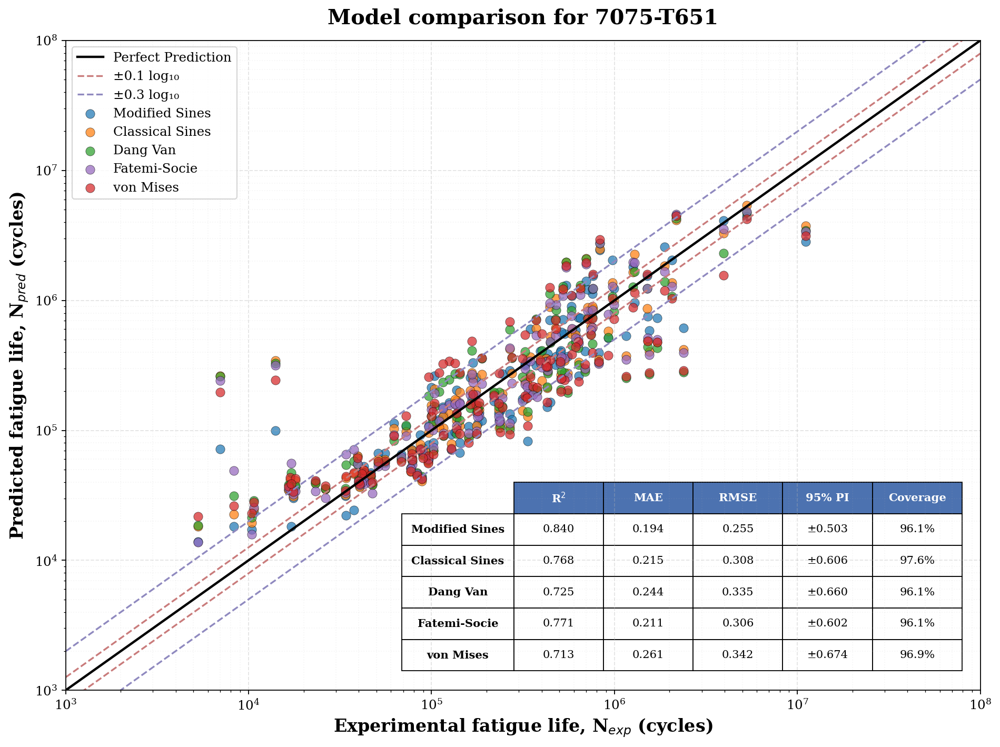

Saved: /content/parity_plots_each_alloy/Parity_7075_T651.png

Processing: 18Ni300


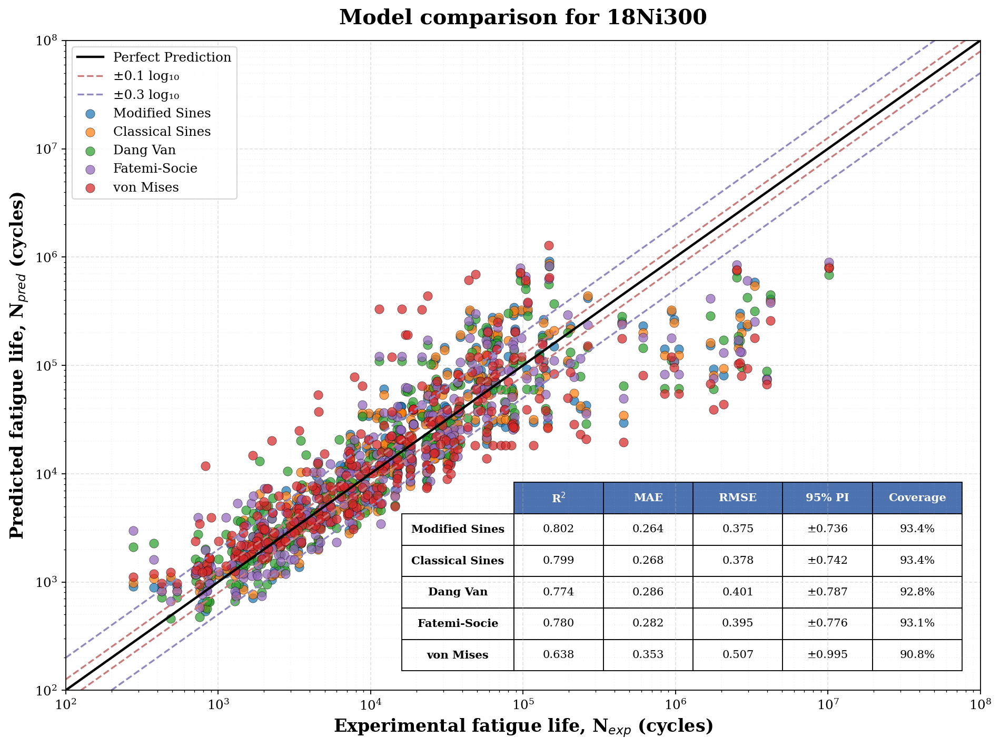

Saved: /content/parity_plots_each_alloy/Parity_18Ni300.png

Processing: ResultsS355
Skipped, file not found: /content/gdrive/My Drive/steel samples/Manuscript#3/ResultsS355.xlsx

Processing: CuZn37


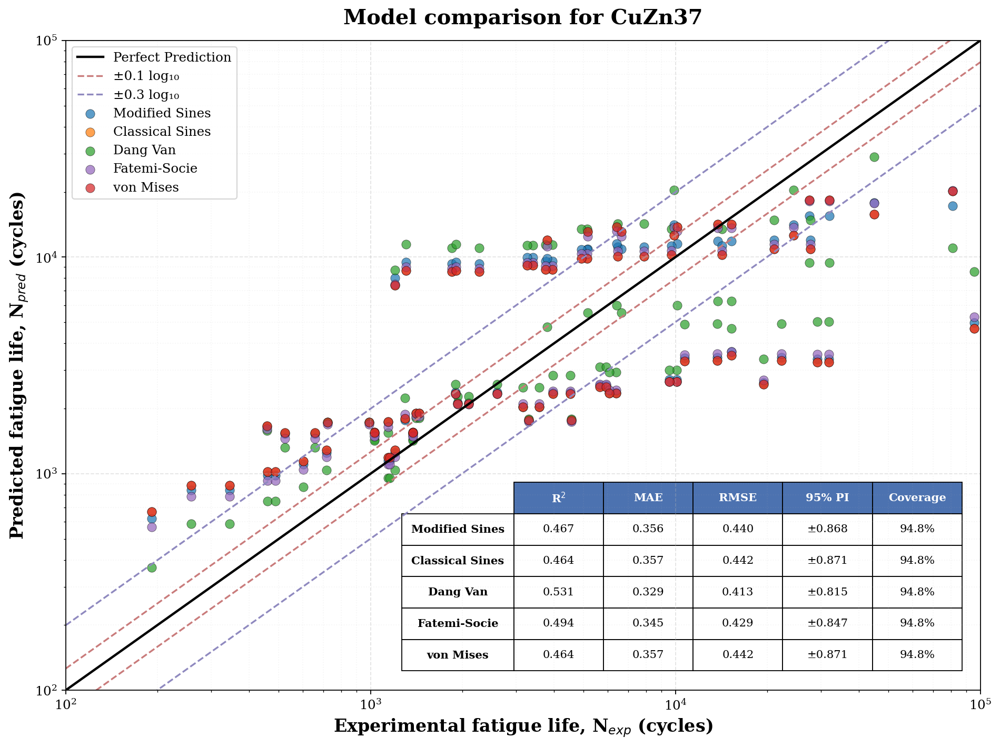

Saved: /content/parity_plots_each_alloy/Parity_CuZn37.png


In [ ]:
# ============================================================
# PARITY PLOTS FOR EACH ALLOY
# Same style as your ResultsS355 figure
# ============================================================

import re
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=True)
    except Exception as e:
        print(f"Drive mount skipped/failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
BASE_DIR = "/content/gdrive/My Drive/steel samples/Manuscript#3/"
OUT_DIR = Path("/content/parity_plots_each_alloy")
OUT_DIR.mkdir(parents=True, exist_ok=True)

DATASETS = [
    ("S355", BASE_DIR + "FatigueDataS355.xlsx"),
    ("7075-T651", BASE_DIR + "FatigueData 7075T651  Clean list.xlsx"),
    ("18Ni300", BASE_DIR + "MS1_FatigueData.xlsx"),
    ("ResultsS355", BASE_DIR + "ResultsS355.xlsx"),
    ("CuZn37", BASE_DIR + "Fatigue data CuZn37.xlsx"),
]

SIGMA_Y = 355.0
EPSILON = 1e-9
ZERO_TOL = 1e-10

# ============================================================
# STYLE
# ============================================================
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 11,
    "axes.labelsize": 15,
    "axes.titlesize": 18,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 11,
    "figure.dpi": 160,
    "savefig.dpi": 500,
})

MODEL_ORDER = [
    "Modified Sines",
    "Classical Sines",
    "Dang Van",
    "Fatemi-Socie",
    "von Mises",
]

MODEL_COLORS = {
    "Modified Sines": "#1f77b4",
    "Classical Sines": "#ff7f0e",
    "Dang Van": "#2ca02c",
    "Fatemi-Socie": "#9467bd",
    "von Mises": "#d62728",
}

# ============================================================
# HELPERS
# ============================================================
def norm_col(name: str) -> str:
    s = str(name).strip().lower()
    s = s.replace("σ", "sig").replace("τ", "tau").replace("ε", "eps").replace("γ", "gamma")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s

def first_existing(df: pd.DataFrame, candidates):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None

def safe_numeric(series):
    return pd.to_numeric(series, errors="coerce")

def is_zero(x: float, tol: float = ZERO_TOL) -> bool:
    return abs(float(x)) <= tol

def sanitize_name(name: str) -> str:
    return (
        name.replace(" ", "_")
        .replace("–", "_")
        .replace("-", "_")
        .replace("(", "")
        .replace(")", "")
        .replace("/", "_")
    )

# ============================================================
# DATA STANDARDIZATION
# ============================================================
def standardize_dataset(df: pd.DataFrame, material_name: str) -> pd.DataFrame:
    out = df.copy()

    col_sa = first_existing(out, [
        "sa", "sig_a_mpa", "sig_a", "sigma_a_mpa", "sigma_a",
        "sig_max_mpa", "sig_max", "sigma_n_a_mpa", "sigma_n_a",
        "sign_a_mpa", "sign_a"
    ])
    col_sm = first_existing(out, [
        "sm", "sig_m_mpa", "sig_m", "sigma_m_mpa", "sigma_m"
    ])
    col_ta = first_existing(out, [
        "ta", "tau_a_mpa", "tau_a", "tau_max_mpa", "tau_max",
        "tau_ns_a_mpa", "tau_ns_a", "tauns_a_mpa", "tauns_a"
    ])
    col_tm = first_existing(out, [
        "tm", "tau_m_mpa", "tau_m"
    ])
    col_n = first_existing(out, [
        "nexp", "n_exp", "n_exp_cycles", "nexp_cycles",
        "nf_exp_cycle", "nf_exp_cycles", "nf_exp",
        "n_fexp_cycle", "2nf"
    ])
    col_crack = first_existing(out, [
        "crack", "crack_", "crack_q"
    ])
    specimen_col = first_existing(out, ["specimen", "label", "id"])

    if col_n is None:
        raise ValueError(f"{material_name}: could not find fatigue life column.")

    std = pd.DataFrame(index=out.index)
    std["Sa"] = safe_numeric(out[col_sa]) if col_sa else np.nan
    std["Ta"] = safe_numeric(out[col_ta]) if col_ta else np.nan
    std["Sm"] = safe_numeric(out[col_sm]) if col_sm else 0.0
    std["Tm"] = safe_numeric(out[col_tm]) if col_tm else 0.0
    std["Nexp"] = safe_numeric(out[col_n])

    if norm_col(col_n) == "2nf":
        std["Nexp"] = std["Nexp"] / 2.0

    if col_crack:
        std["crack"] = safe_numeric(out[col_crack])
    else:
        std["crack"] = 1

    if specimen_col:
        std["Specimen"] = out[specimen_col].astype(str)
    else:
        std["Specimen"] = np.arange(1, len(out) + 1).astype(str)

    std["Sm"] = safe_numeric(std["Sm"]).fillna(0.0)
    std["Tm"] = safe_numeric(std["Tm"]).fillna(0.0)

    std = std.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()
    std = std[(std["Nexp"] > 0) & (std["Sa"] >= 0) & (std["Ta"] >= 0)].copy()

    uniq = set(std["crack"].dropna().unique().tolist())
    if uniq and uniq.issubset({0, 1}):
        std = std[std["crack"] == 1].copy()

    std = std.reset_index(drop=True)
    std["ID"] = np.arange(1, len(std) + 1)
    std["Material"] = material_name
    std["log10_Nexp"] = np.log10(std["Nexp"])
    return std

def load_clean_dataset(filepath: str, material_name: str) -> pd.DataFrame:
    if not Path(filepath).exists():
        raise FileNotFoundError(f"Input file not found: {filepath}")
    df = pd.read_excel(filepath)
    return standardize_dataset(df, material_name)

# ============================================================
# BASQUIN + MODELS
# ============================================================
def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray):
    phi = np.asarray(phi, dtype=float)
    y = np.asarray(y, dtype=float)

    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        "resid": resid,
        "mae": float(np.mean(np.abs(resid))),
        "rmse": float(np.sqrt(np.mean(resid ** 2))),
        "r2": float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan,
    }

def optimize_descriptor(builder, y: np.ndarray, x0, bounds):
    def objective(params):
        phi = builder(params)
        fit = fit_basquin_from_phi(phi, y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array(x0, dtype=float),
        bounds=bounds,
        method="L-BFGS-B"
    )

    params = res.x
    phi = builder(params)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Optimization failed.")
    return params, phi, fit

def run_classical_sines(Sa, Ta, Sm, y):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)

    def build(params):
        alpha = params[0]
        return base + alpha * (Sm / 3.0)

    params, phi, fit = optimize_descriptor(build, y, x0=[0.8], bounds=[(-5, 5)])
    return {"name": "Classical Sines", "phi": phi, "alpha": float(params[0]), **fit}

def run_modified_sines(Sa, Ta, Sm, Tm, y, eps=1e-9):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + eps)
    mean_shear = np.abs(Tm)

    def build(params):
        alpha, beta, gamma = params
        return base + alpha * (Sm / 3.0) + beta * interaction + gamma * mean_shear

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.4, 0.1, 0.1],
        bounds=[(-5, 5), (-5, 5), (-5, 5)]
    )
    return {
        "name": "Modified Sines",
        "phi": phi,
        "alpha": float(params[0]),
        "beta": float(params[1]),
        "gamma": float(params[2]),
        **fit
    }

def run_von_mises(Sa, Ta, y):
    phi = np.sqrt(Sa**2 + 3.0 * Ta**2)
    fit = fit_basquin_from_phi(phi, y)
    return {"name": "von Mises", "phi": phi, **fit}

def run_dang_van_proxy(Sa, Ta, Sm, y):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    hydro_max_proxy = (Sm + Sa) / 3.0

    def build(params):
        a = params[0]
        return base + a * hydro_max_proxy

    params, phi, fit = optimize_descriptor(build, y, x0=[0.2], bounds=[(-5, 5)])
    return {"name": "Dang Van", "phi": phi, "alpha": float(params[0]), **fit}

def run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=355.0):
    thetas = np.linspace(0, np.pi, 721)
    c2 = np.cos(2 * thetas)[None, :]
    s2 = np.sin(2 * thetas)[None, :]

    def fs_phi(k):
        sigma_n_mean = Sm[:, None] / 2.0 + Sm[:, None] / 2.0 * c2 + Tm[:, None] * s2
        sigma_n_amp = np.abs(Sa[:, None] / 2.0 + Sa[:, None] / 2.0 * c2 + Ta[:, None] * s2)
        sigma_n_max = sigma_n_mean + sigma_n_amp
        tau_amp = np.abs(-Sa[:, None] / 2.0 * s2 + Ta[:, None] * c2)
        P = tau_amp * (1.0 + k * sigma_n_max / sigma_y)
        return P.max(axis=1)

    def objective(params):
        k = params[0]
        fit = fit_basquin_from_phi(fs_phi(k), y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(objective, x0=np.array([0.4]), bounds=[(0, 10)], method="L-BFGS-B")
    k = float(res.x[0])
    phi = fs_phi(k)
    fit = fit_basquin_from_phi(phi, y)
    return {"name": "Fatemi-Socie", "phi": phi, "alpha": k, **fit}

def run_all_models(df: pd.DataFrame):
    y = df["log10_Nexp"].values
    Sa = df["Sa"].values
    Ta = df["Ta"].values
    Sm = df["Sm"].values
    Tm = df["Tm"].values

    models = [
        run_modified_sines(Sa, Ta, Sm, Tm, y, eps=EPSILON),
        run_classical_sines(Sa, Ta, Sm, y),
        run_dang_van_proxy(Sa, Ta, Sm, y),
        run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=SIGMA_Y),
        run_von_mises(Sa, Ta, y),
    ]

    out = df.copy()
    for m in models:
        safe = sanitize_name(m["name"])
        out[f"N_pred_{safe}"] = 10 ** m["yhat"]
        out[f"abs_err_{safe}"] = np.abs(m["resid"])

    return models, out

# ============================================================
# METRICS FOR TABLE
# ============================================================
def compute_metrics_from_predictions(y_true: np.ndarray, y_pred: np.ndarray):
    y_true_log = np.log10(y_true)
    y_pred_log = np.log10(y_pred)

    resid = y_pred_log - y_true_log
    r2 = r2_score(y_true_log, y_pred_log)
    mae = mean_absolute_error(y_true_log, y_pred_log)
    rmse = np.sqrt(mean_squared_error(y_true_log, y_pred_log))
    pi95 = 1.96 * np.std(resid, ddof=1)
    lower = y_pred_log - pi95
    upper = y_pred_log + pi95
    coverage = 100.0 * np.mean((y_true_log >= lower) & (y_true_log <= upper))

    return {
        "R2": r2,
        "MAE": mae,
        "RMSE": rmse,
        "PI95": pi95,
        "Coverage": coverage,
    }

# ============================================================
# PLOT
# ============================================================
def plot_alloy_parity(df_pred: pd.DataFrame, alloy_name: str):
    fig, ax = plt.subplots(figsize=(12, 9))
    ax.set_xscale("log")
    ax.set_yscale("log")

    y_true = df_pred["Nexp"].values
    all_vals = [y_true]
    for model in MODEL_ORDER:
        all_vals.append(df_pred[f"N_pred_{sanitize_name(model)}"].values)

    all_vals = np.concatenate(all_vals)
    vmin = 10 ** np.floor(np.log10(all_vals.min()))
    vmax = 10 ** np.ceil(np.log10(all_vals.max()))

    ax.set_xlim(vmin, vmax)
    ax.set_ylim(vmin, vmax)

    xline = np.logspace(np.log10(vmin), np.log10(vmax), 300)

    ax.plot(xline, xline, color="black", linewidth=2.0, label="Perfect Prediction")

    f01 = 10 ** 0.1
    ax.plot(xline, xline * f01, linestyle="--", color="#c97b7b", linewidth=1.5, label="±0.1 log₁₀")
    ax.plot(xline, xline / f01, linestyle="--", color="#c97b7b", linewidth=1.5)

    f03 = 10 ** 0.3
    ax.plot(xline, xline * f03, linestyle="--", color="#8f89bf", linewidth=1.5, label="±0.3 log₁₀")
    ax.plot(xline, xline / f03, linestyle="--", color="#8f89bf", linewidth=1.5)

    for model in MODEL_ORDER:
        pred_col = f"N_pred_{sanitize_name(model)}"
        ax.scatter(
            df_pred["Nexp"],
            df_pred[pred_col],
            s=60,
            alpha=0.72,
            color=MODEL_COLORS[model],
            edgecolor="black",
            linewidth=0.3,
            label=model
        )

    ax.grid(True, which="major", linestyle="--", alpha=0.35)
    ax.grid(True, which="minor", linestyle=":", alpha=0.12)

    ax.set_title(f"Model comparison for {alloy_name}", weight="bold", pad=14)
    ax.set_xlabel("Experimental fatigue life, N$_{exp}$ (cycles)", weight="bold")
    ax.set_ylabel("Predicted fatigue life, N$_{pred}$ (cycles)", weight="bold")

    table_rows = []
    for model in MODEL_ORDER:
        pred_col = f"N_pred_{sanitize_name(model)}"
        m = compute_metrics_from_predictions(df_pred["Nexp"].values, df_pred[pred_col].values)
        table_rows.append([
            model,
            f"{m['R2']:.3f}",
            f"{m['MAE']:.3f}",
            f"{m['RMSE']:.3f}",
            f"±{m['PI95']:.3f}",
            f"{m['Coverage']:.1f}%"
        ])

    table_df = pd.DataFrame(table_rows, columns=["Model", "R2", "MAE", "RMSE", "95% PI", "Coverage"])

    tbl = plt.table(
        cellText=table_df[["R2", "MAE", "RMSE", "95% PI", "Coverage"]].values,
        rowLabels=table_df["Model"].values,
        colLabels=["R$^2$", "MAE", "RMSE", "95% PI", "Coverage"],
        cellLoc="center",
        rowLoc="center",
        bbox=[0.49, 0.03, 0.49, 0.29]
    )
    tbl.auto_set_font_size(False)
    tbl.set_fontsize(9.5)

    for (r, c), cell in tbl.get_celld().items():
        cell.set_linewidth(0.8)
        if r == 0:
            cell.set_text_props(weight="bold", color="white")
            cell.set_facecolor("#4c72b0")
        if c == -1 and r > 0:
            cell.set_text_props(weight="bold")

    ax.legend(loc="upper left", frameon=True)
    fig.tight_layout()
    out_path = OUT_DIR / f"Parity_{sanitize_name(alloy_name)}.png"
    fig.savefig(out_path, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Saved: {out_path}")

# ============================================================
# MAIN
# ============================================================
def main():
    for alloy_name, filepath in DATASETS:
        print(f"\nProcessing: {alloy_name}")
        if not Path(filepath).exists():
            print(f"Skipped, file not found: {filepath}")
            continue

        df = load_clean_dataset(filepath, alloy_name)
        models, df_pred = run_all_models(df)
        plot_alloy_parity(df_pred, alloy_name)

if __name__ == "__main__":
    main()

#####Multi-Material Evaluation of Analytical, Machine-Learning, and Hybrid Fatigue-Life Models

####Brief description:
This code loads and standardizes fatigue datasets for S355, 7075-T651, MS1, CuZn37, and optionally ResultsS355, classifies each specimen by loading regime, and compares several fatigue-life prediction approaches. The evaluated models include Classical Sines, an Upgraded Modified Sines descriptor, von Mises, proxy implementations of Dang Van and Fatemi–Socie, Gaussian Process Regression, and a residual hybrid combining Classical Sines with GPR. Each model is fitted through a Basquin-type relation or direct regression, assessed using R2, MAE, and RMSE in log10(N), and compared specimen by specimen and by loading regime. The workflow exports model summaries, fitted parameters, predictions, residuals, and regime-level errors to Excel for each material and for the combined dataset.

In [ ]:
import re
import numpy as np
import pandas as pd
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, WhiteKernel

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=False)
    except Exception as e:
        print(f"Warning: Google Drive mount skipped or failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
INPUT_FILE_S355 = "/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx"
OUTPUT_FILE_S355 = "Fatigue_models_S355_results.xlsx"

INPUT_FILE_7075 = "/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx"
OUTPUT_FILE_7075 = "Fatigue_models_7075_results.xlsx"

INPUT_FILE_MS1 = "/content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx"
OUTPUT_FILE_MS1 = "Fatigue_models_MS1_results.xlsx"

INPUT_FILE_CuZn37 = "/content/gdrive/My Drive/steel samples/Manuscript#3/Fatigue data CuZn37.xlsx"
OUTPUT_FILE_CuZn37 = "Fatigue_models_CuZn37_results.xlsx"

INPUT_FILE_ResultsS355 = "/content/gdrive/My Drive/steel samples/Manuscript#3/ResultsS355.xlsx"
OUTPUT_FILE_ResultsS355 = "Fatigue_models_ResultsS355.xlsx"

OUTPUT_FILE_COMBINED = "Fatigue_models_combined_all5_results.xlsx"

SIGMA_Y = 355.0
EPSILON = 1e-9
ZERO_TOL = 1e-10


# ============================================================
# HELPERS
# ============================================================
def norm_col(name: str) -> str:
    s = str(name).strip().lower()
    s = s.replace("σ", "sig")
    s = s.replace("τ", "tau")
    s = s.replace("ε", "eps")
    s = s.replace("γ", "gamma")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def first_existing(df: pd.DataFrame, candidates: list[str]):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None


def sanitize_name(name: str) -> str:
    return (
        name.replace(" ", "_")
        .replace("–", "_")
        .replace("-", "_")
        .replace("(", "")
        .replace(")", "")
        .replace("/", "_")
    )


# ============================================================
# DATA LOADING
# ============================================================
def standardize_dataset(df: pd.DataFrame, material_name: str) -> pd.DataFrame:
    out = df.copy()

    col_sa = first_existing(out, [
        "sa",
        "sig_a_mpa", "sig_a",
        "sigma_a_mpa", "sigma_a",
        "sig_max_mpa", "sig_max",
        "sigma_max_mpa", "sigma_max",
        "sigma_n_a_mpa", "sigma_n_a",
        "sign_a_mpa", "sign_a"
    ])

    col_sm = first_existing(out, [
        "sm",
        "sig_m_mpa", "sig_m",
        "sigma_m_mpa", "sigma_m"
    ])

    col_ta = first_existing(out, [
        "ta",
        "tau_a_mpa", "tau_a",
        "tau_max_mpa", "tau_max",
        "tau_ns_a_mpa", "tau_ns_a",
        "tauns_a_mpa", "tauns_a"
    ])

    col_tm = first_existing(out, [
        "tm",
        "tau_m_mpa", "tau_m"
    ])

    col_n = first_existing(out, [
        "nexp", "n_exp", "n_exp_cycles",
        "nexp_cycles",
        "nf_exp_cycle", "nf_exp_cycles", "nf_exp",
        "n_fexp_cycle",
        "2nf"
    ])

    col_crack = first_existing(out, [
        "crack", "crack_", "crack_q"
    ])

    if col_n is None:
        raise ValueError(f"{material_name}: could not find fatigue life column.")

    std = pd.DataFrame(index=out.index)

    std["Sa"] = pd.to_numeric(out[col_sa], errors="coerce") if col_sa else np.nan
    std["Ta"] = pd.to_numeric(out[col_ta], errors="coerce") if col_ta else np.nan
    std["Sm"] = pd.to_numeric(out[col_sm], errors="coerce") if col_sm else 0.0
    std["Tm"] = pd.to_numeric(out[col_tm], errors="coerce") if col_tm else 0.0
    std["Nexp"] = pd.to_numeric(out[col_n], errors="coerce")

    if norm_col(col_n) == "2nf":
        std["Nexp"] = std["Nexp"] / 2.0

    if col_crack:
        std["crack"] = pd.to_numeric(out[col_crack], errors="coerce")
    else:
        std["crack"] = 1

    std = std.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()

    std = std[
        (std["Nexp"] > 0) &
        (std["Sa"] >= 0) &
        (std["Ta"] >= 0)
    ].copy()

    uniq = set(std["crack"].dropna().unique().tolist())
    if uniq and uniq.issubset({0, 1}):
        std = std[std["crack"] == 1].copy()

    std = std.reset_index(drop=True)
    std["ID"] = np.arange(1, len(std) + 1)
    std["Material"] = material_name
    std["log10_Nexp"] = np.log10(std["Nexp"])

    return std


def load_clean_dataset(filepath: str, material_name: str, required: bool = True) -> pd.DataFrame | None:
    path = Path(filepath)

    if not path.exists():
        # Search Google Drive recursively for the exact filename.
        drive_root = Path("/content/gdrive/My Drive")
        matches = [p for p in drive_root.rglob(path.name) if p.is_file()]

        if matches:
            if len(matches) > 1:
                print(f"Warning: multiple files named '{path.name}' were found:")
                for match in matches:
                    print(f"  - {match}")
                print(f"Using: {matches[0]}")
            path = matches[0]
        elif required:
            raise FileNotFoundError(f"Input file not found: {filepath}")
        else:
            print(f"Warning: optional input file not found: {filepath}")
            print("This dataset will be skipped.")
            return None

    print(f"Loading {material_name}: {path}")
    df = pd.read_excel(path)
    standardized = standardize_dataset(df, material_name)

    if standardized.empty:
        raise ValueError(f"{material_name}: no valid records remained after standardization.")

    print(f"Loaded {material_name}: {len(standardized)} specimens")
    return standardized


# ============================================================
# REGIME CLASSIFICATION
# ============================================================
def classify_regime(row: pd.Series) -> str:
    Sm, Tm, Sa, Ta = row["Sm"], row["Tm"], row["Sa"], row["Ta"]

    if Sa > 0 and abs(Sm) <= ZERO_TOL and abs(Tm) <= ZERO_TOL and abs(Ta) <= ZERO_TOL:
        return "Regime A - Pure axial, fully reversed"

    if Ta > 0 and abs(Sm) <= ZERO_TOL and abs(Tm) <= ZERO_TOL and abs(Sa) <= ZERO_TOL:
        return "Regime B - Pure torsion, fully reversed"

    if Sa > 0 and Ta > 0 and abs(Sm) <= ZERO_TOL and abs(Tm) <= ZERO_TOL:
        return "Regime C - Proportional axial-torsion, fully reversed"

    if Ta > 0 and abs(Tm) > ZERO_TOL and abs(Sm) <= ZERO_TOL and abs(Sa) <= ZERO_TOL:
        return "Regime D - Torsion with non-zero mean shear"

    if Sa > 0 and Ta > 0 and (abs(Sm) > ZERO_TOL or abs(Tm) > ZERO_TOL):
        return "Regime E - Combined axial-torsion with mean stresses"

    if Sa > 0 and abs(Sm) > ZERO_TOL and abs(Ta) <= ZERO_TOL and abs(Tm) <= ZERO_TOL:
        return "Regime F - Axial with mean stress"

    return "Other"


# ============================================================
# GENERIC BASQUIN FITTER
# ============================================================
def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray) -> dict | None:
    """
    Fit:
        y = A + B*log10(phi)
    """
    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def optimize_descriptor(builder, y: np.ndarray, x0: list[float], bounds: list[tuple[float, float]]):
    def objective(params):
        phi = builder(params)
        fit = fit_basquin_from_phi(phi, y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array(x0, dtype=float),
        bounds=bounds,
        method="L-BFGS-B"
    )

    params = res.x
    phi = builder(params)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Optimization failed: invalid descriptor values.")

    return params, phi, fit


# ============================================================
# MODEL DEFINITIONS
# ============================================================
def run_classical_sines(Sa, Ta, Sm, y):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)

    def build(params):
        alpha = params[0]
        return base + alpha * (Sm / 3.0)

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.8],
        bounds=[(-5, 5)]
    )

    return {
        "name": "Classical Sines",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "lambda": np.nan,
        "phi": phi,
        **fit,
    }


def run_modified_sines_upgraded(Sa, Ta, Sm, Tm, y, eps=1e-9):
    """
    Upgraded Modified Sines:
        phi = sqrt(Sa^2/3 + Ta^2)
              + alpha*(Sm/3)
              + beta*(|Sa||Ta|/(|Sa|+|Ta|+eps))
              + gamma*|Tm|
              + lambda*(Sa^2/(Sa^2 + 3*Ta^2 + eps))*|Sa|
    """
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + eps)
    mean_shear = np.abs(Tm)
    axial_weight = (Sa**2) / (Sa**2 + 3.0 * Ta**2 + eps)
    axial_strength = axial_weight * np.abs(Sa)

    def build(params):
        alpha, beta, gamma, lam = params
        return (
            base
            + alpha * (Sm / 3.0)
            + beta * interaction
            + gamma * mean_shear
            + lam * axial_strength
        )

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.4, 0.1, 0.1, 0.1],
        bounds=[(-5, 5), (-5, 5), (-5, 5), (-5, 5)]
    )

    return {
        "name": "Modified Sines Upgraded",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3) + beta*(|Sa||Ta|/(|Sa|+|Ta|+eps)) + gamma*|Tm| + lambda*(Sa^2/(Sa^2+3*Ta^2+eps))*|Sa|",
        "alpha": float(params[0]),
        "beta": float(params[1]),
        "gamma": float(params[2]),
        "lambda": float(params[3]),
        "phi": phi,
        **fit,
    }


def run_von_mises(Sa, Ta, y):
    phi = np.sqrt(Sa**2 + 3.0 * Ta**2)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("von Mises fit failed.")

    return {
        "name": "von Mises",
        "formula": "phi = sqrt(Sa^2 + 3*Ta^2)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "lambda": np.nan,
        "phi": phi,
        **fit,
    }


def run_dang_van_proxy(Sa, Ta, Sm, y):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    hydro_max_proxy = (Sm + Sa) / 3.0

    def build(params):
        a = params[0]
        return base + a * hydro_max_proxy

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.2],
        bounds=[(-5, 5)]
    )

    return {
        "name": "Dang Van (proxy)",
        "formula": "phi = sqrt(Sa^2/3 + Ta^2) + a*((Sm + Sa)/3)",
        "alpha": float(params[0]),
        "beta": np.nan,
        "gamma": np.nan,
        "lambda": np.nan,
        "phi": phi,
        **fit,
    }


def run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=355.0):
    thetas = np.linspace(0, np.pi, 721)
    c2 = np.cos(2 * thetas)[None, :]
    s2 = np.sin(2 * thetas)[None, :]

    def fs_phi(k):
        sigma_n_mean = Sm[:, None] / 2.0 + Sm[:, None] / 2.0 * c2 + Tm[:, None] * s2
        sigma_n_amp = np.abs(Sa[:, None] / 2.0 + Sa[:, None] / 2.0 * c2 + Ta[:, None] * s2)
        sigma_n_max = sigma_n_mean + sigma_n_amp
        tau_amp = np.abs(-Sa[:, None] / 2.0 * s2 + Ta[:, None] * c2)
        P = tau_amp * (1.0 + k * sigma_n_max / sigma_y)
        return P.max(axis=1)

    def objective(params):
        k = params[0]
        fit = fit_basquin_from_phi(fs_phi(k), y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array([0.4]),
        bounds=[(0, 10)],
        method="L-BFGS-B"
    )

    k = float(res.x[0])
    phi = fs_phi(k)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Fatemi-Socie proxy fit failed.")

    return {
        "name": "Fatemi-Socie (proxy)",
        "formula": "phi = max_theta[tau_a(theta)*(1 + k*sigma_n,max(theta)/sigma_y)]",
        "alpha": k,
        "beta": np.nan,
        "gamma": np.nan,
        "lambda": np.nan,
        "phi": phi,
        **fit,
    }


def run_gpr(df: pd.DataFrame):
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("gpr", GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=42
        )),
    ])

    model.fit(X, y)
    yhat = model.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "name": "GPR (in-sample)",
        "formula": "GPR on [Sm, Tm, Sa, Ta]",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "lambda": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


def run_hybrid_residual(df: pd.DataFrame, sines_model: dict):
    X = df[["Sm", "Tm", "Sa", "Ta"]].values.astype(float)
    y = df["log10_Nexp"].values.astype(float)
    resid_target = sines_model["resid"]

    kernel = (
        C(1.0, (1e-3, 1e3))
        * RBF(length_scale=np.ones(X.shape[1]), length_scale_bounds=(1e-2, 1e3))
        + WhiteKernel(noise_level=1e-3, noise_level_bounds=(1e-8, 1e1))
    )

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("gpr", GaussianProcessRegressor(
            kernel=kernel,
            normalize_y=True,
            n_restarts_optimizer=3,
            random_state=42
        )),
    ])

    model.fit(X, resid_target)
    resid_corr = model.predict(X)
    yhat = sines_model["yhat"] + resid_corr
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    mae = float(np.mean(np.abs(resid)))
    rmse = float(np.sqrt(np.mean(resid ** 2)))
    r2 = float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan

    return {
        "name": "Hybrid-Residual (in-sample)",
        "formula": "y_hybrid = y_sines + GPR(residual_sines)",
        "alpha": np.nan,
        "beta": np.nan,
        "gamma": np.nan,
        "lambda": np.nan,
        "phi": np.nan * np.ones_like(y),
        "A": np.nan,
        "B": np.nan,
        "yhat": yhat,
        "resid": resid,
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
    }


# ============================================================
# EXPORT / REPORT
# ============================================================
def run_all_models_and_export(df: pd.DataFrame, output_file: str, dataset_label: str):
    df = df.copy()
    df["Regime"] = df.apply(classify_regime, axis=1)

    y = df["log10_Nexp"].values
    Sa = df["Sa"].values
    Ta = df["Ta"].values
    Sm = df["Sm"].values
    Tm = df["Tm"].values

    # Analytical models
    model_sines = run_classical_sines(Sa, Ta, Sm, y)
    model_mod_u = run_modified_sines_upgraded(Sa, Ta, Sm, Tm, y, eps=EPSILON)
    model_vm = run_von_mises(Sa, Ta, y)
    model_dv = run_dang_van_proxy(Sa, Ta, Sm, y)
    model_fs = run_fatemi_socie_proxy(Sa, Ta, Sm, Tm, y, sigma_y=SIGMA_Y)

    # ML models
    model_gpr = run_gpr(df)
    model_hybrid = run_hybrid_residual(df, model_sines)

    models = [
        model_mod_u,
        model_sines,
        model_dv,
        model_vm,
        model_fs,
        model_gpr,
        model_hybrid
    ]

    summary_rows = []
    for m in models:
        summary_rows.append({
            "Dataset": dataset_label,
            "Model": m["name"],
            "Formula": m["formula"],
            "alpha": m["alpha"],
            "beta": m["beta"],
            "gamma": m["gamma"],
            "lambda": m["lambda"],
            "A": m["A"],
            "B": m["B"],
            "R2": m["r2"],
            "MAE_log10N": m["mae"],
            "RMSE_log10N": m["rmse"],
        })

    summary = pd.DataFrame(summary_rows).sort_values("R2", ascending=False).reset_index(drop=True)

    out = df.copy()

    for m in models:
        safe = sanitize_name(m["name"])

        if isinstance(m["phi"], np.ndarray):
            out[f"phi_{safe}"] = m["phi"]
        else:
            out[f"phi_{safe}"] = np.nan

        out[f"y_pred_{safe}"] = m["yhat"]
        out[f"N_pred_{safe}"] = 10 ** m["yhat"]
        out[f"residual_{safe}"] = m["resid"]
        out[f"abs_err_{safe}"] = np.abs(m["resid"])

    modified_col = "abs_err_Modified_Sines_Upgraded"
    counts_rows = []

    for m in models:
        safe = sanitize_name(m["name"])
        other_col = f"abs_err_{safe}"

        if other_col == modified_col:
            continue

        better = int((out[modified_col] < out[other_col]).sum())
        equal = int((out[modified_col] == out[other_col]).sum())
        worse = len(out) - better - equal

        counts_rows.append({
            "Dataset": dataset_label,
            "Modified Sines Upgraded vs": m["name"],
            "Better specimens": better,
            "Equal specimens": equal,
            "Worse specimens": worse,
            "Better %": 100.0 * better / len(out),
        })

    counts = pd.DataFrame(counts_rows)

    regime_cols = ["ID", "Material", "Regime", "Nexp", "log10_Nexp"]
    regime_out = out[regime_cols].copy()

    for m in models:
        safe = sanitize_name(m["name"])
        regime_out[f"abs_err_{safe}"] = out[f"abs_err_{safe}"]

    regime_summary = regime_out.groupby(["Material", "Regime"]).mean(numeric_only=True).reset_index()

    with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
        summary.to_excel(writer, sheet_name="Summary", index=False)
        counts.to_excel(writer, sheet_name="Modified_vs_Others", index=False)
        regime_summary.to_excel(writer, sheet_name="Regime_mean_errors", index=False)
        out.to_excel(writer, sheet_name="All_specimens", index=False)

    print(f"\n=== MODEL SUMMARY: {dataset_label} ===")
    print(summary[["Model", "R2", "MAE_log10N", "RMSE_log10N"]].to_string(index=False))

    print("\n=== MODIFIED SINES UPGRADED PARAMETERS ===")
    mod_row = summary[summary["Model"] == "Modified Sines Upgraded"].iloc[0]
    print(f"alpha  = {mod_row['alpha']:.6f}")
    print(f"beta   = {mod_row['beta']:.6f}")
    print(f"gamma  = {mod_row['gamma']:.6f}")
    print(f"lambda = {mod_row['lambda']:.6f}")
    print(f"A      = {mod_row['A']:.6f}")
    print(f"B      = {mod_row['B']:.6f}")

    print(f"\nResults exported to: {output_file}")


# ============================================================
# MAIN
# ============================================================
def main():
    df_s355 = load_clean_dataset(INPUT_FILE_S355, material_name="S355")
    df_7075 = load_clean_dataset(INPUT_FILE_7075, material_name="7075-T651")
    df_ms1 = load_clean_dataset(INPUT_FILE_MS1, material_name="MS1")
    df_cuzn37 = load_clean_dataset(INPUT_FILE_CuZn37, material_name="CuZn37")
    df_results_s355 = load_clean_dataset(
        INPUT_FILE_ResultsS355,
        material_name="ResultsS355",
        required=False,
    )

    available_datasets = [
        ("S355", df_s355),
        ("7075-T651", df_7075),
        ("MS1", df_ms1),
        ("CuZn37", df_cuzn37),
    ]

    if df_results_s355 is not None:
        available_datasets.append(("ResultsS355", df_results_s355))

    df_combined = pd.concat(
        [dataset for _, dataset in available_datasets],
        ignore_index=True,
    )
    df_combined["ID"] = np.arange(1, len(df_combined) + 1)

    run_all_models_and_export(df_s355, OUTPUT_FILE_S355, dataset_label="S355")
    run_all_models_and_export(df_7075, OUTPUT_FILE_7075, dataset_label="7075-T651")
    run_all_models_and_export(df_ms1, OUTPUT_FILE_MS1, dataset_label="MS1")
    run_all_models_and_export(df_cuzn37, OUTPUT_FILE_CuZn37, dataset_label="CuZn37")

    if df_results_s355 is not None:
        run_all_models_and_export(
            df_results_s355,
            OUTPUT_FILE_ResultsS355,
            dataset_label="ResultsS355",
        )

    run_all_models_and_export(
        df_combined,
        OUTPUT_FILE_COMBINED,
        dataset_label="Combined " + " + ".join(label for label, _ in available_datasets),
    )


if __name__ == "__main__":
    main()

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Loading S355: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Loaded S355: 133 specimens
Loading 7075-T651: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx
Loaded 7075-T651: 127 specimens
Loading MS1: /content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx
Loaded MS1: 304 specimens
Loading CuZn37: /content/gdrive/My Drive/steel samples/Manuscript#3/Fatigue data CuZn37.xlsx
Loaded CuZn37: 77 specimens
This dataset will be skipped.

=== MODEL SUMMARY: S355 ===
                      Model       R2  MAE_log10N  RMSE_log10N
Hybrid-Residual (in-sample) 0.954723    0.099321     0.126255
            GPR (in-sample) 0.922206    0.131855     0.165493
    Modified Sines Upgraded 0.870714    0.172458     0.213345
            Classical Sines 0.823679    0.204624     0.249148


####Cross-Alloy Ranking of Multiaxial Fatigue Criteria Using Accuracy, Uncertainty, and Calibration Metrics

###Brief description:
This code compares five fatigue criteria—Modified Sines, Classical Sines, Dang Van, Fatemi–Socie, and von Mises—across S355, 7075-T651, 18Ni300, ResultsS355, and CuZn37 datasets. It ranks each model within each alloy using predictive accuracy (R
2
, MAE, RMSE), prediction-interval width, and closeness of empirical coverage to 95%. A composite rank is then calculated to summarise overall performance. The workflow generates rank-trend plots, average-rank bar charts, and a composite-rank heatmap, and exports both alloy-level and average model rankings to Excel.


=== RANK TABLE BY ALLOY ===
      Alloy           Model  rank_Accuracy  rank_PI95  rank_Calibration  rank_Composite
       S355  Modified Sines            1.0        1.0               2.0             1.0
       S355 Classical Sines            2.0        2.0               2.0             2.0
       S355        Dang Van            4.0        4.0               2.0             4.0
       S355    Fatemi-Socie            3.0        3.0               1.0             3.0
       S355       von Mises            5.0        5.0               2.0             5.0
  7075-T651  Modified Sines            1.0        1.0               1.0             1.0
  7075-T651 Classical Sines            3.0        3.0               5.0             4.0
  7075-T651        Dang Van            4.0        4.0               1.0             3.0
  7075-T651    Fatemi-Socie            2.0        2.0               1.0             2.0
  7075-T651       von Mises            5.0        5.0               4.0             5.0
   

/tmp/ipykernel_703/1570752764.py:103: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(add_ranks)
/tmp/ipykernel_703/1570752764.py:145: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  rank_df.groupby("Model")[[


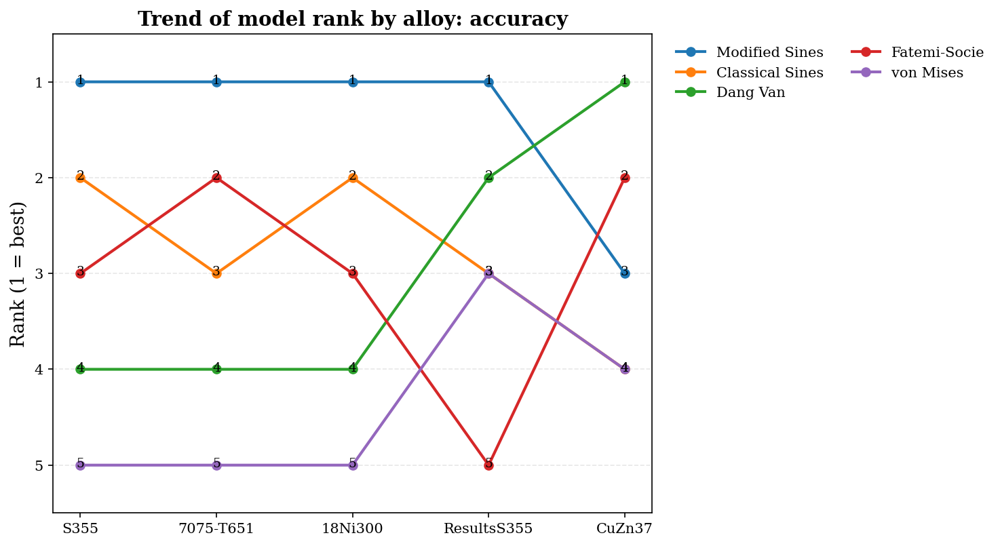

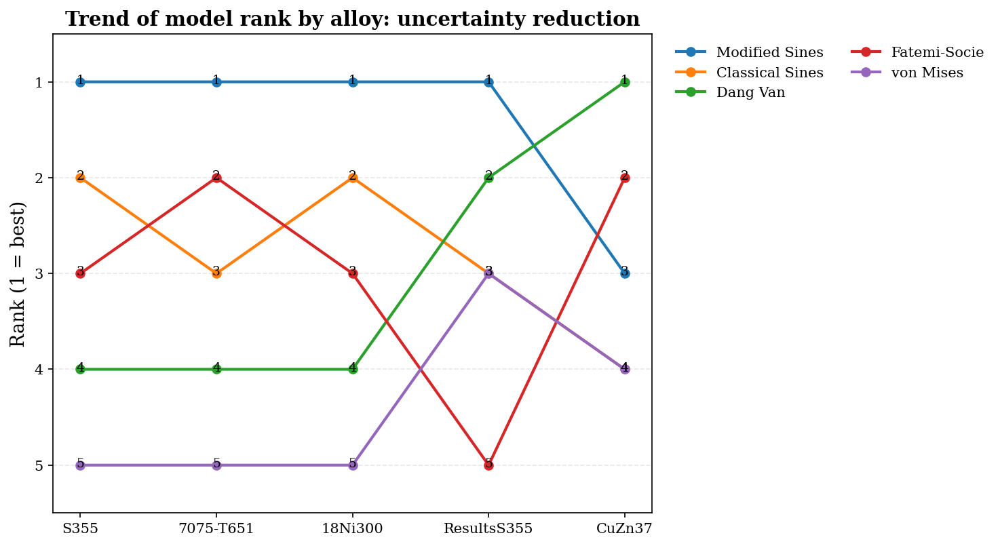

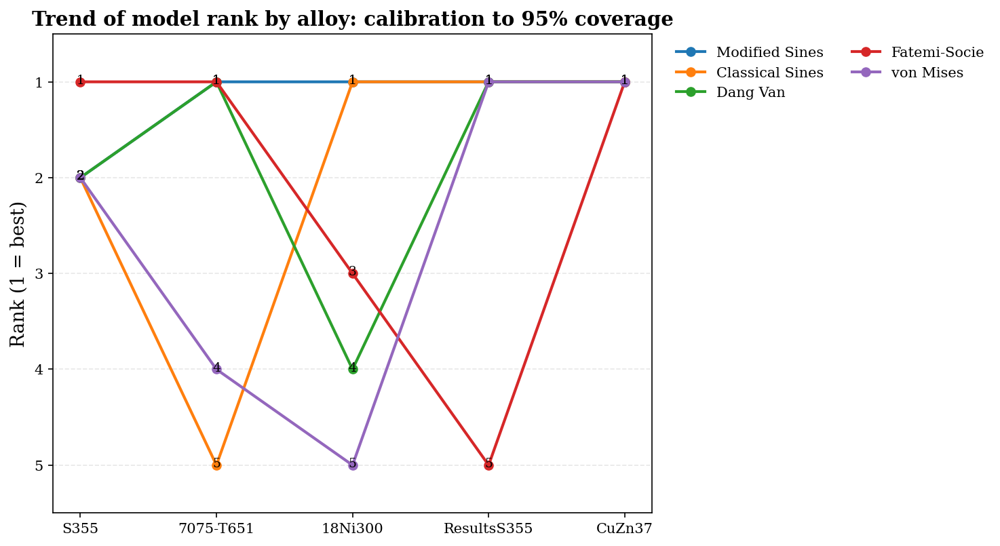

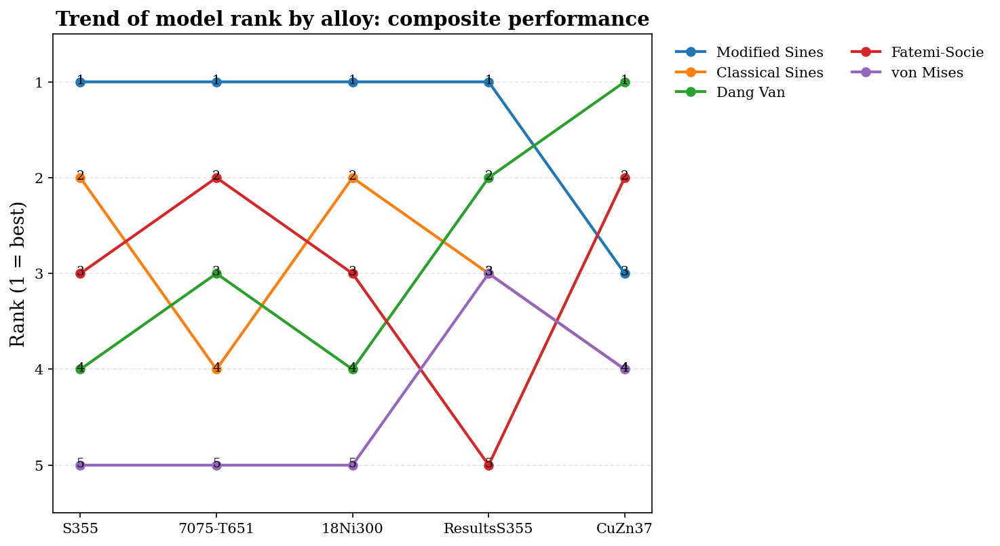

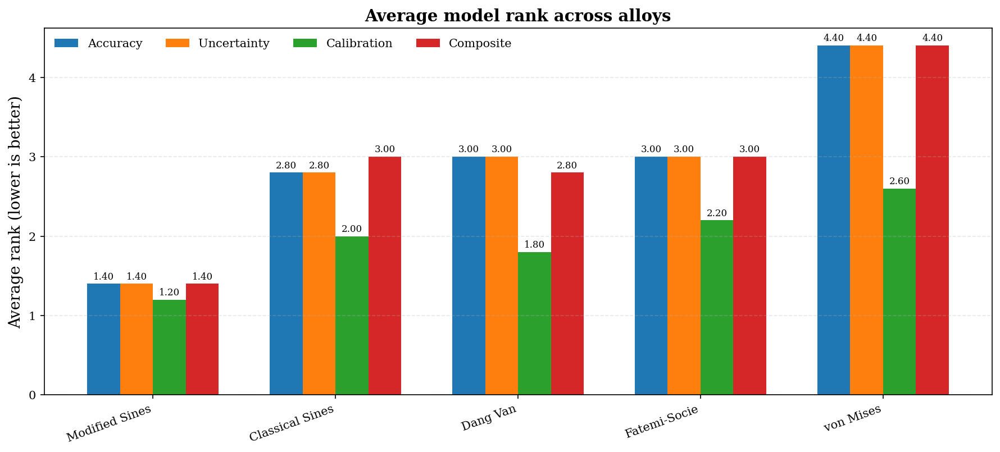

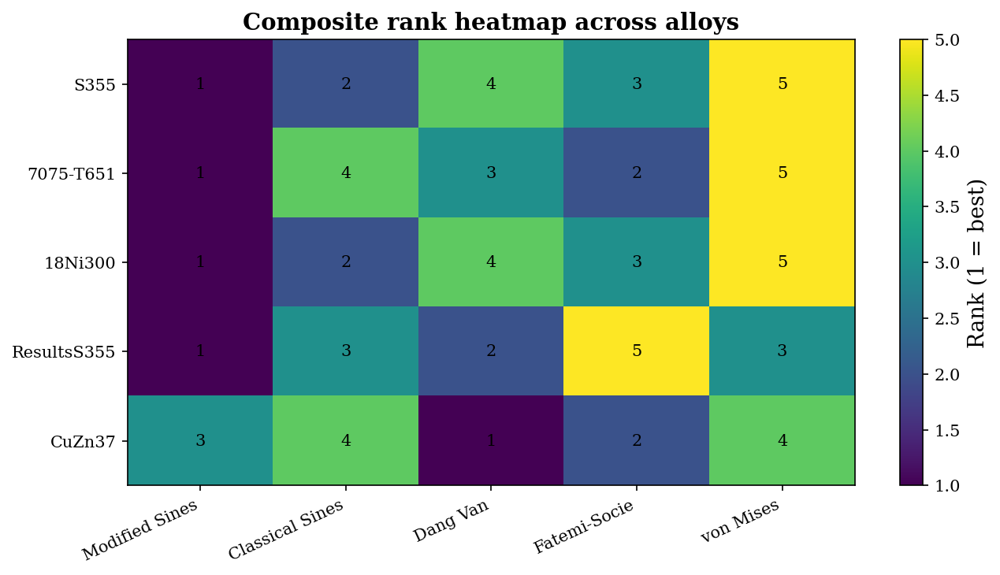


Plots and Excel tables saved in: /content/rank_trend_plots


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ============================================================
# 1) INPUT YOUR RESULTS
#    Replace/edit values here if needed
# ============================================================
data = [
    # Alloy, Model, R2, MAE, RMSE, PI95, Coverage
    ["S355", "Modified Sines", 0.857, 0.189, 0.232, 0.456, 94.3],
    ["S355", "Classical Sines", 0.822, 0.212, 0.258, 0.508, 95.7],
    ["S355", "Dang Van", 0.725, 0.257, 0.321, 0.632, 95.7],
    ["S355", "Fatemi-Socie", 0.749, 0.250, 0.307, 0.604, 95.0],
    ["S355", "von Mises", 0.629, 0.302, 0.373, 0.734, 94.3],

    ["7075-T651", "Modified Sines", 0.840, 0.194, 0.255, 0.503, 96.1],
    ["7075-T651", "Classical Sines", 0.768, 0.215, 0.308, 0.606, 97.6],
    ["7075-T651", "Dang Van", 0.725, 0.244, 0.335, 0.660, 96.1],
    ["7075-T651", "Fatemi-Socie", 0.771, 0.211, 0.306, 0.602, 96.1],
    ["7075-T651", "von Mises", 0.713, 0.261, 0.342, 0.674, 96.9],

    ["18Ni300", "Modified Sines", 0.802, 0.264, 0.375, 0.736, 93.4],
    ["18Ni300", "Classical Sines", 0.799, 0.268, 0.378, 0.742, 93.4],
    ["18Ni300", "Dang Van", 0.774, 0.286, 0.401, 0.787, 92.8],
    ["18Ni300", "Fatemi-Socie", 0.780, 0.282, 0.395, 0.776, 93.1],
    ["18Ni300", "von Mises", 0.638, 0.353, 0.507, 0.995, 90.8],

    ["ResultsS355", "Modified Sines", 0.948, 0.122, 0.151, 0.298, 94.9],
    ["ResultsS355", "Classical Sines", 0.901, 0.173, 0.208, 0.412, 94.9],
    ["ResultsS355", "Dang Van", 0.920, 0.152, 0.187, 0.370, 94.9],
    ["ResultsS355", "Fatemi-Socie", 0.875, 0.183, 0.234, 0.462, 96.6],
    ["ResultsS355", "von Mises", 0.901, 0.173, 0.208, 0.412, 94.9],

    # Keep CuZn37, but remember it is LCF / limitation case
    ["CuZn37", "Modified Sines", 0.467, 0.356, 0.440, 0.868, 94.8],
    ["CuZn37", "Classical Sines", 0.464, 0.357, 0.442, 0.871, 94.8],
    ["CuZn37", "Dang Van", 0.531, 0.329, 0.413, 0.815, 94.8],
    ["CuZn37", "Fatemi-Socie", 0.494, 0.345, 0.429, 0.847, 94.8],
    ["CuZn37", "von Mises", 0.464, 0.357, 0.442, 0.871, 94.8],
]

df = pd.DataFrame(
    data,
    columns=["Alloy", "Model", "R2", "MAE", "RMSE", "PI95", "Coverage"]
)

# ============================================================
# 2) SETTINGS
# ============================================================
OUTPUT_DIR = Path("rank_trend_plots")
OUTPUT_DIR.mkdir(exist_ok=True)

MODEL_ORDER = ["Modified Sines", "Classical Sines", "Dang Van", "Fatemi-Socie", "von Mises"]
ALLOY_ORDER = ["S355", "7075-T651", "18Ni300", "ResultsS355", "CuZn37"]

plt.rcParams.update({
    "font.family": "serif",
    "font.size": 11,
    "axes.labelsize": 13,
    "axes.titlesize": 14,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "figure.dpi": 150,
    "savefig.dpi": 500,
})

# ============================================================
# 3) BUILD RANKS
# ============================================================
# Accuracy score: combine high R2, low MAE, low RMSE through ranks
# Lower rank number = better

def add_ranks(group: pd.DataFrame) -> pd.DataFrame:
    g = group.copy()

    # Individual metric ranks
    g["rank_R2"] = g["R2"].rank(ascending=False, method="min")
    g["rank_MAE"] = g["MAE"].rank(ascending=True, method="min")
    g["rank_RMSE"] = g["RMSE"].rank(ascending=True, method="min")
    g["rank_PI95"] = g["PI95"].rank(ascending=True, method="min")

    # Calibration closeness to 95%
    g["Coverage_error"] = (g["Coverage"] - 95.0).abs()
    g["rank_Calibration"] = g["Coverage_error"].rank(ascending=True, method="min")

    # Aggregate accuracy rank
    g["rank_Accuracy"] = (
        g[["rank_R2", "rank_MAE", "rank_RMSE"]].mean(axis=1)
    ).rank(ascending=True, method="min")

    # Composite rank using the three requested aspects
    g["rank_Composite"] = (
        g[["rank_Accuracy", "rank_PI95", "rank_Calibration"]].mean(axis=1)
    ).rank(ascending=True, method="min")

    return g

rank_df = (
    df.groupby("Alloy", group_keys=False)
      .apply(add_ranks)
      .reset_index(drop=True)
)

rank_df["Alloy"] = pd.Categorical(rank_df["Alloy"], categories=ALLOY_ORDER, ordered=True)
rank_df["Model"] = pd.Categorical(rank_df["Model"], categories=MODEL_ORDER, ordered=True)
rank_df = rank_df.sort_values(["Alloy", "Model"]).reset_index(drop=True)

# ============================================================
# 4) TREND PLOT FUNCTION
# ============================================================
def plot_rank_trend(rank_df: pd.DataFrame, rank_col: str, title: str, filename: str):
    fig, ax = plt.subplots(figsize=(10, 5.5))

    for model in MODEL_ORDER:
        sub = rank_df[rank_df["Model"] == model].sort_values("Alloy")
        ax.plot(
            sub["Alloy"].astype(str),
            sub[rank_col],
            marker="o",
            linewidth=2,
            label=model
        )
        for x, y in zip(sub["Alloy"].astype(str), sub[rank_col]):
            ax.text(x, y - 0.08, f"{int(y)}", ha="center", va="top", fontsize=9)

    ax.set_ylim(len(MODEL_ORDER) + 0.5, 0.5)  # invert ranking axis
    ax.set_ylabel("Rank (1 = best)")
    ax.set_xlabel("")
    ax.set_title(title, weight="bold")
    ax.legend(frameon=False, ncol=2, bbox_to_anchor=(1.02, 1), loc="upper left")
    ax.grid(True, axis="y", linestyle="--", alpha=0.3)

    fig.tight_layout()
    fig.savefig(OUTPUT_DIR / filename, bbox_inches="tight")
    plt.show()
    plt.close(fig)

# ============================================================
# 5) CRITERION-WISE SUMMARY BY MODEL
# ============================================================
summary_ranks = (
    rank_df.groupby("Model")[[
        "rank_Accuracy", "rank_PI95", "rank_Calibration", "rank_Composite"
    ]]
    .mean()
    .reindex(MODEL_ORDER)
)

def plot_summary_rank_bars(summary_ranks: pd.DataFrame):
    metrics = ["rank_Accuracy", "rank_PI95", "rank_Calibration", "rank_Composite"]
    labels = ["Accuracy", "Uncertainty", "Calibration", "Composite"]

    x = np.arange(len(MODEL_ORDER))
    width = 0.18

    fig, ax = plt.subplots(figsize=(12, 5.5))

    for i, (metric, label) in enumerate(zip(metrics, labels)):
        vals = summary_ranks[metric].values
        bars = ax.bar(x + (i - 1.5) * width, vals, width, label=label)
        for b, v in zip(bars, vals):
            ax.text(
                b.get_x() + b.get_width()/2,
                b.get_height() + 0.03,
                f"{v:.2f}",
                ha="center",
                va="bottom",
                fontsize=8
            )

    ax.set_xticks(x)
    ax.set_xticklabels(MODEL_ORDER, rotation=20, ha="right")
    ax.set_ylabel("Average rank (lower is better)")
    ax.set_title("Average model rank across alloys", weight="bold")
    ax.legend(frameon=False, ncol=4)
    ax.grid(True, axis="y", linestyle="--", alpha=0.3)

    fig.tight_layout()
    fig.savefig(OUTPUT_DIR / "Fig_average_rank_bars.png", bbox_inches="tight")
    plt.show()
    plt.close(fig)

# ============================================================
# 6) HEATMAP OF RANKS
# ============================================================
def plot_rank_heatmap(rank_df: pd.DataFrame, rank_col: str, title: str, filename: str):
    pivot = (
        rank_df.pivot(index="Alloy", columns="Model", values=rank_col)
        .reindex(index=ALLOY_ORDER, columns=MODEL_ORDER)
    )

    fig, ax = plt.subplots(figsize=(9, 5))
    im = ax.imshow(pivot.values, aspect="auto")

    ax.set_xticks(np.arange(len(MODEL_ORDER)))
    ax.set_xticklabels(MODEL_ORDER, rotation=25, ha="right")
    ax.set_yticks(np.arange(len(ALLOY_ORDER)))
    ax.set_yticklabels(ALLOY_ORDER)

    for i in range(pivot.shape[0]):
        for j in range(pivot.shape[1]):
            ax.text(j, i, f"{pivot.iloc[i, j]:.0f}", ha="center", va="center", fontsize=10)

    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label("Rank (1 = best)")
    ax.set_title(title, weight="bold")

    fig.tight_layout()
    fig.savefig(OUTPUT_DIR / filename, bbox_inches="tight")
    plt.show()
    plt.close(fig)

# ============================================================
# 7) EXPORT TABLES
# ============================================================
rank_df.to_excel(OUTPUT_DIR / "model_ranks_by_alloy.xlsx", index=False)
summary_ranks.to_excel(OUTPUT_DIR / "average_model_ranks.xlsx")

print("\n=== RANK TABLE BY ALLOY ===")
print(rank_df[[
    "Alloy", "Model",
    "rank_Accuracy", "rank_PI95", "rank_Calibration", "rank_Composite"
]].to_string(index=False))

print("\n=== AVERAGE RANKS ===")
print(summary_ranks)

# ============================================================
# 8) DRAW FIGURES
# ============================================================
plot_rank_trend(
    rank_df,
    "rank_Accuracy",
    "Trend of model rank by alloy: accuracy",
    "Fig_rank_trend_accuracy.png"
)

plot_rank_trend(
    rank_df,
    "rank_PI95",
    "Trend of model rank by alloy: uncertainty reduction",
    "Fig_rank_trend_uncertainty.png"
)

plot_rank_trend(
    rank_df,
    "rank_Calibration",
    "Trend of model rank by alloy: calibration to 95% coverage",
    "Fig_rank_trend_calibration.png"
)

plot_rank_trend(
    rank_df,
    "rank_Composite",
    "Trend of model rank by alloy: composite performance",
    "Fig_rank_trend_composite.png"
)

plot_summary_rank_bars(summary_ranks)

plot_rank_heatmap(
    rank_df,
    "rank_Composite",
    "Composite rank heatmap across alloys",
    "Fig_rank_heatmap_composite.png"
)

print(f"\nPlots and Excel tables saved in: {OUTPUT_DIR.resolve()}")

####Comparison of a Compact Quadratic Descriptor and an Additive Modified Sines Model for S355 Fatigue-Life Prediction

####Brief description:
This code loads and standardizes the cleaned 133-specimen S355 fatigue dataset, then calibrates and compares two equivalent-stress formulations. Equation 1 is a weighted quadratic combination of axial amplitude, shear amplitude, mean axial stress, and mean shear stress. Equation 2 is an additive Modified Sines formulation that includes the Sines amplitude base, mean hydrostatic stress, axial–torsional interaction, and mean shear stress. Both descriptors are linked to fatigue life through a Basquin relation and evaluated using R
2
, MAE, RMSE, specimen-wise win counts, parity plots, and absolute-error boxplots. The results, fitted parameters, predictions, and errors are exported to Excel.

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Loading S355 dataset...
Loading S355 dataset from:
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Loaded S355: 133 specimens
Fitting Eq. 1...
Fitting Eq. 2...

=== PERFORMANCE COMPARISON ON S355 ===
                      Model       R2  MAE_log10N  RMSE_log10N
              Eq1 Quadratic 0.867212    0.176583     0.216215
Eq2 Additive Modified Sines 0.862448    0.178885     0.220059

=== EQ. 1 PARAMETERS ===
ws  = 0.348161
wt  = 0.970154
wm  = 0.166121
wtm = 0.552373
A   = 33.361828
B   = -11.796896

=== EQ. 2 PARAMETERS ===
alpha = 0.392684
beta  = -0.069934
gamma = 0.131096
A     = 33.561485
B     = -11.895570

=== SPECIMEN-WISE WIN COUNTS ===
Winner  Count
   Eq1     68
   Eq2     65

Exported Excel: Compare_Eq1_vs_Eq2_S355.xlsx


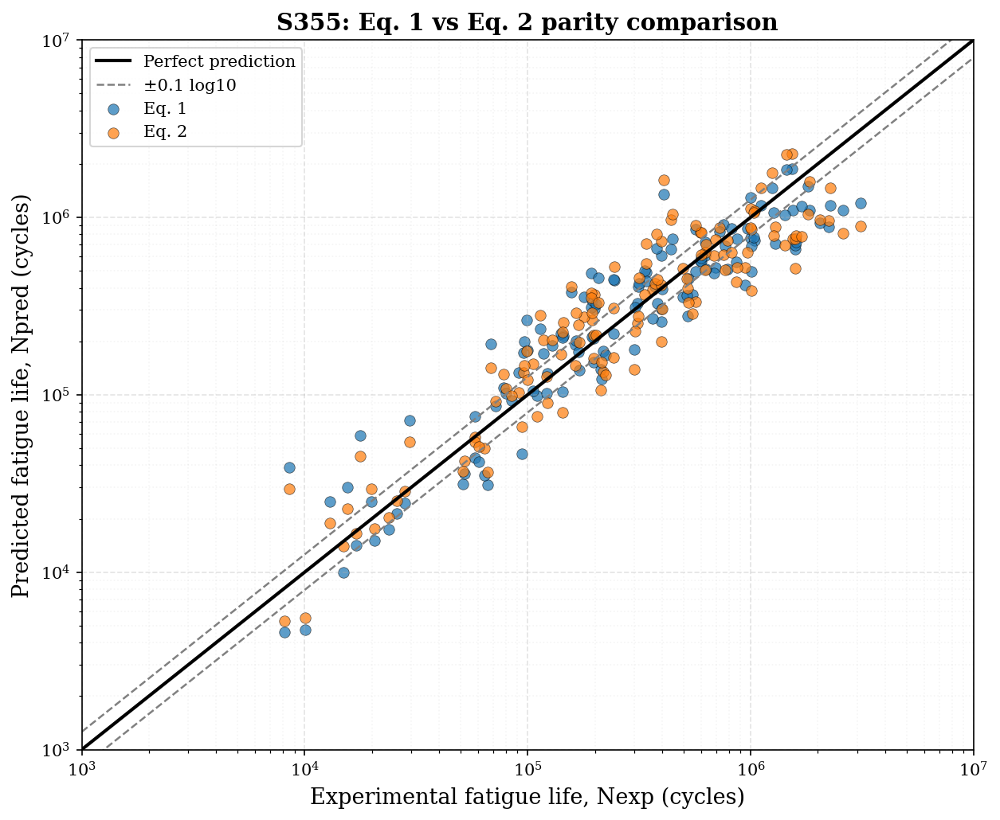

Saved figure: /content/eq1_eq2_s355_figures/Fig_S355_Eq1_vs_Eq2_parity.png


/tmp/ipykernel_703/1299985391.py:383: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=["Eq. 1", "Eq. 2"], showfliers=False, patch_artist=True)


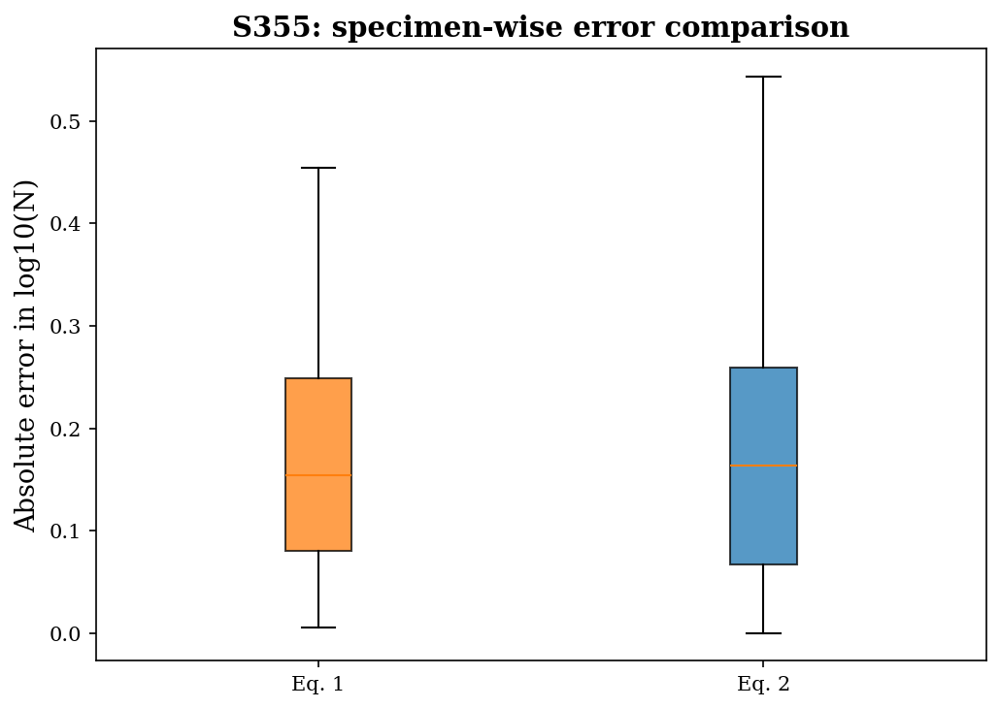

Saved figure: /content/eq1_eq2_s355_figures/Fig_S355_Eq1_vs_Eq2_abs_error.png


In [ ]:
# ============================================================
# COMPARE TWO EQUATIONS ON S355 DATASET
# Eq. 1: compact quadratic
# Eq. 2: additive modified Sines
# ============================================================

import re
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=False)
    except Exception as e:
        print(f"Drive mount skipped/failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
BASE_DIR = Path("/content/gdrive/My Drive/steel samples/Manuscript#3")
DRIVE_ROOT = Path("/content/gdrive/My Drive")
INPUT_FILE = BASE_DIR / "FatigueDataS355_cleaned_133.xlsx"

OUTPUT_EXCEL = "Compare_Eq1_vs_Eq2_S355.xlsx"
FIG_DIR = Path("/content/eq1_eq2_s355_figures")
FIG_DIR.mkdir(parents=True, exist_ok=True)

DATASET_LABEL = "S355"
EPSILON = 1e-9
ZERO_TOL = 1e-10

# ============================================================
# STYLE
# ============================================================
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 11,
    "axes.labelsize": 13,
    "axes.titlesize": 14,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "figure.dpi": 150,
    "savefig.dpi": 500,
})

# ============================================================
# HELPERS
# ============================================================
def norm_col(name: str) -> str:
    s = str(name).strip().lower()
    s = s.replace("σ", "sig").replace("τ", "tau").replace("ε", "eps").replace("γ", "gamma")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s

def first_existing(df: pd.DataFrame, candidates):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None

def safe_numeric(series):
    return pd.to_numeric(series, errors="coerce")

def sanitize_name(name: str) -> str:
    return (
        name.replace(" ", "_")
        .replace("–", "_")
        .replace("-", "_")
        .replace("(", "")
        .replace(")", "")
        .replace("/", "_")
    )

def save_show(fig, filename: str):
    out_path = FIG_DIR / filename
    fig.tight_layout()
    fig.savefig(out_path, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Saved figure: {out_path}")

# ============================================================
# LOAD + STANDARDIZE DATA
# ============================================================
def standardize_dataset(df: pd.DataFrame, material_name: str) -> pd.DataFrame:
    out = df.copy()

    col_sa = first_existing(out, [
        "sa", "sig_a_mpa", "sig_a", "sigma_a_mpa", "sigma_a",
        "sig_max_mpa", "sig_max", "sigma_n_a_mpa", "sigma_n_a",
        "sign_a_mpa", "sign_a"
    ])
    col_sm = first_existing(out, [
        "sm", "sig_m_mpa", "sig_m", "sigma_m_mpa", "sigma_m"
    ])
    col_ta = first_existing(out, [
        "ta", "tau_a_mpa", "tau_a", "tau_max_mpa", "tau_max",
        "tau_ns_a_mpa", "tau_ns_a", "tauns_a_mpa", "tauns_a"
    ])
    col_tm = first_existing(out, [
        "tm", "tau_m_mpa", "tau_m"
    ])
    col_n = first_existing(out, [
        "nexp", "n_exp", "n_exp_cycles", "nexp_cycles",
        "nf_exp_cycle", "nf_exp_cycles", "nf_exp",
        "n_fexp_cycle", "2nf"
    ])
    col_crack = first_existing(out, ["crack", "crack_", "crack_q"])
    specimen_col = first_existing(out, ["specimen", "label", "id"])

    if col_n is None:
        raise ValueError(f"{material_name}: could not find fatigue life column.")

    std = pd.DataFrame(index=out.index)
    std["Sa"] = safe_numeric(out[col_sa]) if col_sa else np.nan
    std["Ta"] = safe_numeric(out[col_ta]) if col_ta else np.nan
    std["Sm"] = safe_numeric(out[col_sm]) if col_sm else 0.0
    std["Tm"] = safe_numeric(out[col_tm]) if col_tm else 0.0
    std["Nexp"] = safe_numeric(out[col_n])

    if norm_col(col_n) == "2nf":
        std["Nexp"] = std["Nexp"] / 2.0

    if col_crack:
        std["crack"] = safe_numeric(out[col_crack])
    else:
        std["crack"] = 1

    if specimen_col:
        std["Specimen"] = out[specimen_col].astype(str)
    else:
        std["Specimen"] = np.arange(1, len(out) + 1).astype(str)

    std["Sm"] = safe_numeric(std["Sm"]).fillna(0.0)
    std["Tm"] = safe_numeric(std["Tm"]).fillna(0.0)

    std = std.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()
    std = std[(std["Nexp"] > 0) & (std["Sa"] >= 0) & (std["Ta"] >= 0)].copy()

    uniq = set(std["crack"].dropna().unique().tolist())
    if uniq and uniq.issubset({0, 1}):
        std = std[std["crack"] == 1].copy()

    std = std.reset_index(drop=True)
    std["ID"] = np.arange(1, len(std) + 1)
    std["Material"] = material_name
    std["log10_Nexp"] = np.log10(std["Nexp"])
    return std

def find_input_file(
    filepath: str | Path,
    search_root: Path = DRIVE_ROOT,
) -> Path:
    """
    Resolve the requested input file.

    The expected path is checked first. If it is unavailable, Google Drive
    is searched recursively for the same filename.
    """
    filepath = Path(filepath)

    if filepath.is_file():
        return filepath

    filename = filepath.name

    matches = [
        path for path in search_root.rglob(filename)
        if path.is_file()
    ]

    if not matches:
        target = filename.casefold()
        matches = [
            path for path in search_root.rglob("*")
            if path.is_file() and path.name.casefold() == target
        ]

    if not matches:
        raise FileNotFoundError(
            f"Input file not found: {filepath}\n"
            f"The file '{filename}' was also not found under: {search_root}"
        )

    if len(matches) > 1:
        print(f"Warning: multiple files named '{filename}' were found:")
        for match in matches:
            print(f"  - {match}")
        print(f"Using: {matches[0]}")

    return matches[0]


def load_clean_dataset(filepath: str | Path, material_name: str) -> pd.DataFrame:
    resolved_path = find_input_file(filepath)

    print(f"Loading {material_name} dataset from:")
    print(resolved_path)

    df = pd.read_excel(resolved_path)
    standardized = standardize_dataset(df, material_name)

    if standardized.empty:
        raise ValueError(
            f"{material_name}: no valid records remained after standardization."
        )

    print(f"Loaded {material_name}: {len(standardized)} specimens")
    return standardized

# ============================================================
# BASQUIN FITTING
# ============================================================
def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray):
    phi = np.asarray(phi, dtype=float)
    y = np.asarray(y, dtype=float)

    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        "resid": resid,
        "mae": float(np.mean(np.abs(resid))),
        "rmse": float(np.sqrt(np.mean(resid ** 2))),
        "r2": float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan,
    }

def optimize_descriptor(builder, y: np.ndarray, x0, bounds):
    def objective(params):
        phi = builder(params)
        fit = fit_basquin_from_phi(phi, y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array(x0, dtype=float),
        bounds=bounds,
        method="L-BFGS-B"
    )

    params = res.x
    phi = builder(params)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Optimization failed.")
    return params, phi, fit

# ============================================================
# EQUATION 1
# Phi1 = sqrt(ws*Sa^2 + wt*Ta^2 + wm*Sm^2 + wtm*Tm^2)
# ============================================================
def run_eq1_quadratic(Sa, Ta, Sm, Tm, y):
    Sa = np.asarray(Sa, dtype=float)
    Ta = np.asarray(Ta, dtype=float)
    Sm = np.asarray(Sm, dtype=float)
    Tm = np.asarray(Tm, dtype=float)

    def build(params):
        ws, wt, wm, wtm = params
        inside = ws * Sa**2 + wt * Ta**2 + wm * Sm**2 + wtm * Tm**2
        if np.any(inside <= 0) or np.any(~np.isfinite(inside)):
            return np.full_like(Sa, np.nan, dtype=float)
        return np.sqrt(inside)

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[1/3, 1.0, 0.05, 0.05],
        bounds=[(1e-8, 50), (1e-8, 50), (0, 50), (0, 50)]
    )

    return {
        "name": "Eq1 Quadratic",
        "formula": "sqrt(ws*Sa^2 + wt*Ta^2 + wm*Sm^2 + wtm*Tm^2)",
        "ws": float(params[0]),
        "wt": float(params[1]),
        "wm": float(params[2]),
        "wtm": float(params[3]),
        "phi": phi,
        **fit,
    }

# ============================================================
# EQUATION 2
# Phi2 = sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3)
#      + beta*(|Sa||Ta|/(|Sa|+|Ta|+eps)) + gamma*|Tm|
# ============================================================
def run_eq2_additive(Sa, Ta, Sm, Tm, y, eps=1e-9):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + eps)
    mean_shear = np.abs(Tm)

    def build(params):
        alpha, beta, gamma = params
        return base + alpha * (Sm / 3.0) + beta * interaction + gamma * mean_shear

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.4, 0.1, 0.1],
        bounds=[(-5, 5), (-5, 5), (-5, 5)]
    )

    return {
        "name": "Eq2 Additive Modified Sines",
        "formula": "sqrt(Sa^2/3 + Ta^2) + alpha*(Sm/3) + beta*(|Sa||Ta|/(|Sa|+|Ta|+eps)) + gamma*|Tm|",
        "alpha": float(params[0]),
        "beta": float(params[1]),
        "gamma": float(params[2]),
        "phi": phi,
        **fit,
    }

# ============================================================
# PLOTS
# ============================================================
def plot_parity(df_out):
    fig, ax = plt.subplots(figsize=(8.5, 7))
    y_true = df_out["Nexp"].values
    y1 = df_out["N_pred_Eq1_Quadratic"].values
    y2 = df_out["N_pred_Eq2_Additive_Modified_Sines"].values

    ax.set_xscale("log")
    ax.set_yscale("log")

    all_vals = np.concatenate([y_true, y1, y2])
    vmin = 10 ** np.floor(np.log10(all_vals.min()))
    vmax = 10 ** np.ceil(np.log10(all_vals.max()))
    xline = np.logspace(np.log10(vmin), np.log10(vmax), 300)

    ax.plot(xline, xline, color="black", linewidth=2.0, label="Perfect prediction")

    f01 = 10 ** 0.1
    ax.plot(xline, xline * f01, "--", linewidth=1.2, color="gray")
    ax.plot(xline, xline / f01, "--", linewidth=1.2, color="gray", label="±0.1 log10")

    ax.scatter(y_true, y1, s=42, alpha=0.72, edgecolor="black", linewidth=0.3, label="Eq. 1")
    ax.scatter(y_true, y2, s=42, alpha=0.72, edgecolor="black", linewidth=0.3, label="Eq. 2")

    ax.set_xlim(vmin, vmax)
    ax.set_ylim(vmin, vmax)
    ax.set_xlabel("Experimental fatigue life, Nexp (cycles)")
    ax.set_ylabel("Predicted fatigue life, Npred (cycles)")
    ax.set_title("S355: Eq. 1 vs Eq. 2 parity comparison", weight="bold")
    ax.grid(True, which="major", linestyle="--", alpha=0.35)
    ax.grid(True, which="minor", linestyle=":", alpha=0.12)
    ax.legend(frameon=True)

    save_show(fig, "Fig_S355_Eq1_vs_Eq2_parity.png")

def plot_abs_error(df_out):
    fig, ax = plt.subplots(figsize=(7, 5))
    data = [
        df_out["abs_err_Eq1_Quadratic"].values,
        df_out["abs_err_Eq2_Additive_Modified_Sines"].values,
    ]
    bp = ax.boxplot(data, labels=["Eq. 1", "Eq. 2"], showfliers=False, patch_artist=True)
    colors = ["#ff7f0e", "#1f77b4"]
    for patch, c in zip(bp["boxes"], colors):
        patch.set_facecolor(c)
        patch.set_alpha(0.75)

    ax.set_ylabel("Absolute error in log10(N)")
    ax.set_title("S355: specimen-wise error comparison", weight="bold")
    save_show(fig, "Fig_S355_Eq1_vs_Eq2_abs_error.png")

# ============================================================
# MAIN
# ============================================================
def main():
    print("Loading S355 dataset...")
    df = load_clean_dataset(INPUT_FILE, DATASET_LABEL)

    y = df["log10_Nexp"].values
    Sa = df["Sa"].values
    Ta = df["Ta"].values
    Sm = df["Sm"].values
    Tm = df["Tm"].values

    print("Fitting Eq. 1...")
    eq1 = run_eq1_quadratic(Sa, Ta, Sm, Tm, y)

    print("Fitting Eq. 2...")
    eq2 = run_eq2_additive(Sa, Ta, Sm, Tm, y, eps=EPSILON)

    summary = pd.DataFrame([
        {
            "Model": eq1["name"],
            "Formula": eq1["formula"],
            "R2": eq1["r2"],
            "MAE_log10N": eq1["mae"],
            "RMSE_log10N": eq1["rmse"],
            "A": eq1["A"],
            "B": eq1["B"],
            "ws": eq1["ws"],
            "wt": eq1["wt"],
            "wm": eq1["wm"],
            "wtm": eq1["wtm"],
        },
        {
            "Model": eq2["name"],
            "Formula": eq2["formula"],
            "R2": eq2["r2"],
            "MAE_log10N": eq2["mae"],
            "RMSE_log10N": eq2["rmse"],
            "A": eq2["A"],
            "B": eq2["B"],
            "alpha": eq2["alpha"],
            "beta": eq2["beta"],
            "gamma": eq2["gamma"],
        },
    ])

    out = df.copy()

    for m in [eq1, eq2]:
        safe = sanitize_name(m["name"])
        out[f"phi_{safe}"] = m["phi"]
        out[f"y_pred_{safe}"] = m["yhat"]
        out[f"N_pred_{safe}"] = 10 ** m["yhat"]
        out[f"residual_{safe}"] = m["resid"]
        out[f"abs_err_{safe}"] = np.abs(m["resid"])

    out["Better_Model"] = np.where(
        out["abs_err_Eq1_Quadratic"] < out["abs_err_Eq2_Additive_Modified_Sines"],
        "Eq1",
        np.where(
            out["abs_err_Eq1_Quadratic"] > out["abs_err_Eq2_Additive_Modified_Sines"],
            "Eq2",
            "Equal"
        )
    )

    better_counts = out["Better_Model"].value_counts(dropna=False).rename_axis("Winner").reset_index(name="Count")

    with pd.ExcelWriter(OUTPUT_EXCEL, engine="openpyxl") as writer:
        summary.to_excel(writer, sheet_name="Summary", index=False)
        better_counts.to_excel(writer, sheet_name="Win_Counts", index=False)
        out.to_excel(writer, sheet_name="All_specimens", index=False)

    print("\n=== PERFORMANCE COMPARISON ON S355 ===")
    print(summary[["Model", "R2", "MAE_log10N", "RMSE_log10N"]].to_string(index=False))

    print("\n=== EQ. 1 PARAMETERS ===")
    print(f"ws  = {eq1['ws']:.6f}")
    print(f"wt  = {eq1['wt']:.6f}")
    print(f"wm  = {eq1['wm']:.6f}")
    print(f"wtm = {eq1['wtm']:.6f}")
    print(f"A   = {eq1['A']:.6f}")
    print(f"B   = {eq1['B']:.6f}")

    print("\n=== EQ. 2 PARAMETERS ===")
    print(f"alpha = {eq2['alpha']:.6f}")
    print(f"beta  = {eq2['beta']:.6f}")
    print(f"gamma = {eq2['gamma']:.6f}")
    print(f"A     = {eq2['A']:.6f}")
    print(f"B     = {eq2['B']:.6f}")

    print("\n=== SPECIMEN-WISE WIN COUNTS ===")
    print(better_counts.to_string(index=False))

    print(f"\nExported Excel: {OUTPUT_EXCEL}")

    plot_parity(out)
    plot_abs_error(out)

if __name__ == "__main__":
    main()

####Single-Material and Multi-Material Comparison of Quadratic and Modified Sines Fatigue Descriptors

####Brief description:
This code compares two equivalent-stress formulations for fatigue-life prediction: a compact quadratic descriptor and an additive Modified Sines descriptor. It loads and standardizes S355, 7075-T651, 18Ni300, and optionally ResultsS355 datasets, fits each equation through a Basquin-type relation, and evaluates their performance using R
2
, MAE, and RMSE in log
10
	​

(N). The workflow compares performance for S355 alone and for the combined multi-material dataset, then exports the fitted parameters and performance results to Excel and generates a summary figure showing the single-material and multi-material results.

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Loading S355...
Loading S355 from:
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Loaded S355: 133 specimens
Loading 7075-T651...
Loading 7075-T651 from:
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx
Loaded 7075-T651: 127 specimens
Loading 18Ni300...
Loading 18Ni300 from:
/content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx
Loaded 18Ni300: 304 specimens
Loading ResultsS355...
Expected location: /content/gdrive/My Drive/steel samples/Manuscript#3/ResultsS355.xlsx
Searched under: /content/gdrive/My Drive
The optional dataset will be skipped.

=== RESULTS TABLE ===
                                   Dataset                       Model       r2      mae     rmse
                     Single-material: S355               Eq1 Quadratic 0.867212 0.176583 0.216215
  

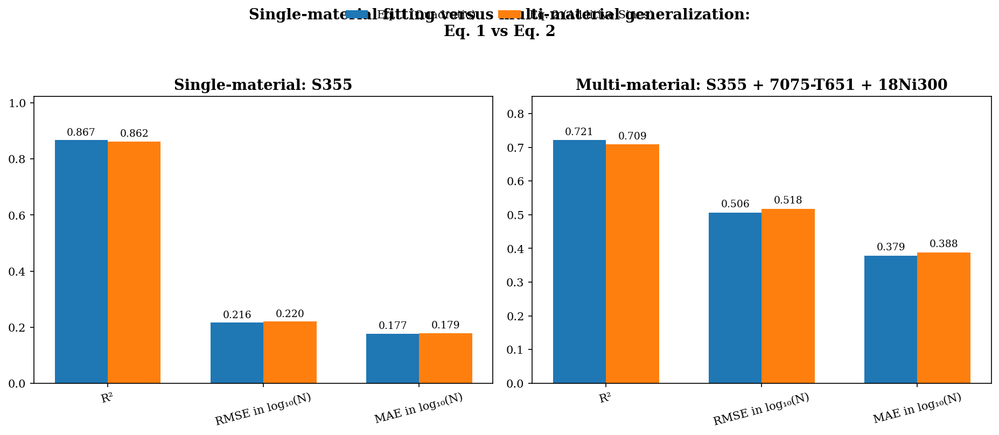


Saved summary: /content/key_result_eq1_vs_eq2/Eq1_vs_Eq2_single_vs_multi.xlsx
Saved figure: /content/key_result_eq1_vs_eq2/Fig_key_result_single_vs_multi.png


In [ ]:
# ============================================================
# KEY RESULT FIGURE:
# Single-material vs Multi-material comparison
# Eq1 Quadratic vs Eq2 Additive Modified Sines
# ============================================================

import re
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression

# ============================================================
# OPTIONAL: GOOGLE DRIVE MOUNT FOR COLAB
# ============================================================
USE_COLAB_DRIVE = True

if USE_COLAB_DRIVE:
    try:
        from google.colab import drive
        drive.mount('/content/gdrive', force_remount=False)
    except Exception as e:
        print(f"Drive mount skipped/failed: {e}")

# ============================================================
# USER SETTINGS
# ============================================================
BASE_DIR = Path("/content/gdrive/My Drive/steel samples/Manuscript#3")
DRIVE_ROOT = Path("/content/gdrive/My Drive")

FILES = [
    ("S355", "FatigueDataS355_cleaned_133.xlsx", True),
    ("7075-T651", "FatigueData 7075T651  Clean list.xlsx", True),
    ("18Ni300", "MS1_FatigueData.xlsx", True),
    # Optional because this file is currently absent.
    ("ResultsS355", "ResultsS355.xlsx", False),
]

OUT_DIR = Path("/content/key_result_eq1_vs_eq2")
OUT_DIR.mkdir(parents=True, exist_ok=True)

OUTPUT_SUMMARY = OUT_DIR / "Eq1_vs_Eq2_single_vs_multi.xlsx"
OUTPUT_FIG = OUT_DIR / "Fig_key_result_single_vs_multi.png"

EPSILON = 1e-9

plt.rcParams.update({
    "font.family": "serif",
    "font.size": 11,
    "axes.labelsize": 12,
    "axes.titlesize": 13,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
    "legend.fontsize": 10,
    "figure.dpi": 150,
    "savefig.dpi": 500,
})

# ============================================================
# HELPERS
# ============================================================
def norm_col(name: str) -> str:
    s = str(name).strip().lower()
    s = s.replace("σ", "sig").replace("τ", "tau").replace("ε", "eps").replace("γ", "gamma")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s

def first_existing(df: pd.DataFrame, candidates):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None

def safe_numeric(series):
    return pd.to_numeric(series, errors="coerce")

def standardize_dataset(df: pd.DataFrame, material_name: str) -> pd.DataFrame:
    out = df.copy()

    col_sa = first_existing(out, [
        "sa", "sig_a_mpa", "sig_a", "sigma_a_mpa", "sigma_a",
        "sig_max_mpa", "sig_max", "sigma_n_a_mpa", "sigma_n_a",
        "sign_a_mpa", "sign_a"
    ])
    col_sm = first_existing(out, [
        "sm", "sig_m_mpa", "sig_m", "sigma_m_mpa", "sigma_m"
    ])
    col_ta = first_existing(out, [
        "ta", "tau_a_mpa", "tau_a", "tau_max_mpa", "tau_max",
        "tau_ns_a_mpa", "tau_ns_a", "tauns_a_mpa", "tauns_a"
    ])
    col_tm = first_existing(out, [
        "tm", "tau_m_mpa", "tau_m"
    ])
    col_n = first_existing(out, [
        "nexp", "n_exp", "n_exp_cycles", "nexp_cycles",
        "nf_exp_cycle", "nf_exp_cycles", "nf_exp",
        "n_fexp_cycle", "2nf"
    ])
    col_crack = first_existing(out, ["crack", "crack_", "crack_q"])

    if col_n is None:
        raise ValueError(f"{material_name}: could not find fatigue life column.")

    std = pd.DataFrame(index=out.index)
    std["Sa"] = safe_numeric(out[col_sa]) if col_sa else np.nan
    std["Ta"] = safe_numeric(out[col_ta]) if col_ta else np.nan
    std["Sm"] = safe_numeric(out[col_sm]) if col_sm else 0.0
    std["Tm"] = safe_numeric(out[col_tm]) if col_tm else 0.0
    std["Nexp"] = safe_numeric(out[col_n])

    if norm_col(col_n) == "2nf":
        std["Nexp"] = std["Nexp"] / 2.0

    if col_crack:
        std["crack"] = safe_numeric(out[col_crack])
    else:
        std["crack"] = 1

    std["Sm"] = safe_numeric(std["Sm"]).fillna(0.0)
    std["Tm"] = safe_numeric(std["Tm"]).fillna(0.0)

    std = std.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()
    std = std[(std["Nexp"] > 0) & (std["Sa"] >= 0) & (std["Ta"] >= 0)].copy()

    uniq = set(std["crack"].dropna().unique().tolist())
    if uniq and uniq.issubset({0, 1}):
        std = std[std["crack"] == 1].copy()

    std = std.reset_index(drop=True)
    std["Material"] = material_name
    std["log10_Nexp"] = np.log10(std["Nexp"])
    return std

def resolve_input_file(
    filename: str,
    *,
    required: bool = True,
    base_dir: Path = BASE_DIR,
    search_root: Path = DRIVE_ROOT,
) -> Path | None:
    """
    Locate an input file without changing the analysis workflow.
    """
    direct_path = base_dir / filename

    if direct_path.is_file():
        return direct_path

    matches = [
        path for path in search_root.rglob(filename)
        if path.is_file()
    ]

    if not matches:
        target = filename.casefold()
        matches = [
            path for path in search_root.rglob("*")
            if path.is_file() and path.name.casefold() == target
        ]

    if matches:
        if len(matches) > 1:
            print(f"Warning: multiple files named '{filename}' were found:")
            for match in matches:
                print(f"  - {match}")
            print(f"Using: {matches[0]}")
        return matches[0]

    message = (
        f"Input file not found: {filename}\n"
        f"Expected location: {direct_path}\n"
        f"Searched under: {search_root}"
    )

    if required:
        raise FileNotFoundError(message)

    print(f"Warning: {message}")
    print("The optional dataset will be skipped.")
    return None


def load_clean_dataset(filepath: str | Path, material_name: str) -> pd.DataFrame:
    filepath = Path(filepath)

    if not filepath.is_file():
        raise FileNotFoundError(f"Input file not found: {filepath}")

    print(f"Loading {material_name} from:")
    print(filepath)

    df = pd.read_excel(filepath)
    standardized = standardize_dataset(df, material_name)

    if standardized.empty:
        raise ValueError(
            f"{material_name}: no valid fatigue records remained after standardization."
        )

    print(f"Loaded {material_name}: {len(standardized)} specimens")
    return standardized

# ============================================================
# BASQUIN FITTING
# ============================================================
def fit_basquin_from_phi(phi: np.ndarray, y: np.ndarray):
    phi = np.asarray(phi, dtype=float)
    y = np.asarray(y, dtype=float)

    if np.any(phi <= 0) or np.any(~np.isfinite(phi)):
        return None

    X = np.log10(phi).reshape(-1, 1)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    resid = y - yhat

    ss_res = np.sum(resid ** 2)
    ss_tot = np.sum((y - y.mean()) ** 2)

    return {
        "A": float(reg.intercept_),
        "B": float(reg.coef_[0]),
        "yhat": yhat,
        "resid": resid,
        "mae": float(np.mean(np.abs(resid))),
        "rmse": float(np.sqrt(np.mean(resid ** 2))),
        "r2": float(1 - ss_res / ss_tot) if ss_tot > 0 else np.nan,
    }

def optimize_descriptor(builder, y: np.ndarray, x0, bounds):
    def objective(params):
        phi = builder(params)
        fit = fit_basquin_from_phi(phi, y)
        return 1e9 if fit is None else fit["rmse"]

    res = minimize(
        objective,
        x0=np.array(x0, dtype=float),
        bounds=bounds,
        method="L-BFGS-B"
    )

    params = res.x
    phi = builder(params)
    fit = fit_basquin_from_phi(phi, y)

    if fit is None:
        raise RuntimeError("Optimization failed.")
    return params, phi, fit

# ============================================================
# MODELS
# ============================================================
def run_eq1_quadratic(Sa, Ta, Sm, Tm, y):
    def build(params):
        ws, wt, wm, wtm = params
        inside = ws * Sa**2 + wt * Ta**2 + wm * Sm**2 + wtm * Tm**2
        if np.any(inside <= 0) or np.any(~np.isfinite(inside)):
            return np.full_like(Sa, np.nan, dtype=float)
        return np.sqrt(inside)

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[1/3, 1.0, 0.05, 0.05],
        bounds=[(1e-8, 50), (1e-8, 50), (0, 50), (0, 50)]
    )

    return {
        "Model": "Eq1 Quadratic",
        "ws": float(params[0]),
        "wt": float(params[1]),
        "wm": float(params[2]),
        "wtm": float(params[3]),
        **fit,
    }

def run_eq2_additive(Sa, Ta, Sm, Tm, y, eps=1e-9):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    interaction = (np.abs(Sa) * np.abs(Ta)) / (np.abs(Sa) + np.abs(Ta) + eps)
    mean_shear = np.abs(Tm)

    def build(params):
        alpha, beta, gamma = params
        return base + alpha * (Sm / 3.0) + beta * interaction + gamma * mean_shear

    params, phi, fit = optimize_descriptor(
        build, y,
        x0=[0.4, 0.1, 0.1],
        bounds=[(-5, 5), (-5, 5), (-5, 5)]
    )

    return {
        "Model": "Eq2 Additive Modified Sines",
        "alpha": float(params[0]),
        "beta": float(params[1]),
        "gamma": float(params[2]),
        **fit,
    }

# ============================================================
# EVALUATION
# ============================================================
def evaluate_dataset(df: pd.DataFrame, dataset_name: str):
    y = df["log10_Nexp"].values
    Sa = df["Sa"].values
    Ta = df["Ta"].values
    Sm = df["Sm"].values
    Tm = df["Tm"].values

    eq1 = run_eq1_quadratic(Sa, Ta, Sm, Tm, y)
    eq2 = run_eq2_additive(Sa, Ta, Sm, Tm, y, eps=EPSILON)

    return [
        {"Dataset": dataset_name, **eq1},
        {"Dataset": dataset_name, **eq2},
    ]

# ============================================================
# LOAD DATASETS
# ============================================================
loaded = []

for name, filename, required in FILES:
    print(f"Loading {name}...")

    resolved_path = resolve_input_file(
        filename,
        required=required,
    )

    if resolved_path is None:
        continue

    loaded.append(
        (name, load_clean_dataset(resolved_path, name))
    )

if not loaded:
    raise RuntimeError("No datasets were loaded.")

loaded_names = {name for name, _ in loaded}

if "S355" not in loaded_names:
    raise RuntimeError(
        "S355 is required for the single-material comparison but was not loaded."
    )

# Single-material: S355 only
df_s355 = dict(loaded)["S355"]

# Multi-material: combined HCF
df_multi = pd.concat([df for _, df in loaded], ignore_index=True)

# ============================================================
# RUN COMPARISON
# ============================================================
# ============================================================
# RUN COMPARISON
# ============================================================
results = []
results.extend(evaluate_dataset(df_s355, "Single-material: S355"))
multi_label = "Multi-material: " + " + ".join(name for name, _ in loaded)
results.extend(evaluate_dataset(df_multi, multi_label))

results_df = pd.DataFrame(results)
results_df.to_excel(OUTPUT_SUMMARY, index=False)

print("\n=== RESULTS TABLE ===")
print(results_df[["Dataset", "Model", "r2", "mae", "rmse"]].to_string(index=False))

# ============================================================
# BUILD FIGURE
# ============================================================
plot_df = results_df.copy()

metric_cols = ["r2", "rmse", "mae"]
metric_labels = ["R²", "RMSE in log₁₀(N)", "MAE in log₁₀(N)"]

fig, axes = plt.subplots(1, 2, figsize=(12.5, 5.2), sharey=False)

for ax, dataset_name in zip(axes, ["Single-material: S355", multi_label]):
    sub = plot_df[plot_df["Dataset"] == dataset_name].copy()

    x = np.arange(len(metric_cols))
    width = 0.34

    eq1_vals = [sub[sub["Model"] == "Eq1 Quadratic"][m].iloc[0] for m in metric_cols]
    eq2_vals = [sub[sub["Model"] == "Eq2 Additive Modified Sines"][m].iloc[0] for m in metric_cols]

    b1 = ax.bar(x - width/2, eq1_vals, width, label="Eq. 1 (Quadratic)")
    b2 = ax.bar(x + width/2, eq2_vals, width, label="Eq. 2 (Additive Sines)")

    ax.set_xticks(x)
    ax.set_xticklabels(metric_labels, rotation=15)
    ax.set_title(dataset_name, weight="bold")

    for bars in [b1, b2]:
        for bar in bars:
            h = bar.get_height()
            ax.text(
                bar.get_x() + bar.get_width()/2,
                h + 0.01,
                f"{h:.3f}",
                ha="center",
                va="bottom",
                fontsize=9
            )

    ymax = max(eq1_vals + eq2_vals) * 1.18
    ax.set_ylim(0, ymax)

fig.suptitle(
    "Single-material fitting versus multi-material generalization:\nEq. 1 vs Eq. 2",
    weight="bold",
    y=1.03
)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=2, frameon=False)

fig.tight_layout()
fig.savefig(OUTPUT_FIG, bbox_inches="tight")
plt.show()

print(f"\nSaved summary: {OUTPUT_SUMMARY}")
print(f"Saved figure: {OUTPUT_FIG}")

####S355 Fatigue-Life Prediction Using Modified Sines Descriptors, XGBoost, and SHAP

####Brief description:
This code loads and cleans the 133-specimen S355 fatigue dataset, automatically detects the stress and fatigue-life columns, and constructs physics-informed Modified Sines descriptors based on the Sines amplitude term, mean hydrostatic stress, axial–torsional interaction, and mean shear stress. It then trains an XGBoost regression model to predict log
10
	​

(N), evaluates performance using an 80/20 train–test split and five-fold cross-validation, and generates parity, feature-importance, and SHAP summary plots. The workflow also exports test predictions, residuals, performance metrics, and feature-importance values to Excel.

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).

Loading the S355 dataset from:
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx

Raw rows: 133
Original columns:
['Sm', 'Tm', 'Sa', 'Ta', 'Nexp', 'crack', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Legend', 'Unnamed: 10']

Detected columns:
Sa    = Sa
Ta    = Ta
Sm    = Sm
Tm    = Tm
Nexp  = Nexp
crack = crack

Cleaning summary:
Initial rows                   : 133
Removed for missing values     : 0
Removed for invalid values     : 0
Removed as non-failure records : 0
Final accepted rows            : 133

Regime counts:
Regime
Combined     58
Axial        42
Torsional    33
Name: count, dtype: int64

Four-descriptor surrogate inputs:
  - Base_Sines
  - Mean_Hydrostatic
  - Interaction
  - Mean_Shear

Aggregate Phi_Modified_Sines used as input: False

Train-test split:
Total specimens    : 133
Training specimens : 106
Tes

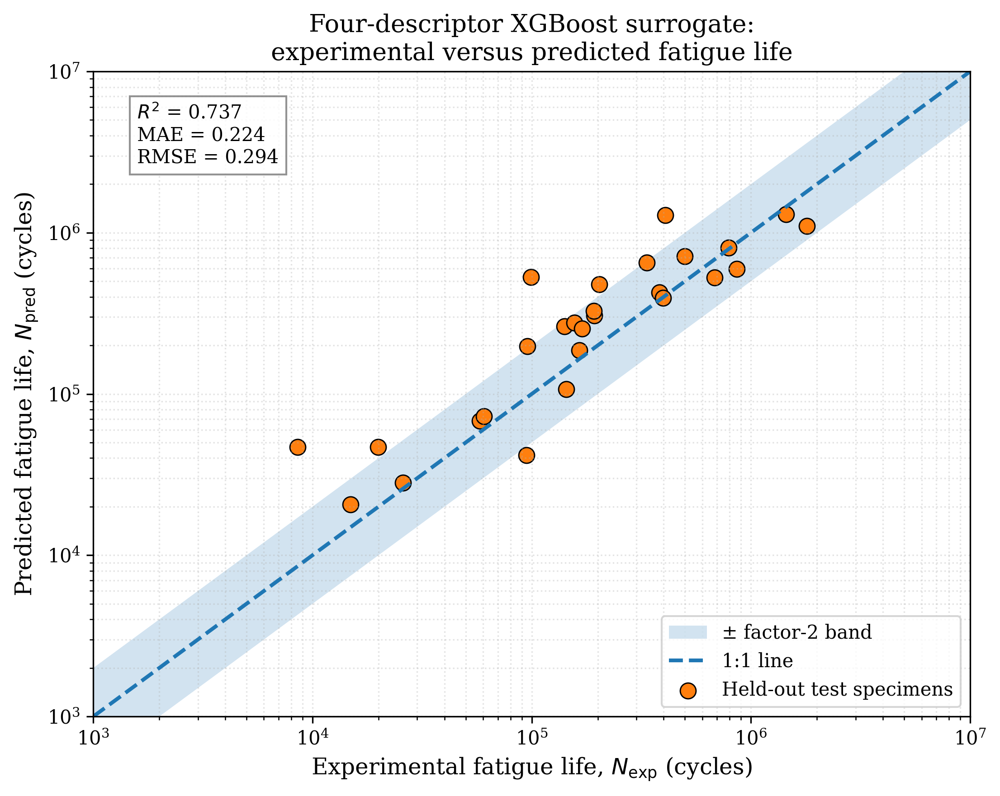

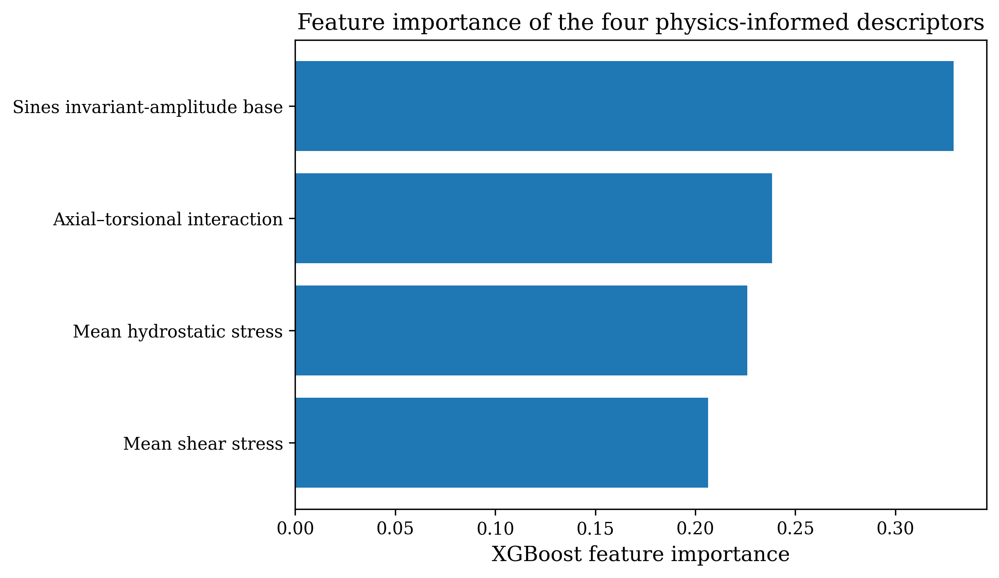


SHAP methodology:
SHAP input features:
  - Sines invariant-amplitude base
  - Mean hydrostatic stress
  - Axial–torsional interaction
  - Mean shear stress
SHAP specimens: 27
SHAP subset: held-out test data
Interpretation: predictive relevance within the XGBoost surrogate, not independent physical causality.


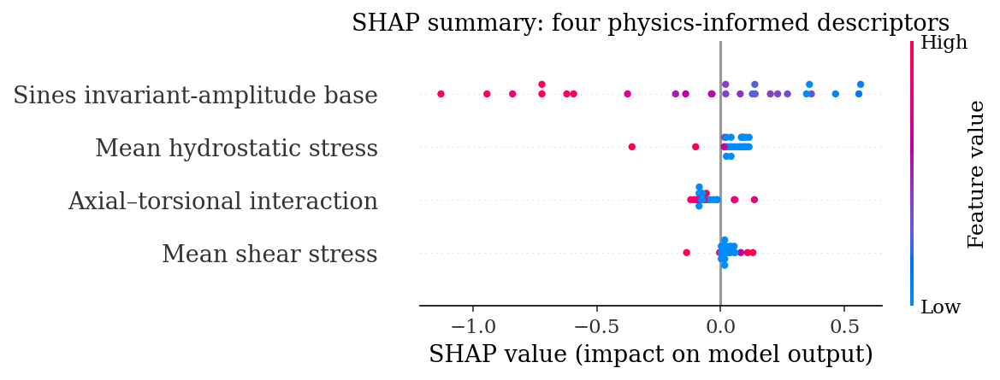


Mean absolute SHAP ranking:
         Feature                Display_Feature  Mean_abs_SHAP
      Base_Sines Sines invariant-amplitude base       0.378681
Mean_Hydrostatic        Mean hydrostatic stress       0.078445
     Interaction    Axial–torsional interaction       0.071221
      Mean_Shear              Mean shear stress       0.035379


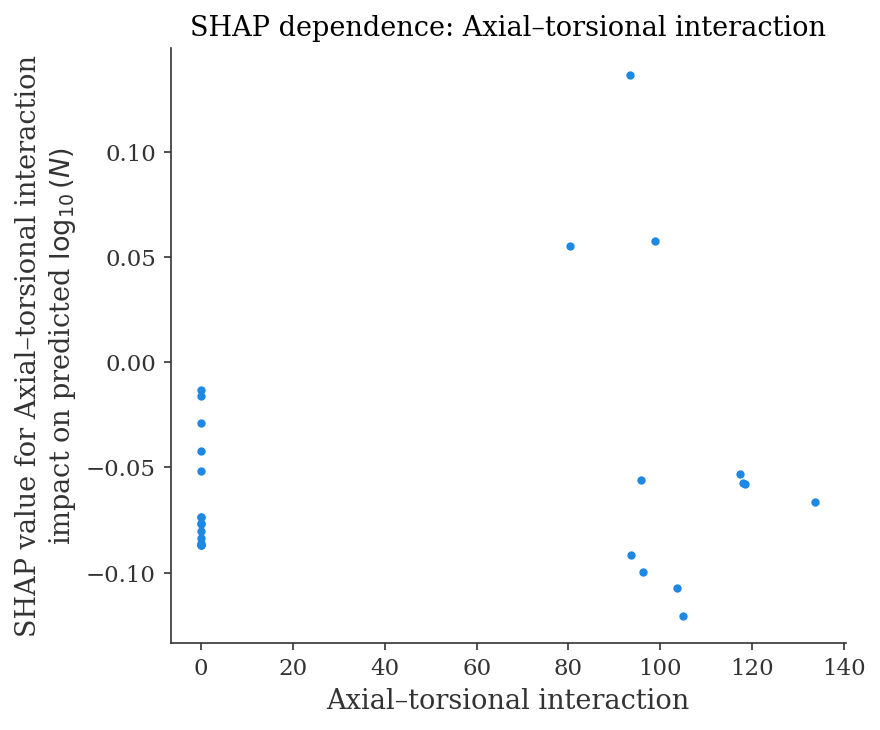

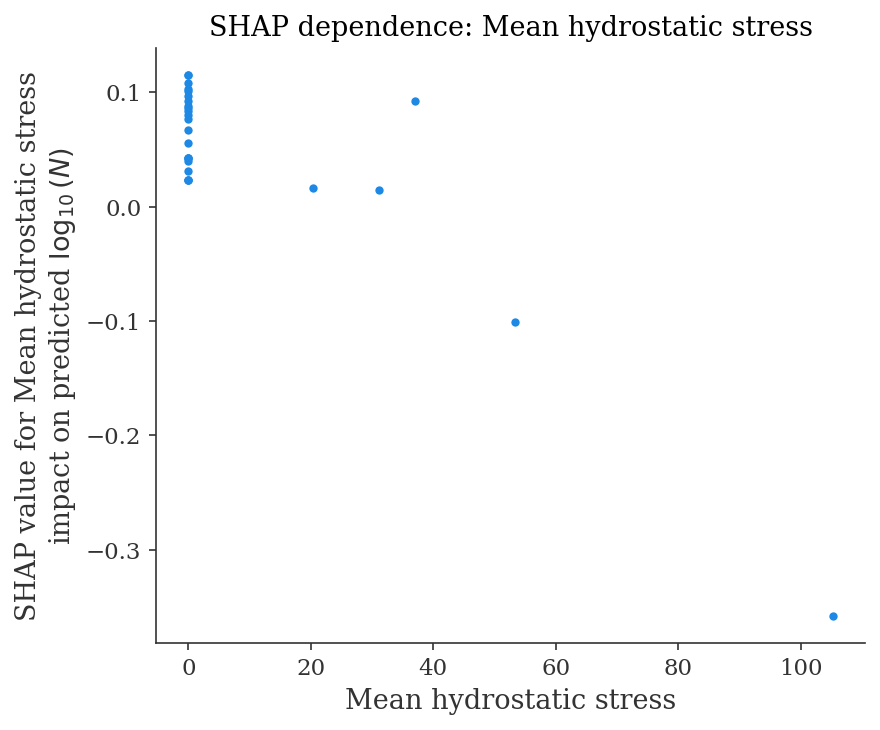

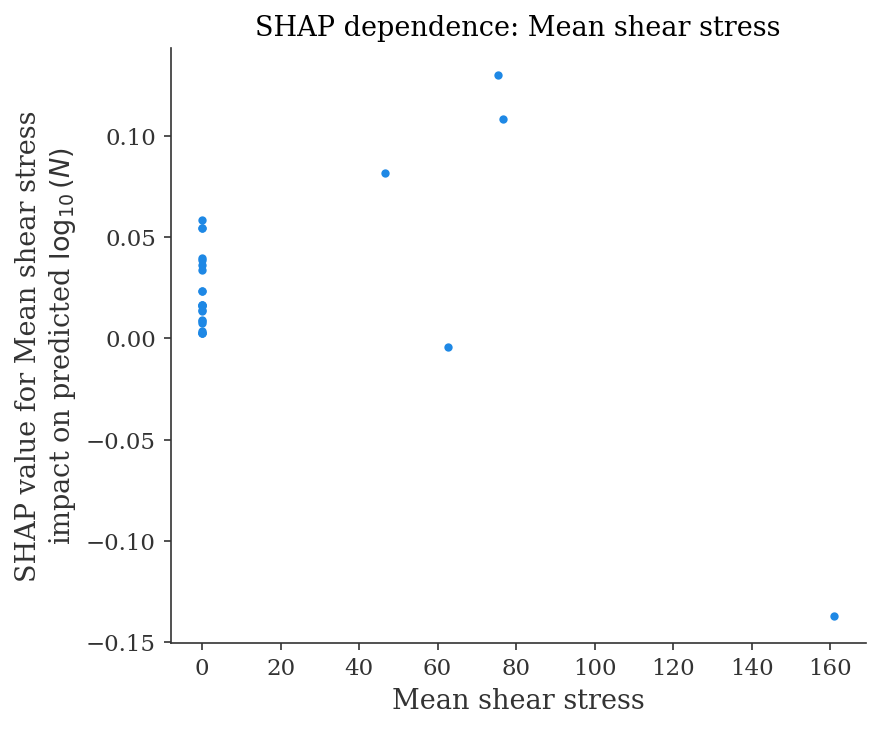


Consistency checks passed:
✓ Four SHAP/XGBoost inputs only
✓ Phi_Modified_Sines excluded from X
✓ SHAP evaluated on held-out test specimens
✓ Aggregate descriptor retained only for reporting

Saved outputs:
/content/gdrive/My Drive/steel samples/Manuscript#3/S355_FourDescriptor_XGBoost_SHAP/S355_FourDescriptor_XGBoost_Parity.png
/content/gdrive/My Drive/steel samples/Manuscript#3/S355_FourDescriptor_XGBoost_SHAP/S355_FourDescriptor_XGBoost_Parity.pdf
/content/gdrive/My Drive/steel samples/Manuscript#3/S355_FourDescriptor_XGBoost_SHAP/S355_FourDescriptor_XGBoost_Importance.png
/content/gdrive/My Drive/steel samples/Manuscript#3/S355_FourDescriptor_XGBoost_SHAP/S355_FourDescriptor_XGBoost_Importance.pdf
/content/gdrive/My Drive/steel samples/Manuscript#3/S355_FourDescriptor_XGBoost_SHAP/S355_SHAP_Summary_Four_Descriptors.png
/content/gdrive/My Drive/steel samples/Manuscript#3/S355_FourDescriptor_XGBoost_SHAP/S355_SHAP_Summary_Four_Descriptors.pdf
/content/gdrive/My Drive/steel samples/M

In [ ]:
# ============================================================
# S355 FOUR-DESCRIPTOR XGBOOST SURROGATE + SHAP
# Consistent SHAP design:
#   1) Sines invariant-amplitude base
#   2) Mean hydrostatic stress
#   3) Axial–torsional interaction
#   4) Mean shear stress
#
# The aggregate Phi_Modified_Sines is calculated for reporting
# only and is NOT used as an XGBoost or SHAP input.
# ============================================================

import re
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shap

from google.colab import drive
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    cross_val_score,
)
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error,
)
from xgboost import XGBRegressor


# ============================================================
# 1. Reproducibility and settings
# ============================================================

RANDOM_STATE = 42
TEST_SIZE = 0.20
N_SPLITS = 5
EPS = 1e-9
ZERO_TOL = 1e-10

BASE_DIR = Path(
    "/content/gdrive/My Drive/steel samples/Manuscript#3"
)
DRIVE_ROOT = Path(
    "/content/gdrive/My Drive"
)

FILE_NAME = "FatigueDataS355_cleaned_133.xlsx"

OUTPUT_DIR = (
    BASE_DIR
    / "S355_FourDescriptor_XGBoost_SHAP"
)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

FEATURES = [
    "Base_Sines",
    "Mean_Hydrostatic",
    "Interaction",
    "Mean_Shear",
]

FEATURE_LABELS = {
    "Base_Sines": "Sines invariant-amplitude base",
    "Mean_Hydrostatic": "Mean hydrostatic stress",
    "Interaction": "Axial–torsional interaction",
    "Mean_Shear": "Mean shear stress",
}

DISPLAY_FEATURES = [
    FEATURE_LABELS[name]
    for name in FEATURES
]


# ============================================================
# 2. Mount Google Drive
# ============================================================

drive.mount(
    "/content/gdrive",
    force_remount=False,
)


# ============================================================
# 3. File-resolution helper
# ============================================================

def find_input_file(
    filename: str,
    base_dir: Path = BASE_DIR,
    search_root: Path = DRIVE_ROOT,
) -> Path:
    """
    Find the requested input file in the expected folder or
    elsewhere in Google Drive.
    """
    direct_path = base_dir / filename

    if direct_path.is_file():
        return direct_path

    exact_matches = [
        path
        for path in search_root.rglob(filename)
        if path.is_file()
    ]

    if not exact_matches:
        target = filename.casefold()
        exact_matches = [
            path
            for path in search_root.rglob("*")
            if path.is_file()
            and path.name.casefold() == target
        ]

    if not exact_matches:
        raise FileNotFoundError(
            f"Input file not found: {filename}\n"
            f"Expected location: {direct_path}\n"
            f"Searched under: {search_root}"
        )

    if len(exact_matches) > 1:
        print(
            f"Warning: multiple files named "
            f"'{filename}' were found:"
        )
        for match in exact_matches:
            print(f"  - {match}")
        print(f"Using: {exact_matches[0]}")

    resolved = exact_matches[0]

    if resolved.name.casefold() != filename.casefold():
        raise RuntimeError(
            "Incorrect file resolved.\n"
            f"Requested: {filename}\n"
            f"Resolved: {resolved.name}"
        )

    return resolved


# ============================================================
# 4. Column-name helpers
# ============================================================

def norm_col(name) -> str:
    """Normalise a column name for robust matching."""
    value = str(name).strip().lower()
    value = value.replace("σ", "sigma")
    value = value.replace("τ", "tau")
    value = value.replace("γ", "gamma")
    value = value.replace("ε", "eps")
    value = value.replace("ₐ", "a")
    value = value.replace("ₘ", "m")
    value = re.sub(
        r"[\s\-/(),.?]+",
        "_",
        value,
    )
    value = re.sub(
        r"_+",
        "_",
        value,
    ).strip("_")
    return value


def find_col(
    dataframe: pd.DataFrame,
    candidates: list[str],
):
    """Return the first matching original column name."""
    normalised_map = {
        norm_col(column): column
        for column in dataframe.columns
    }

    for candidate in candidates:
        normalised_candidate = norm_col(candidate)
        if normalised_candidate in normalised_map:
            return normalised_map[normalised_candidate]

    return None


# ============================================================
# 5. Load and standardise the S355 dataset
# ============================================================

INPUT_FILE = find_input_file(FILE_NAME)

print(
    "\nLoading the S355 dataset from:"
)
print(INPUT_FILE)

df_raw = pd.read_excel(INPUT_FILE)

print(
    f"\nRaw rows: {len(df_raw)}"
)
print(
    "Original columns:"
)
print(df_raw.columns.tolist())


col_sa = find_col(
    df_raw,
    [
        "Sa",
        "S_a",
        "sigma_a",
        "sigma_a_mpa",
        "sig_a",
        "sig_a_mpa",
        "stress_amplitude",
        "axial_stress_amplitude",
    ],
)

col_ta = find_col(
    df_raw,
    [
        "Ta",
        "T_a",
        "tau_a",
        "tau_a_mpa",
        "shear_stress_amplitude",
        "torsional_stress_amplitude",
    ],
)

col_sm = find_col(
    df_raw,
    [
        "Sm",
        "S_m",
        "sigma_m",
        "sigma_m_mpa",
        "sig_m",
        "sig_m_mpa",
        "mean_normal_stress",
        "mean_axial_stress",
    ],
)

col_tm = find_col(
    df_raw,
    [
        "Tm",
        "T_m",
        "tau_m",
        "tau_m_mpa",
        "mean_shear_stress",
        "mean_torsional_stress",
    ],
)

col_n = find_col(
    df_raw,
    [
        "Nexp",
        "N_exp",
        "N_exp_cycles",
        "Nexp_cycles",
        "Nf",
        "N_f",
        "Nf_exp",
        "Nf_exp_cycles",
        "Nf, cycles",
        "cycles",
        "life",
        "fatigue_life",
        "2Nf",
        "logN",
        "log_N",
        "log10_N",
        "log10_Nexp",
    ],
)

col_crack = find_col(
    df_raw,
    [
        "crack",
        "crack_",
        "crack_q",
        "Crack?",
    ],
)


print(
    "\nDetected columns:"
)
print(f"Sa    = {col_sa}")
print(f"Ta    = {col_ta}")
print(f"Sm    = {col_sm}")
print(f"Tm    = {col_tm}")
print(f"Nexp  = {col_n}")
print(f"crack = {col_crack}")


if col_sa is None or col_ta is None or col_n is None:
    raise ValueError(
        "Could not detect the required Sa, Ta, or Nexp "
        "column. Check the printed column names."
    )


df = pd.DataFrame(
    index=df_raw.index
)

df["Sa"] = pd.to_numeric(
    df_raw[col_sa],
    errors="coerce",
)

df["Ta"] = pd.to_numeric(
    df_raw[col_ta],
    errors="coerce",
)

if col_sm is not None:
    df["Sm"] = pd.to_numeric(
        df_raw[col_sm],
        errors="coerce",
    ).fillna(0.0)
else:
    df["Sm"] = 0.0

if col_tm is not None:
    df["Tm"] = pd.to_numeric(
        df_raw[col_tm],
        errors="coerce",
    ).fillna(0.0)
else:
    df["Tm"] = 0.0

life_values = pd.to_numeric(
    df_raw[col_n],
    errors="coerce",
)

normalised_life_column = norm_col(col_n)

log_life_names = {
    "logn",
    "log_n",
    "log10_n",
    "log10_nexp",
}

if normalised_life_column in log_life_names:
    df["Nexp"] = 10.0 ** life_values
    print(
        "Logarithmic fatigue life detected and "
        "converted to cycles."
    )
elif normalised_life_column == "2nf":
    df["Nexp"] = life_values / 2.0
    print(
        "2Nf detected and converted to Nf cycles."
    )
else:
    df["Nexp"] = life_values

if col_crack is not None:
    df["crack"] = pd.to_numeric(
        df_raw[col_crack],
        errors="coerce",
    )
else:
    df["crack"] = 1


initial_rows = len(df)

df = df.dropna(
    subset=[
        "Sa",
        "Ta",
        "Sm",
        "Tm",
        "Nexp",
    ],
).copy()

removed_missing = initial_rows - len(df)

before_numeric_filter = len(df)

df = df[
    (df["Nexp"] > 0)
    & (df["Sa"] >= 0)
    & (df["Ta"] >= 0)
].copy()

removed_invalid = (
    before_numeric_filter
    - len(df)
)

before_crack_filter = len(df)

unique_crack_values = set(
    df["crack"]
    .dropna()
    .unique()
    .tolist()
)

if (
    unique_crack_values
    and unique_crack_values.issubset({0, 1})
):
    df = df[
        df["crack"] == 1
    ].copy()

removed_nonfailure = (
    before_crack_filter
    - len(df)
)

df = df.reset_index(
    drop=True
)

df["ID"] = np.arange(
    1,
    len(df) + 1,
)

df["Material"] = "S355"
df["logN"] = np.log10(
    df["Nexp"]
)


print(
    "\nCleaning summary:"
)
print(
    f"Initial rows                   : {initial_rows}"
)
print(
    f"Removed for missing values     : {removed_missing}"
)
print(
    f"Removed for invalid values     : {removed_invalid}"
)
print(
    f"Removed as non-failure records : {removed_nonfailure}"
)
print(
    f"Final accepted rows            : {len(df)}"
)

if len(df) != 133:
    warnings.warn(
        "The final S355 count is not 133. "
        "Check the input file and cleaning rules."
    )


# ============================================================
# 6. Loading-regime classification
# ============================================================

def classify_regime(row: pd.Series) -> str:
    """
    Classify the loading regime using stress amplitudes.

    The primary classes are used for stratification:
      - Axial
      - Torsional
      - Combined
      - Other
    """
    sa = abs(float(row["Sa"]))
    ta = abs(float(row["Ta"]))

    if sa > ZERO_TOL and ta <= ZERO_TOL:
        return "Axial"

    if ta > ZERO_TOL and sa <= ZERO_TOL:
        return "Torsional"

    if sa > ZERO_TOL and ta > ZERO_TOL:
        return "Combined"

    return "Other"


df["Regime"] = df.apply(
    classify_regime,
    axis=1,
)

print(
    "\nRegime counts:"
)
print(
    df["Regime"].value_counts()
)


# ============================================================
# 7. Build the four physics-informed descriptors
# ============================================================

sa_abs = df["Sa"].abs()
ta_abs = df["Ta"].abs()
sm = df["Sm"]
tm_abs = df["Tm"].abs()

df["Base_Sines"] = np.sqrt(
    (sa_abs**2 / 3.0)
    + ta_abs**2
)

df["Mean_Hydrostatic"] = (
    sm / 3.0
)

df["Interaction"] = (
    sa_abs * ta_abs
) / (
    sa_abs
    + ta_abs
    + EPS
)

df["Mean_Shear"] = tm_abs


# Aggregate unweighted descriptor retained for reporting only.
# It is deliberately excluded from X and SHAP.
df["Phi_Modified_Sines"] = (
    df["Base_Sines"]
    + df["Mean_Hydrostatic"]
    + df["Interaction"]
    + df["Mean_Shear"]
)


X = df[
    FEATURES
].copy()

y = df[
    "logN"
].copy()

stratify_labels = df[
    "Regime"
].copy()


assert list(X.columns) == FEATURES
assert "Phi_Modified_Sines" not in X.columns
assert X.shape[1] == 4


print(
    "\nFour-descriptor surrogate inputs:"
)
for feature in FEATURES:
    print(
        f"  - {feature}"
    )

print(
    "\nAggregate Phi_Modified_Sines used as input:",
    "Phi_Modified_Sines" in X.columns,
)


# ============================================================
# 8. Stratified train-test split
# ============================================================

regime_counts = (
    stratify_labels
    .value_counts()
)

can_stratify = (
    len(regime_counts) > 1
    and regime_counts.min() >= 2
)

split_stratify = (
    stratify_labels
    if can_stratify
    else None
)

if not can_stratify:
    warnings.warn(
        "Regime stratification was not possible. "
        "A standard shuffled train-test split is used."
    )


(
    X_train,
    X_test,
    y_train,
    y_test,
    regime_train,
    regime_test,
) = train_test_split(
    X,
    y,
    stratify_labels,
    test_size=TEST_SIZE,
    random_state=RANDOM_STATE,
    stratify=split_stratify,
)


print(
    "\nTrain-test split:"
)
print(
    f"Total specimens    : {len(X)}"
)
print(
    f"Training specimens : {len(X_train)}"
)
print(
    f"Test/SHAP specimens: {len(X_test)}"
)
print(
    f"Test fraction       : {TEST_SIZE:.2f}"
)
print(
    f"Random seed         : {RANDOM_STATE}"
)

print(
    "\nTraining-regime counts:"
)
print(
    regime_train.value_counts()
)

print(
    "\nTest-regime counts:"
)
print(
    regime_test.value_counts()
)


# ============================================================
# 9. XGBoost surrogate model
# ============================================================

model = XGBRegressor(
    n_estimators=300,
    max_depth=4,
    learning_rate=0.035,
    subsample=0.85,
    colsample_bytree=0.85,
    objective="reg:squarederror",
    random_state=RANDOM_STATE,
    n_jobs=-1,
)

model.fit(
    X_train,
    y_train,
)


# ============================================================
# 10. Held-out test metrics
# ============================================================

y_pred = model.predict(
    X_test
)

r2_test = r2_score(
    y_test,
    y_pred,
)

mae_test = mean_absolute_error(
    y_test,
    y_pred,
)

rmse_test = np.sqrt(
    mean_squared_error(
        y_test,
        y_pred,
    )
)


print(
    "\nFour-Descriptor XGBoost Surrogate"
)
print(
    "Held-out test results"
)
print(
    "---------------------------------"
)
print(
    f"R²   = {r2_test:.3f}"
)
print(
    f"MAE  = {mae_test:.3f} log10(N)"
)
print(
    f"RMSE = {rmse_test:.3f} log10(N)"
)


# ============================================================
# 11. Five-fold regime-stratified cross-validation
# ============================================================

minimum_regime_count = int(
    stratify_labels.value_counts().min()
)

if minimum_regime_count < N_SPLITS:
    effective_splits = max(
        2,
        minimum_regime_count,
    )
    warnings.warn(
        f"Using {effective_splits} stratified folds "
        f"instead of {N_SPLITS}, because the smallest "
        "regime contains fewer observations."
    )
else:
    effective_splits = N_SPLITS


cv_splitter = StratifiedKFold(
    n_splits=effective_splits,
    shuffle=True,
    random_state=RANDOM_STATE,
)

cv_splits = list(
    cv_splitter.split(
        X,
        stratify_labels,
    )
)


cv_r2 = cross_val_score(
    model,
    X,
    y,
    cv=cv_splits,
    scoring="r2",
    n_jobs=-1,
)

cv_mae = -cross_val_score(
    model,
    X,
    y,
    cv=cv_splits,
    scoring="neg_mean_absolute_error",
    n_jobs=-1,
)

cv_rmse = -cross_val_score(
    model,
    X,
    y,
    cv=cv_splits,
    scoring="neg_root_mean_squared_error",
    n_jobs=-1,
)


print(
    f"\n{effective_splits}-Fold "
    "Regime-Stratified Cross-Validation"
)
print(
    "---------------------------------"
)
print(
    f"Mean R²   = "
    f"{cv_r2.mean():.3f} "
    f"± {cv_r2.std(ddof=1):.3f}"
)
print(
    f"Mean MAE  = "
    f"{cv_mae.mean():.3f} "
    f"± {cv_mae.std(ddof=1):.3f}"
)
print(
    f"Mean RMSE = "
    f"{cv_rmse.mean():.3f} "
    f"± {cv_rmse.std(ddof=1):.3f}"
)


# ============================================================
# 12. Held-out parity plot
# ============================================================

n_exp_test = 10.0 ** y_test
n_pred_test = 10.0 ** y_pred

xmin = min(
    n_exp_test.min(),
    n_pred_test.min(),
) * 0.5

xmax = max(
    n_exp_test.max(),
    n_pred_test.max(),
) * 2.0

xmin = 10.0 ** np.floor(
    np.log10(xmin)
)

xmax = 10.0 ** np.ceil(
    np.log10(xmax)
)

reference_line = np.logspace(
    np.log10(xmin),
    np.log10(xmax),
    500,
)


fig, ax = plt.subplots(
    figsize=(7.5, 6.0),
    dpi=300,
)

ax.fill_between(
    reference_line,
    reference_line / 2.0,
    reference_line * 2.0,
    alpha=0.20,
    label="± factor-2 band",
)

ax.plot(
    reference_line,
    reference_line,
    "--",
    linewidth=2,
    label="1:1 line",
)

ax.scatter(
    n_exp_test,
    n_pred_test,
    s=70,
    edgecolor="black",
    linewidth=0.7,
    label="Held-out test specimens",
)

ax.set_xscale("log")
ax.set_yscale("log")

ax.set_xlim(
    xmin,
    xmax,
)

ax.set_ylim(
    xmin,
    xmax,
)

ax.set_xlabel(
    r"Experimental fatigue life, "
    r"$N_{\mathrm{exp}}$ (cycles)"
)

ax.set_ylabel(
    r"Predicted fatigue life, "
    r"$N_{\mathrm{pred}}$ (cycles)"
)

ax.set_title(
    "Four-descriptor XGBoost surrogate:\n"
    "experimental versus predicted fatigue life"
)

metric_text = (
    rf"$R^2$ = {r2_test:.3f}"
    "\n"
    f"MAE = {mae_test:.3f}"
    "\n"
    f"RMSE = {rmse_test:.3f}"
)

ax.text(
    0.05,
    0.95,
    metric_text,
    transform=ax.transAxes,
    va="top",
    ha="left",
    fontsize=10,
    bbox={
        "facecolor": "white",
        "edgecolor": "gray",
        "alpha": 0.85,
    },
)

ax.grid(
    True,
    which="both",
    linestyle=":",
    alpha=0.35,
)

ax.legend()

fig.tight_layout()

parity_file_png = (
    OUTPUT_DIR
    / "S355_FourDescriptor_XGBoost_Parity.png"
)

parity_file_pdf = (
    OUTPUT_DIR
    / "S355_FourDescriptor_XGBoost_Parity.pdf"
)

fig.savefig(
    parity_file_png,
    dpi=600,
    bbox_inches="tight",
)

fig.savefig(
    parity_file_pdf,
    bbox_inches="tight",
)

plt.show()
plt.close(fig)


# ============================================================
# 13. XGBoost feature importance
# ============================================================

importance = pd.Series(
    model.feature_importances_,
    index=FEATURES,
).sort_values(
    ascending=True
)

importance_display = (
    importance
    .rename(index=FEATURE_LABELS)
)


fig, ax = plt.subplots(
    figsize=(8.2, 4.8),
    dpi=300,
)

ax.barh(
    importance_display.index,
    importance_display.values,
)

ax.set_xlabel(
    "XGBoost feature importance"
)

ax.set_ylabel("")

ax.set_title(
    "Feature importance of the four "
    "physics-informed descriptors"
)

fig.tight_layout()

importance_file_png = (
    OUTPUT_DIR
    / "S355_FourDescriptor_XGBoost_Importance.png"
)

importance_file_pdf = (
    OUTPUT_DIR
    / "S355_FourDescriptor_XGBoost_Importance.pdf"
)

fig.savefig(
    importance_file_png,
    dpi=600,
    bbox_inches="tight",
)

fig.savefig(
    importance_file_pdf,
    bbox_inches="tight",
)

plt.show()
plt.close(fig)


# ============================================================
# 14. SHAP values on held-out test specimens only
# ============================================================

try:
    explainer = shap.TreeExplainer(
        model
    )
    shap_result = explainer(
        X_test
    )

except Exception as error:
    print(
        f"\nTreeExplainer failed: {error}"
    )
    print(
        "Using shap.Explainer with the "
        "training subset as background data."
    )

    explainer = shap.Explainer(
        model.predict,
        X_train,
    )

    shap_result = explainer(
        X_test
    )


if hasattr(
    shap_result,
    "values",
):
    shap_matrix = np.asarray(
        shap_result.values
    )
    base_values = shap_result.base_values
else:
    shap_matrix = np.asarray(
        shap_result
    )
    base_values = np.full(
        len(X_test),
        np.nan,
    )


if shap_matrix.ndim != 2:
    raise RuntimeError(
        "Unexpected SHAP output shape: "
        f"{shap_matrix.shape}"
    )

if shap_matrix.shape[1] != len(FEATURES):
    raise RuntimeError(
        "The number of SHAP columns does not match "
        "the four-feature design."
    )


X_test_display = X_test.copy()
X_test_display.columns = DISPLAY_FEATURES


shap_display = shap.Explanation(
    values=shap_matrix,
    base_values=base_values,
    data=X_test_display.values,
    feature_names=DISPLAY_FEATURES,
)


print(
    "\nSHAP methodology:"
)
print(
    "SHAP input features:"
)
for name in DISPLAY_FEATURES:
    print(
        f"  - {name}"
    )

print(
    f"SHAP specimens: {len(X_test_display)}"
)
print(
    "SHAP subset: held-out test data"
)
print(
    "Interpretation: predictive relevance within "
    "the XGBoost surrogate, not independent "
    "physical causality."
)


# ============================================================
# 15. SHAP summary plot
# ============================================================

shap.summary_plot(
    shap_matrix,
    X_test_display,
    feature_names=DISPLAY_FEATURES,
    show=False,
)

plt.title(
    "SHAP summary: four physics-informed descriptors"
)

plt.tight_layout()

shap_summary_png = (
    OUTPUT_DIR
    / "S355_SHAP_Summary_Four_Descriptors.png"
)

shap_summary_pdf = (
    OUTPUT_DIR
    / "S355_SHAP_Summary_Four_Descriptors.pdf"
)

plt.savefig(
    shap_summary_png,
    dpi=600,
    bbox_inches="tight",
)

plt.savefig(
    shap_summary_pdf,
    bbox_inches="tight",
)

plt.show()
plt.close()


# ============================================================
# 16. Mean absolute SHAP ranking
# ============================================================

mean_abs_shap = np.abs(
    shap_matrix
).mean(
    axis=0
)

shap_ranking = pd.DataFrame(
    {
        "Feature": FEATURES,
        "Display_Feature": DISPLAY_FEATURES,
        "Mean_abs_SHAP": mean_abs_shap,
    }
).sort_values(
    "Mean_abs_SHAP",
    ascending=False,
).reset_index(
    drop=True
)


print(
    "\nMean absolute SHAP ranking:"
)
print(
    shap_ranking.to_string(
        index=False
    )
)


# ============================================================
# 17. SHAP dependence plots
# ============================================================

dependence_features = [
    "Interaction",
    "Mean_Hydrostatic",
    "Mean_Shear",
]

dependence_files = []

for original_feature in dependence_features:
    display_feature = FEATURE_LABELS[
        original_feature
    ]

    shap.dependence_plot(
        display_feature,
        shap_matrix,
        X_test_display,
        feature_names=DISPLAY_FEATURES,
        interaction_index=None,
        show=False,
    )

    plt.xlabel(
        display_feature
    )

    plt.ylabel(
        f"SHAP value for {display_feature}\n"
        r"impact on predicted $\log_{10}(N)$"
    )

    plt.title(
        f"SHAP dependence: {display_feature}"
    )

    plt.tight_layout()

    safe_name = (
        original_feature
        .replace(" ", "_")
    )

    output_png = (
        OUTPUT_DIR
        / f"S355_SHAP_Dependence_{safe_name}.png"
    )

    output_pdf = (
        OUTPUT_DIR
        / f"S355_SHAP_Dependence_{safe_name}.pdf"
    )

    plt.savefig(
        output_png,
        dpi=600,
        bbox_inches="tight",
    )

    plt.savefig(
        output_pdf,
        bbox_inches="tight",
    )

    plt.show()
    plt.close()

    dependence_files.extend(
        [
            output_png,
            output_pdf,
        ]
    )


# ============================================================
# 18. Save predictions, metrics, and rankings
# ============================================================

prediction_results = pd.DataFrame(
    {
        "ID": df.loc[
            y_test.index,
            "ID",
        ].values,
        "Regime": df.loc[
            y_test.index,
            "Regime",
        ].values,
        "Nexp": n_exp_test.values,
        "Npred": n_pred_test,
        "logN_exp": y_test.values,
        "logN_pred": y_pred,
        "residual_log10N": (
            y_test.values
            - y_pred
        ),
        "abs_error_log10N": np.abs(
            y_test.values
            - y_pred
        ),
    }
)


metrics = pd.DataFrame(
    [
        {
            "Model": (
                "Four-descriptor "
                "XGBoost surrogate"
            ),
            "R2_test": r2_test,
            "MAE_test_log10N": mae_test,
            "RMSE_test_log10N": rmse_test,
            "CV_R2_mean": cv_r2.mean(),
            "CV_R2_std_ddof1": cv_r2.std(
                ddof=1
            ),
            "CV_MAE_mean": cv_mae.mean(),
            "CV_MAE_std_ddof1": cv_mae.std(
                ddof=1
            ),
            "CV_RMSE_mean": cv_rmse.mean(),
            "CV_RMSE_std_ddof1": cv_rmse.std(
                ddof=1
            ),
            "CV_number_of_folds": (
                effective_splits
            ),
            "n_total": len(df),
            "n_train": len(X_train),
            "n_test_SHAP": len(X_test),
            "test_fraction": TEST_SIZE,
            "random_state": RANDOM_STATE,
            "SHAP_subset": (
                "Held-out test subset"
            ),
            "SHAP_number_of_features": len(
                FEATURES
            ),
            "Aggregate_Phi_used_as_input": False,
            "XGB_n_estimators": 300,
            "XGB_max_depth": 4,
            "XGB_learning_rate": 0.035,
            "XGB_subsample": 0.85,
            "XGB_colsample_bytree": 0.85,
            "XGB_objective": (
                "reg:squarederror"
            ),
        }
    ]
)


importance_df = (
    importance
    .rename(
        "Importance"
    )
    .reset_index()
    .rename(
        columns={
            "index": "Feature"
        }
    )
)

importance_df[
    "Display_Feature"
] = importance_df[
    "Feature"
].map(
    FEATURE_LABELS
)


descriptor_data = df[
    [
        "ID",
        "Material",
        "Regime",
        "Sm",
        "Tm",
        "Sa",
        "Ta",
        "Nexp",
        "logN",
        "Base_Sines",
        "Mean_Hydrostatic",
        "Interaction",
        "Mean_Shear",
        "Phi_Modified_Sines",
    ]
].copy()


output_excel = (
    OUTPUT_DIR
    / "S355_FourDescriptor_XGBoost_SHAP_Results.xlsx"
)

with pd.ExcelWriter(
    output_excel,
    engine="openpyxl",
) as writer:

    metrics.to_excel(
        writer,
        sheet_name="Metrics",
        index=False,
    )

    prediction_results.to_excel(
        writer,
        sheet_name="Heldout_Predictions",
        index=False,
    )

    importance_df.to_excel(
        writer,
        sheet_name="XGB_Importance",
        index=False,
    )

    shap_ranking.to_excel(
        writer,
        sheet_name="SHAP_Ranking",
        index=False,
    )

    descriptor_data.to_excel(
        writer,
        sheet_name="Descriptor_Data",
        index=False,
    )


# ============================================================
# 19. Final verification and output list
# ============================================================

assert "Phi_Modified_Sines" not in FEATURES
assert "Phi_Modified_Sines" not in X.columns
assert len(FEATURES) == 4
assert shap_matrix.shape[1] == 4


print(
    "\nConsistency checks passed:"
)
print(
    "✓ Four SHAP/XGBoost inputs only"
)
print(
    "✓ Phi_Modified_Sines excluded from X"
)
print(
    "✓ SHAP evaluated on held-out test specimens"
)
print(
    "✓ Aggregate descriptor retained only for reporting"
)

print(
    "\nSaved outputs:"
)
print(parity_file_png)
print(parity_file_pdf)
print(importance_file_png)
print(importance_file_pdf)
print(shap_summary_png)
print(shap_summary_pdf)

for path in dependence_files:
    print(path)

print(output_excel)

print(
    "\nOutput directory:"
)
print(
    OUTPUT_DIR
)

In [ ]:
from pathlib import Path

root = Path("/content/gdrive/My Drive")

keywords = [
    "FatigueDataS355",
    "FatigueData",
    "S355",
    "steel",
]

all_excel_files = list(root.rglob("*.xlsx"))
all_excel_files += list(root.rglob("*.xls"))

print(f"Total Excel files found: {len(all_excel_files)}")

for keyword in keywords:
    print("\n" + "=" * 70)
    print("Keyword:", keyword)

    matches = [
        path
        for path in all_excel_files
        if keyword.casefold() in path.name.casefold()
        or keyword.casefold() in str(path.parent).casefold()
    ]

    if matches:
        for path in matches:
            print(path)
    else:
        print("No matches found.")

Total Excel files found: 99

Keyword: FatigueDataS355
/content/gdrive/My Drive/steel samples/Manuscript 8/FatigueDataS355_cleaned_133.xlsx
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx

Keyword: FatigueData
/content/gdrive/My Drive/steel samples/Manuscript 8/FatigueDataS355_cleaned_133.xlsx
/content/gdrive/My Drive/steel samples/Manuscript 8/FatigueDataCuZn37.xlsx
/content/gdrive/My Drive/steel samples/Manuscript 8/MS1_FatigueData.xlsx
/content/gdrive/My Drive/steel samples/Manuscript 8/FatigueData 7075T651  Clean list.xlsx
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataCuZn37.xlsx
/content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx

Keyword: S355
/content/gdrive/My Drive/steel samples/Manuscript 8/FatigueDataS355_cleaned_133.xlsx
/content

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Loading S355 dataset from:
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx

Original columns:
['Sm', 'Tm', 'Sa', 'Ta', 'Nexp', 'crack', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Legend', 'Unnamed: 10']

Detected columns:
Sa    = Sa
Ta    = Ta
Sm    = Sm
Tm    = Tm
Nexp  = Nexp
crack = crack

Cleaned shape: (133, 7)
           Sa   Ta   Sm   Tm       Nexp  crack  ID
0  426.502699  0.0  0.0  0.0    77730.0      1   1
1  484.335254  0.0  0.0  0.0    28045.0      1   2
2  504.713918  0.0  0.0  0.0    20595.0      1   3
3  557.980881  0.0  0.0  0.0     8115.0      1   4
4  342.262896  0.0  0.0  0.0  1252208.0      1   5

Modified Sines + XGBoost Results
--------------------------------
R²   = 0.870
MAE  = 0.208 log10(N)
RMSE = 0.244 log10(N)

5-Fold Cross Validation
-----------------------
Mean R²  = 0.813 ± 0.089
Mean MAE =

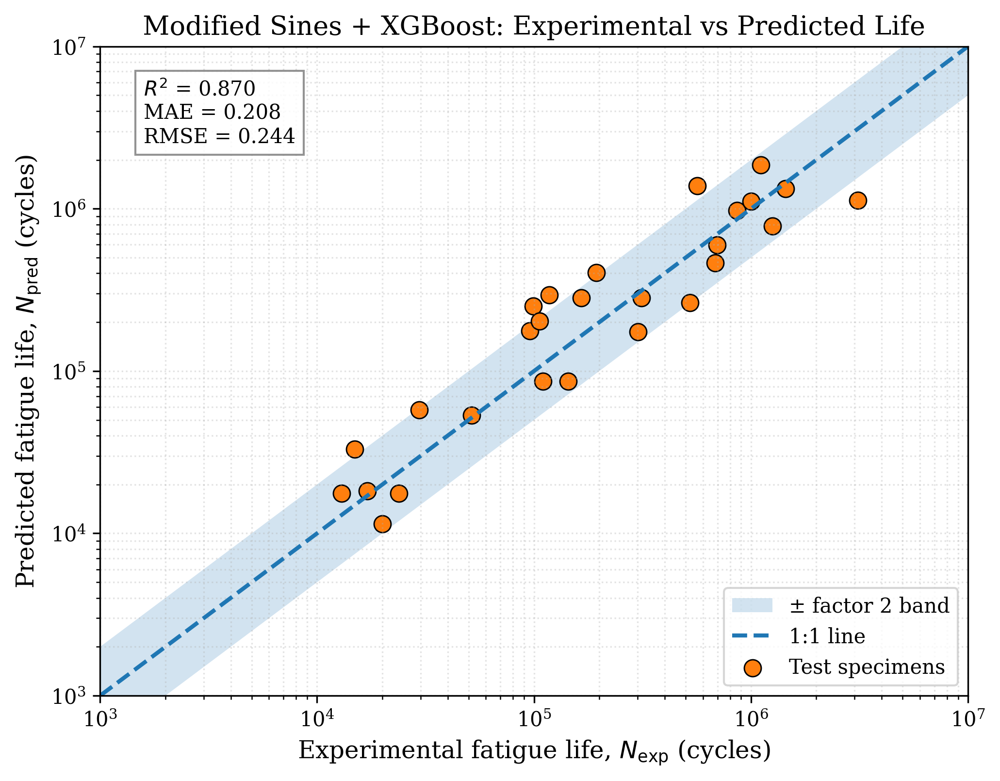

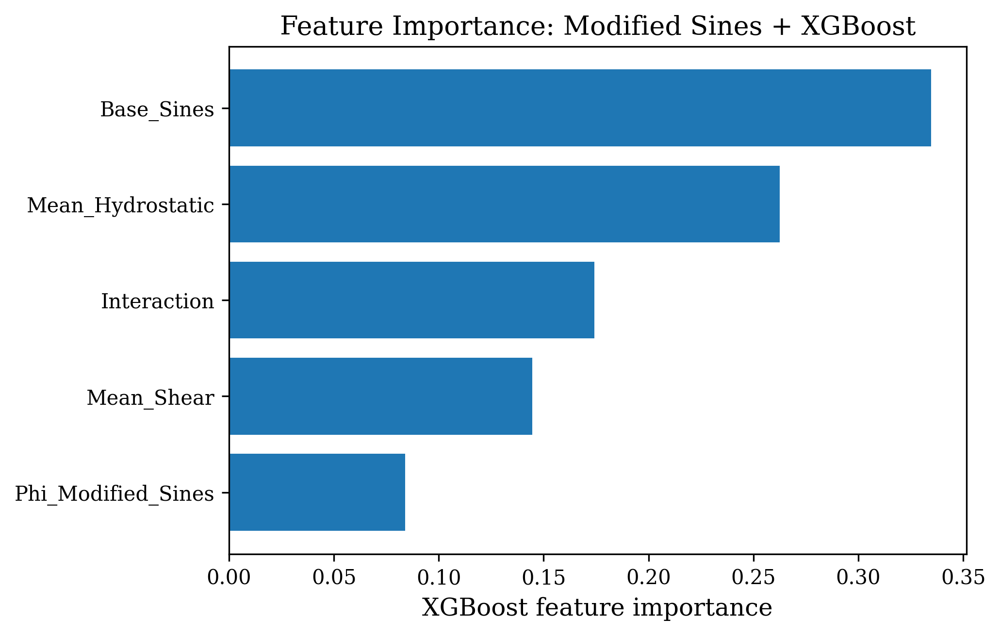

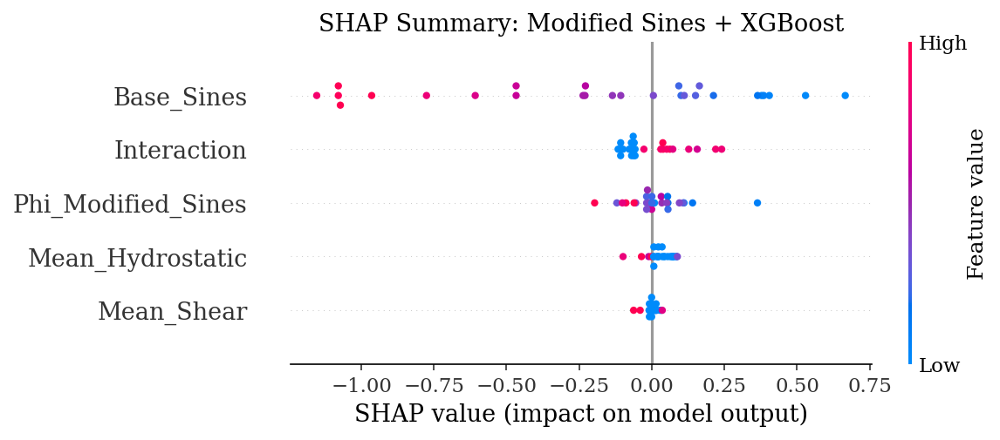


Saved files:
/content/gdrive/My Drive/steel samples/Manuscript#3/ModifiedSines_XGBoost_SHAP/Modified_Sines_XGBoost_Parity.png
/content/gdrive/My Drive/steel samples/Manuscript#3/ModifiedSines_XGBoost_SHAP/Modified_Sines_XGBoost_FeatureImportance.png
/content/gdrive/My Drive/steel samples/Manuscript#3/ModifiedSines_XGBoost_SHAP/Modified_Sines_XGBoost_SHAP_Summary.png
/content/gdrive/My Drive/steel samples/Manuscript#3/ModifiedSines_XGBoost_SHAP/Modified_Sines_XGBoost_Predictions.xlsx


In [ ]:
#============================================================
# Modified Sines + XGBoost + SHAP
# Auto-detects column names
# ============================================================

import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from google.colab import drive
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor
import shap

# ============================================================
# Mount Google Drive
# ============================================================

drive.mount("/content/gdrive", force_remount=False)

# ============================================================
# File settings
# ============================================================

BASE_DIR = Path("/content/gdrive/My Drive/steel samples/Manuscript#3")
DRIVE_ROOT = Path("/content/gdrive/My Drive")

FILE_NAME = "FatigueDataS355_cleaned_133.xlsx"

OUTPUT_DIR = BASE_DIR / "ModifiedSines_XGBoost_SHAP"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# ============================================================
# Find input file
# ============================================================

def find_input_file(
    filename: str,
    base_dir: Path = BASE_DIR,
    search_root: Path = DRIVE_ROOT,
) -> Path:
    """
    Find the requested file in the expected folder or elsewhere
    in Google Drive.
    """
    direct_path = base_dir / filename

    if direct_path.is_file():
        return direct_path

    matches = [
        path for path in search_root.rglob(filename)
        if path.is_file()
    ]

    if not matches:
        target = filename.casefold()
        matches = [
            path for path in search_root.rglob("*")
            if path.is_file() and path.name.casefold() == target
        ]

    if not matches:
        raise FileNotFoundError(
            f"Input file not found: {filename}\n"
            f"Expected location: {direct_path}\n"
            f"Searched under: {search_root}"
        )

    if len(matches) > 1:
        print(f"Warning: multiple files named '{filename}' were found:")
        for match in matches:
            print(f"  - {match}")
        print(f"Using: {matches[0]}")

    return matches[0]


INPUT_FILE = find_input_file(FILE_NAME)

print(f"Loading S355 dataset from:\n{INPUT_FILE}")

# ============================================================
# Load data
# ============================================================

df_raw = pd.read_excel(INPUT_FILE)

print("\nOriginal columns:")
print(df_raw.columns.tolist())

# ============================================================
# Column-name normalization
# ============================================================

def norm_col(name):
    s = str(name).strip().lower()
    s = s.replace("σ", "sigma")
    s = s.replace("τ", "tau")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = re.sub(r"[\s\-/(),.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def find_col(df, candidates):
    norm_map = {norm_col(c): c for c in df.columns}
    for cand in candidates:
        if cand in norm_map:
            return norm_map[cand]
    return None


col_sa = find_col(df_raw, [
    "sa", "s_a", "sigma_a", "sigma_a_mpa", "sig_a", "sig_a_mpa",
    "stress_amplitude", "axial_stress_amplitude"
])

col_ta = find_col(df_raw, [
    "ta", "t_a", "tau_a", "tau_a_mpa", "shear_stress_amplitude",
    "torsional_stress_amplitude"
])

col_sm = find_col(df_raw, [
    "sm", "s_m", "sigma_m", "sigma_m_mpa", "sig_m", "sig_m_mpa",
    "mean_normal_stress", "mean_axial_stress"
])

col_tm = find_col(df_raw, [
    "tm", "t_m", "tau_m", "tau_m_mpa", "mean_shear_stress",
    "mean_torsional_stress"
])

col_n = find_col(df_raw, [
    "nexp", "n_exp", "n_exp_cycles", "nf", "n_f", "nf_exp",
    "nf_exp_cycles", "cycles", "life", "fatigue_life", "2nf"
])

col_crack = find_col(df_raw, [
    "crack", "crack_", "crack_q"
])

print("\nDetected columns:")
print("Sa    =", col_sa)
print("Ta    =", col_ta)
print("Sm    =", col_sm)
print("Tm    =", col_tm)
print("Nexp  =", col_n)
print("crack =", col_crack)

if col_sa is None or col_ta is None or col_n is None:
    raise ValueError(
        "Could not detect Sa, Ta, or Nexp column. "
        "Check the printed column names above."
    )

# ============================================================
# Standardized dataframe
# ============================================================

df = pd.DataFrame(index=df_raw.index)

df["Sa"] = pd.to_numeric(df_raw[col_sa], errors="coerce")
df["Ta"] = pd.to_numeric(df_raw[col_ta], errors="coerce")

if col_sm:
    df["Sm"] = pd.to_numeric(df_raw[col_sm], errors="coerce").fillna(0.0)
else:
    df["Sm"] = 0.0

if col_tm:
    df["Tm"] = pd.to_numeric(df_raw[col_tm], errors="coerce").fillna(0.0)
else:
    df["Tm"] = 0.0

df["Nexp"] = pd.to_numeric(df_raw[col_n], errors="coerce")

if norm_col(col_n) == "2nf":
    df["Nexp"] = df["Nexp"] / 2.0

if col_crack:
    df["crack"] = pd.to_numeric(df_raw[col_crack], errors="coerce")
else:
    df["crack"] = 1

df = df.dropna(subset=["Sa", "Ta", "Sm", "Tm", "Nexp"]).copy()

df = df[
    (df["Nexp"] > 0)
    & (df["Sa"] >= 0)
    & (df["Ta"] >= 0)
].copy()

unique_crack_values = set(df["crack"].dropna().unique().tolist())
if unique_crack_values and unique_crack_values.issubset({0, 1}):
    df = df[df["crack"] == 1].copy()

df = df.reset_index(drop=True)
df["ID"] = np.arange(1, len(df) + 1)

print("\nCleaned shape:", df.shape)
print(df.head())

# ============================================================
# Modified Sines features
# ============================================================

eps = 1e-9

Sa = df["Sa"].abs()
Ta = df["Ta"].abs()
Sm = df["Sm"]
Tm = df["Tm"].abs()

df["Base_Sines"] = np.sqrt((Sa**2 / 3.0) + Ta**2)
df["Mean_Hydrostatic"] = Sm / 3.0
df["Interaction"] = (Sa * Ta) / (Sa + Ta + eps)
df["Mean_Shear"] = Tm

df["Phi_Modified_Sines"] = (
    df["Base_Sines"]
    + df["Mean_Hydrostatic"]
    + df["Interaction"]
    + df["Mean_Shear"]
)

df["logN"] = np.log10(df["Nexp"])

features = [
    "Base_Sines",
    "Mean_Hydrostatic",
    "Interaction",
    "Mean_Shear",
    "Phi_Modified_Sines",
]

X = df[features].copy()
y = df["logN"].copy()

# ============================================================
# Train-test split
# ============================================================

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=42,
)

# ============================================================
# XGBoost model
# ============================================================

model = XGBRegressor(
    n_estimators=300,
    max_depth=4,
    learning_rate=0.035,
    subsample=0.85,
    colsample_bytree=0.85,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1,
)

model.fit(X_train, y_train)

# ============================================================
# Metrics
# ============================================================

y_pred = model.predict(X_test)

r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print("\nModified Sines + XGBoost Results")
print("--------------------------------")
print(f"R²   = {r2:.3f}")
print(f"MAE  = {mae:.3f} log10(N)")
print(f"RMSE = {rmse:.3f} log10(N)")

cv = KFold(n_splits=5, shuffle=True, random_state=42)

cv_r2 = cross_val_score(
    model,
    X,
    y,
    cv=cv,
    scoring="r2",
    n_jobs=-1,
)

cv_mae = -cross_val_score(
    model,
    X,
    y,
    cv=cv,
    scoring="neg_mean_absolute_error",
    n_jobs=-1,
)

print("\n5-Fold Cross Validation")
print("-----------------------")
print(f"Mean R²  = {cv_r2.mean():.3f} ± {cv_r2.std(ddof=1):.3f}")
print(f"Mean MAE = {cv_mae.mean():.3f} ± {cv_mae.std(ddof=1):.3f}")

# ============================================================
# Parity plot
# ============================================================

N_exp_test = 10 ** y_test
N_pred_test = 10 ** y_pred

xmin = min(N_exp_test.min(), N_pred_test.min()) * 0.5
xmax = max(N_exp_test.max(), N_pred_test.max()) * 2.0

xmin = 10 ** np.floor(np.log10(xmin))
xmax = 10 ** np.ceil(np.log10(xmax))

line = np.logspace(np.log10(xmin), np.log10(xmax), 500)

fig, ax = plt.subplots(figsize=(7, 5.5), dpi=300)

ax.fill_between(
    line,
    line / 2,
    line * 2,
    alpha=0.20,
    label="± factor 2 band",
)

ax.plot(
    line,
    line,
    "--",
    linewidth=2,
    label="1:1 line",
)

ax.scatter(
    N_exp_test,
    N_pred_test,
    s=70,
    edgecolor="black",
    linewidth=0.7,
    label="Test specimens",
)

ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlim(xmin, xmax)
ax.set_ylim(xmin, xmax)

ax.set_xlabel(r"Experimental fatigue life, $N_{\mathrm{exp}}$ (cycles)")
ax.set_ylabel(r"Predicted fatigue life, $N_{\mathrm{pred}}$ (cycles)")
ax.set_title("Modified Sines + XGBoost: Experimental vs Predicted Life")

text = (
    rf"$R^2$ = {r2:.3f}" "\n"
    f"MAE = {mae:.3f}\n"
    f"RMSE = {rmse:.3f}"
)

ax.text(
    0.05,
    0.95,
    text,
    transform=ax.transAxes,
    va="top",
    ha="left",
    fontsize=10,
    bbox=dict(facecolor="white", edgecolor="gray", alpha=0.85),
)

ax.grid(True, which="both", linestyle=":", alpha=0.35)
ax.legend()
fig.tight_layout()

parity_file = OUTPUT_DIR / "Modified_Sines_XGBoost_Parity.png"
fig.savefig(parity_file, dpi=600, bbox_inches="tight")
plt.show()
plt.close(fig)

# ============================================================
# Feature importance
# ============================================================

importance = pd.Series(
    model.feature_importances_,
    index=features,
).sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(7, 4.5), dpi=300)
ax.barh(importance.index, importance.values)
ax.set_xlabel("XGBoost feature importance")
ax.set_title("Feature Importance: Modified Sines + XGBoost")
fig.tight_layout()

importance_file = OUTPUT_DIR / "Modified_Sines_XGBoost_FeatureImportance.png"
fig.savefig(importance_file, dpi=600, bbox_inches="tight")
plt.show()
plt.close(fig)

# ============================================================
# SHAP analysis
# ============================================================

try:
    explainer = shap.TreeExplainer(model)
    shap_values = explainer(X_test)

    shap.summary_plot(
        shap_values,
        X_test,
        show=False,
    )

except Exception as error:
    print(f"\nTreeExplainer failed: {error}")
    print("Using the general SHAP Explainer instead.")

    explainer = shap.Explainer(
        model.predict,
        X_train,
    )
    shap_values = explainer(X_test)

    shap.summary_plot(
        shap_values,
        X_test,
        show=False,
    )

plt.title("SHAP Summary: Modified Sines + XGBoost")
plt.tight_layout()

shap_file = OUTPUT_DIR / "Modified_Sines_XGBoost_SHAP_Summary.png"
plt.savefig(shap_file, dpi=600, bbox_inches="tight")
plt.show()
plt.close()

# ============================================================
# Save predictions and metrics
# ============================================================

results = pd.DataFrame({
    "ID": df.loc[y_test.index, "ID"].values,
    "Nexp": N_exp_test.values,
    "Npred": N_pred_test,
    "logN_exp": y_test.values,
    "logN_pred": y_pred,
    "residual_log10N": y_test.values - y_pred,
    "abs_error_log10N": np.abs(y_test.values - y_pred),
})

metrics = pd.DataFrame([{
    "R2_test": r2,
    "MAE_test_log10N": mae,
    "RMSE_test_log10N": rmse,
    "CV_R2_mean": cv_r2.mean(),
    "CV_R2_std": cv_r2.std(ddof=1),
    "CV_MAE_mean": cv_mae.mean(),
    "CV_MAE_std": cv_mae.std(ddof=1),
    "n_total": len(df),
    "n_train": len(X_train),
    "n_test": len(X_test),
}])

importance_df = (
    importance
    .rename("Importance")
    .reset_index()
    .rename(columns={"index": "Feature"})
)

predictions_file = (
    OUTPUT_DIR / "Modified_Sines_XGBoost_Predictions.xlsx"
)

with pd.ExcelWriter(
    predictions_file,
    engine="openpyxl",
) as writer:

    metrics.to_excel(
        writer,
        sheet_name="Metrics",
        index=False,
    )

    results.to_excel(
        writer,
        sheet_name="Test_Predictions",
        index=False,
    )

    importance_df.to_excel(
        writer,
        sheet_name="Feature_Importance",
        index=False,
    )

print("\nSaved files:")
print(parity_file)
print(importance_file)
print(shap_file)
print(predictions_file)

####Multi-Material SHAP Analysis of Modified Sines–XGBoost Fatigue-Life Models

####Brief description:
This code loads and standardizes fatigue datasets for S355, 7075-T651, MS1, and CuZn37, constructs physics-informed Modified Sines descriptors, and trains XGBoost models to predict fatigue life in log
10
	​

(N). It evaluates each material and combined datasets using train–test metrics and five-fold cross-validation, then applies SHAP to quantify the contribution of the Sines invariant-amplitude base, axial–torsional interaction, mean hydrostatic stress, and mean shear stress. The workflow also generates parity plots, SHAP rankings, dependence plots, and the publication-ready Figure 13 titled “Global SHAP importance: combined principal datasets.

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Loading S355 from:
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx

S355 original columns:
['Sm', 'Tm', 'Sa', 'Ta', 'Nexp', 'crack', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Legend', 'Unnamed: 10']

S355 columns detected:
Sa   = Sa
Ta   = Ta
Sm   = Sm
Tm   = Tm
Nexp = Nexp
S355 cleaned shape: (133, 7)
           Sa   Ta   Sm   Tm       Nexp
0  426.502699  0.0  0.0  0.0    77730.0
1  484.335254  0.0  0.0  0.0    28045.0
2  504.713918  0.0  0.0  0.0    20595.0
3  557.980881  0.0  0.0  0.0     8115.0
4  342.262896  0.0  0.0  0.0  1252208.0
Loading 7075_T651 from:
/content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx

7075_T651 original columns:
['Sm', 'Tm', 'Sa', 'Ta', 'Nexp', 'crack', 'Unnamed: 6', 'Unnamed: 7', 'Legend', 'Unnamed: 9']

7075_T651 columns detected:
Sa   = Sa
Ta   = Ta
S

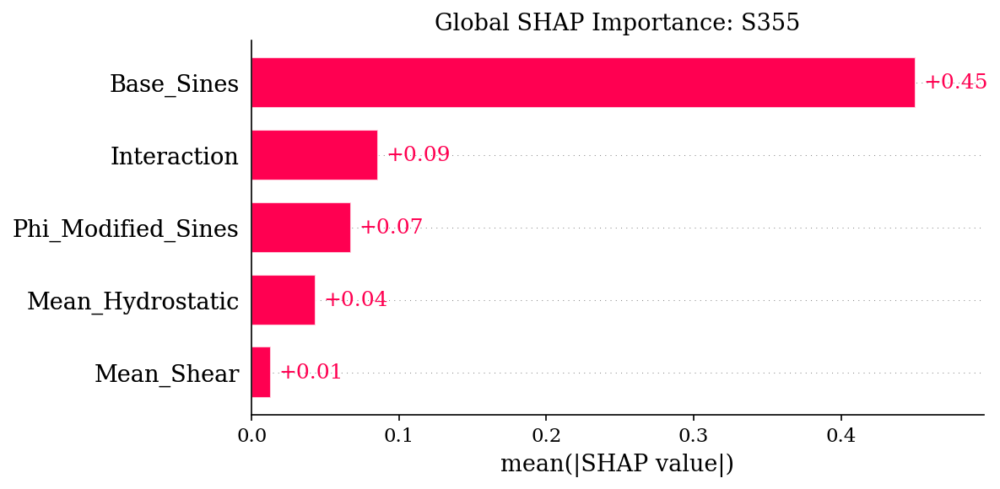

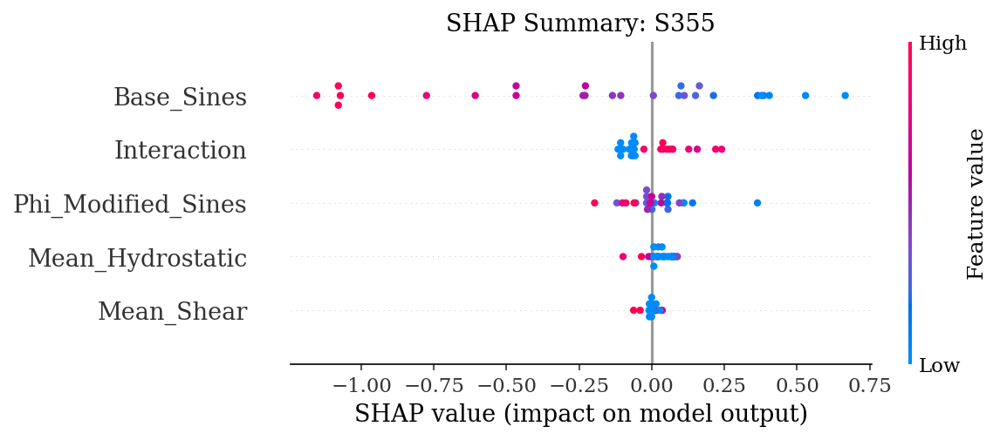

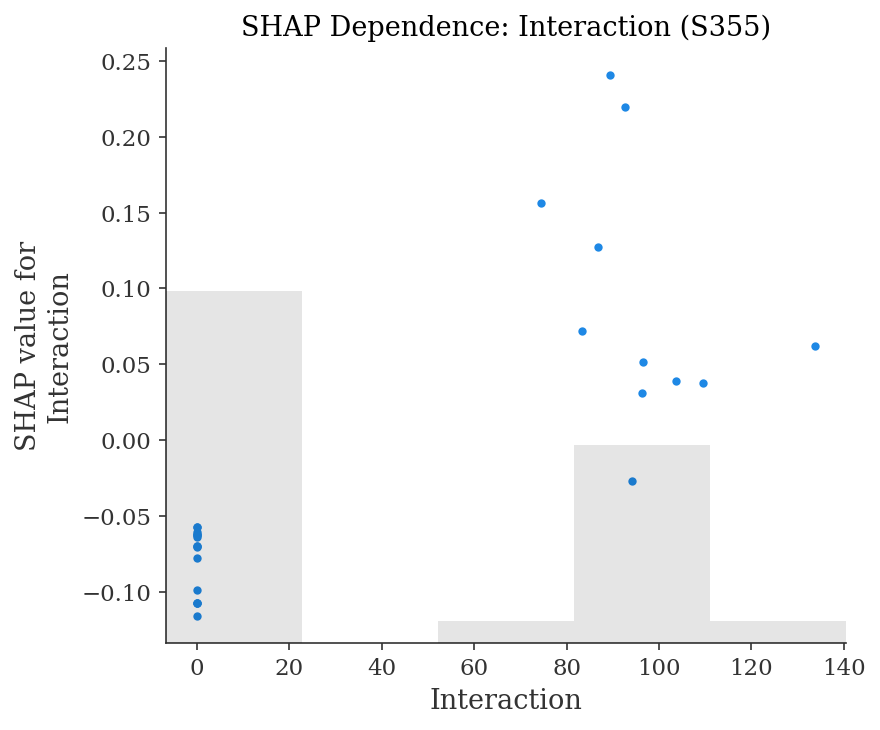

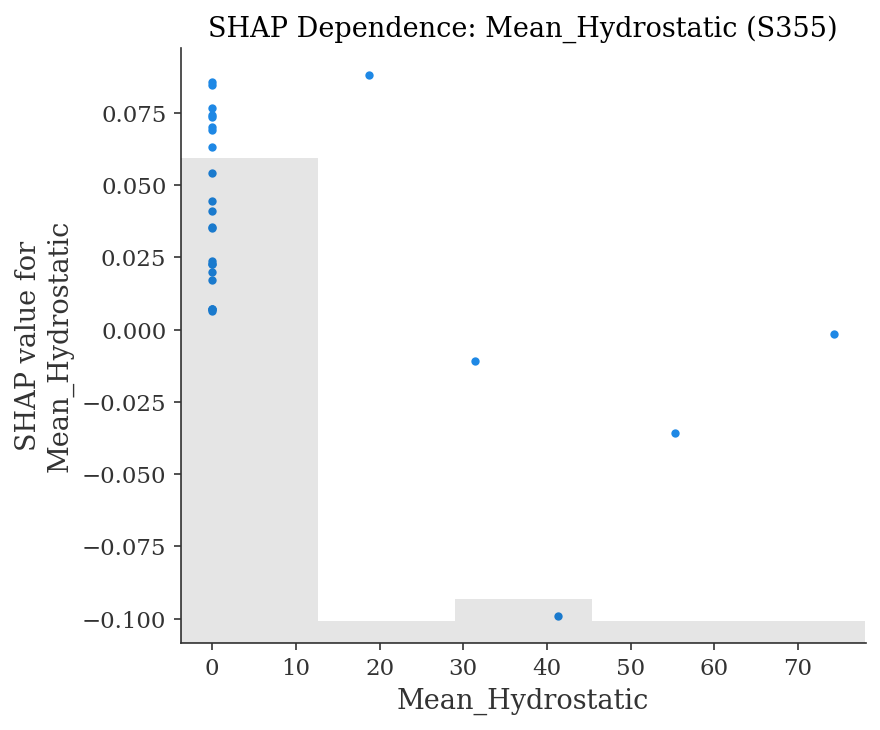

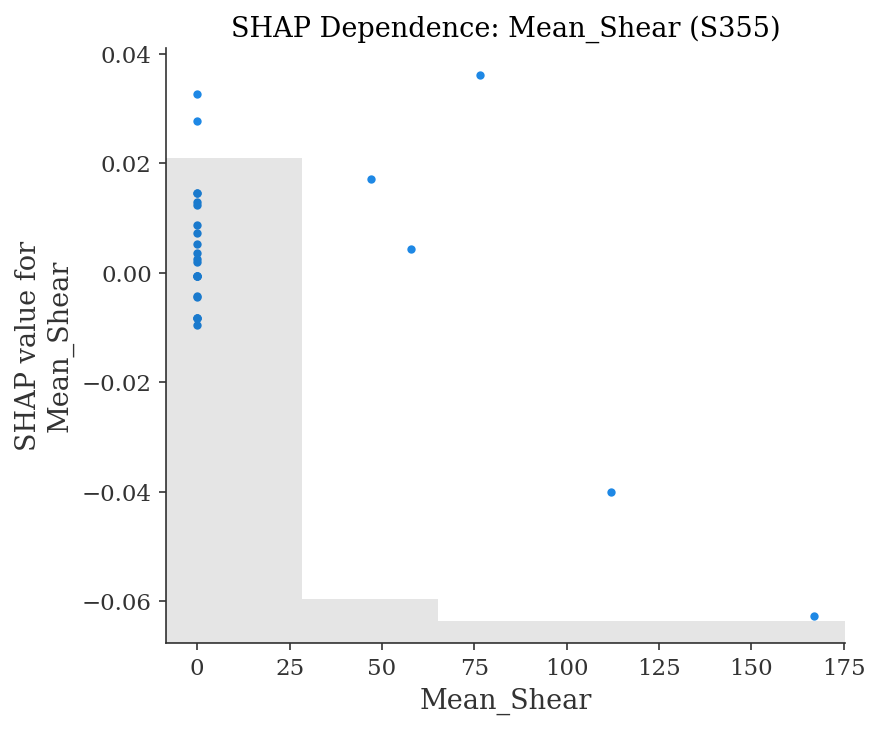

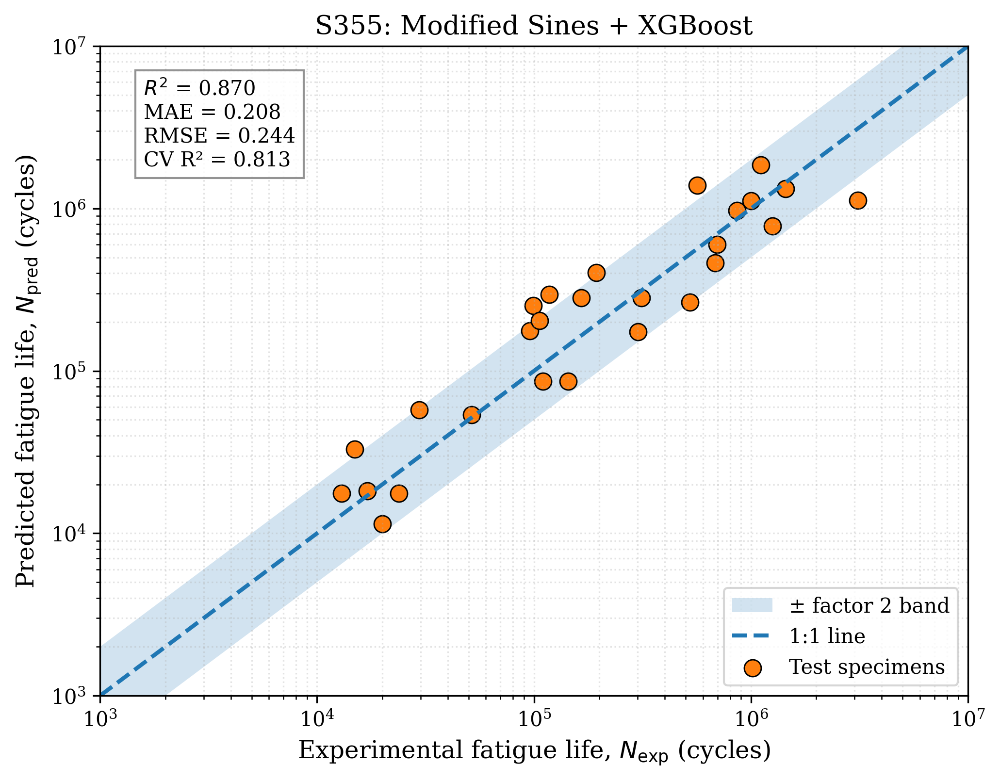


=== 7075_T651 ===
Test R²  = 0.935
Test MAE = 0.159
RMSE     = 0.196
CV R²    = 0.839 ± 0.068

SHAP ranking:
  Dataset            Feature  Mean_abs_SHAP
7075_T651         Base_Sines       0.430525
7075_T651 Phi_Modified_Sines       0.113908
7075_T651   Mean_Hydrostatic       0.047534
7075_T651         Mean_Shear       0.038593
7075_T651        Interaction       0.038072


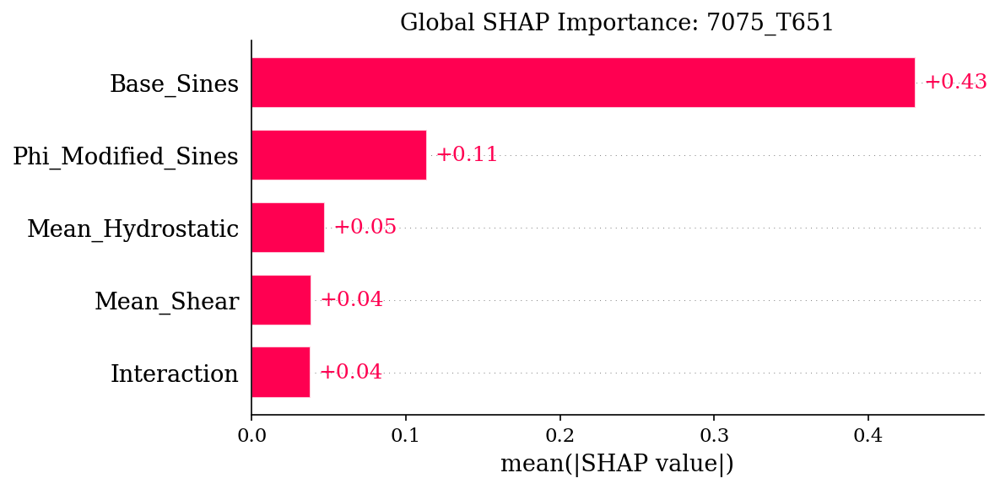

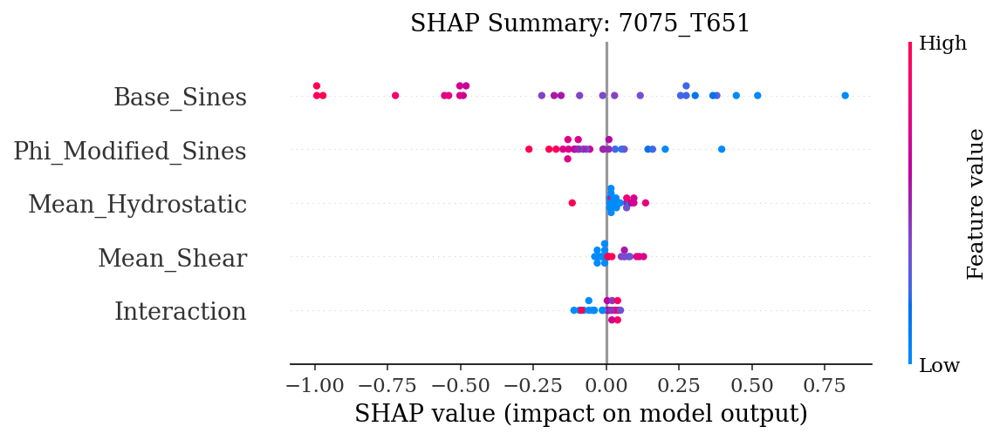

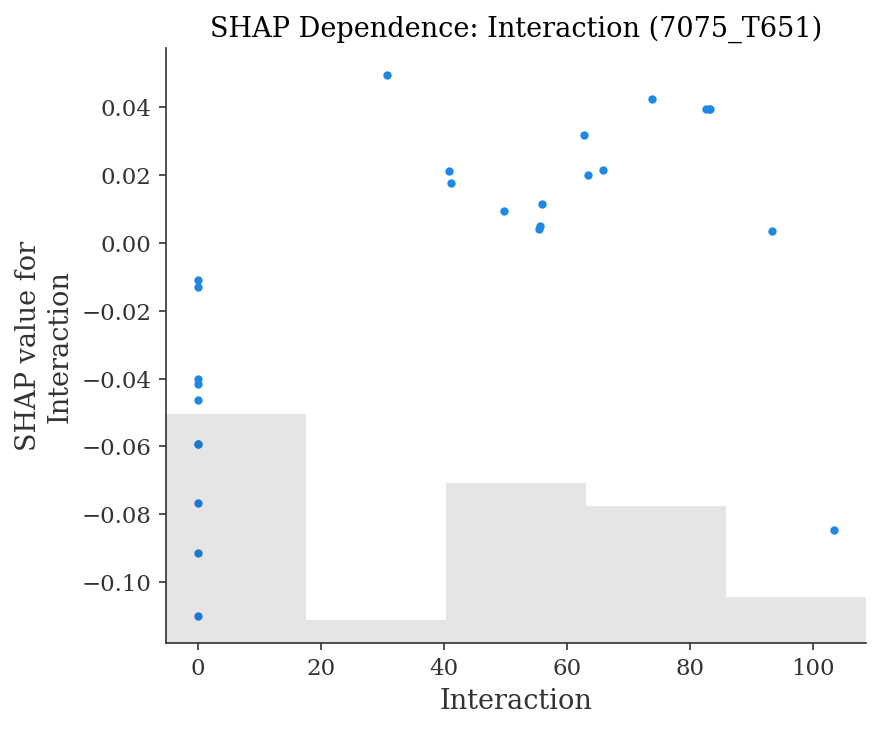

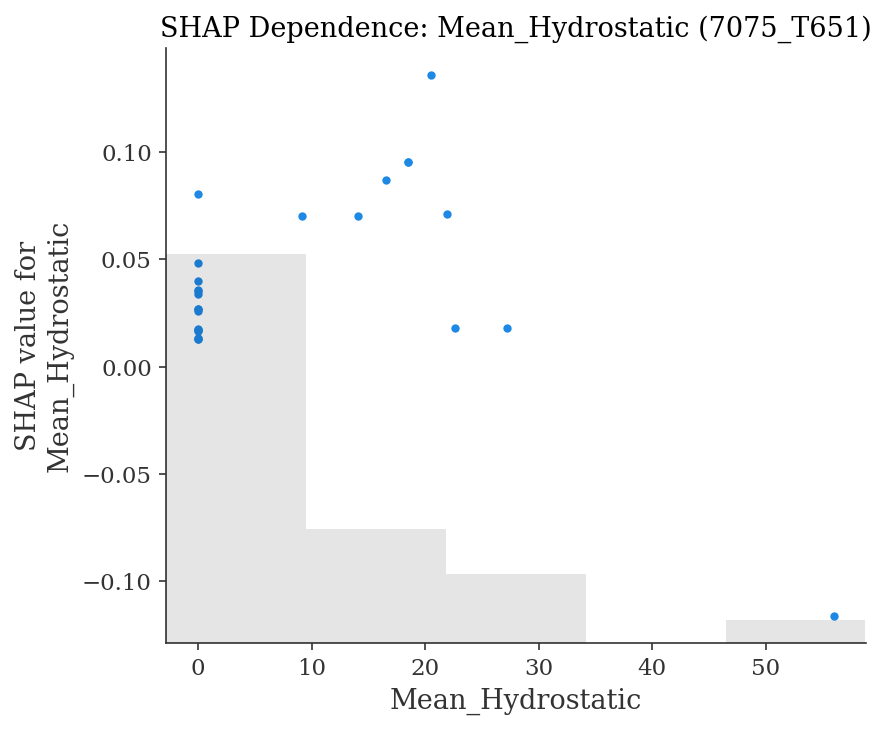

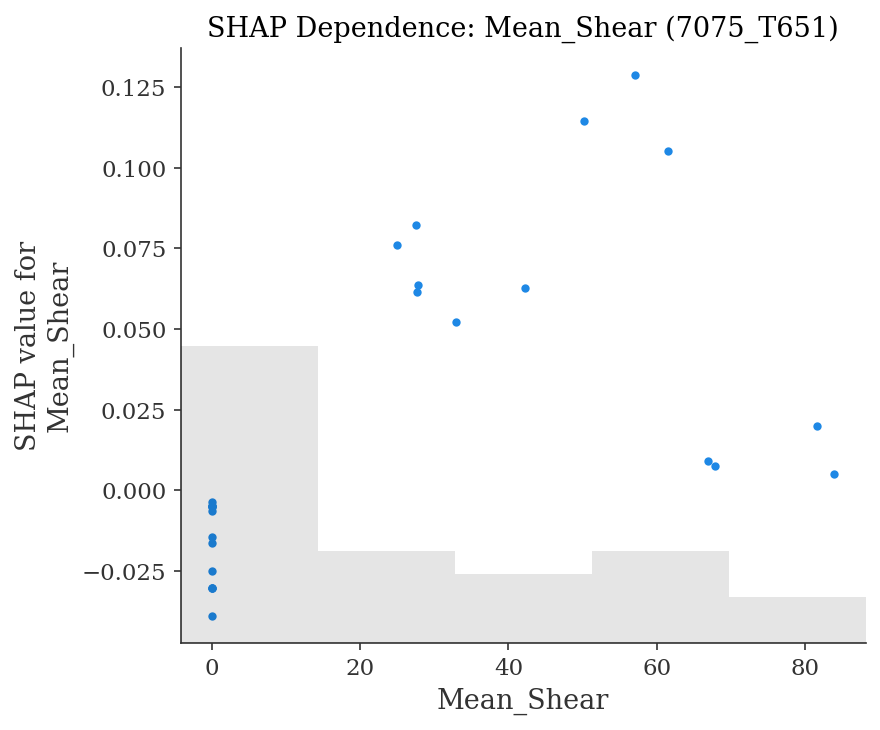

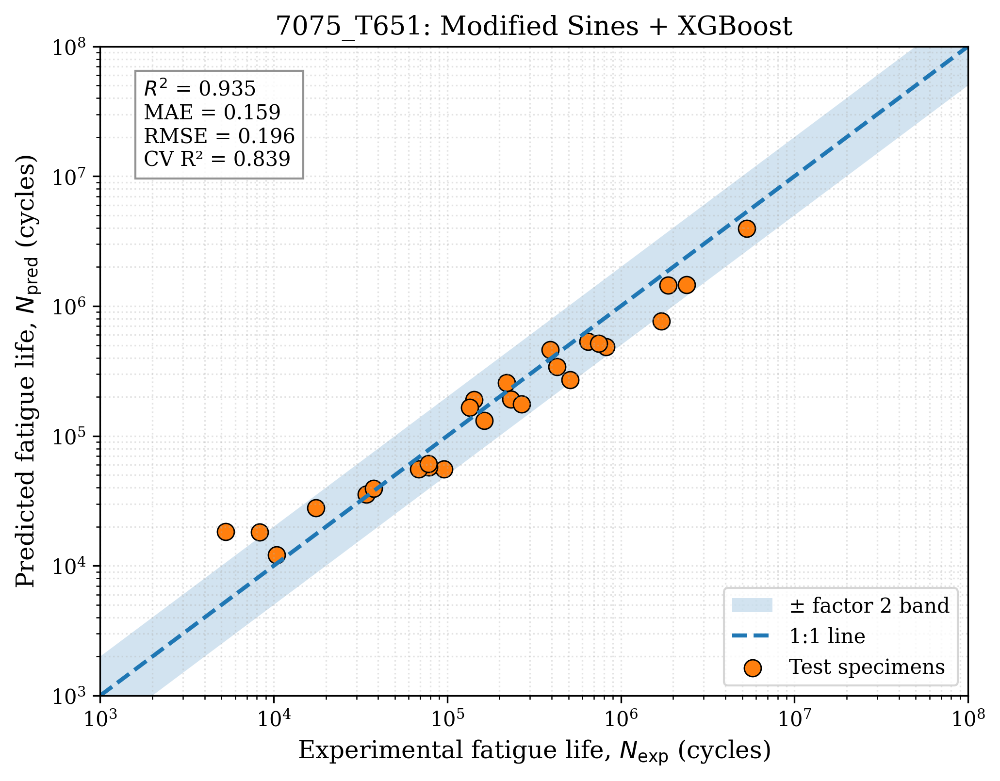


=== MS1 ===
Test R²  = 0.636
Test MAE = 0.311
RMSE     = 0.488
CV R²    = 0.771 ± 0.097

SHAP ranking:
Dataset            Feature  Mean_abs_SHAP
    MS1         Base_Sines       0.575859
    MS1   Mean_Hydrostatic       0.209064
    MS1 Phi_Modified_Sines       0.170574
    MS1        Interaction       0.064518
    MS1         Mean_Shear       0.041914


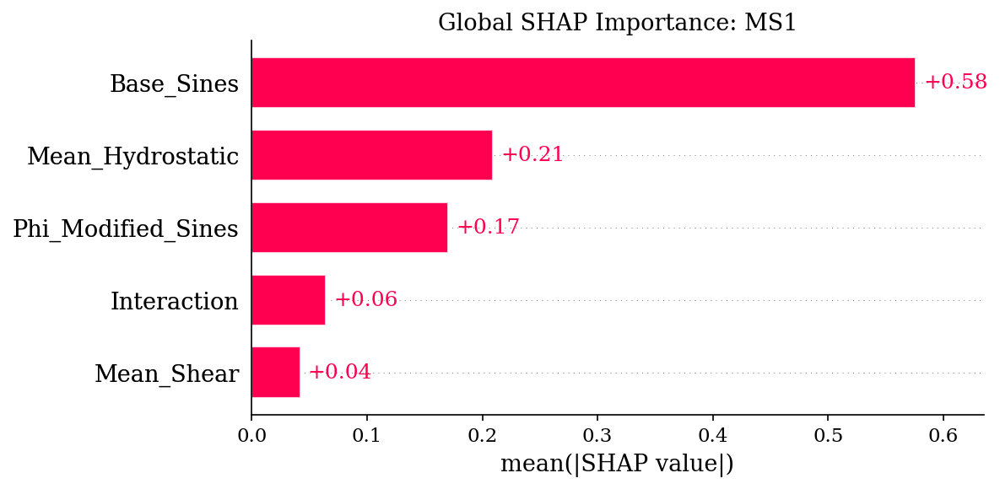

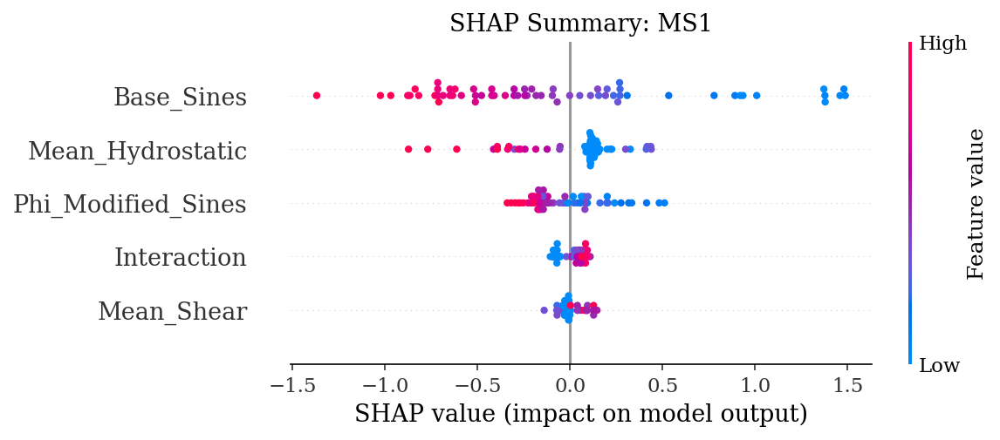

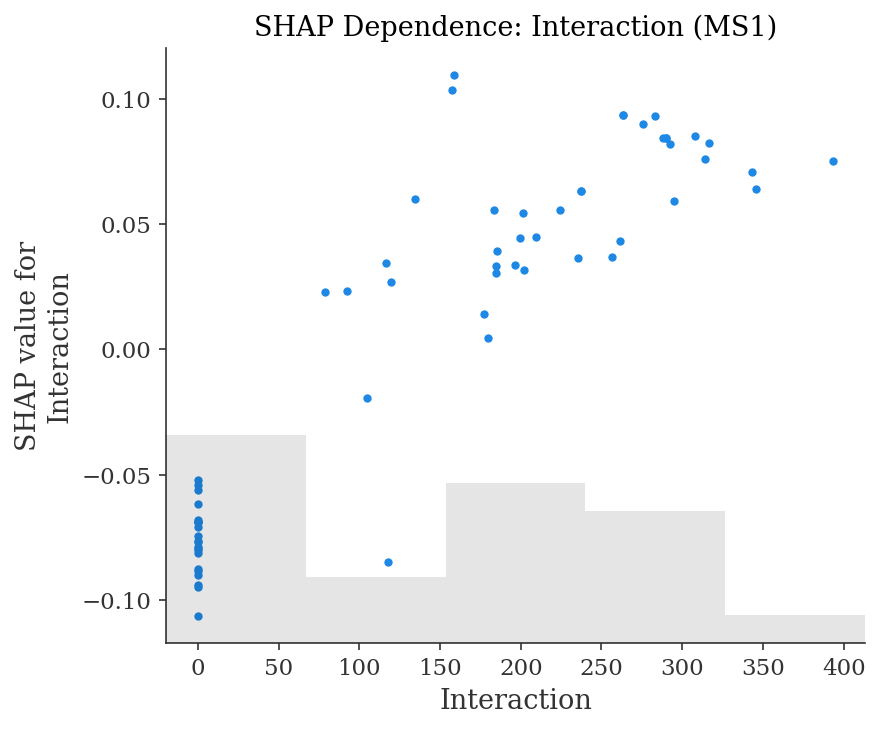

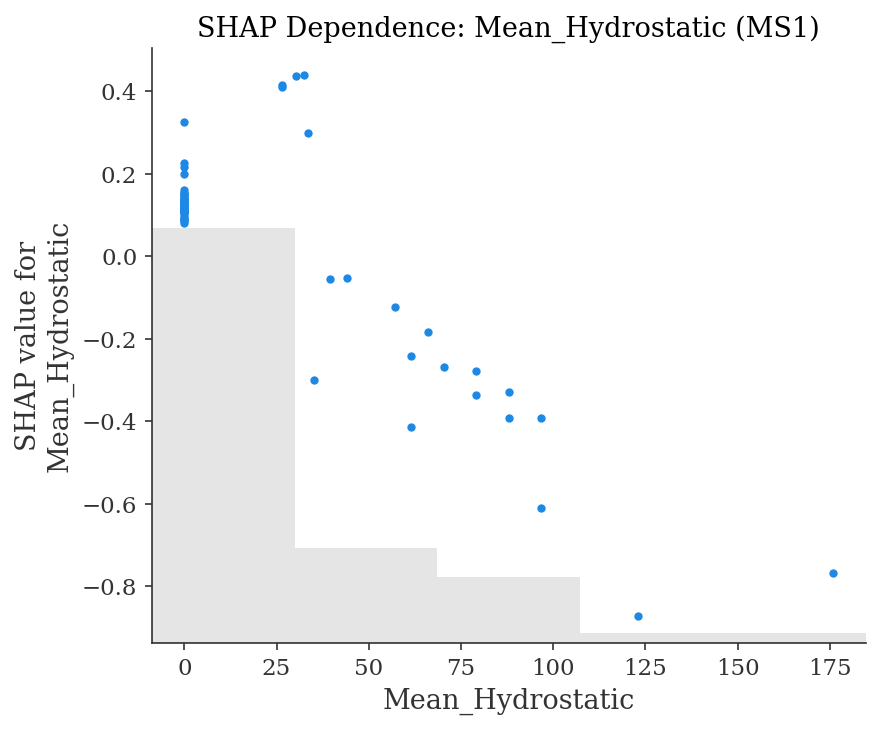

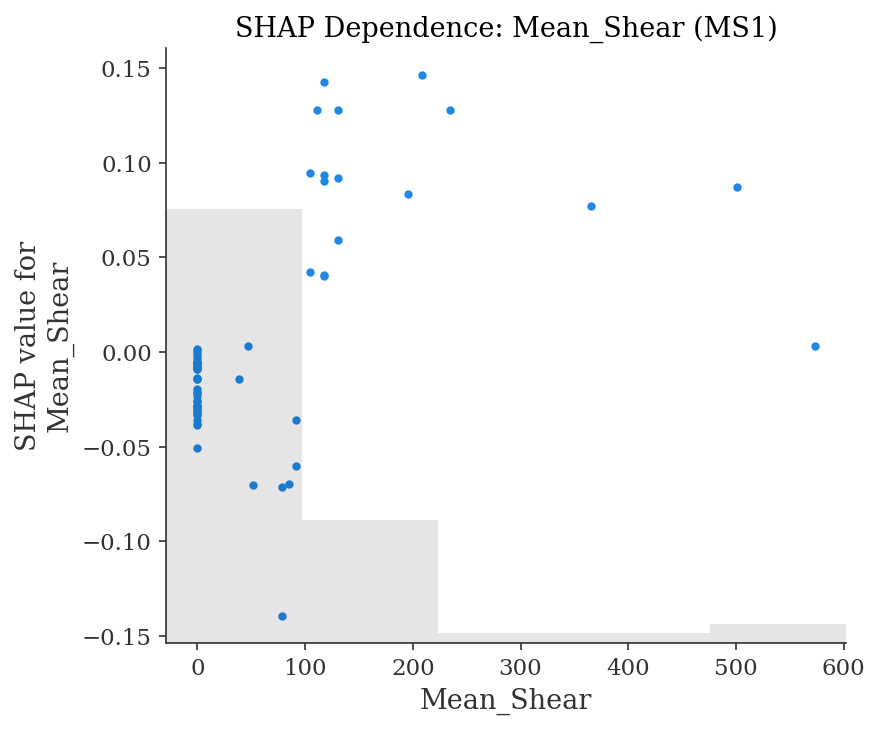

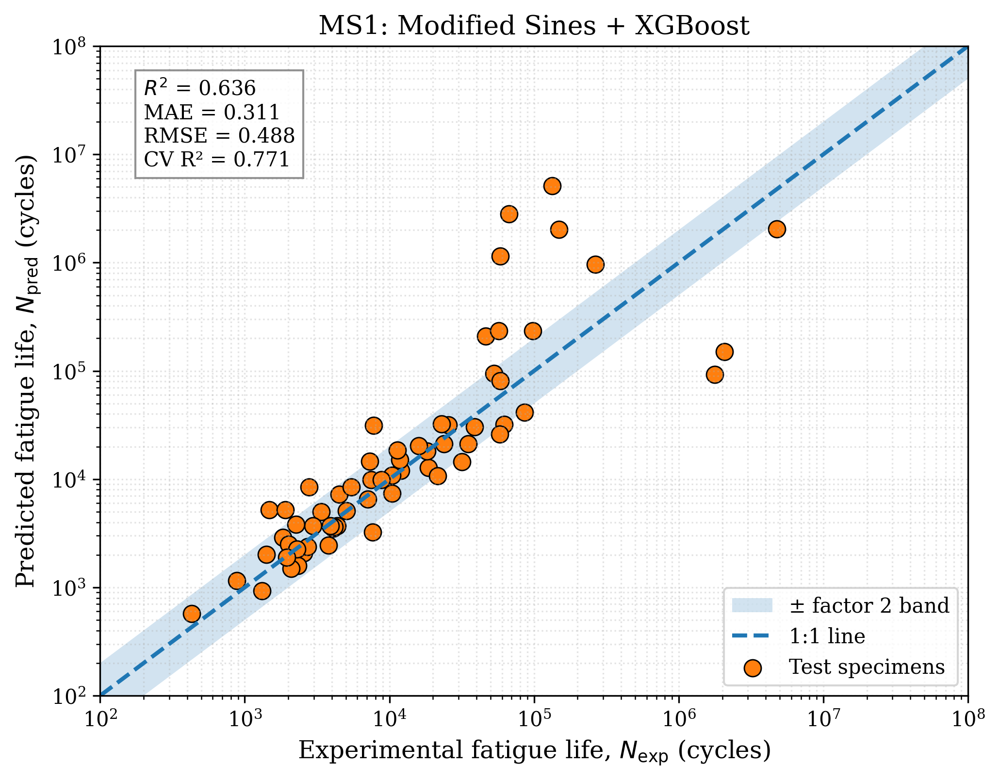


=== CuZn37 ===
Test R²  = 0.815
Test MAE = 0.154
RMSE     = 0.202
CV R²    = 0.733 ± 0.282

SHAP ranking:
Dataset            Feature  Mean_abs_SHAP
 CuZn37         Base_Sines       0.330746
 CuZn37        Interaction       0.097277
 CuZn37 Phi_Modified_Sines       0.006073
 CuZn37   Mean_Hydrostatic       0.000000
 CuZn37         Mean_Shear       0.000000


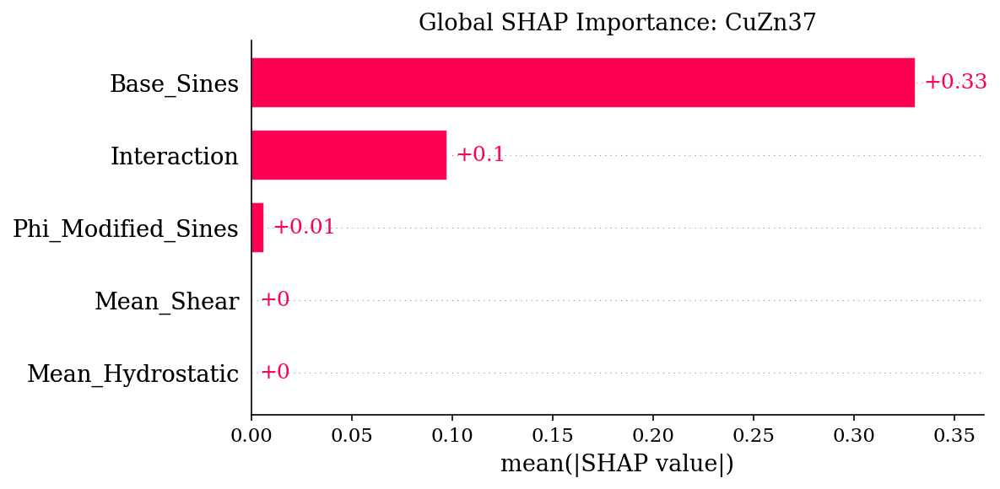

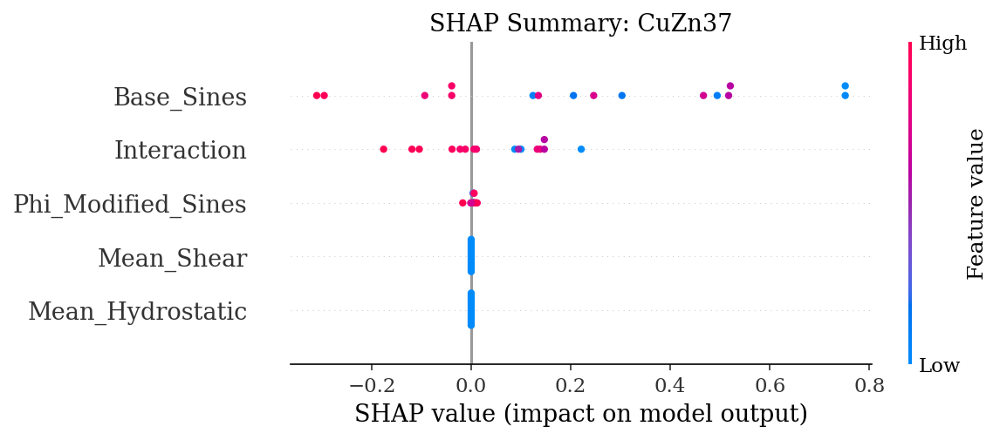

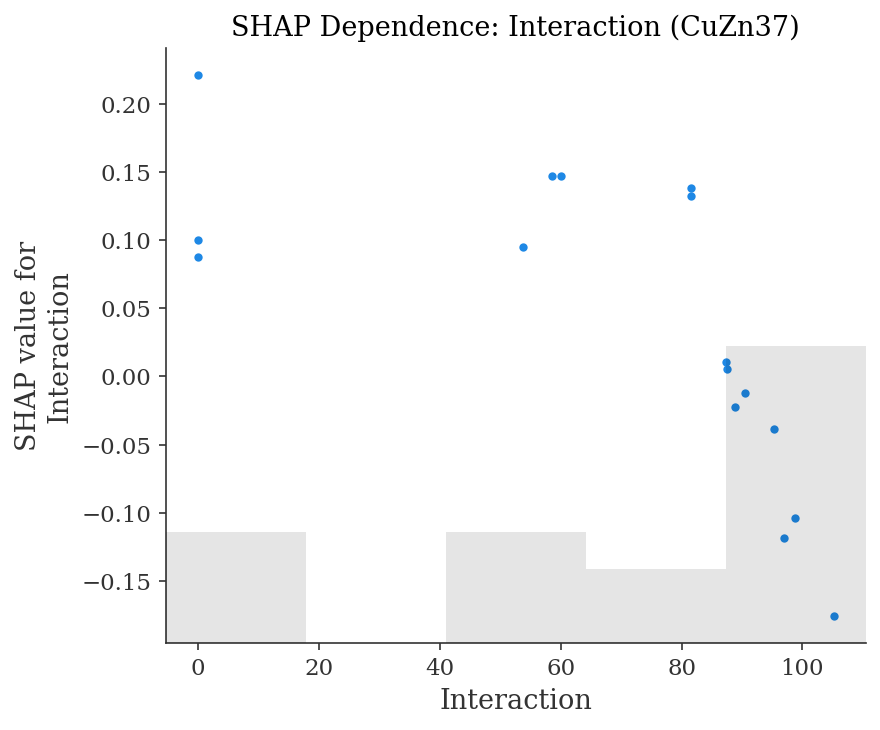

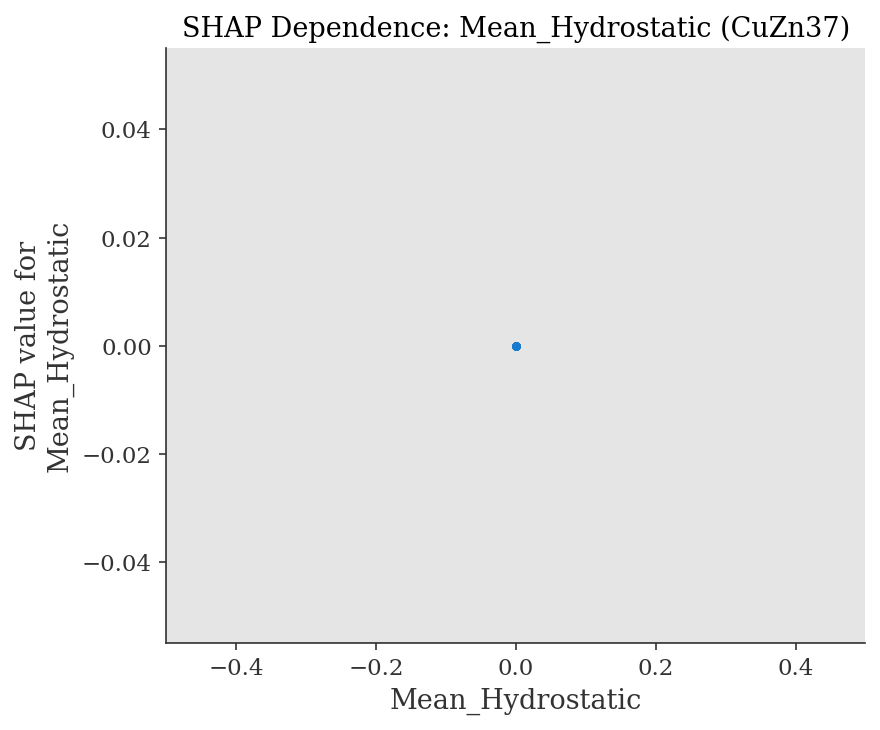

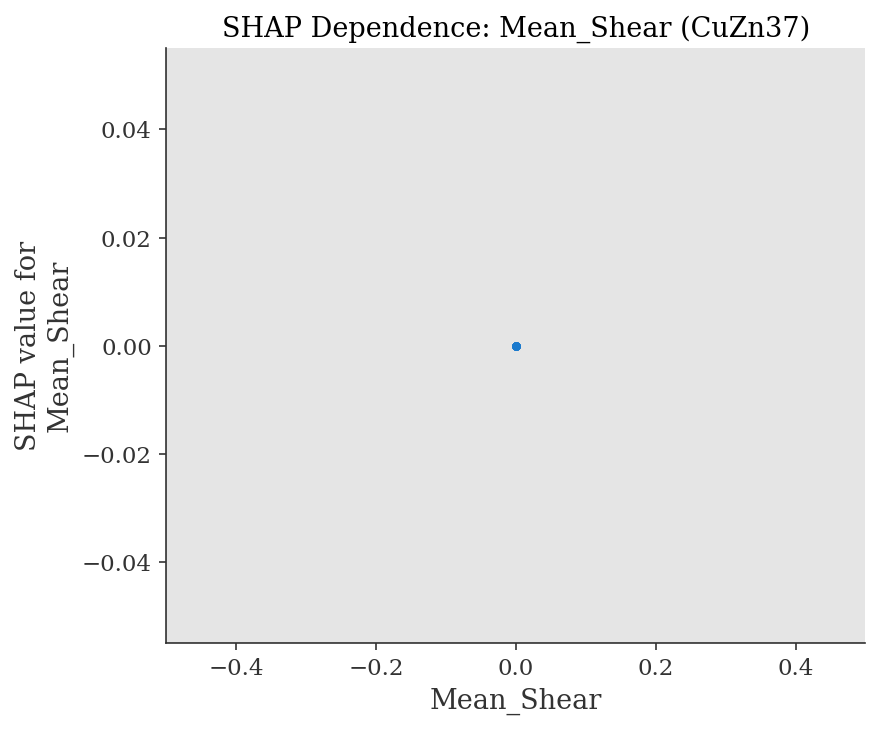

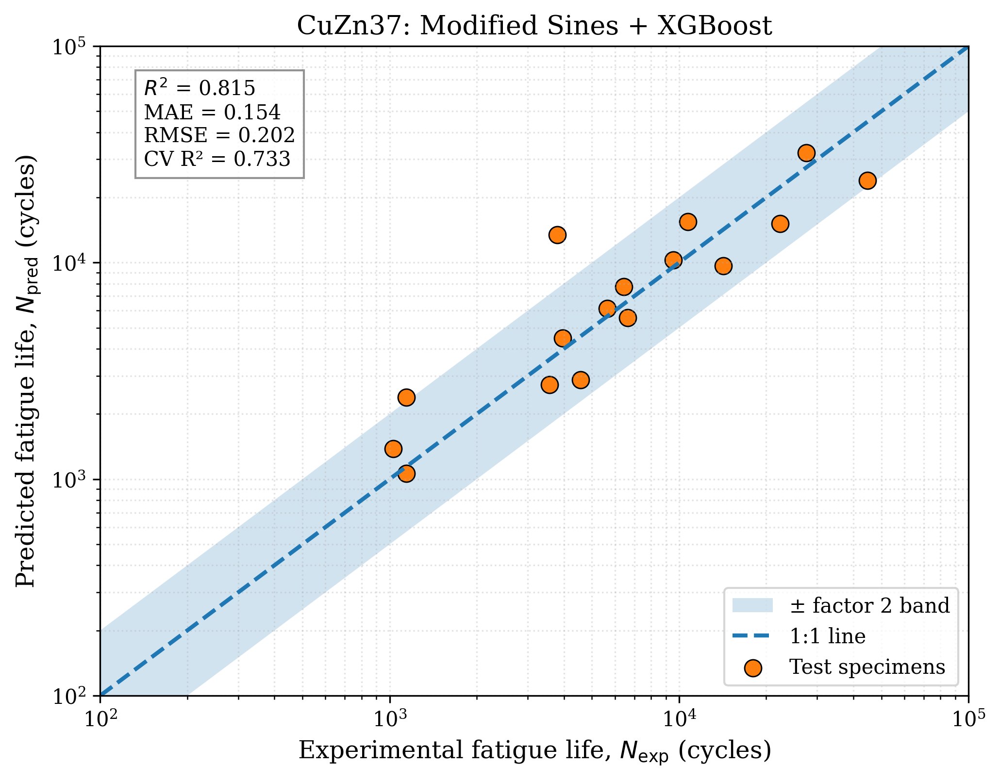


=== Combined_MAIN ===
Test R²  = 0.764
Test MAE = 0.345
RMSE     = 0.479
CV R²    = 0.763 ± 0.039

SHAP ranking:
      Dataset            Feature  Mean_abs_SHAP
Combined_MAIN         Base_Sines       0.564293
Combined_MAIN Phi_Modified_Sines       0.216992
Combined_MAIN         Mean_Shear       0.075795
Combined_MAIN   Mean_Hydrostatic       0.073181
Combined_MAIN        Interaction       0.051966


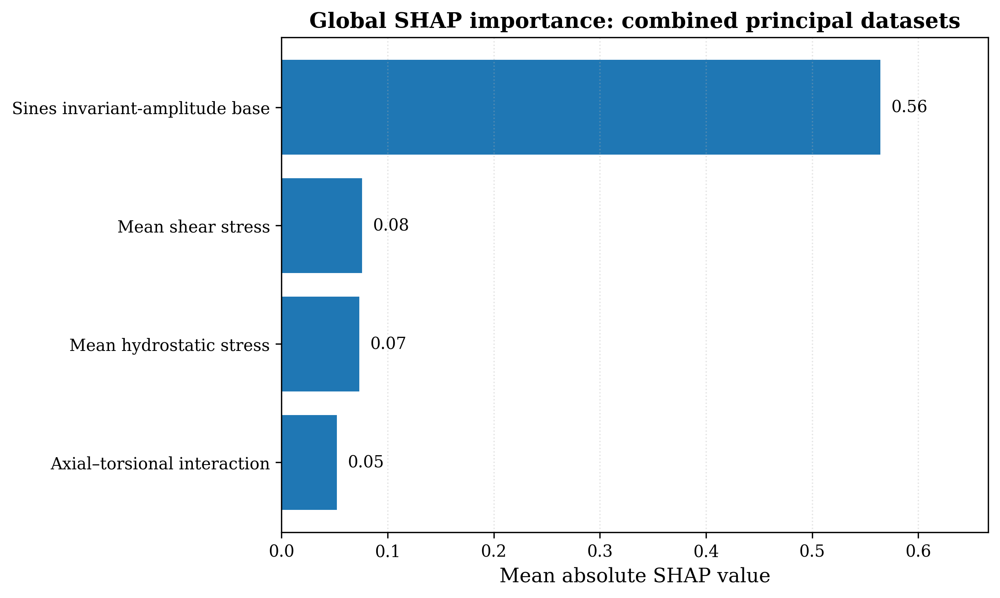

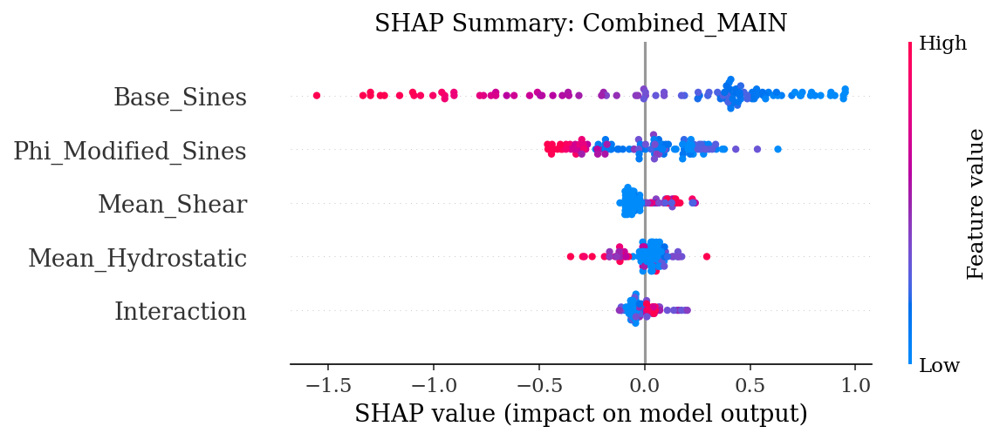

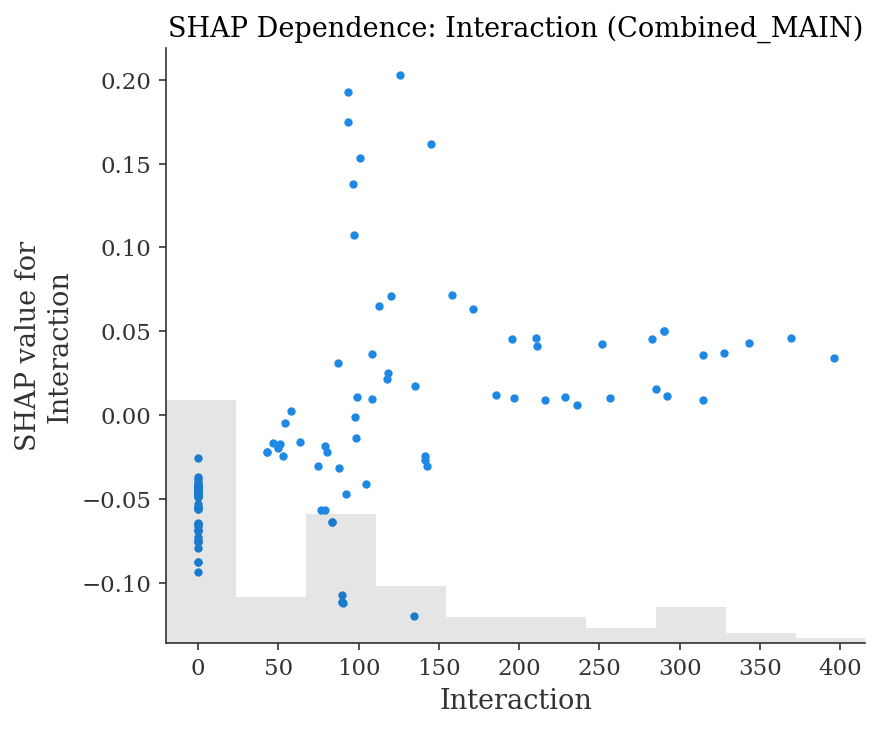

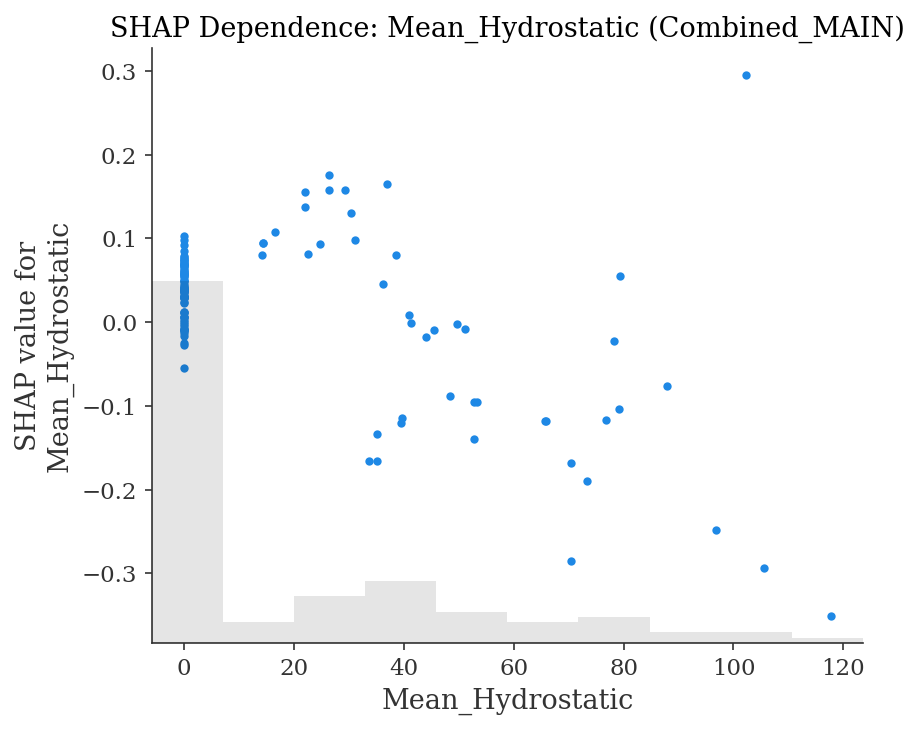

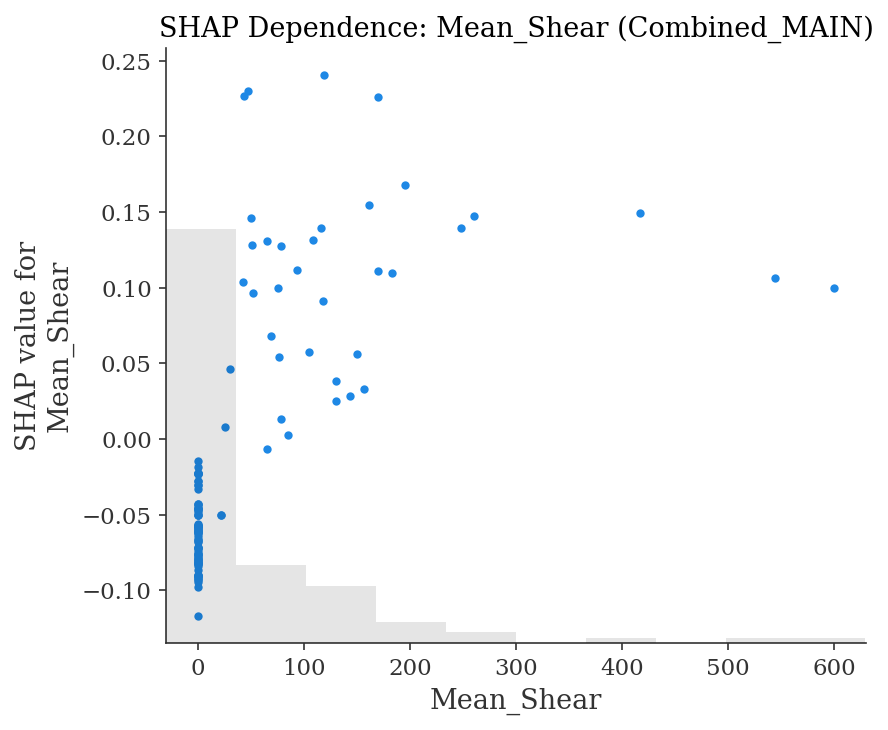

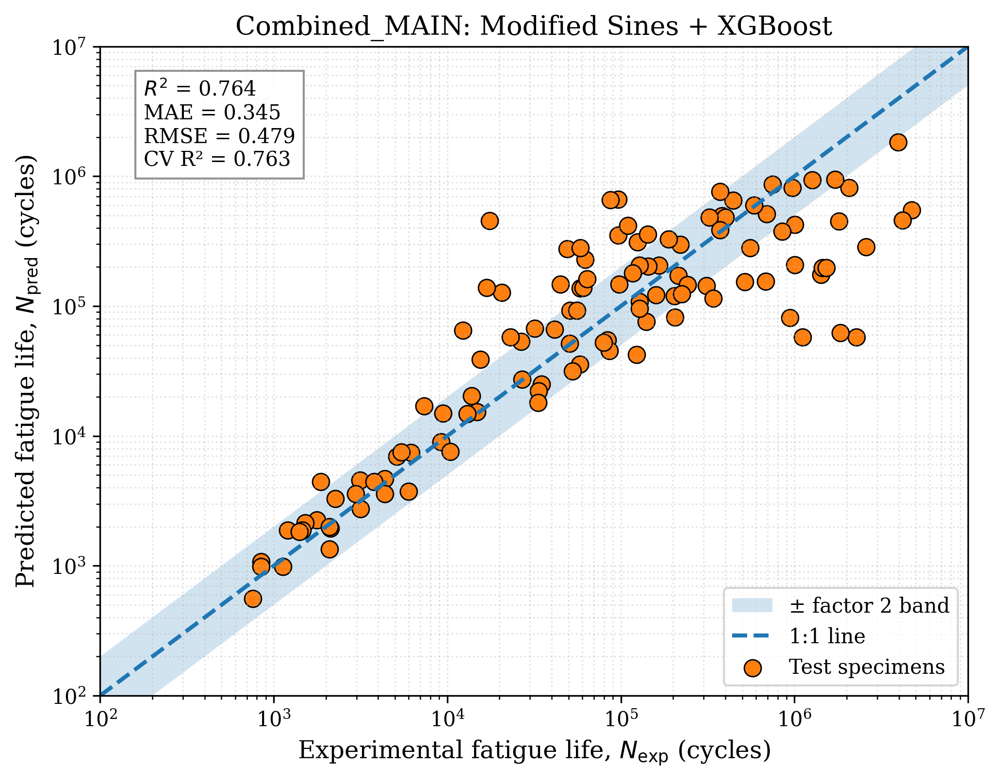


=== Combined_ALL ===
Test R²  = 0.499
Test MAE = 0.493
RMSE     = 0.753
CV R²    = 0.599 ± 0.066

SHAP ranking:
     Dataset            Feature  Mean_abs_SHAP
Combined_ALL         Base_Sines       0.356406
Combined_ALL Phi_Modified_Sines       0.225241
Combined_ALL        Interaction       0.165796
Combined_ALL         Mean_Shear       0.115969
Combined_ALL   Mean_Hydrostatic       0.068987


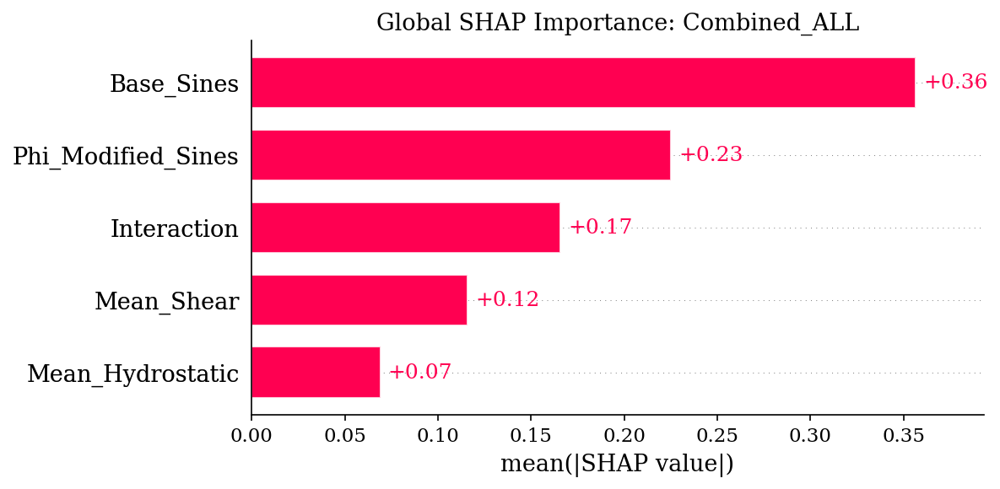

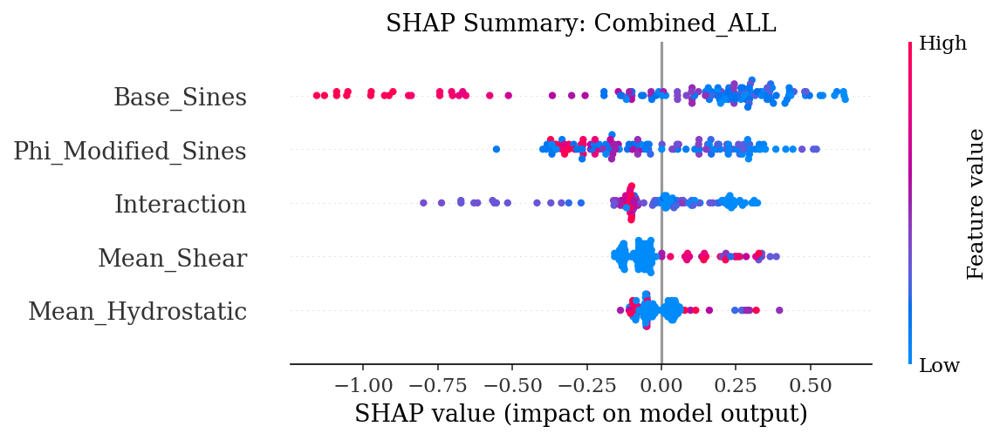

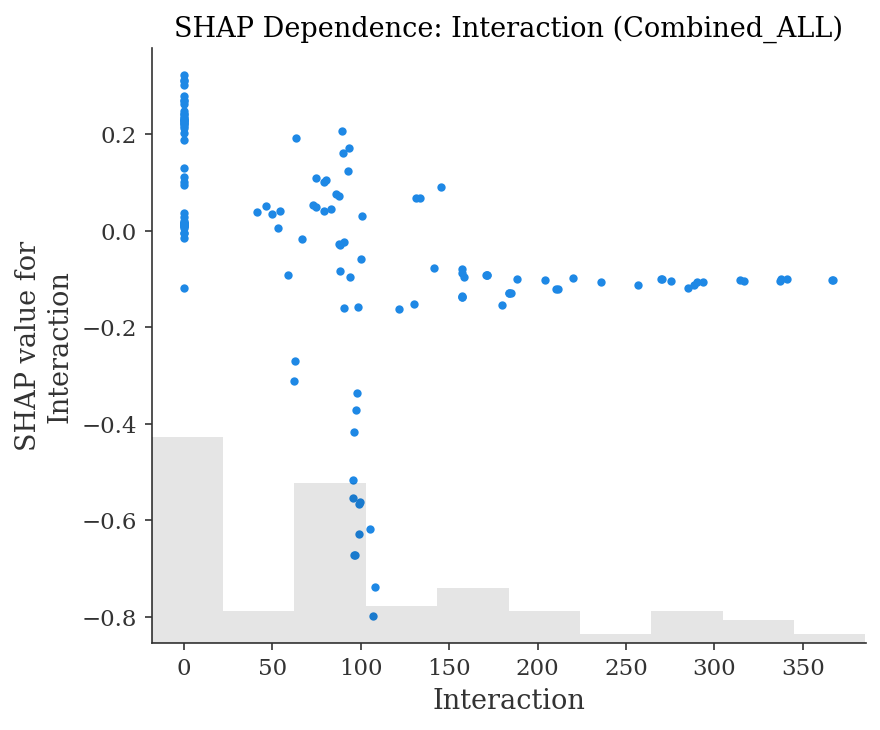

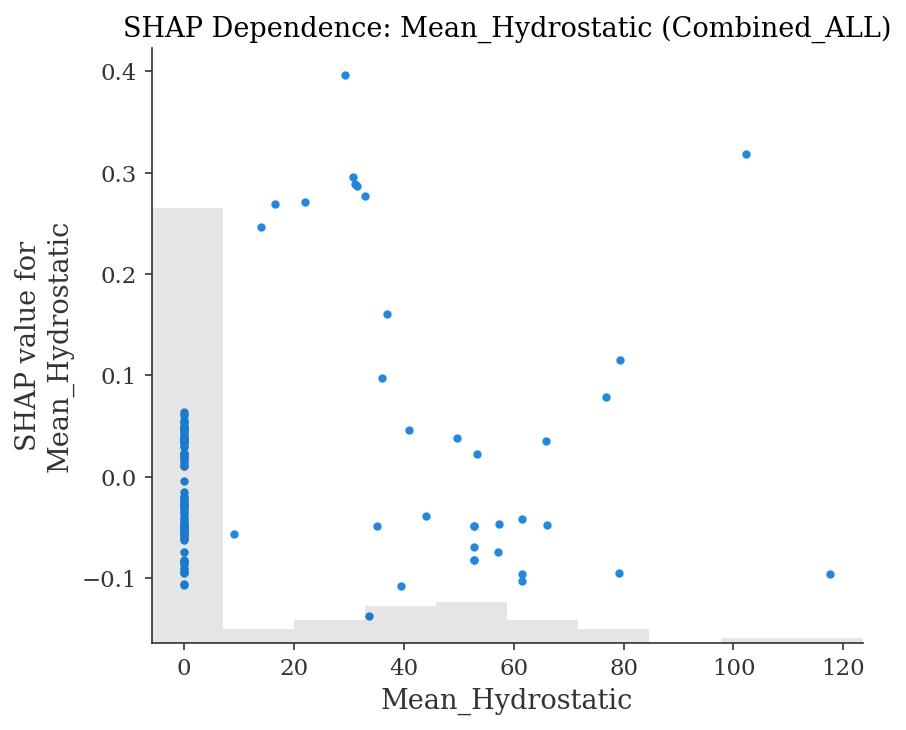

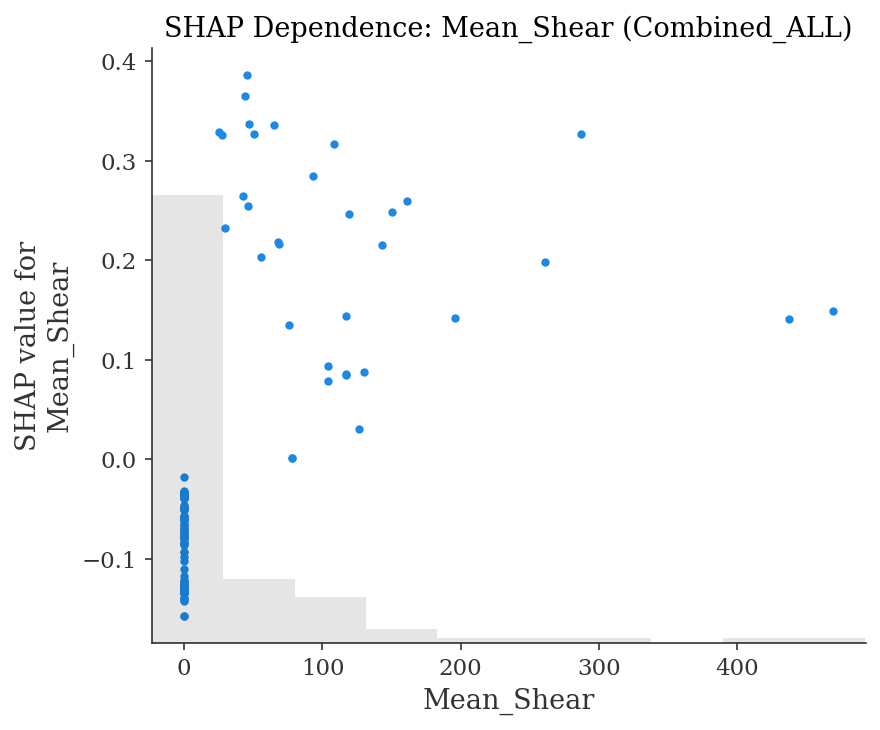

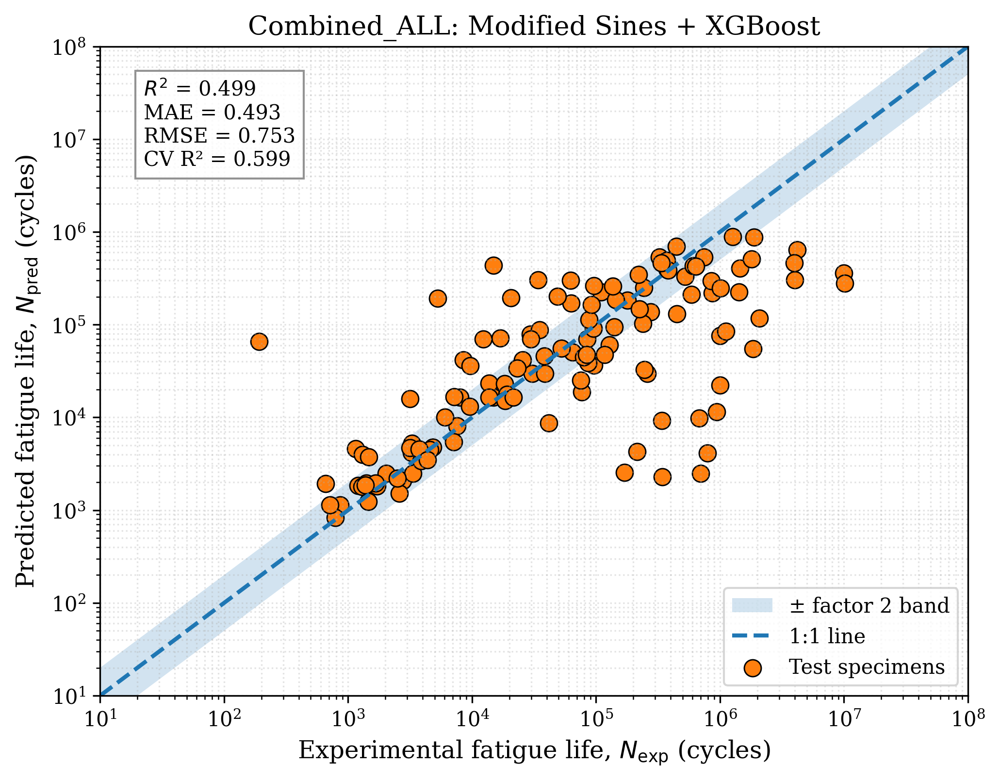


DONE.
Saved in: /content/gdrive/My Drive/steel samples/Manuscript#3/MultiMaterial_SHAP_ModifiedSines
         Dataset  n_total   Test_R2  Test_MAE  Test_RMSE  CV_R2_mean  \
0           S355      133  0.869532  0.208472   0.244409    0.812828   
1      7075_T651      127  0.934583  0.158726   0.195989    0.838753   
2            MS1      313  0.636237  0.310673   0.488024    0.770858   
3         CuZn37       77  0.815482  0.153502   0.201925    0.733296   
4  Combined_MAIN      573  0.764471  0.345156   0.479363    0.762806   
5   Combined_ALL      650  0.498748  0.493056   0.753278    0.599059   

   CV_R2_std  
0   0.089081  
1   0.068390  
2   0.097111  
3   0.281738  
4   0.039420  
5   0.066498  


In [ ]:
# ============================================================
# MULTI-MATERIAL SHAP ANALYSIS
# Modified Sines + XGBoost for all alloys
# Handles S355, 7075-T651, MS1, CuZn37
# ============================================================

import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

from google.colab import drive
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from xgboost import XGBRegressor
import shap

# ============================================================
# 1. Mount Google Drive
# ============================================================

drive.mount("/content/gdrive", force_remount=False)

# ============================================================
# 2. File paths
# ============================================================

BASE_DIR = Path("/content/gdrive/My Drive/steel samples/Manuscript#3")
DRIVE_ROOT = Path("/content/gdrive/My Drive")

FILES = {
    "S355": "FatigueDataS355_cleaned_133.xlsx",
    "7075_T651": "FatigueData 7075T651  Clean list.xlsx",
    "MS1": "MS1_FatigueData.xlsx",
    "CuZn37": "Fatigue data CuZn37.xlsx",
}

OUT_DIR = BASE_DIR / "MultiMaterial_SHAP_ModifiedSines"
OUT_DIR.mkdir(parents=True, exist_ok=True)

EPS = 1e-9

# Publication labels used in Figure 13
FIG13_FEATURE_LABELS = {
    "Base_Sines": "Sines invariant-amplitude base",
    "Interaction": "Axial–torsional interaction",
    "Mean_Hydrostatic": "Mean hydrostatic stress",
    "Mean_Shear": "Mean shear stress",
    "Phi_Modified_Sines": "Modified Sines equivalent descriptor",
}

FIG13_DATASET_TITLE = {
    "Combined_MAIN": "Combined principal datasets",
}

# ============================================================
# 3. Helper functions
# ============================================================

def norm_col(name):
    s = str(name).strip().lower()
    s = s.replace("σ", "sigma")
    s = s.replace("τ", "tau")
    s = s.replace("γ", "gamma")
    s = s.replace("ε", "eps")
    s = s.replace("ₐ", "a").replace("ₘ", "m")
    s = s.replace("(", "_").replace(")", "_")
    s = re.sub(r"[\s\-/,.?]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def find_col(df, candidates):
    norm_map = {norm_col(c): c for c in df.columns}
    norm_candidates = [norm_col(c) for c in candidates]

    for cand in norm_candidates:
        if cand in norm_map:
            return norm_map[cand]

    return None


def resolve_input_file(
    filename: str,
    base_dir: Path = BASE_DIR,
    search_root: Path = DRIVE_ROOT,
) -> Path:
    """
    Locate an input Excel file in the expected folder or elsewhere in Drive.
    """
    direct_path = base_dir / filename

    if direct_path.is_file():
        return direct_path

    matches = [
        path for path in search_root.rglob(filename)
        if path.is_file()
    ]

    if not matches:
        target = filename.casefold()
        matches = [
            path for path in search_root.rglob("*")
            if path.is_file() and path.name.casefold() == target
        ]

    if not matches:
        raise FileNotFoundError(
            f"Input file not found: {filename}\n"
            f"Expected location: {direct_path}\n"
            f"Searched under: {search_root}"
        )

    if len(matches) > 1:
        print(f"Warning: multiple files named '{filename}' were found:")
        for match in matches:
            print(f"  - {match}")
        print(f"Using: {matches[0]}")

    return matches[0]


def load_dataset(path, material):
    path = Path(path)
    raw = pd.read_excel(path)

    print("\n==============================")
    print(f"{material} original columns:")
    print(raw.columns.tolist())

    col_sa = find_col(raw, [
        "Sa", "S_a",
        "sigma_a", "sigma_a_mpa",
        "sig_a", "sig_a_mpa",
        "Sig_a, MPa",
        "σn,a, MPa",
        "sigma_n_a_mpa",
        "sigma_n_a",
        "sign_a_mpa",
        "sign_a"
    ])

    col_ta = find_col(raw, [
        "Ta", "T_a",
        "tau_a", "tau_a_mpa",
        "Tau_a, MPa",
        "τns,a, MPa",
        "tau_ns_a_mpa",
        "tau_ns_a",
        "tauns_a_mpa",
        "tauns_a"
    ])

    col_sm = find_col(raw, [
        "Sm", "S_m",
        "sigma_m", "sigma_m_mpa",
        "sig_m", "sig_m_mpa",
        "Sig_m, MPa"
    ])

    col_tm = find_col(raw, [
        "Tm", "T_m",
        "tau_m", "tau_m_mpa",
        "Tau_m, MPa"
    ])

    col_n = find_col(raw, [
        "Nexp",
        "Nexp, cycles",
        "Nexp cycles",
        "N_exp",
        "N_exp_cycles",
        "Nf",
        "N_f",
        "Nf_exp",
        "Nf_exp_cycles",
        "Nf,exp, cycle",
        "Nf_exp_cycle",
        "Nf, cycles",
        "Nf cycles",
        "cycles",
        "life",
        "fatigue_life",
        "2Nf",
        "Nf(label)",
        "Nf_label",
        "logN",
        "log_N",
        "log10_N",
        "log10_Nexp",
        "log_Nf",
        "log10_Nf"
    ])

    print(f"\n{material} columns detected:")
    print("Sa   =", col_sa)
    print("Ta   =", col_ta)
    print("Sm   =", col_sm)
    print("Tm   =", col_tm)
    print("Nexp =", col_n)

    if col_sa is None or col_ta is None or col_n is None:
        raise ValueError(f"{material}: could not detect required columns.")

    df = pd.DataFrame()
    df["Sa"] = pd.to_numeric(raw[col_sa], errors="coerce")
    df["Ta"] = pd.to_numeric(raw[col_ta], errors="coerce")
    df["Sm"] = pd.to_numeric(raw[col_sm], errors="coerce") if col_sm else 0.0
    df["Tm"] = pd.to_numeric(raw[col_tm], errors="coerce") if col_tm else 0.0

    n_values = pd.to_numeric(raw[col_n], errors="coerce")
    n_norm = norm_col(col_n)

    log_life_cols = [
        "logn",
        "log_n",
        "log10_n",
        "log10_nexp",
        "log_nf",
        "log10_nf",
        "nf_label",
        "nflabel"
    ]

    if n_norm in log_life_cols:
        df["Nexp"] = 10 ** n_values
        print(f"{material}: log-life detected, converted to cycles.")
    elif n_norm == "2nf":
        df["Nexp"] = n_values / 2.0
        print(f"{material}: 2Nf detected, converted to cycles.")
    else:
        df["Nexp"] = n_values

    df = df.dropna()
    df = df[(df["Nexp"] > 0) & (df["Sa"] >= 0) & (df["Ta"] >= 0)].copy()

    df["Material"] = material
    df["logN"] = np.log10(df["Nexp"])

    print(f"{material} cleaned shape: {df.shape}")
    print(df[["Sa", "Ta", "Sm", "Tm", "Nexp"]].head())

    return df.reset_index(drop=True)


def add_modified_sines_features(df):
    df = df.copy()

    Sa = df["Sa"].abs()
    Ta = df["Ta"].abs()
    Sm = df["Sm"]
    Tm = df["Tm"].abs()

    df["Base_Sines"] = np.sqrt((Sa**2 / 3.0) + Ta**2)
    df["Mean_Hydrostatic"] = Sm / 3.0
    df["Interaction"] = (Sa * Ta) / (Sa + Ta + EPS)
    df["Mean_Shear"] = Tm

    df["Phi_Modified_Sines"] = (
        df["Base_Sines"]
        + df["Mean_Hydrostatic"]
        + df["Interaction"]
        + df["Mean_Shear"]
    )

    return df


def run_shap_analysis(df, name):
    df = add_modified_sines_features(df)

    features = [
        "Base_Sines",
        "Mean_Hydrostatic",
        "Interaction",
        "Mean_Shear",
        "Phi_Modified_Sines"
    ]

    X = df[features]
    y = df["logN"]

    X_train, X_test, y_train, y_test = train_test_split(
        X,
        y,
        test_size=0.20,
        random_state=42
    )

    model = XGBRegressor(
        n_estimators=300,
        max_depth=4,
        learning_rate=0.035,
        subsample=0.85,
        colsample_bytree=0.85,
        objective="reg:squarederror",
        random_state=42,
        n_jobs=-1
    )

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    cv = KFold(n_splits=5, shuffle=True, random_state=42)
    cv_r2 = cross_val_score(model, X, y, cv=cv, scoring="r2", n_jobs=-1)

    print(f"\n=== {name} ===")
    print(f"Test R²  = {r2:.3f}")
    print(f"Test MAE = {mae:.3f}")
    print(f"RMSE     = {rmse:.3f}")
    print(f"CV R²    = {cv_r2.mean():.3f} ± {cv_r2.std(ddof=1):.3f}")

    try:
        explainer = shap.TreeExplainer(model)
        shap_values = explainer(X_test)
    except Exception as error:
        print(f"TreeExplainer failed for {name}: {error}")
        print("Using the general SHAP Explainer instead.")
        explainer = shap.Explainer(model.predict, X_train)
        shap_values = explainer(X_test)

    mean_abs_shap = np.abs(shap_values.values).mean(axis=0)

    shap_rank = pd.DataFrame({
        "Dataset": name,
        "Feature": features,
        "Mean_abs_SHAP": mean_abs_shap
    }).sort_values("Mean_abs_SHAP", ascending=False)

    print("\nSHAP ranking:")
    print(shap_rank.to_string(index=False))

    shap_rank.to_excel(OUT_DIR / f"{name}_SHAP_Ranking.xlsx", index=False)

    # ========================================================
    # SHAP global importance
    # Figure 13 uses publication-ready labels for Combined_MAIN
    # ========================================================
    if name == "Combined_MAIN":
        fig13_df = shap_rank.copy()

        # Figure 13 reports the four physically interpretable components.
        # Phi_Modified_Sines is excluded because it is a deterministic sum
        # of these components and would duplicate their information.
        fig13_df = fig13_df[
            fig13_df["Feature"].isin([
                "Base_Sines",
                "Interaction",
                "Mean_Hydrostatic",
                "Mean_Shear",
            ])
        ].copy()

        fig13_df["Display_Feature"] = (
            fig13_df["Feature"]
            .map(FIG13_FEATURE_LABELS)
            .fillna(fig13_df["Feature"])
        )

        # Highest importance at the top of the horizontal bar chart.
        fig13_df = fig13_df.sort_values(
            "Mean_abs_SHAP",
            ascending=True,
        )

        fig, ax = plt.subplots(figsize=(8.6, 5.2), dpi=300)

        bars = ax.barh(
            fig13_df["Display_Feature"],
            fig13_df["Mean_abs_SHAP"],
        )

        max_value = max(float(fig13_df["Mean_abs_SHAP"].max()), 1e-12)
        label_offset = 0.018 * max_value

        # Numeric labels are deliberately unsigned: 0.57, not +0.57.
        for bar, value in zip(bars, fig13_df["Mean_abs_SHAP"]):
            ax.text(
                bar.get_width() + label_offset,
                bar.get_y() + bar.get_height() / 2,
                f"{value:.2f}",
                va="center",
                ha="left",
                fontsize=10,
            )

        ax.set_xlabel("Mean absolute SHAP value")
        ax.set_ylabel("")
        ax.set_title(
            "Global SHAP importance: combined principal datasets",
            weight="bold",
        )
        ax.grid(
            axis="x",
            linestyle=":",
            alpha=0.35,
        )
        ax.set_xlim(
            0,
            max_value * 1.18,
        )

        fig.tight_layout()
        fig.savefig(
            OUT_DIR / "Figure_13_Combined_principal_datasets_SHAP.png",
            dpi=600,
            bbox_inches="tight",
        )
        fig.savefig(
            OUT_DIR / "Figure_13_Combined_principal_datasets_SHAP.pdf",
            bbox_inches="tight",
        )
        plt.show()
        plt.close(fig)

    else:
        shap.plots.bar(
            shap_values,
            show=False,
        )
        plt.title(f"Global SHAP Importance: {name}")
        plt.tight_layout()
        plt.savefig(
            OUT_DIR / f"{name}_SHAP_GlobalImportance.png",
            dpi=600,
            bbox_inches="tight",
        )
        plt.show()
        plt.close()

    # SHAP summary
    shap.summary_plot(shap_values, X_test, show=False)
    plt.title(f"SHAP Summary: {name}")
    plt.tight_layout()
    plt.savefig(OUT_DIR / f"{name}_SHAP_Summary.png", dpi=600, bbox_inches="tight")
    plt.show()

    # SHAP dependence
    for feature in ["Interaction", "Mean_Hydrostatic", "Mean_Shear"]:
        shap.plots.scatter(shap_values[:, feature], show=False)
        plt.title(f"SHAP Dependence: {feature} ({name})")
        plt.tight_layout()
        plt.savefig(OUT_DIR / f"{name}_SHAP_Dependence_{feature}.png", dpi=600, bbox_inches="tight")
        plt.show()

    # Parity plot
    N_exp = 10 ** y_test
    N_pred = 10 ** y_pred

    xmin = min(N_exp.min(), N_pred.min()) * 0.5
    xmax = max(N_exp.max(), N_pred.max()) * 2.0
    xmin = 10 ** np.floor(np.log10(xmin))
    xmax = 10 ** np.ceil(np.log10(xmax))

    line = np.logspace(np.log10(xmin), np.log10(xmax), 500)

    plt.figure(figsize=(7, 5.5), dpi=300)
    plt.fill_between(line, line / 2, line * 2, alpha=0.20, label="± factor 2 band")
    plt.plot(line, line, "--", linewidth=2, label="1:1 line")
    plt.scatter(N_exp, N_pred, s=70, edgecolor="black", linewidth=0.7, label="Test specimens")

    plt.xscale("log")
    plt.yscale("log")
    plt.xlim(xmin, xmax)
    plt.ylim(xmin, xmax)

    plt.xlabel(r"Experimental fatigue life, $N_{\mathrm{exp}}$ (cycles)")
    plt.ylabel(r"Predicted fatigue life, $N_{\mathrm{pred}}$ (cycles)")
    plt.title(f"{name}: Modified Sines + XGBoost")

    text = (
        rf"$R^2$ = {r2:.3f}" "\n"
        f"MAE = {mae:.3f}\n"
        f"RMSE = {rmse:.3f}\n"
        f"CV R² = {cv_r2.mean():.3f}"
    )

    plt.text(
        0.05,
        0.95,
        text,
        transform=plt.gca().transAxes,
        va="top",
        ha="left",
        fontsize=10,
        bbox=dict(facecolor="white", edgecolor="gray", alpha=0.85)
    )

    plt.grid(True, which="both", linestyle=":", alpha=0.35)
    plt.legend()
    plt.tight_layout()
    plt.savefig(OUT_DIR / f"{name}_Parity_ModifiedSines_XGBoost.png", dpi=600, bbox_inches="tight")
    plt.show()

    # Save prediction results
    pred_df = X_test.copy()
    pred_df["Nexp"] = N_exp.values
    pred_df["Npred"] = N_pred
    pred_df["logN_exp"] = y_test.values
    pred_df["logN_pred"] = y_pred
    pred_df["Material"] = name
    pred_df.to_excel(OUT_DIR / f"{name}_Predictions.xlsx", index=False)

    return {
        "Dataset": name,
        "n_total": len(df),
        "n_test": len(X_test),
        "Test_R2": r2,
        "Test_MAE": mae,
        "Test_RMSE": rmse,
        "CV_R2_mean": cv_r2.mean(),
        "CV_R2_std": cv_r2.std(ddof=1),
        **{f"SHAP_{row.Feature}": row.Mean_abs_SHAP for _, row in shap_rank.iterrows()}
    }


# ============================================================
# 4. Load all datasets
# ============================================================

datasets = {}

for name, filename in FILES.items():
    resolved_path = resolve_input_file(filename)
    print(f"Loading {name} from:")
    print(resolved_path)
    datasets[name] = load_dataset(resolved_path, name)

datasets["Combined_MAIN"] = pd.concat(
    [
        datasets["S355"],
        datasets["7075_T651"],
        datasets["MS1"]
    ],
    ignore_index=True
)

datasets["Combined_ALL"] = pd.concat(
    [
        datasets["S355"],
        datasets["7075_T651"],
        datasets["MS1"],
        datasets["CuZn37"]
    ],
    ignore_index=True
)

# ============================================================
# 5. Run SHAP analysis for all datasets
# ============================================================

summary_rows = []

for name, df in datasets.items():
    summary_rows.append(run_shap_analysis(df, name))

summary = pd.DataFrame(summary_rows)
summary.to_excel(OUT_DIR / "MultiMaterial_SHAP_Summary.xlsx", index=False)

print("\nDONE.")
print("Saved in:", OUT_DIR)

print(summary[[
    "Dataset",
    "n_total",
    "Test_R2",
    "Test_MAE",
    "Test_RMSE",
    "CV_R2_mean",
    "CV_R2_std"
]])

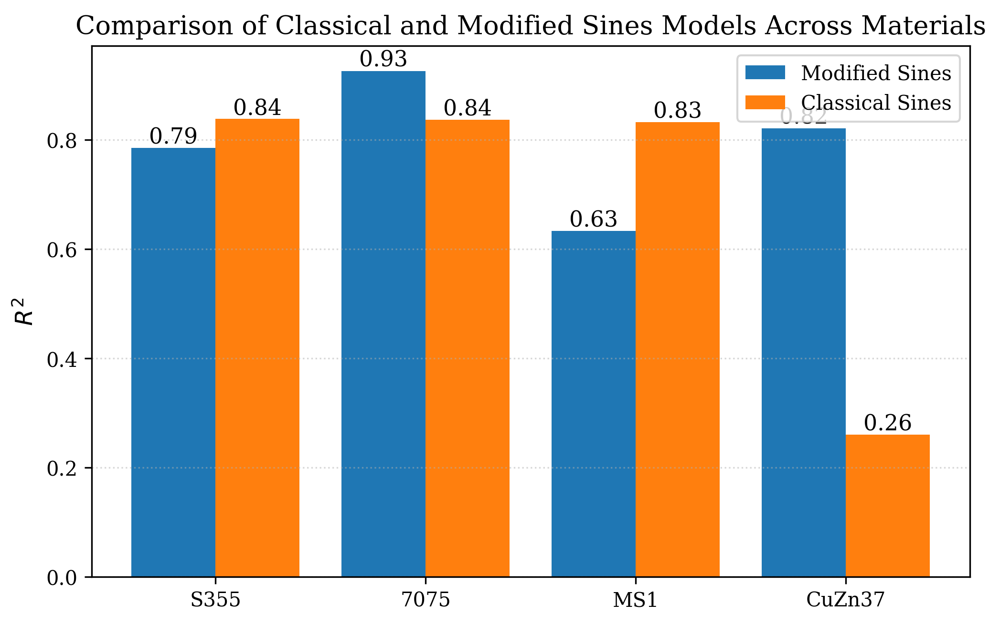

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# ==============================
# DATA (replace Classical if needed)
# ==============================

data = pd.DataFrame({
    "Material": ["S355", "7075", "MS1", "CuZn37"],
    "Modified_Sines": [0.785, 0.926, 0.633, 0.821],
    "Classical_Sines": [0.838, 0.837, 0.832, 0.260]  # adjust if needed
})

# ==============================
# PLOT
# ==============================

x = range(len(data))

plt.figure(figsize=(7,4.5), dpi=300)

plt.bar([i-0.2 for i in x], data["Modified_Sines"], width=0.4, label="Modified Sines")
plt.bar([i+0.2 for i in x], data["Classical_Sines"], width=0.4, label="Classical Sines")

plt.xticks(x, data["Material"])
plt.ylabel(r"$R^2$")
plt.title("Comparison of Classical and Modified Sines Models Across Materials")

for i, v in enumerate(data["Modified_Sines"]):
    plt.text(i-0.2, v, f"{v:.2f}", ha='center', va='bottom')

for i, v in enumerate(data["Classical_Sines"]):
    plt.text(i+0.2, v, f"{v:.2f}", ha='center', va='bottom')

plt.legend()
plt.grid(axis='y', linestyle=':', alpha=0.5)
plt.tight_layout()
plt.savefig("Fig_Comparison_Mod_vs_Classical.png", dpi=600)
plt.show()

S355 DATASET
Accepted specimens: 133

Regime counts:
Regime
Combined                    32
Pure torsional              26
Combined + mean stresses    26
Pure axial                  24
Axial + mean stress         18
Torsional + mean shear       7
Name: count, dtype: int64

Fold 1: training=106, validation=27

Fold 2: training=106, validation=27

Fold 3: training=106, validation=27

Fold 4: training=107, validation=26

Fold 5: training=107, validation=26

Reproducibility check passed: every specimen was predicted exactly once by every model.

POOLED OUT-OF-FOLD PERFORMANCE
               Model       R2      MAE     RMSE
      Modified Sines 0.853604 0.184646 0.227024
     Classical Sines 0.815956 0.209471 0.254547
    Dang Van (proxy) 0.716601 0.253752 0.315868
Fatemi-Socie (proxy) 0.746428 0.245784 0.298784
           von Mises 0.615897 0.297949 0.367731

FOLD-WISE MEAN ± SAMPLE STANDARD DEVIATION
               Model  R2_mean   R2_std  MAE_mean  MAE_std  RMSE_mean  RMSE_std
     Classi

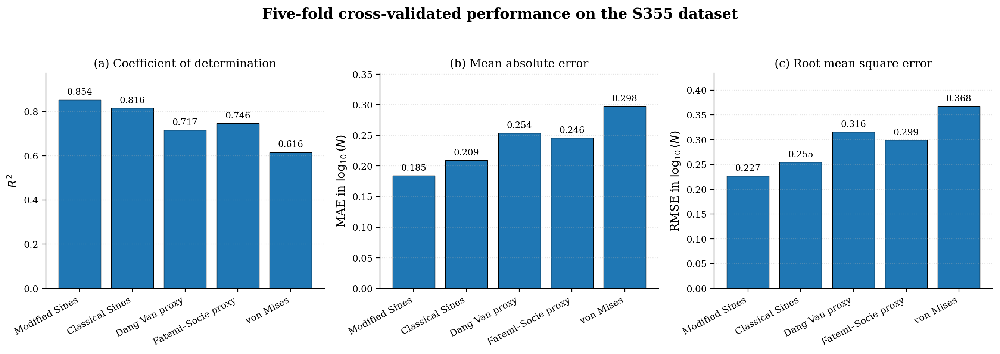


FILES SAVED
/content/gdrive/My Drive/steel samples/Manuscript#3/Figures/Figure_4_OOF_CrossValidation.png
/content/gdrive/My Drive/steel samples/Manuscript#3/Figures/Figure_4_OOF_CrossValidation.pdf
/content/gdrive/My Drive/steel samples/Manuscript#3/Figures/Figure_4_FiveModel_OOF_Results.xlsx


In [ ]:
# ============================================================
# FIGURE 4 — FIVE-MODEL OUT-OF-FOLD CROSS-VALIDATION
# Identical regime-stratified folds for all fatigue criteria
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error,
)

# ============================================================
# 1. Reproducibility settings
# ============================================================

N_SPLITS = 5
RANDOM_STATE = 42

np.random.seed(RANDOM_STATE)

INPUT_FILE = Path(
    "/content/gdrive/My Drive/steel samples/Manuscript#3/"
    "FatigueDataS355_cleaned_133.xlsx"
)

FIGURE_DIR = Path(
    "/content/gdrive/My Drive/steel samples/Manuscript#3/Figures"
)

FIGURE_DIR.mkdir(parents=True, exist_ok=True)

# ============================================================
# 2. Check that the five-model functions have been defined
# ============================================================

required_functions = [
    "fit_eval_modified_sines",
    "fit_eval_classical_sines",
    "fit_eval_dang_van",
    "fit_eval_fatemi_socie",
    "fit_eval_von_mises",
]

missing_functions = [
    name for name in required_functions
    if name not in globals() or not callable(globals()[name])
]

if missing_functions:
    raise RuntimeError(
        "Run the complete physics-validation cell first. "
        f"Missing functions: {missing_functions}"
    )

# ============================================================
# 3. Load the final accepted S355 dataset directly
# ============================================================

if not INPUT_FILE.is_file():
    raise FileNotFoundError(
        f"Final S355 dataset was not found:\n{INPUT_FILE}"
    )

df_raw = pd.read_excel(INPUT_FILE)

# Accept possible alternative column names
df_raw = df_raw.rename(columns={
    "S_a": "Sa",
    "T_a": "Ta",
    "S_m": "Sm",
    "T_m": "Tm",
    "N_f": "Nexp",
    "N": "Nexp",
    "Cycles": "Nexp",
})

required_columns = ["Sa", "Ta", "Sm", "Tm", "Nexp"]

missing_columns = [
    column for column in required_columns
    if column not in df_raw.columns
]

if missing_columns:
    raise ValueError(
        f"Missing required S355 columns: {missing_columns}\n"
        f"Available columns: {df_raw.columns.tolist()}"
    )

df_cv = df_raw.copy()

for column in required_columns:
    df_cv[column] = pd.to_numeric(
        df_cv[column],
        errors="coerce",
    )

# Keep only valid numerical records
df_cv = df_cv.dropna(subset=required_columns).copy()

df_cv = df_cv[
    (df_cv["Nexp"] > 0)
    & (df_cv["Sa"] >= 0)
    & (df_cv["Ta"] >= 0)
].copy()

# Retain fatigue failures only if crack is a binary column
if "crack" in df_cv.columns:
    df_cv["crack"] = pd.to_numeric(
        df_cv["crack"],
        errors="coerce",
    )

    crack_values = set(
        df_cv["crack"].dropna().unique().tolist()
    )

    if crack_values and crack_values.issubset({0, 1}):
        df_cv = df_cv[df_cv["crack"] == 1].copy()

df_cv = df_cv.reset_index(drop=True)

df_cv["ID"] = np.arange(1, len(df_cv) + 1)
df_cv["Material"] = "S355"
df_cv["log10_Nexp"] = np.log10(df_cv["Nexp"])

assert len(df_cv) == 133, (
    f"Expected 133 accepted S355 specimens, "
    f"but obtained {len(df_cv)}."
)

# ============================================================
# 4. Loading-regime classification
# ============================================================

ZERO_TOL = 1e-10

def is_zero(value, tolerance=ZERO_TOL):
    return abs(float(value)) <= tolerance


def classify_regime_cv(row):
    Sa = float(row["Sa"])
    Ta = float(row["Ta"])
    Sm = float(row["Sm"])
    Tm = float(row["Tm"])

    if Sa > ZERO_TOL and is_zero(Ta) and is_zero(Sm) and is_zero(Tm):
        return "Pure axial"

    if Ta > ZERO_TOL and is_zero(Sa) and is_zero(Sm) and is_zero(Tm):
        return "Pure torsional"

    if Sa > ZERO_TOL and Ta > ZERO_TOL and is_zero(Sm) and is_zero(Tm):
        return "Combined"

    if Sa > ZERO_TOL and is_zero(Ta) and not is_zero(Sm) and is_zero(Tm):
        return "Axial + mean stress"

    if Ta > ZERO_TOL and is_zero(Sa) and is_zero(Sm) and not is_zero(Tm):
        return "Torsional + mean shear"

    if Sa > ZERO_TOL and Ta > ZERO_TOL and (
        not is_zero(Sm) or not is_zero(Tm)
    ):
        return "Combined + mean stresses"

    return "Other"


df_cv["Regime"] = df_cv.apply(
    classify_regime_cv,
    axis=1,
)

if (df_cv["Regime"] == "Other").any():
    print("\nWarning: observations classified as Other:")
    print(
        df_cv.loc[
            df_cv["Regime"] == "Other",
            ["ID", "Sa", "Ta", "Sm", "Tm"],
        ]
    )

print("=" * 70)
print("S355 DATASET")
print("=" * 70)
print(f"Accepted specimens: {len(df_cv)}")

print("\nRegime counts:")
print(df_cv["Regime"].value_counts())

# ============================================================
# 5. Define the five evaluated criteria
# ============================================================

model_functions = {
    "Modified Sines": fit_eval_modified_sines,
    "Classical Sines": fit_eval_classical_sines,
    "Dang Van (proxy)": fit_eval_dang_van,
    "Fatemi-Socie (proxy)": fit_eval_fatemi_socie,
    "von Mises": fit_eval_von_mises,
}

model_order = list(model_functions.keys())

# ============================================================
# 6. Prepare out-of-fold storage
# ============================================================

y_true = df_cv["log10_Nexp"].to_numpy()

oof_predictions = {
    model_name: np.full(
        len(df_cv),
        np.nan,
        dtype=float,
    )
    for model_name in model_order
}

prediction_counts = {
    model_name: np.zeros(
        len(df_cv),
        dtype=int,
    )
    for model_name in model_order
}

fold_metric_rows = []

# ============================================================
# 7. Identical regime-stratified five-fold cross-validation
# ============================================================

cv = StratifiedKFold(
    n_splits=N_SPLITS,
    shuffle=True,
    random_state=RANDOM_STATE,
)

strata = df_cv["Regime"].to_numpy()

for fold, (train_idx, test_idx) in enumerate(
    cv.split(df_cv, strata),
    start=1,
):
    train_df = (
        df_cv
        .iloc[train_idx]
        .copy()
        .reset_index(drop=True)
    )

    test_df = (
        df_cv
        .iloc[test_idx]
        .copy()
        .reset_index(drop=True)
    )

    y_fold = test_df["log10_Nexp"].to_numpy()

    print(
        f"\nFold {fold}: "
        f"training={len(train_df)}, validation={len(test_df)}"
    )

    for model_name, fit_function in model_functions.items():

        # Each model and all its coefficients are fitted
        # exclusively using the current training fold.
        result = fit_function(
            train_df,
            test_df,
        )

        fold_prediction = np.asarray(
            result["test_pred"],
            dtype=float,
        )

        if len(fold_prediction) != len(test_idx):
            raise RuntimeError(
                f"{model_name}, fold {fold}: "
                "prediction-size mismatch."
            )

        if not np.isfinite(fold_prediction).all():
            raise RuntimeError(
                f"{model_name}, fold {fold}: "
                "non-finite predictions detected."
            )

        oof_predictions[model_name][test_idx] = (
            fold_prediction
        )

        prediction_counts[model_name][test_idx] += 1

        fold_metric_rows.append({
            "Fold": fold,
            "Model": model_name,
            "n_train": len(train_idx),
            "n_validation": len(test_idx),
            "R2": r2_score(
                y_fold,
                fold_prediction,
            ),
            "MAE": mean_absolute_error(
                y_fold,
                fold_prediction,
            ),
            "RMSE": np.sqrt(
                mean_squared_error(
                    y_fold,
                    fold_prediction,
                )
            ),
        })

# ============================================================
# 8. Reproducibility checks
# ============================================================

for model_name in model_order:

    if np.isnan(oof_predictions[model_name]).any():
        raise RuntimeError(
            f"{model_name}: missing out-of-fold predictions."
        )

    if not np.all(
        prediction_counts[model_name] == 1
    ):
        raise RuntimeError(
            f"{model_name}: each specimen must be "
            "predicted exactly once."
        )

print(
    "\nReproducibility check passed: every specimen was "
    "predicted exactly once by every model."
)

# ============================================================
# 9. Pooled out-of-fold performance
# ============================================================

summary_rows = []

for model_name in model_order:
    prediction = oof_predictions[model_name]

    summary_rows.append({
        "Model": model_name,
        "R2": r2_score(
            y_true,
            prediction,
        ),
        "MAE": mean_absolute_error(
            y_true,
            prediction,
        ),
        "RMSE": np.sqrt(
            mean_squared_error(
                y_true,
                prediction,
            )
        ),
    })

oof_summary = pd.DataFrame(summary_rows)

oof_summary["Model"] = pd.Categorical(
    oof_summary["Model"],
    categories=model_order,
    ordered=True,
)

oof_summary = (
    oof_summary
    .sort_values("Model")
    .reset_index(drop=True)
)

# ============================================================
# 10. Fold-wise mean and sample standard deviation
# ============================================================

fold_metrics = pd.DataFrame(fold_metric_rows)

fold_statistics = (
    fold_metrics
    .groupby("Model", as_index=False)
    .agg(
        R2_mean=("R2", "mean"),
        R2_std=("R2", lambda x: x.std(ddof=1)),
        MAE_mean=("MAE", "mean"),
        MAE_std=("MAE", lambda x: x.std(ddof=1)),
        RMSE_mean=("RMSE", "mean"),
        RMSE_std=("RMSE", lambda x: x.std(ddof=1)),
    )
)

print("\n" + "=" * 70)
print("POOLED OUT-OF-FOLD PERFORMANCE")
print("=" * 70)
print(
    oof_summary.to_string(
        index=False,
        float_format=lambda value: f"{value:.6f}",
    )
)

print("\n" + "=" * 70)
print("FOLD-WISE MEAN ± SAMPLE STANDARD DEVIATION")
print("=" * 70)
print(
    fold_statistics.to_string(
        index=False,
        float_format=lambda value: f"{value:.6f}",
    )
)

# ============================================================
# 11. Export specimen-level predictions
# ============================================================

oof_output = df_cv[
    [
        "ID",
        "Material",
        "Regime",
        "Sa",
        "Ta",
        "Sm",
        "Tm",
        "Nexp",
        "log10_Nexp",
    ]
].copy()

for model_name in model_order:
    safe_name = (
        model_name
        .replace(" ", "_")
        .replace("-", "_")
        .replace("(", "")
        .replace(")", "")
    )

    prediction = oof_predictions[model_name]

    oof_output[
        f"log10_Npred_{safe_name}"
    ] = prediction

    oof_output[
        f"Npred_{safe_name}"
    ] = 10 ** prediction

    oof_output[
        f"residual_{safe_name}"
    ] = y_true - prediction

excel_path = (
    FIGURE_DIR
    / "Figure_4_FiveModel_OOF_Results.xlsx"
)

with pd.ExcelWriter(
    excel_path,
    engine="openpyxl",
) as writer:
    oof_summary.to_excel(
        writer,
        sheet_name="Pooled_OOF_metrics",
        index=False,
    )

    fold_statistics.to_excel(
        writer,
        sheet_name="Fold_statistics",
        index=False,
    )

    fold_metrics.to_excel(
        writer,
        sheet_name="Fold_metrics",
        index=False,
    )

    oof_output.to_excel(
        writer,
        sheet_name="OOF_predictions",
        index=False,
    )

# ============================================================
# 12. Publication labels
# ============================================================

publication_labels = {
    "Modified Sines": "Modified Sines",
    "Classical Sines": "Classical Sines",
    "Dang Van (proxy)": "Dang Van proxy",
    "Fatemi-Socie (proxy)": "Fatemi–Socie proxy",
    "von Mises": "von Mises",
}

plot_labels = [
    publication_labels[str(model)]
    for model in oof_summary["Model"]
]

x_positions = np.arange(len(oof_summary))

# ============================================================
# 13. Regenerate publication-ready Figure 4
# ============================================================

plt.rcParams.update({
    "font.family": "serif",
    "font.size": 10,
    "axes.labelsize": 11,
    "axes.titlesize": 11,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
})

fig, axes = plt.subplots(
    1,
    3,
    figsize=(13.5, 4.8),
    dpi=200,
)

plot_information = [
    (
        "R2",
        r"$R^2$",
        "(a) Coefficient of determination",
    ),
    (
        "MAE",
        r"MAE in $\log_{10}(N)$",
        "(b) Mean absolute error",
    ),
    (
        "RMSE",
        r"RMSE in $\log_{10}(N)$",
        "(c) Root mean square error",
    ),
]

for ax, (column, ylabel, title) in zip(
    axes,
    plot_information,
):
    values = (
        oof_summary[column]
        .astype(float)
        .to_numpy()
    )

    bars = ax.bar(
        x_positions,
        values,
        color="#1f77b4",
        edgecolor="black",
        linewidth=0.5,
    )

    ax.set_xticks(x_positions)

    ax.set_xticklabels(
        plot_labels,
        rotation=28,
        ha="right",
    )

    ax.set_ylabel(ylabel)
    ax.set_title(title)

    ax.grid(
        axis="y",
        linestyle=":",
        alpha=0.35,
    )

    y_offset = max(values) * 0.018

    for bar, value in zip(bars, values):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            value + y_offset,
            f"{value:.3f}",
            ha="center",
            va="bottom",
            fontsize=8.5,
        )

    if column == "R2":
        lower_limit = min(
            0.0,
            values.min() - 0.08,
        )

        upper_limit = min(
            1.0,
            values.max() + 0.12,
        )

        ax.set_ylim(
            lower_limit,
            upper_limit,
        )
    else:
        ax.set_ylim(
            0,
            values.max() * 1.18,
        )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

fig.suptitle(
    "Five-fold cross-validated performance on the S355 dataset",
    fontsize=14,
    fontweight="bold",
)

fig.tight_layout(
    rect=[0, 0, 1, 0.94]
)

png_path = (
    FIGURE_DIR
    / "Figure_4_OOF_CrossValidation.png"
)

pdf_path = (
    FIGURE_DIR
    / "Figure_4_OOF_CrossValidation.pdf"
)

fig.savefig(
    png_path,
    dpi=600,
    bbox_inches="tight",
)

fig.savefig(
    pdf_path,
    bbox_inches="tight",
)

plt.show()
plt.close(fig)

print("\n" + "=" * 70)
print("FILES SAVED")
print("=" * 70)
print(png_path)
print(pdf_path)
print(excel_path)

Regime-count verification passed.

REGIME-WISE OUT-OF-FOLD R²
                  Regime  n                Model      R2
              Pure axial 24       Modified Sines  0.8535
              Pure axial 24      Classical Sines  0.8603
              Pure axial 24     Dang Van (proxy)  0.9562
              Pure axial 24 Fatemi-Socie (proxy)  0.9160
              Pure axial 24            von Mises  0.8879
     Axial + mean stress 18       Modified Sines  0.7769
     Axial + mean stress 18      Classical Sines  0.7250
     Axial + mean stress 18     Dang Van (proxy)  0.5349
     Axial + mean stress 18 Fatemi-Socie (proxy)  0.6963
     Axial + mean stress 18            von Mises  0.0302
                Combined 32       Modified Sines  0.9136
                Combined 32      Classical Sines  0.8675
                Combined 32     Dang Van (proxy)  0.6500
                Combined 32 Fatemi-Socie (proxy)  0.6252
                Combined 32            von Mises  0.5438
Combined + mean stresses 2

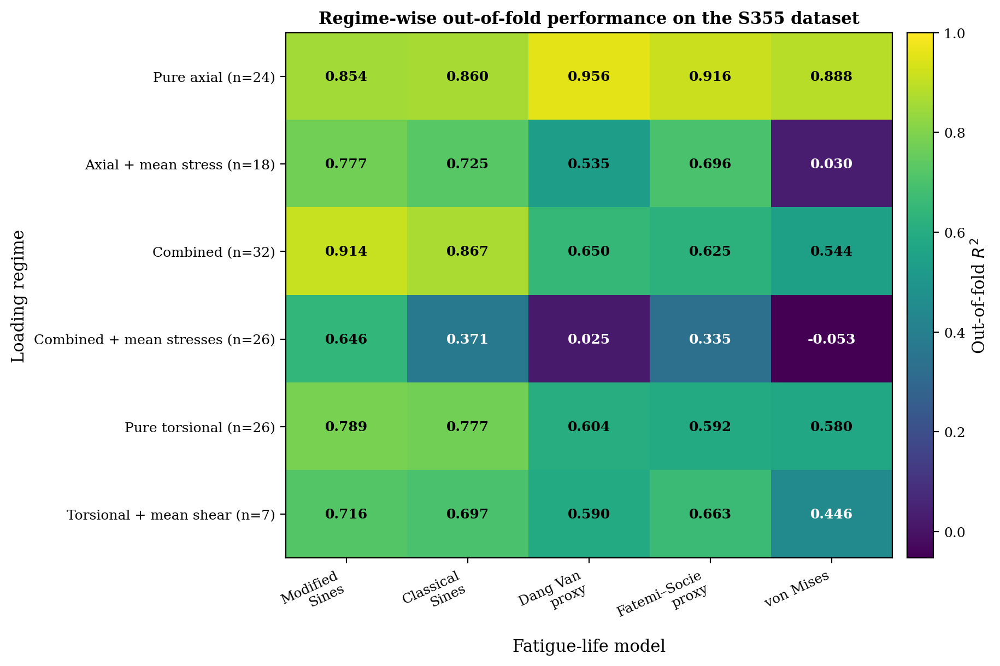


Saved:
/content/gdrive/My Drive/steel samples/Manuscript#3/Figures/Figure_5_RegimeWise_OOF_R2.png
/content/gdrive/My Drive/steel samples/Manuscript#3/Figures/Figure_5_RegimeWise_OOF_R2.pdf
/content/gdrive/My Drive/steel samples/Manuscript#3/Figures/Figure_5_RegimeWise_OOF_Results.xlsx


In [ ]:
# ============================================================
# FIGURE 5 — REGIME-WISE OUT-OF-FOLD R²
# Uses the same predictions and folds as Figure 4
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from sklearn.metrics import r2_score

# ============================================================
# 1. Verify that Figure 4 outputs exist
# ============================================================

required_objects = [
    "df_cv",
    "oof_predictions",
    "model_order",
]

missing_objects = [
    name for name in required_objects
    if name not in globals()
]

if missing_objects:
    raise RuntimeError(
        "Run the Figure 4 cross-validation cell first. "
        f"Missing objects: {missing_objects}"
    )

FIGURE_DIR = Path(
    "/content/gdrive/My Drive/steel samples/Manuscript#3/Figures"
)
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

# ============================================================
# 2. Final loading-regime order
# ============================================================

regime_order = [
    "Pure axial",
    "Axial + mean stress",
    "Combined",
    "Combined + mean stresses",
    "Pure torsional",
    "Torsional + mean shear",
]

expected_counts = {
    "Pure axial": 24,
    "Axial + mean stress": 18,
    "Combined": 32,
    "Combined + mean stresses": 26,
    "Pure torsional": 26,
    "Torsional + mean shear": 7,
}

# Verify counts
actual_counts = (
    df_cv["Regime"]
    .value_counts()
    .to_dict()
)

for regime, expected_n in expected_counts.items():
    actual_n = actual_counts.get(regime, 0)

    if actual_n != expected_n:
        raise ValueError(
            f"{regime}: expected {expected_n} specimens, "
            f"but obtained {actual_n}."
        )

assert sum(expected_counts.values()) == 133

print("Regime-count verification passed.")

# ============================================================
# 3. Calculate regime-wise pooled out-of-fold R²
# ============================================================

regime_rows = []

for regime in regime_order:
    mask = (
        df_cv["Regime"].to_numpy()
        == regime
    )

    y_regime = (
        df_cv.loc[mask, "log10_Nexp"]
        .to_numpy()
    )

    n_regime = int(mask.sum())

    for model_name in model_order:
        prediction_regime = (
            oof_predictions[model_name][mask]
        )

        regime_rows.append({
            "Regime": regime,
            "n": n_regime,
            "Model": model_name,
            "R2": r2_score(
                y_regime,
                prediction_regime,
            ),
        })

regime_oof_results = pd.DataFrame(regime_rows)

print("\nREGIME-WISE OUT-OF-FOLD R²")
print(
    regime_oof_results.to_string(
        index=False,
        float_format=lambda value: f"{value:.4f}",
    )
)

# ============================================================
# 4. Prepare heatmap table
# ============================================================

heatmap_table = (
    regime_oof_results
    .pivot(
        index="Regime",
        columns="Model",
        values="R2",
    )
    .reindex(
        index=regime_order,
        columns=model_order,
    )
)

publication_model_labels = {
    "Modified Sines": "Modified\nSines",
    "Classical Sines": "Classical\nSines",
    "Dang Van (proxy)": "Dang Van\nproxy",
    "Fatemi-Socie (proxy)": "Fatemi–Socie\nproxy",
    "von Mises": "von Mises",
}

x_labels = [
    publication_model_labels[model]
    for model in model_order
]

y_labels = [
    f"{regime} (n={expected_counts[regime]})"
    for regime in regime_order
]

values = heatmap_table.to_numpy(dtype=float)

# Include negative R² values if present
minimum_value = min(
    0.0,
    float(np.nanmin(values)),
)

maximum_value = max(
    1.0,
    float(np.nanmax(values)),
)

# ============================================================
# 5. Generate publication-ready Figure 5
# ============================================================

plt.rcParams.update({
    "font.family": "serif",
    "font.size": 10,
})

fig, ax = plt.subplots(
    figsize=(9.5, 6.2),
    dpi=200,
)

image = ax.imshow(
    values,
    cmap="viridis",
    aspect="auto",
    vmin=minimum_value,
    vmax=maximum_value,
)

ax.set_xticks(
    np.arange(len(model_order))
)
ax.set_xticklabels(
    x_labels,
    rotation=25,
    ha="right",
)

ax.set_yticks(
    np.arange(len(regime_order))
)
ax.set_yticklabels(y_labels)

ax.set_xlabel("Fatigue-life model")
ax.set_ylabel("Loading regime")

ax.set_title(
    "Regime-wise out-of-fold performance on the S355 dataset",
    fontweight="bold",
)

# Add R² values inside each cell
value_midpoint = (
    minimum_value + maximum_value
) / 2

for row_index in range(values.shape[0]):
    for column_index in range(values.shape[1]):
        value = values[
            row_index,
            column_index,
        ]

        text_color = (
            "white"
            if value < value_midpoint
            else "black"
        )

        ax.text(
            column_index,
            row_index,
            f"{value:.3f}",
            ha="center",
            va="center",
            color=text_color,
            fontsize=9,
            fontweight="bold",
        )

colorbar = fig.colorbar(
    image,
    ax=ax,
    pad=0.02,
)

colorbar.set_label(
    r"Out-of-fold $R^2$"
)

fig.tight_layout()

figure5_png = (
    FIGURE_DIR
    / "Figure_5_RegimeWise_OOF_R2.png"
)

figure5_pdf = (
    FIGURE_DIR
    / "Figure_5_RegimeWise_OOF_R2.pdf"
)

figure5_excel = (
    FIGURE_DIR
    / "Figure_5_RegimeWise_OOF_Results.xlsx"
)

fig.savefig(
    figure5_png,
    dpi=600,
    bbox_inches="tight",
)

fig.savefig(
    figure5_pdf,
    bbox_inches="tight",
)

regime_oof_results.to_excel(
    figure5_excel,
    index=False,
)

plt.show()
plt.close(fig)

print("\nSaved:")
print(figure5_png)
print(figure5_pdf)
print(figure5_excel)

####All-Specimen Calibration and Evaluation of Physics-Based Fatigue Models for S355 Steel

This analysis calibrates the Modified Sines, Classical Sines, Dang Van proxy, Fatemi–Socie proxy, and von Mises fatigue-life models using all 133 accepted S355 specimens. For each model, the criterion-specific coefficients and Basquin constants are estimated from the complete dataset and subsequently fixed to calculate the equivalent-stress descriptor and fatigue-life prediction for every specimen. Global and regime-wise (R^2), MAE, and RMSE values are reported, together with the calibrated parameters and specimen-level predictions. Because the same observations are used for calibration and evaluation, these results represent in-sample agreement and are not used as evidence of generalization; predictive performance is assessed separately using pooled out-of-fold cross-validation.

In [ ]:
# ============================================================
# ALL-SPECIMEN S355 PHYSICS-EQUATION CALCULATION
# Each equation is calibrated once on all 133 specimens
# and then applied with fixed coefficients to every specimen.
# No machine-learning model is used.
# ============================================================

import numpy as np
import pandas as pd

from pathlib import Path
from scipy.optimize import minimize
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error,
)

# ============================================================
# 1. Settings
# ============================================================

INPUT_FILE = Path(
    "/content/gdrive/My Drive/steel samples/Manuscript#3/"
    "FatigueDataS355_cleaned_133.xlsx"
)

OUTPUT_DIR = Path(
    "/content/gdrive/My Drive/steel samples/Manuscript#3/Results"
)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

OUTPUT_FILE = OUTPUT_DIR / "S355_fixed_physics_equations_all_133.xlsx"

EXPECTED_N = 133
EPSILON = 1e-9
SIGMA_Y = 355.0  # MPa, used only by the Fatemi-Socie proxy

# ============================================================
# 2. Load and check the final S355 dataset
# ============================================================

if not INPUT_FILE.is_file():
    raise FileNotFoundError(f"Dataset not found:\n{INPUT_FILE}")

df = pd.read_excel(INPUT_FILE).copy()

required_columns = ["Sa", "Ta", "Sm", "Tm", "Nexp"]
missing_columns = [
    column for column in required_columns
    if column not in df.columns
]

if missing_columns:
    raise ValueError(
        f"Missing required columns: {missing_columns}\n"
        f"Available columns: {df.columns.tolist()}"
    )

for column in required_columns:
    df[column] = pd.to_numeric(df[column], errors="coerce")

df = df.dropna(subset=required_columns).copy()

df = df[
    (df["Nexp"] > 0) &
    (df["Sa"] >= 0) &
    (df["Ta"] >= 0)
].reset_index(drop=True)

if len(df) != EXPECTED_N:
    raise ValueError(
        f"Expected {EXPECTED_N} accepted S355 specimens, "
        f"but obtained {len(df)}."
    )

if "ID" not in df.columns:
    df.insert(0, "ID", np.arange(1, len(df) + 1))

df["Material"] = "S355"
df["log10_Nexp"] = np.log10(df["Nexp"])

print("=" * 70)
print("S355 ALL-SPECIMEN PHYSICS-EQUATION ANALYSIS")
print("=" * 70)
print(f"Accepted specimens: {len(df)}")

# ============================================================
# 3. Loading-regime classification
# ============================================================

def classify_regime(row):
    Sa = row["Sa"]
    Ta = row["Ta"]
    Sm = row["Sm"]
    Tm = row["Tm"]

    if Sa > 0 and Ta == 0 and Sm == 0 and Tm == 0:
        return "Pure axial"

    if Sa > 0 and Ta == 0 and Sm != 0 and Tm == 0:
        return "Axial + mean stress"

    if Sa > 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Combined"

    if Sa > 0 and Ta > 0 and (Sm != 0 or Tm != 0):
        return "Combined + mean stresses"

    if Sa == 0 and Ta > 0 and Sm == 0 and Tm == 0:
        return "Pure torsional"

    if Sa == 0 and Ta > 0 and Sm == 0 and Tm != 0:
        return "Torsional + mean shear"

    return "Other"


df["Regime"] = df.apply(classify_regime, axis=1)

print("\nRegime counts:")
print(df["Regime"].value_counts())

if (df["Regime"] == "Other").any():
    raise ValueError(
        "At least one specimen was not assigned to the six accepted regimes."
    )

# ============================================================
# 4. General metric and Basquin functions
# ============================================================

def calculate_metrics(y_true, y_pred):
    return {
        "R2": r2_score(y_true, y_pred),
        "MAE": mean_absolute_error(y_true, y_pred),
        "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
    }


def fit_basquin(phi, y):
    """
    Fits:
        log10(N) = A + B log10(phi)
    """
    phi = np.asarray(phi, dtype=float)
    y = np.asarray(y, dtype=float)

    if np.any(~np.isfinite(phi)) or np.any(phi <= 0):
        return None

    X = np.log10(phi).reshape(-1, 1)

    regression = LinearRegression()
    regression.fit(X, y)

    y_pred = regression.predict(X)
    metrics = calculate_metrics(y, y_pred)

    return {
        "A": float(regression.intercept_),
        "B": float(regression.coef_[0]),
        "log10_Npred": y_pred,
        **metrics,
    }


def optimize_equation(
    descriptor_builder,
    y,
    initial_parameters,
    parameter_bounds,
):
    """
    Optimizes the equation-specific coefficients by minimizing
    the full-dataset RMSE in log10(N).
    """

    def objective(parameters):
        phi = descriptor_builder(parameters)
        fit = fit_basquin(phi, y)

        if fit is None:
            return 1e12

        return fit["RMSE"]

    result = minimize(
        objective,
        x0=np.asarray(initial_parameters, dtype=float),
        bounds=parameter_bounds,
        method="L-BFGS-B",
    )

    if not result.success:
        print(
            "Optimization warning:",
            result.message
        )

    fixed_parameters = result.x
    fixed_phi = descriptor_builder(fixed_parameters)
    fixed_fit = fit_basquin(fixed_phi, y)

    if fixed_fit is None:
        raise RuntimeError("Final equation calibration failed.")

    return fixed_parameters, fixed_phi, fixed_fit


# Input arrays
Sa = df["Sa"].to_numpy(dtype=float)
Ta = df["Ta"].to_numpy(dtype=float)
Sm = df["Sm"].to_numpy(dtype=float)
Tm = df["Tm"].to_numpy(dtype=float)
y = df["log10_Nexp"].to_numpy(dtype=float)

# ============================================================
# 5. Physics-equation definitions
# ============================================================

def classical_sines_descriptor(alpha_s):
    return (
        np.sqrt(Sa**2 / 3.0 + Ta**2)
        + alpha_s * Sm / 3.0
    )


def modified_sines_descriptor(alpha_s, beta, gamma):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)

    interaction = (
        np.abs(Sa) * np.abs(Ta)
    ) / (
        np.abs(Sa) + np.abs(Ta) + EPSILON
    )

    return (
        base
        + alpha_s * Sm / 3.0
        + beta * interaction
        + gamma * np.abs(Tm)
    )


def von_mises_descriptor():
    return np.sqrt(Sa**2 + 3.0 * Ta**2)


def dang_van_proxy_descriptor(a_dv):
    base = np.sqrt(Sa**2 / 3.0 + Ta**2)
    hydrostatic_maximum_proxy = (Sm + Sa) / 3.0

    return base + a_dv * hydrostatic_maximum_proxy


def fatemi_socie_proxy_descriptor(k_fs):
    """
    Stress-based Fatemi-Socie proxy used in the notebook.
    This is not the complete strain-based Fatemi-Socie criterion.
    """

    theta = np.linspace(0.0, np.pi, 721)

    cos_2theta = np.cos(2.0 * theta)[None, :]
    sin_2theta = np.sin(2.0 * theta)[None, :]

    normal_mean = (
        Sm[:, None] / 2.0
        + Sm[:, None] / 2.0 * cos_2theta
        + Tm[:, None] * sin_2theta
    )

    normal_amplitude = np.abs(
        Sa[:, None] / 2.0
        + Sa[:, None] / 2.0 * cos_2theta
        + Ta[:, None] * sin_2theta
    )

    normal_maximum = normal_mean + normal_amplitude

    shear_amplitude = np.abs(
        -Sa[:, None] / 2.0 * sin_2theta
        + Ta[:, None] * cos_2theta
    )

    parameter_by_plane = shear_amplitude * (
        1.0 + k_fs * normal_maximum / SIGMA_Y
    )

    return np.max(parameter_by_plane, axis=1)

# ============================================================
# 6. Calibrate every equation once using all 133 specimens
# ============================================================

models = {}

# Modified Sines
parameters, phi, fit = optimize_equation(
    descriptor_builder=lambda p: modified_sines_descriptor(
        alpha_s=p[0],
        beta=p[1],
        gamma=p[2],
    ),
    y=y,
    initial_parameters=[0.4, 0.1, 0.1],
    parameter_bounds=[
        (-5.0, 5.0),
        (-5.0, 5.0),
        (-5.0, 5.0),
    ],
)

models["Modified Sines"] = {
    "phi": phi,
    "alpha": float(parameters[0]),
    "beta": float(parameters[1]),
    "gamma": float(parameters[2]),
    "k": np.nan,
    **fit,
}

# Classical Sines
parameters, phi, fit = optimize_equation(
    descriptor_builder=lambda p: classical_sines_descriptor(
        alpha_s=p[0]
    ),
    y=y,
    initial_parameters=[0.8],
    parameter_bounds=[(-5.0, 5.0)],
)

models["Classical Sines"] = {
    "phi": phi,
    "alpha": float(parameters[0]),
    "beta": np.nan,
    "gamma": np.nan,
    "k": np.nan,
    **fit,
}

# Dang Van proxy
parameters, phi, fit = optimize_equation(
    descriptor_builder=lambda p: dang_van_proxy_descriptor(
        a_dv=p[0]
    ),
    y=y,
    initial_parameters=[0.2],
    parameter_bounds=[(-5.0, 5.0)],
)

models["Dang Van proxy"] = {
    "phi": phi,
    "alpha": float(parameters[0]),
    "beta": np.nan,
    "gamma": np.nan,
    "k": np.nan,
    **fit,
}

# Fatemi-Socie proxy
parameters, phi, fit = optimize_equation(
    descriptor_builder=lambda p: fatemi_socie_proxy_descriptor(
        k_fs=p[0]
    ),
    y=y,
    initial_parameters=[0.4],
    parameter_bounds=[(0.0, 10.0)],
)

models["Fatemi-Socie proxy"] = {
    "phi": phi,
    "alpha": np.nan,
    "beta": np.nan,
    "gamma": np.nan,
    "k": float(parameters[0]),
    **fit,
}

# von Mises: only Basquin constants are fitted
phi = von_mises_descriptor()
fit = fit_basquin(phi, y)

if fit is None:
    raise RuntimeError("von Mises calibration failed.")

models["von Mises"] = {
    "phi": phi,
    "alpha": np.nan,
    "beta": np.nan,
    "gamma": np.nan,
    "k": np.nan,
    **fit,
}

# ============================================================
# 7. Global calibration summary
# ============================================================

summary_rows = []

for model_name, result in models.items():
    summary_rows.append({
        "Model": model_name,
        "n": len(df),
        "alpha_or_a": result["alpha"],
        "beta": result["beta"],
        "gamma": result["gamma"],
        "k_FS": result["k"],
        "Basquin_A": result["A"],
        "Basquin_B": result["B"],
        "Calibration_R2": result["R2"],
        "Calibration_MAE_log10N": result["MAE"],
        "Calibration_RMSE_log10N": result["RMSE"],
    })

global_summary = (
    pd.DataFrame(summary_rows)
    .sort_values("Calibration_R2", ascending=False)
    .reset_index(drop=True)
)

print("\n" + "=" * 90)
print("ALL-SPECIMEN CALIBRATION RESULTS")
print("These are not cross-validated metrics.")
print("=" * 90)
print(global_summary.to_string(index=False))

# ============================================================
# 8. Add fixed-equation predictions for every specimen
# ============================================================

all_predictions = df[
    [
        "ID",
        "Material",
        "Regime",
        "Sa",
        "Ta",
        "Sm",
        "Tm",
        "Nexp",
        "log10_Nexp",
    ]
].copy()

for model_name, result in models.items():
    safe_name = (
        model_name
        .replace(" ", "_")
        .replace("-", "_")
    )

    log_prediction = result["log10_Npred"]
    life_prediction = 10.0 ** log_prediction

    all_predictions[f"Phi_{safe_name}"] = result["phi"]
    all_predictions[f"log10_Npred_{safe_name}"] = log_prediction
    all_predictions[f"Npred_{safe_name}"] = life_prediction

    all_predictions[f"Residual_{safe_name}"] = (
        all_predictions["log10_Nexp"] - log_prediction
    )

    all_predictions[f"Absolute_error_{safe_name}"] = np.abs(
        all_predictions[f"Residual_{safe_name}"]
    )

# ============================================================
# 9. Regime-wise calibration metrics
# ============================================================

regime_rows = []

for regime, subset in all_predictions.groupby("Regime"):
    indices = subset.index
    y_regime = subset["log10_Nexp"].to_numpy()

    for model_name in models:
        safe_name = (
            model_name
            .replace(" ", "_")
            .replace("-", "_")
        )

        prediction = subset[
            f"log10_Npred_{safe_name}"
        ].to_numpy()

        metrics = calculate_metrics(y_regime, prediction)

        regime_rows.append({
            "Regime": regime,
            "n": len(subset),
            "Model": model_name,
            "R2": metrics["R2"],
            "MAE_log10N": metrics["MAE"],
            "RMSE_log10N": metrics["RMSE"],
        })

regime_summary = (
    pd.DataFrame(regime_rows)
    .sort_values(["Regime", "R2"], ascending=[True, False])
    .reset_index(drop=True)
)

print("\n" + "=" * 90)
print("REGIME-WISE ALL-SPECIMEN CALIBRATION RESULTS")
print("=" * 90)
print(regime_summary.to_string(index=False))

# ============================================================
# 10. Reproducibility checks
# ============================================================

for model_name, result in models.items():
    assert len(result["phi"]) == EXPECTED_N
    assert len(result["log10_Npred"]) == EXPECTED_N
    assert np.all(np.isfinite(result["phi"]))
    assert np.all(result["phi"] > 0)
    assert np.all(np.isfinite(result["log10_Npred"]))

print(
    "\nReproducibility check passed: "
    "all five fixed equations produced one finite prediction "
    "for each of the 133 specimens."
)

# ============================================================
# 11. Export all results
# ============================================================

with pd.ExcelWriter(OUTPUT_FILE, engine="openpyxl") as writer:
    global_summary.to_excel(
        writer,
        sheet_name="Fixed_coefficients",
        index=False,
    )

    regime_summary.to_excel(
        writer,
        sheet_name="Regime_metrics",
        index=False,
    )

    all_predictions.to_excel(
        writer,
        sheet_name="All_133_predictions",
        index=False,
    )

print("\nSaved:")
print(OUTPUT_FILE)

S355 ALL-SPECIMEN PHYSICS-EQUATION ANALYSIS
Accepted specimens: 133

Regime counts:
Regime
Combined                    32
Pure torsional              26
Combined + mean stresses    26
Pure axial                  24
Axial + mean stress         18
Torsional + mean shear       7
Name: count, dtype: int64

ALL-SPECIMEN CALIBRATION RESULTS
These are not cross-validated metrics.
             Model   n  alpha_or_a      beta    gamma     k_FS  Basquin_A  Basquin_B  Calibration_R2  Calibration_MAE_log10N  Calibration_RMSE_log10N
    Modified Sines 133    0.392684 -0.069934 0.131096      NaN  33.561485 -11.895570        0.862448                0.178885                 0.220059
   Classical Sines 133    0.459360       NaN      NaN      NaN  32.093215 -11.263975        0.823679                0.204624                 0.249148
Fatemi-Socie proxy 133         NaN       NaN      NaN 0.438656  26.471139  -8.764464        0.751147                0.242124                 0.295990
    Dang Van proxy 133  

In [ ]:
raw = pd.read_excel(
    "/content/gdrive/My Drive/steel samples/Manuscript#3/"
    "FatigueData 7075T651  Clean list.xlsx"
)

print("Raw rows:", len(raw))
print("\nColumns:")
print(raw.columns.tolist())

print("\nMissing values by column:")
print(raw.isna().sum())

if "crack" in raw.columns:
    print("\nCrack-value counts:")
    print(raw["crack"].value_counts(dropna=False))

Raw rows: 146

Columns:
['Sm', 'Tm', 'Sa', 'Ta', 'Nexp', 'crack', 'Unnamed: 6', 'Unnamed: 7', 'Legend', 'Unnamed: 9']

Missing values by column:
Sm              0
Tm              0
Sa              0
Ta              0
Nexp            0
crack           0
Unnamed: 6    146
Unnamed: 7    146
Legend        140
Unnamed: 9    142
dtype: int64

Crack-value counts:
crack
1    146
Name: count, dtype: int64


In [ ]:
print("Resolved file:", resolved_path)
print("Raw rows:", len(raw))
print("Standardized rows:", len(df))

print("\nDetected columns:")
print("Sa =", col_sa)
print("Ta =", col_ta)
print("Sm =", col_sm)
print("Tm =", col_tm)
print("Nexp =", col_n)
print("crack =", col_crack)

Resolved file: /content/gdrive/My Drive/steel samples/Manuscript#3/Fatigue data CuZn37.xlsx
Raw rows: 146
Standardized rows: 133

Detected columns:
Sa = Sa
Ta = Ta
Sm = Sm
Tm = Tm
Nexp = Nexp
crack = crack


In [ ]:
from pathlib import Path
import pandas as pd

BASE_DIR = Path(
    "/content/gdrive/My Drive/steel samples/Manuscript#3"
)

DRIVE_ROOT = Path(
    "/content/gdrive/My Drive"
)

FILES = {
    "S355": "FatigueDataS355_cleaned_133.xlsx",
    "7075-T651": "FatigueData 7075T651  Clean list.xlsx",
    "18Ni300": "MS1_FatigueData.xlsx",
    "CuZn37": "Fatigue data CuZn37.xlsx",
}


def resolve_exact_file(filename):
    expected = BASE_DIR / filename

    if expected.is_file():
        return expected

    matches = [
        path for path in DRIVE_ROOT.rglob("*")
        if path.is_file()
        and path.name.casefold() == filename.casefold()
    ]

    if not matches:
        raise FileNotFoundError(
            f"File not found: {filename}"
        )

    if len(matches) > 1:
        print(f"Multiple matches found for {filename}:")
        for match in matches:
            print(" -", match)

    return matches[0]


for material, filename in FILES.items():
    path = resolve_exact_file(filename)
    raw_df = pd.read_excel(path)

    print("\n" + "=" * 70)
    print("Material:", material)
    print("Expected filename:", filename)
    print("Resolved filename:", path.name)
    print("Full path:", path)
    print("Raw rows:", len(raw_df))
    print("Columns:", raw_df.columns.tolist())


Material: S355
Expected filename: FatigueDataS355_cleaned_133.xlsx
Resolved filename: FatigueDataS355_cleaned_133.xlsx
Full path: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueDataS355_cleaned_133.xlsx
Raw rows: 133
Columns: ['Sm', 'Tm', 'Sa', 'Ta', 'Nexp', 'crack', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Legend', 'Unnamed: 10']

Material: 7075-T651
Expected filename: FatigueData 7075T651  Clean list.xlsx
Resolved filename: FatigueData 7075T651  Clean list.xlsx
Full path: /content/gdrive/My Drive/steel samples/Manuscript#3/FatigueData 7075T651  Clean list.xlsx
Raw rows: 146
Columns: ['Sm', 'Tm', 'Sa', 'Ta', 'Nexp', 'crack', 'Unnamed: 6', 'Unnamed: 7', 'Legend', 'Unnamed: 9']

Material: 18Ni300
Expected filename: MS1_FatigueData.xlsx
Resolved filename: MS1_FatigueData.xlsx
Full path: /content/gdrive/My Drive/steel samples/Manuscript#3/MS1_FatigueData.xlsx
Raw rows: 313
Columns: ['Label', 'phase shift', 'Sig_a, MPa', 'Sig_m, MPa', 'R_sig', 'Tau_a, MPa', 'Tau_m, MPa', 'R_